In [25]:
# Basic Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, anderson, pearsonr, spearmanr
import os
from google.colab import files


# Scikit-Learn Utilities
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder

# Machine Learning Models
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

# Evaluation Metrics
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score, confusion_matrix,
    roc_auc_score, precision_recall_curve, auc, classification_report,
    PrecisionRecallDisplay, RocCurveDisplay, roc_curve
)

# TensorFlow/Keras for Deep Learning Models
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam


In [26]:
# @title Class for Data preprocessing and splitting

class DataProcessor:
    def __init__(self):
        self.df = None

    def read_data(self, file_path, sheet_name):
        """
        Reads the Excel file and returns the DataFrame.
        """
        self.df = pd.read_excel(file_path, sheet_name=sheet_name)
        print("Dataset Head:")
        print(self.df.head())
        return self.df

    def explore_data(self):
        """
        Displays basic information, descriptive statistics, missing values,
        and plots the distribution of the output variable.
        """
        if self.df is None:
            raise ValueError("DataFrame is not loaded. Call read_data() first.")

        print("\nBasic Information about the Dataset:")
        print(self.df.info())

        print("\nDescriptive Statistics:")
        print(self.df.describe())

        print("\nMissing Values:")
        print(self.df.isnull().sum())

        # Visualize the distribution of the output variable
        plt.figure(figsize=(6, 4))
        sns.countplot(x='Out_simulation_bin', data=self.df)
        plt.title('Distribution of Output Variable (Out_simulation_bin)')
        plt.show()

    def preprocess_data(self):
        """
        Creates a copy of the DataFrame, preprocesses it (converts hexadecimal features to integers),
        and returns the preprocessed DataFrame. The original DataFrame remains unchanged.
        """
        if self.df is None:
            raise ValueError("DataFrame is not loaded. Call read_data() first.")

        # Create a copy of the DataFrame for preprocessing
        df_processed = self.df.copy()

        print("\nDataset Head before conversion:")
        print(df_processed.head())

        # Convert hexadecimal features to integers
        for col in ['R1', 'R2', 'R3', 'R4']:
            df_processed[col] = df_processed[col].astype(str)  # Ensure all values are strings
            df_processed[col] = df_processed[col].apply(lambda x: int(x, 16))

        print("\nDataset Head after conversion:")
        print(df_processed.head())

        return df_processed

    def split_data(self, df_processed, test_size=0.2):
        """
        Splits the dataset into training and test sets and returns them along with printing their info.
        """
        if df_processed is None:
            raise ValueError("DataFrame is not loaded. Call preprocess_data() first.")
        # Separate features and target
        X = df_processed[['R1', 'R2', 'R3', 'R4']]
        y = df_processed['Out_simulation_bin']

        print("\nFeatures (X):")
        print(X.head())

        print("\nTarget (y):")
        print(y.head())

        # Split the dataset into training and test sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)

        # Print the sizes of the training and test sets
        print(f"\nTraining set size: {len(X_train)}")
        print(f"Test set size: {len(X_test)}")

        # Print the first few rows of the training and test sets
        print("\nTraining Set (imbalanced):")
        print(X_train.head())
        print(y_train.head())

        print("\nTest Set (imbalanced):")
        print(X_test.head())
        print(y_test.head())

        return X_train, X_test, y_train, y_test



In [27]:
# @title Class Model selection and training

class BinaryClassifierHytune:
    def __init__(self, model_name='random_forest', tune_hyperparameters=False, X_train=None, y_train=None):
        """Initialize the classifier and optionally perform hyperparameter tuning."""
        self.model_name = model_name
        self.tune_hyperparameters = tune_hyperparameters
        self.X_train = X_train  # Store training data for tuning
        self.y_train = y_train
        self.model = self.select_model(model_name)

    def select_model(self, model_name):
        """Selects a binary classification model with optional hyperparameter tuning."""
        models = {
            'random_forest': (RandomForestClassifier(), {
                'n_estimators': [50, 100, 200],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4]
            }),
            'gradient_boosting': (GradientBoostingClassifier(), {
                'n_estimators': [50, 100, 200],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 10]
            }),
            'logistic_regression': (LogisticRegression(), {
                'C': [0.1, 1, 10],
                'solver': ['liblinear', 'lbfgs']
            }),
            'svm': (SVC(probability=True), {
                'C': [0.1, 1, 10],
                'kernel': ['linear', 'rbf']
            }),
            'xgboost': (XGBClassifier(use_label_encoder=False, eval_metric='logloss'), {
                'n_estimators': [50, 100, 200],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 10]
            }),
            'lightgbm': (LGBMClassifier(), {
                'n_estimators': [50, 100, 200],
                'learning_rate': [0.01, 0.1, 0.2],
                'num_leaves': [31, 50, 100]
            }),
            'knn': (KNeighborsClassifier(), {
                'n_neighbors': [3, 5, 7, 10]
            }),
            'naive_bayes': (GaussianNB(), {}),
            'decision_tree': (DecisionTreeClassifier(), {
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4]
            })
        }

        model, param_grid = models.get(model_name, models['random_forest'])

        if self.tune_hyperparameters and param_grid and self.X_train is not None and self.y_train is not None:
            print(f"🔍 Performing Hyperparameter Tuning for {model_name}...")
            return self.hyperparameter_tuning(model, param_grid)

        return model

    def hyperparameter_tuning(self, model, param_grid):
        """Performs RandomizedSearchCV to find the best hyperparameters."""
        search = RandomizedSearchCV(
            estimator=model,
            param_distributions=param_grid,
            n_iter=10,
            cv=3,
            scoring='accuracy',
            random_state=42,
            n_jobs=-1
        )
        search.fit(self.X_train, self.y_train)
        print(f"✅ Best Hyperparameters: {search.best_params_}")
        return search.best_estimator_

    def train(self, X_train, y_train):
        """Trains the model."""
        self.X_train, self.y_train = X_train, y_train
        print(f"🚀 Training {self.model_name} model...")
        self.model.fit(X_train, y_train)
        print("✅ Training complete!")

    def evaluate(self, X, y, dataset_type='Test'):
        """Evaluates the model and prints metrics."""
        from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_auc_score, auc, precision_recall_curve
        import matplotlib.pyplot as plt
        import seaborn as sns

        y_pred = self.model.predict(X)
        y_prob = self.model.predict_proba(X)[:, 1]

        accuracy = accuracy_score(y, y_pred)
        auc_roc = roc_auc_score(y, y_prob)
        precision, recall, _ = precision_recall_curve(y, y_prob)
        auc_pr = auc(recall, precision)

        print(f"\n📊 {dataset_type} Set Metrics:")
        print(f"Accuracy: {accuracy:.3f}")
        print(f"AUC-ROC: {auc_roc:.3f}")
        print(f"AUC-PR: {auc_pr:.3f}")

        # Plot Confusion Matrix
        plt.figure(figsize=(5, 4))
        sns.heatmap(confusion_matrix(y, y_pred), annot=True, fmt='d', cmap='Blues')
        plt.title(f'Confusion Matrix ({dataset_type} Set)')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

        # Plot Precision-Recall Curve
        plt.figure(figsize=(6, 4))
        plt.plot(recall, precision, marker='.')
        plt.title(f'Precision-Recall Curve ({dataset_type} Set)')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.show()

        # Store results
        self.metrics = {'accuracy': accuracy, 'auc_pr': auc_pr, 'auc_roc': auc_roc}

    def get_metrics(self):
        """Returns stored evaluation metrics."""
        return self.metrics


In [28]:
# @title Class for plotting and saving image

class AUCPlotter:
    def __init__(self, auc_roc_df, save_dir="auc_roc_plots"):
        """
        Initializes the AUCPlotter class.

        Parameters:
        - auc_roc_df: DataFrame containing AUC-ROC scores for different train sizes.
        - save_dir: Directory where plots will be saved.
        """
        self.auc_roc_df = auc_roc_df
        self.save_dir = save_dir
        os.makedirs(self.save_dir, exist_ok=True)  # Create directory if it doesn't exist

    def plot_individual_sets(self):
        """
        Plots, displays, saves, and downloads AUC-ROC vs Train Size plots for each set.
        """
        for set_name in self.auc_roc_df.index:
            plt.figure(figsize=(8, 6))
            train_sizes = self.auc_roc_df.columns.astype(float)  # Convert column names to float
            auc_values = self.auc_roc_df.loc[set_name].astype(float)  # Get AUC-ROC scores

            plt.plot(train_sizes, auc_values, marker='o', linestyle='-', label=f"{set_name}")
            plt.xlabel("Train Size")
            plt.ylabel("AUC-ROC Score")
            plt.title(f"AUC-ROC vs Train Size ({set_name})")
            plt.legend()
            plt.grid(True)

            # Display the plot
            plt.show()

            # Save the plot
            file_path = os.path.join(self.save_dir, f"{set_name}_auc_roc.png")
            plt.savefig(file_path, dpi=600)
            plt.close()

            # Ensure download happens after saving
            files.download(file_path)

    def plot_combined(self):
        """
        Plots, displays, saves, and downloads a single graph with all sets in one plot.
        """
        plt.figure(figsize=(10, 8))

        for set_name in self.auc_roc_df.index:
            train_sizes = self.auc_roc_df.columns.astype(float)  # Convert column names to float
            auc_values = self.auc_roc_df.loc[set_name].astype(float)  # Get AUC-ROC scores

            plt.plot(train_sizes, auc_values, marker='o', linestyle='-', label=set_name)

        plt.xlabel("Train Size")
        plt.ylabel("AUC-ROC Score")
        plt.title("AUC-ROC vs Train Size (All Sets)")
        plt.legend(loc="best")
        plt.grid(True)

        # Display the combined plot
        plt.show()

        # Save the combined plot
        combined_path = os.path.join(self.save_dir, "combined_auc_roc.png")
        plt.savefig(combined_path, dpi=600)
        plt.close()

        # Ensure download happens after saving
        files.download(combined_path)



Running Set1 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1           R2  Out_simulation_bin
count  3136.000000  3136.000000         3136.000000
mean      3.500000     3.500000            0.31250

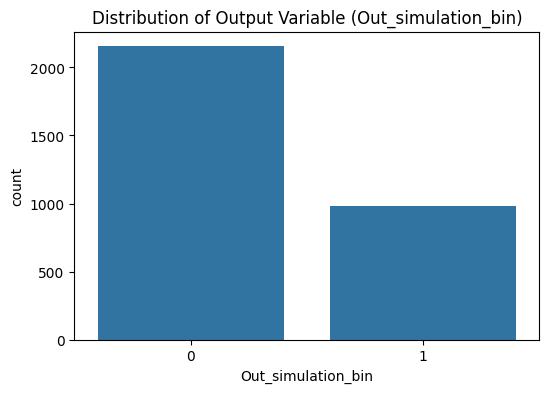


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    0
2955    0
2396    1
2555    0
2

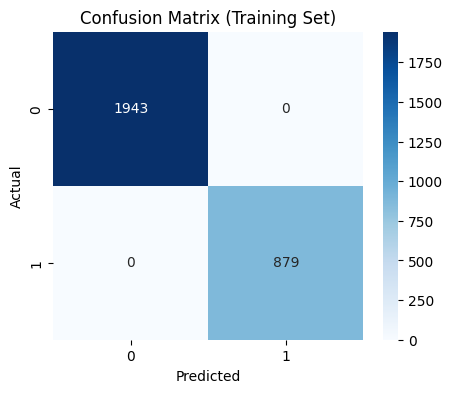

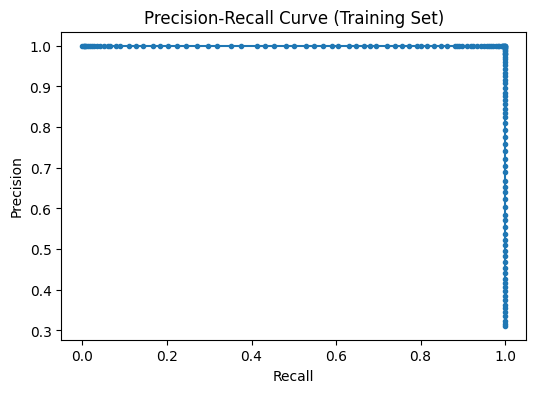


📊 Test Set Metrics:
Accuracy: 0.704
AUC-ROC: 0.720
AUC-PR: 0.574


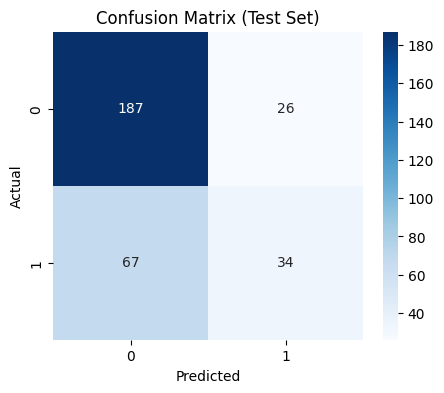

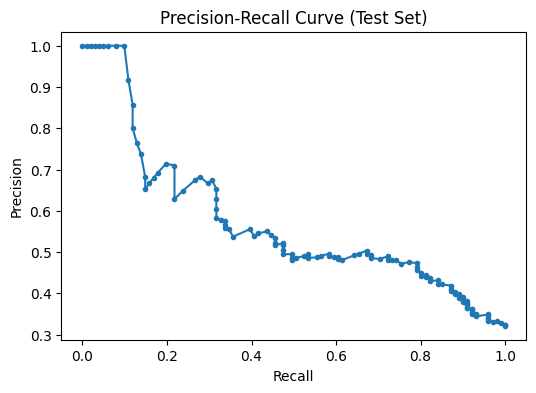

Metrics for Set1 at test size 0.10: {'accuracy': 0.7038216560509554, 'auc_pr': 0.5743093186833589, 'auc_roc': 0.7198902988890438}

Running Set1 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

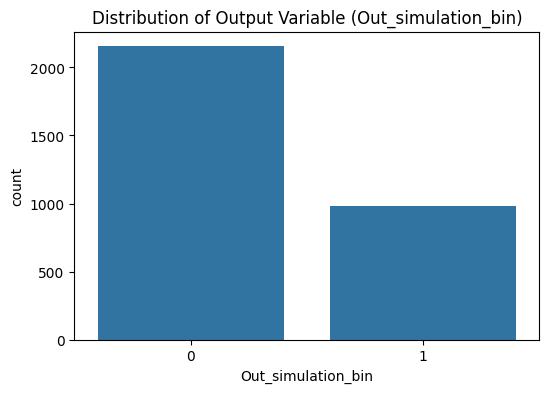


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      1
2619    0
22      0
1161    1
1

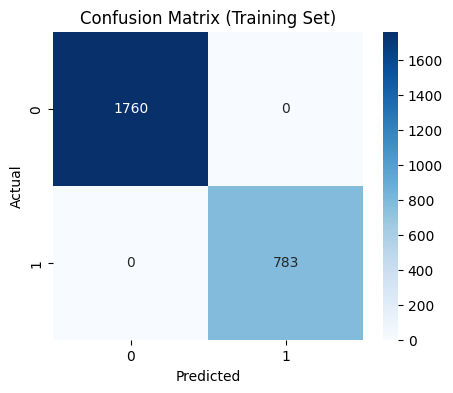

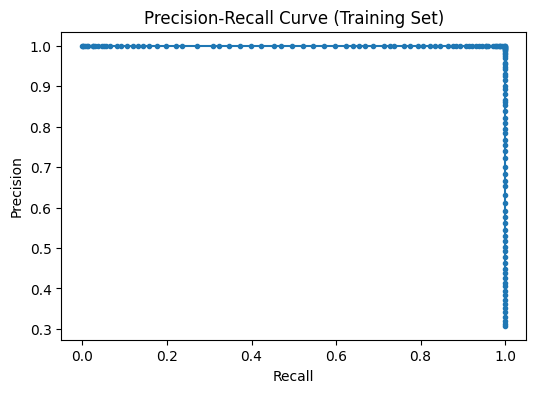


📊 Test Set Metrics:
Accuracy: 0.715
AUC-ROC: 0.728
AUC-PR: 0.588


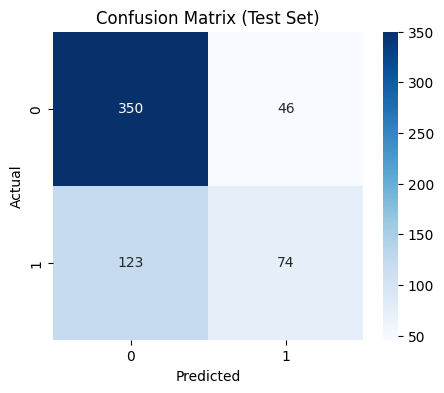

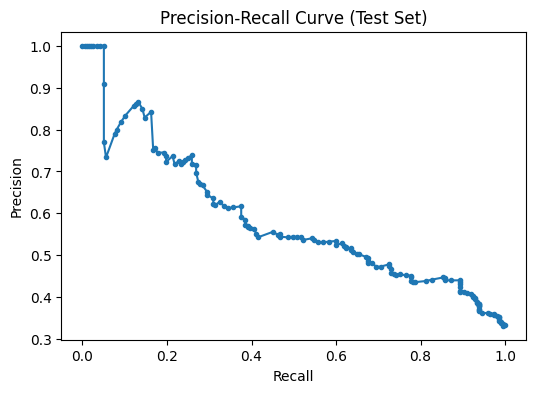

Metrics for Set1 at test size 0.19: {'accuracy': 0.715008431703204, 'auc_pr': 0.5877765003522866, 'auc_roc': 0.7278751986873814}

Running Set1 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

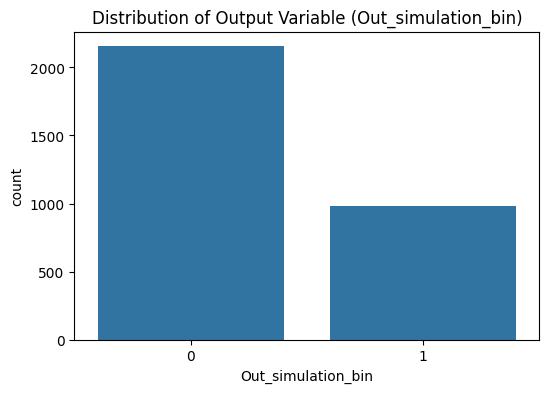


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    1
109     0
2057    1
781     0
2

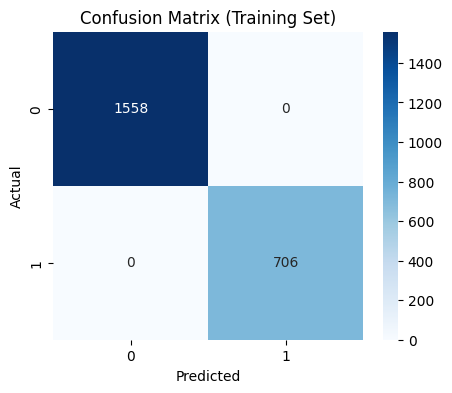

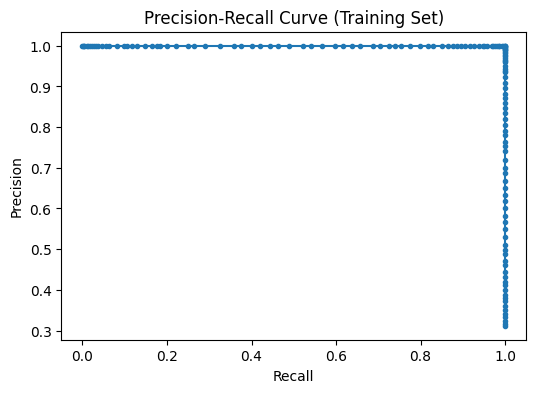


📊 Test Set Metrics:
Accuracy: 0.724
AUC-ROC: 0.737
AUC-PR: 0.547


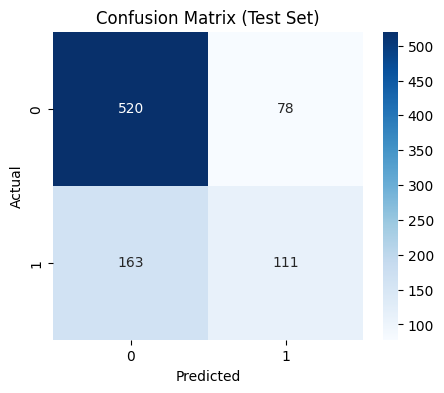

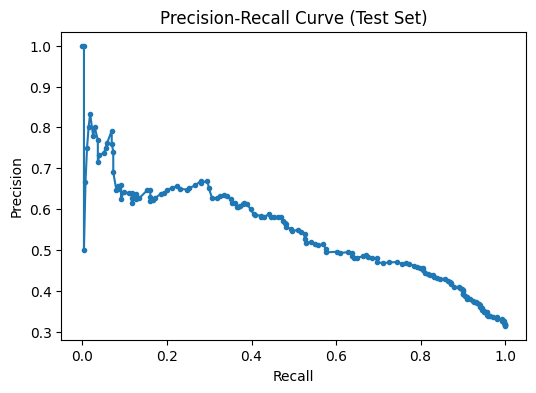

Metrics for Set1 at test size 0.28: {'accuracy': 0.7236238532110092, 'auc_pr': 0.5474529045009386, 'auc_roc': 0.7370584429851329}

Running Set1 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

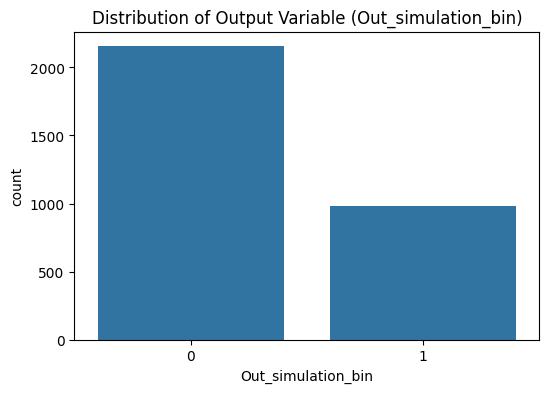


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    0
1811    0
1099    0


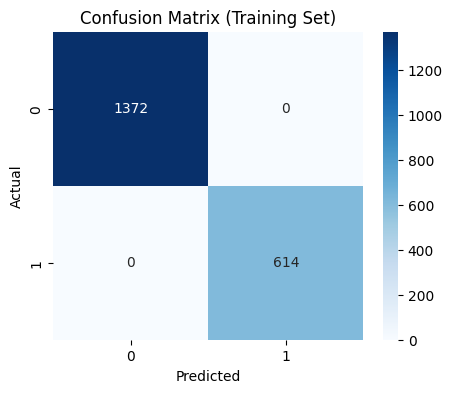

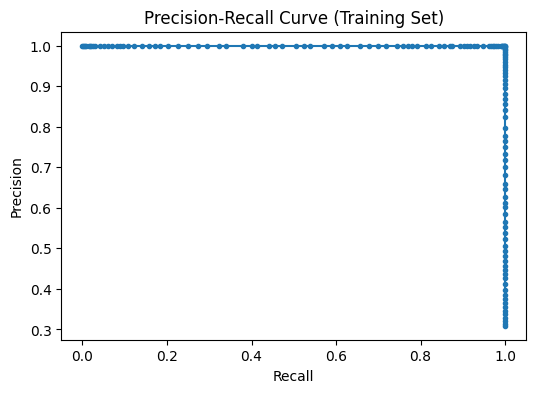


📊 Test Set Metrics:
Accuracy: 0.738
AUC-ROC: 0.748
AUC-PR: 0.561


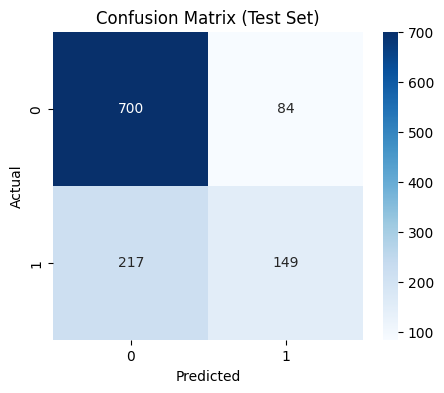

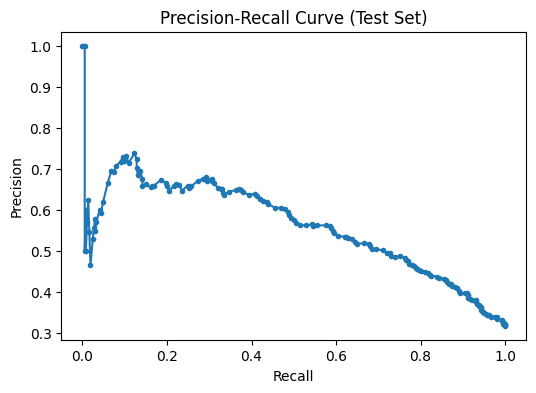

Metrics for Set1 at test size 0.37: {'accuracy': 0.7382608695652174, 'auc_pr': 0.561315588335474, 'auc_roc': 0.7483690197390432}

Running Set1 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

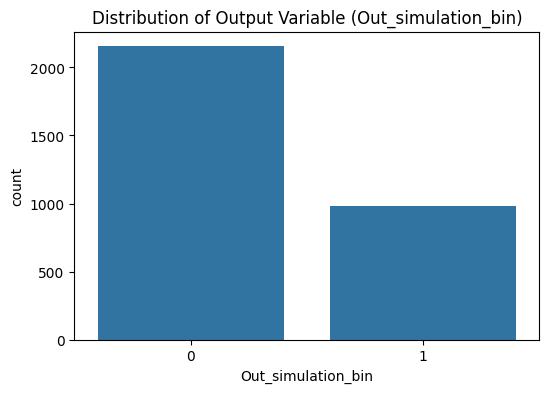


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    0
2867    0
2979    0
1259    0


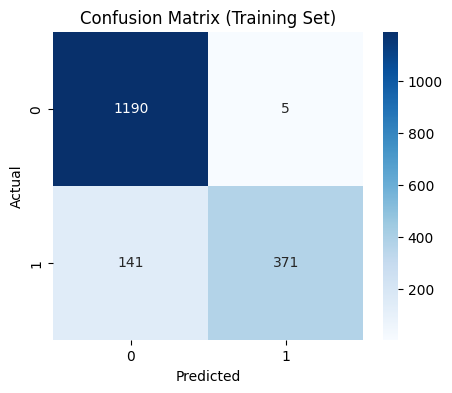

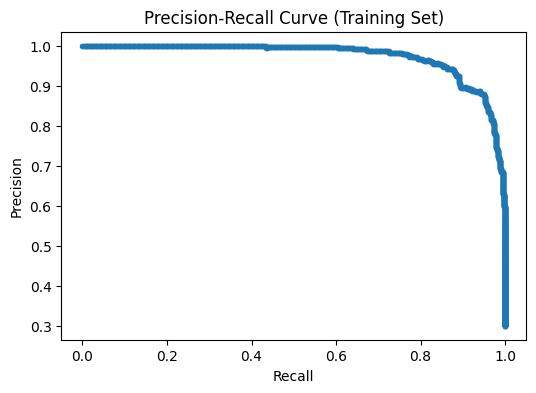


📊 Test Set Metrics:
Accuracy: 0.693
AUC-ROC: 0.696
AUC-PR: 0.510


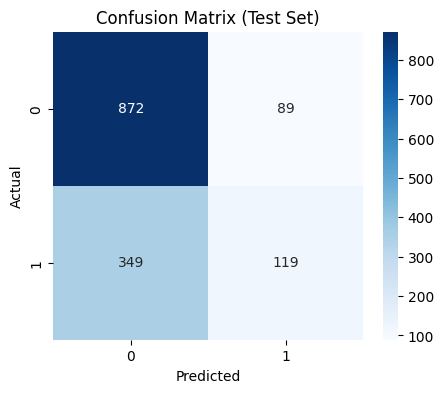

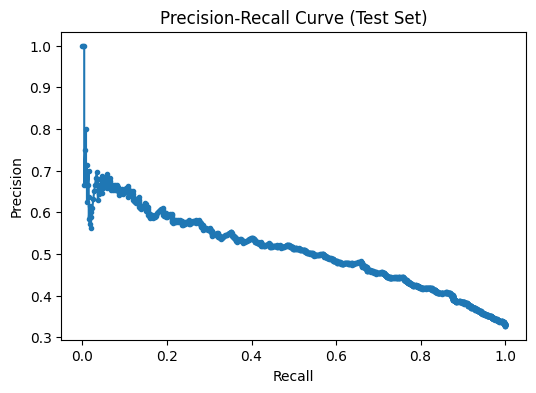

Metrics for Set1 at test size 0.46: {'accuracy': 0.6934919524142757, 'auc_pr': 0.509794012724009, 'auc_roc': 0.696482252283501}

Running Set1 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1        

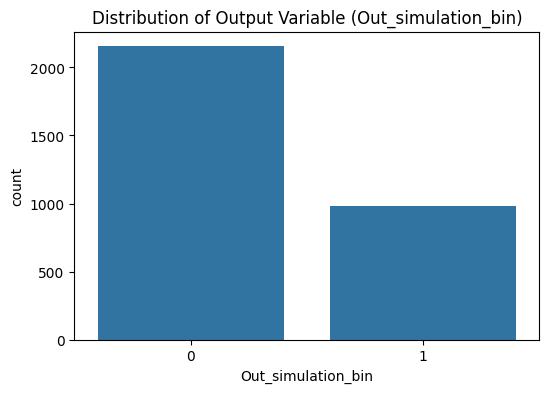


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     1
948     0
704     0
431     1


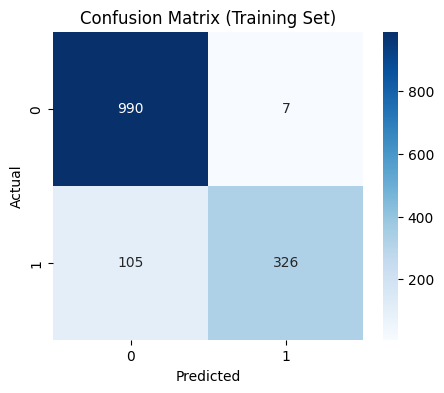

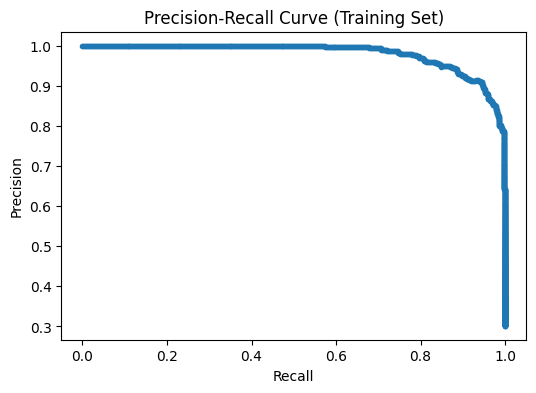


📊 Test Set Metrics:
Accuracy: 0.690
AUC-ROC: 0.689
AUC-PR: 0.494


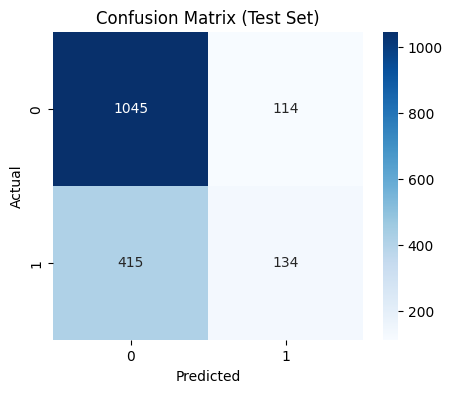

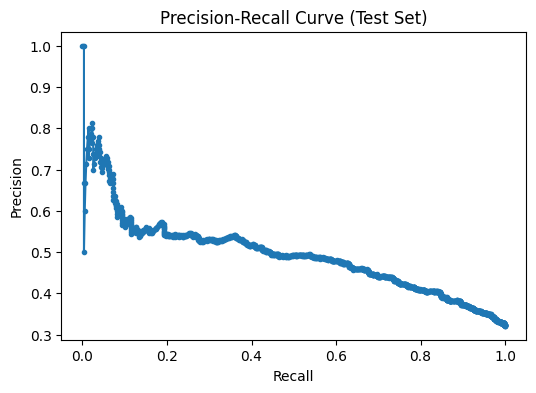

Metrics for Set1 at test size 0.54: {'accuracy': 0.6902810304449649, 'auc_pr': 0.49414560972013144, 'auc_roc': 0.6893921177574411}

Running Set1 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

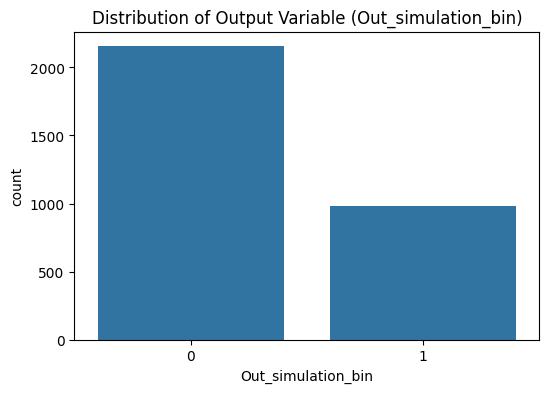


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    0
2310    0
592     1


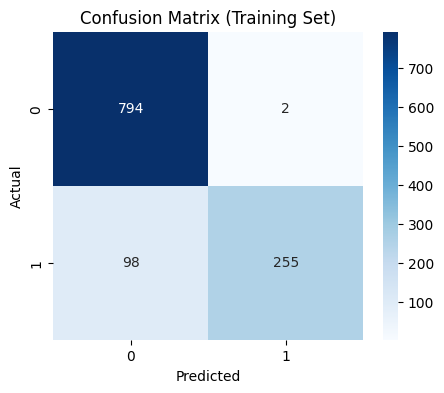

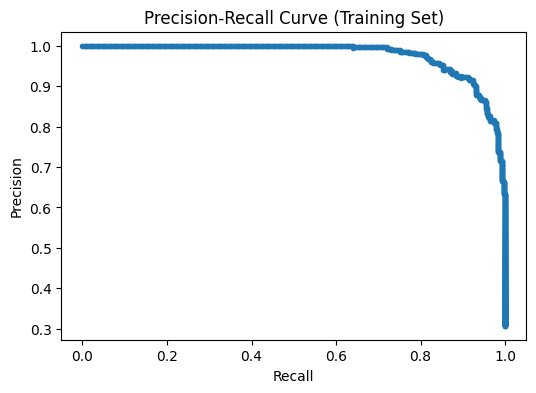


📊 Test Set Metrics:
Accuracy: 0.699
AUC-ROC: 0.672
AUC-PR: 0.477


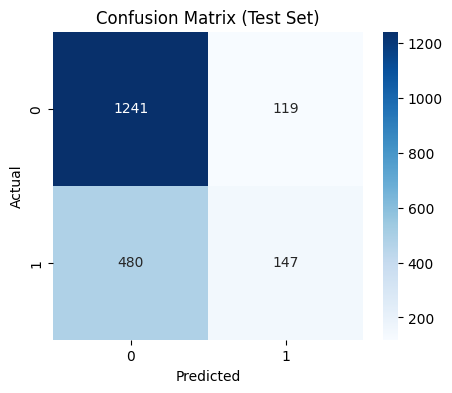

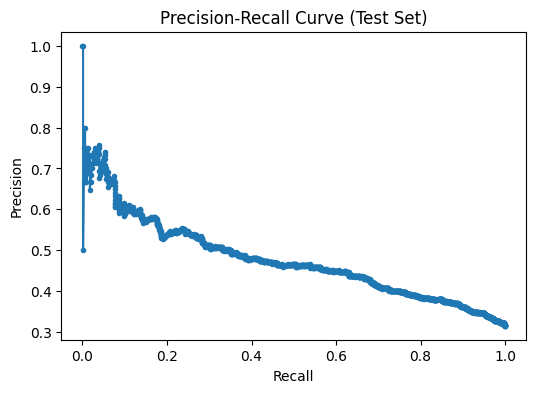

Metrics for Set1 at test size 0.63: {'accuracy': 0.6985405133366884, 'auc_pr': 0.4770695619456829, 'auc_roc': 0.6722253494699315}

Running Set1 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

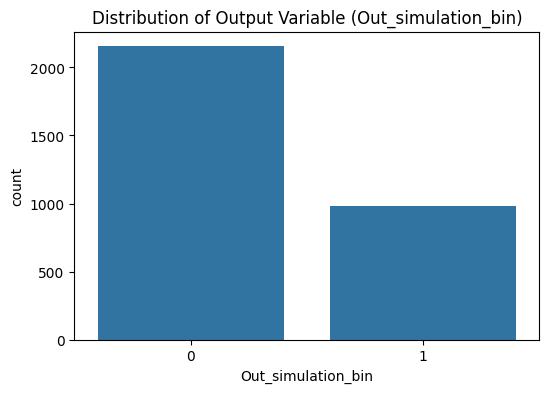


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    1
3       0
74      1
1755    0
4

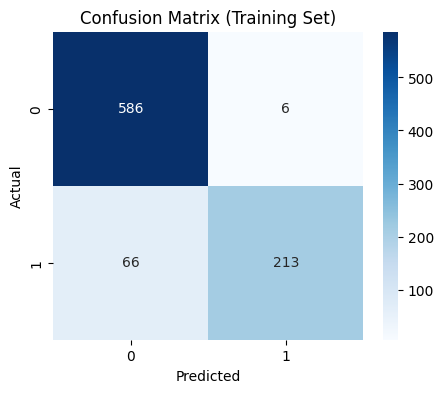

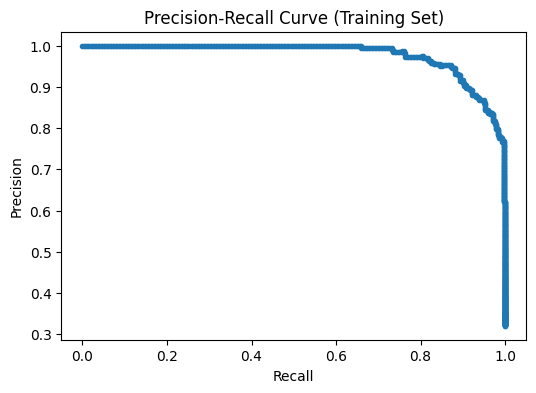


📊 Test Set Metrics:
Accuracy: 0.689
AUC-ROC: 0.657
AUC-PR: 0.457


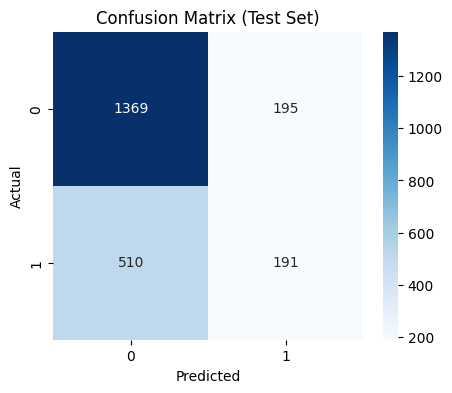

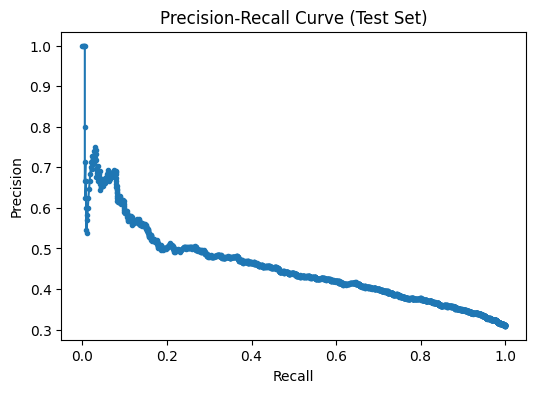

Metrics for Set1 at test size 0.72: {'accuracy': 0.6887417218543046, 'auc_pr': 0.45657675376504275, 'auc_roc': 0.6572689362292086}

Running Set1 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

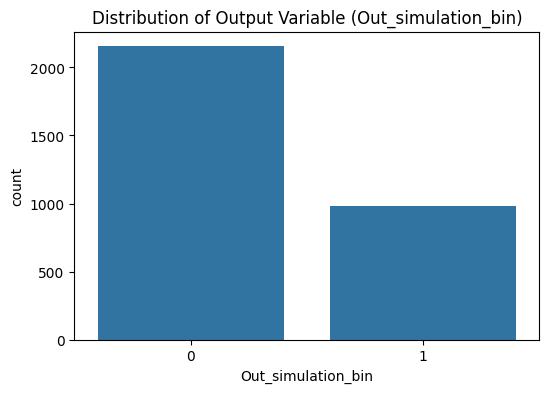


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    1
1324    1
216     0
510     0
1

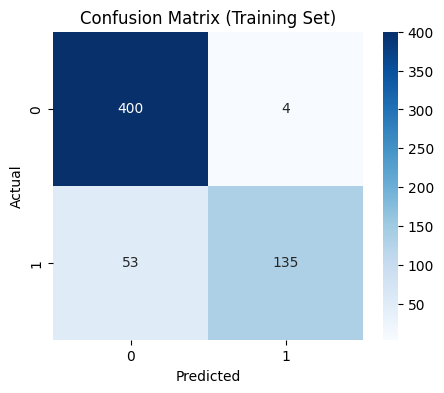

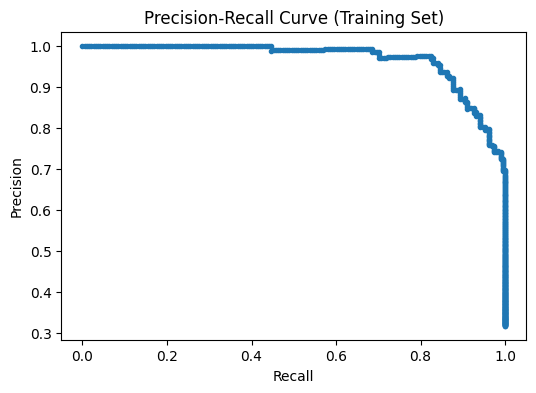


📊 Test Set Metrics:
Accuracy: 0.678
AUC-ROC: 0.619
AUC-PR: 0.411


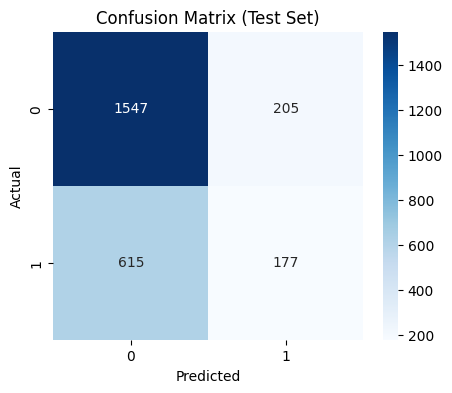

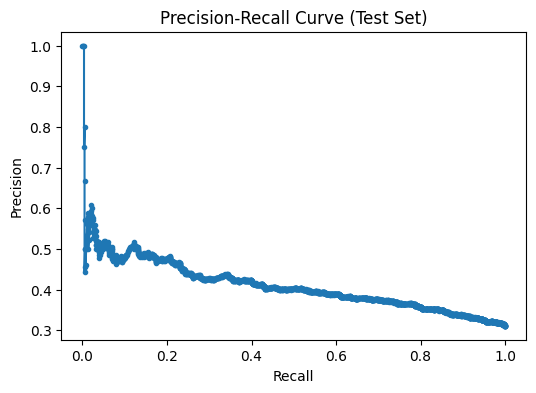

Metrics for Set1 at test size 0.81: {'accuracy': 0.6776729559748428, 'auc_pr': 0.41067480683910584, 'auc_roc': 0.6188245180111619}

Running Set1 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

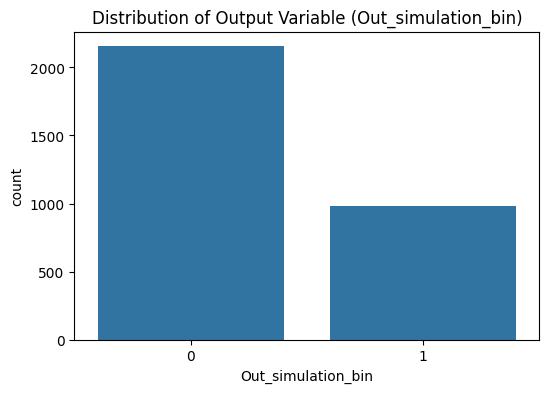


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set1 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     0
2907    0
1218    0
1

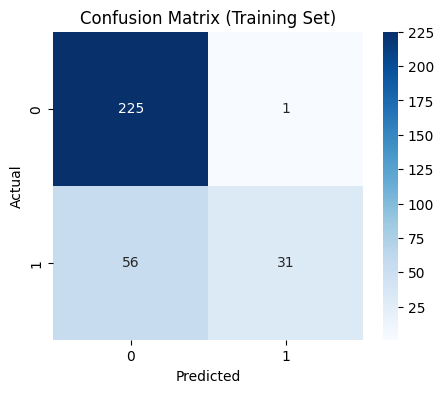

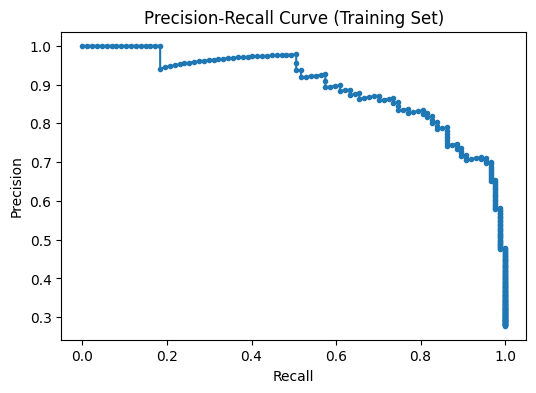


📊 Test Set Metrics:
Accuracy: 0.665
AUC-ROC: 0.572
AUC-PR: 0.366


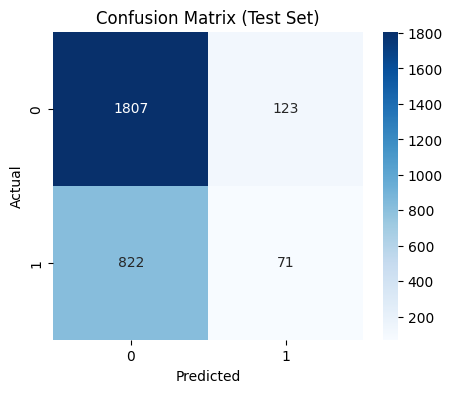

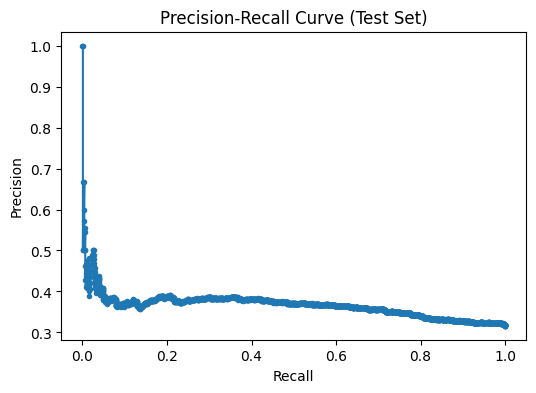

Metrics for Set1 at test size 0.90: {'accuracy': 0.665249734325186, 'auc_pr': 0.3664742833131206, 'auc_roc': 0.5724170143139792}

Running Set2 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

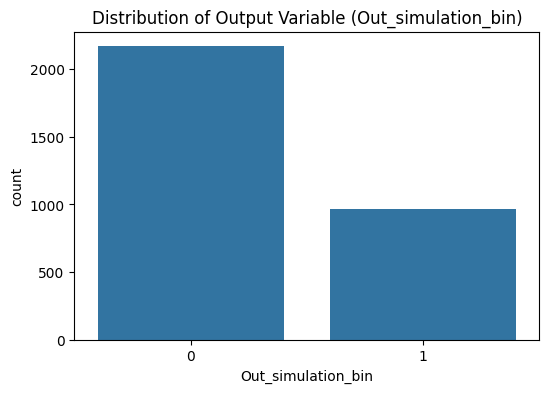


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    1
2955    0
2396    1
2555    1
2

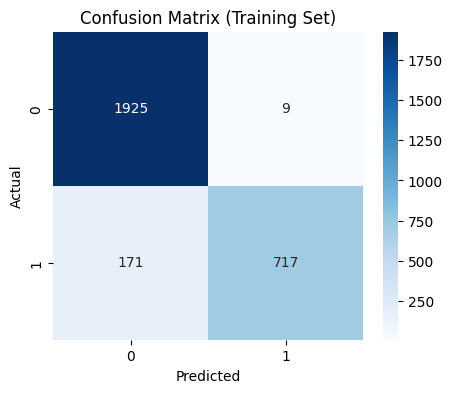

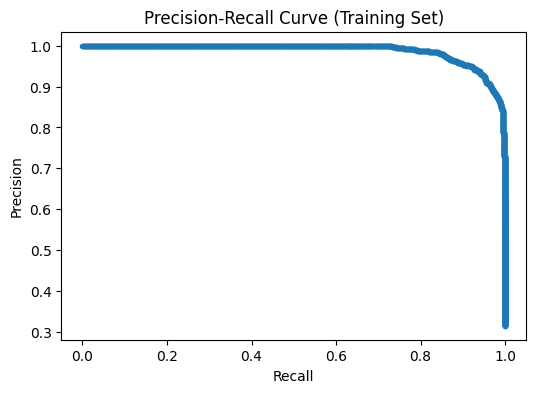


📊 Test Set Metrics:
Accuracy: 0.771
AUC-ROC: 0.800
AUC-PR: 0.604


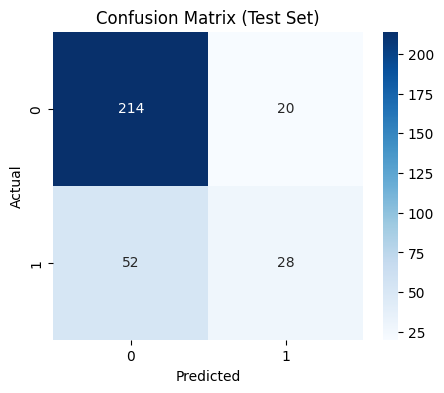

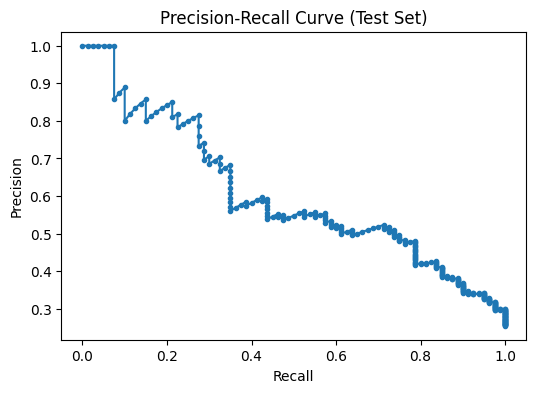

Metrics for Set2 at test size 0.10: {'accuracy': 0.7707006369426752, 'auc_pr': 0.603701799059064, 'auc_roc': 0.8004273504273505}

Running Set2 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

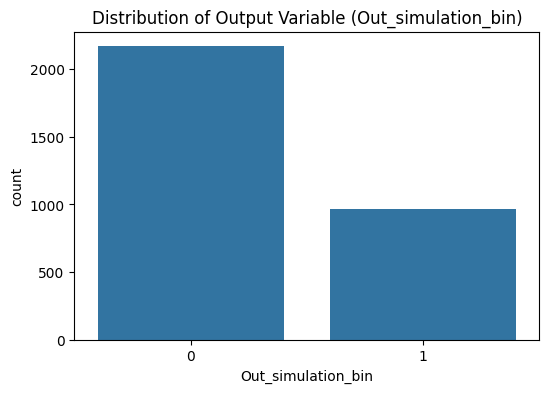


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    0
22      0
1161    0
1

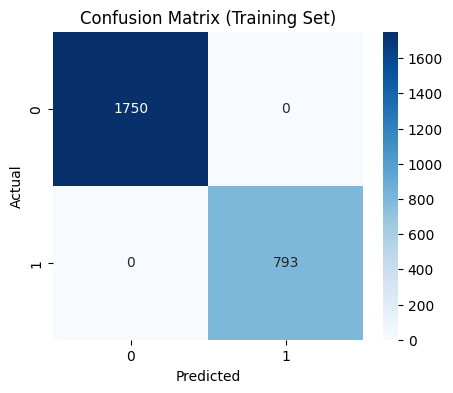

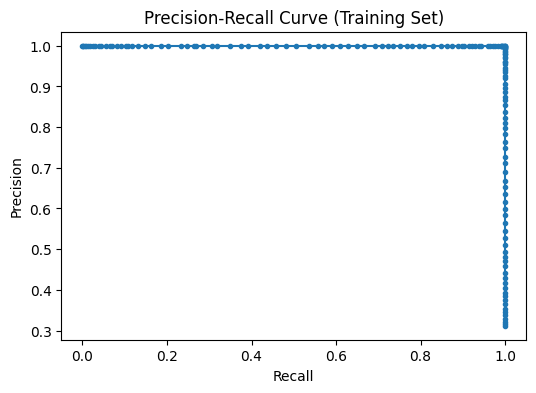


📊 Test Set Metrics:
Accuracy: 0.728
AUC-ROC: 0.751
AUC-PR: 0.574


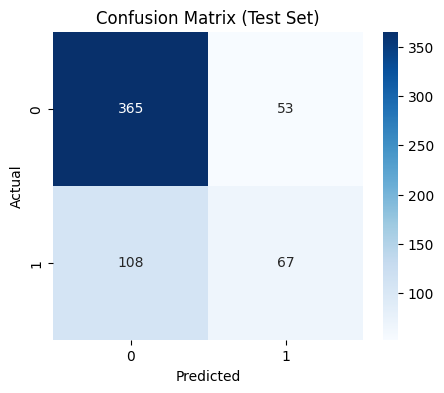

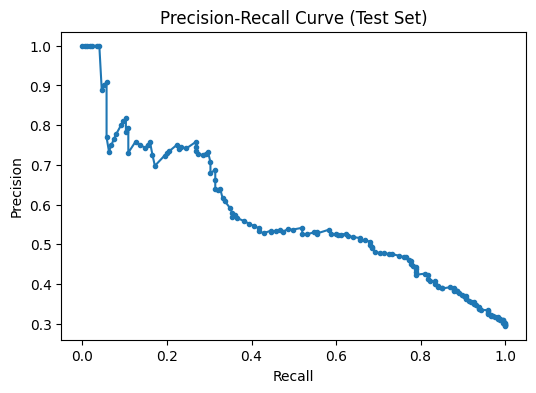

Metrics for Set2 at test size 0.19: {'accuracy': 0.7284991568296796, 'auc_pr': 0.5743841129034419, 'auc_roc': 0.7506288448393712}

Running Set2 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

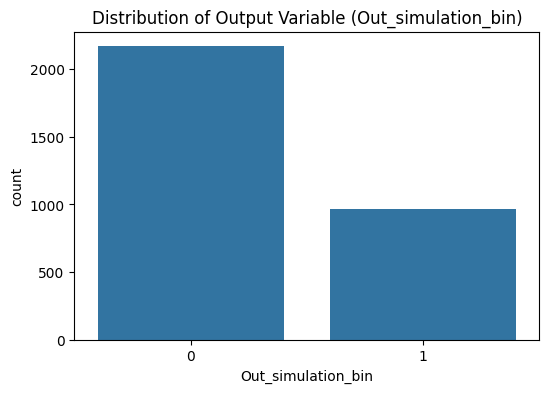


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     0
2057    0
781     0
2

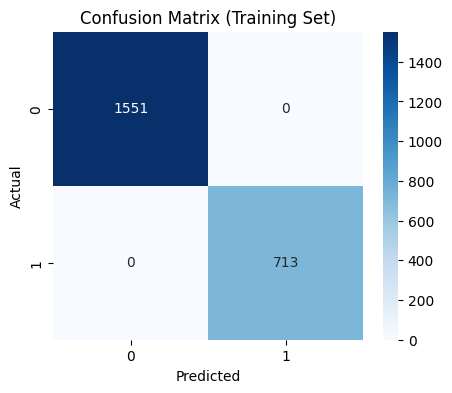

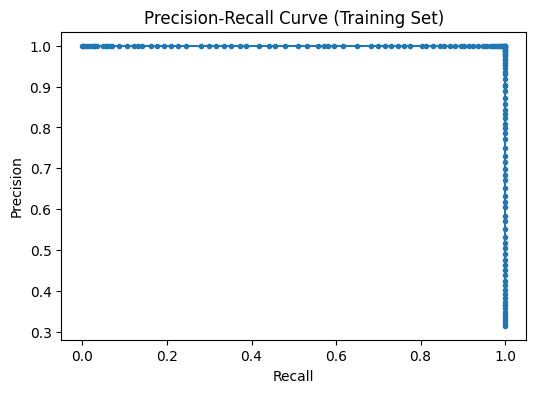


📊 Test Set Metrics:
Accuracy: 0.743
AUC-ROC: 0.741
AUC-PR: 0.562


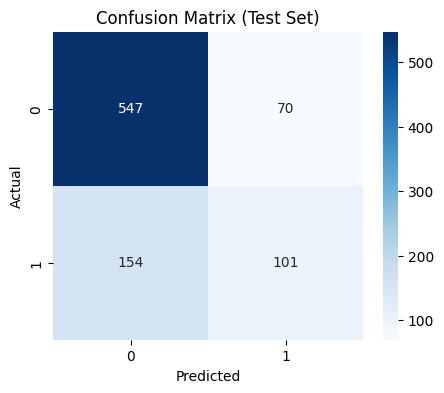

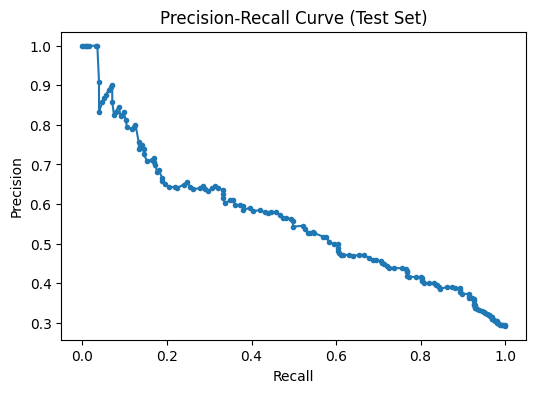

Metrics for Set2 at test size 0.28: {'accuracy': 0.7431192660550459, 'auc_pr': 0.5618582687850426, 'auc_roc': 0.7411224457368036}

Running Set2 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

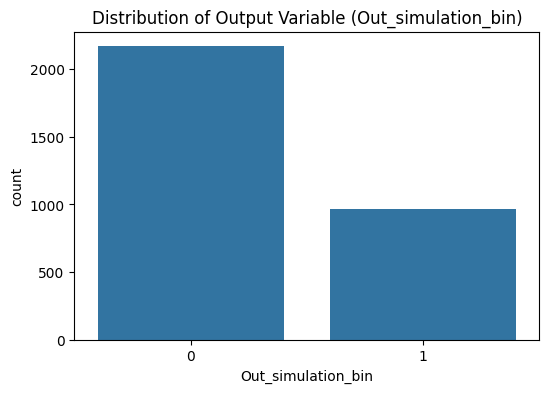


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    0
1811    0
1099    0


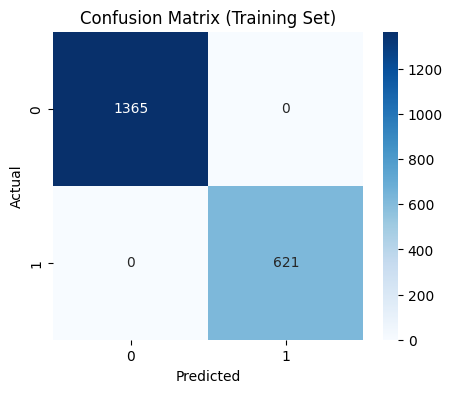

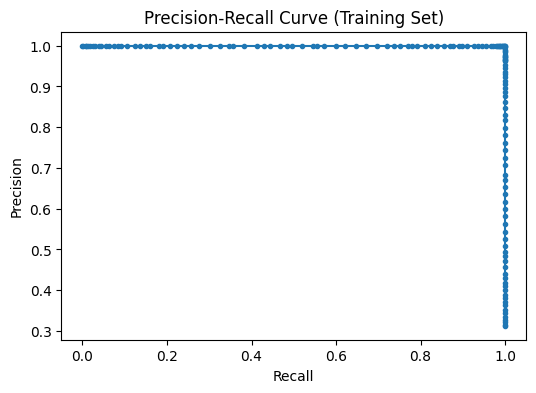


📊 Test Set Metrics:
Accuracy: 0.735
AUC-ROC: 0.731
AUC-PR: 0.567


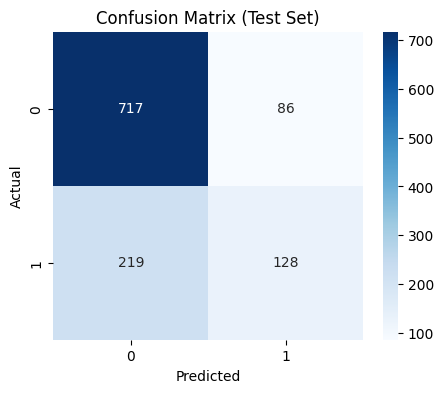

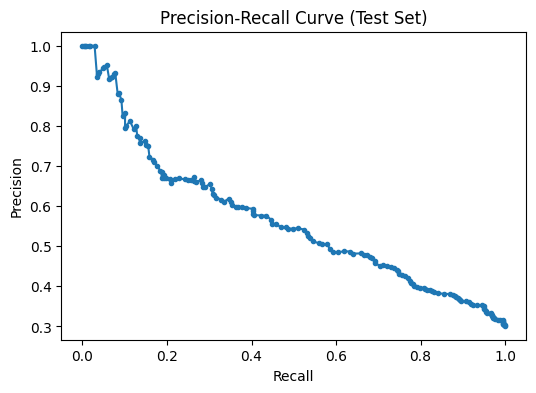

Metrics for Set2 at test size 0.37: {'accuracy': 0.7347826086956522, 'auc_pr': 0.5667909128373396, 'auc_roc': 0.7308131251323388}

Running Set2 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

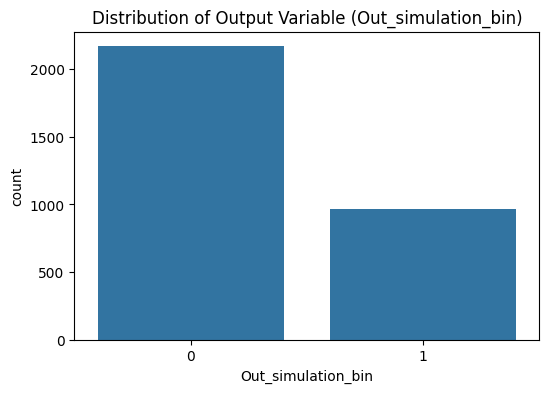


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    0
2867    0
2979    0
1259    1


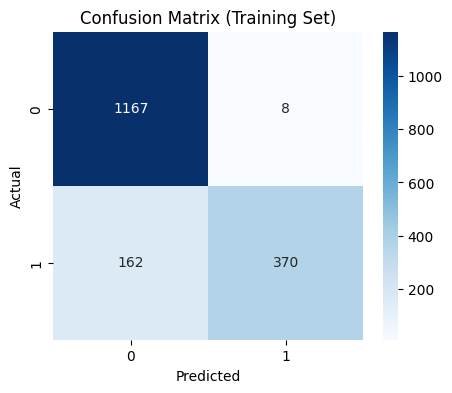

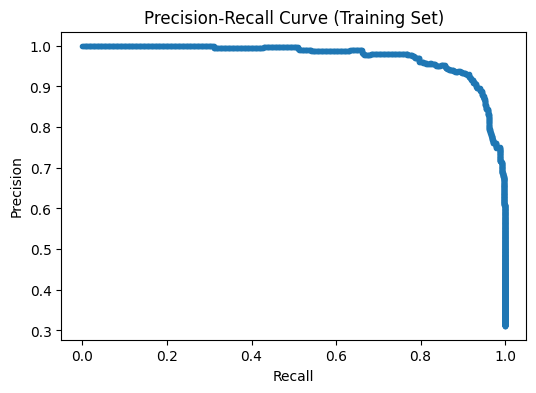


📊 Test Set Metrics:
Accuracy: 0.722
AUC-ROC: 0.702
AUC-PR: 0.521


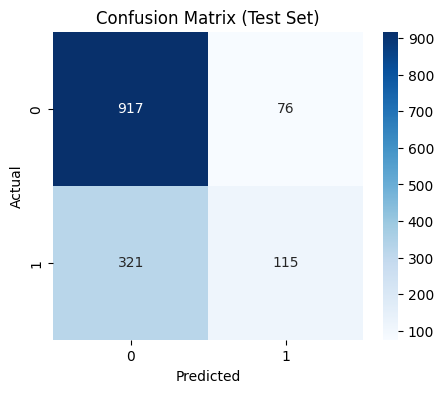

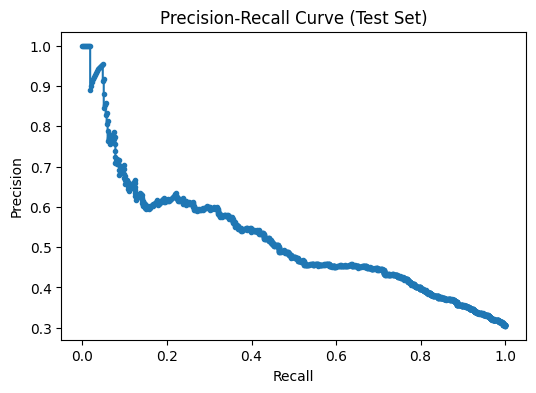

Metrics for Set2 at test size 0.46: {'accuracy': 0.722183344996501, 'auc_pr': 0.5205460959936614, 'auc_roc': 0.7024931400537708}

Running Set2 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

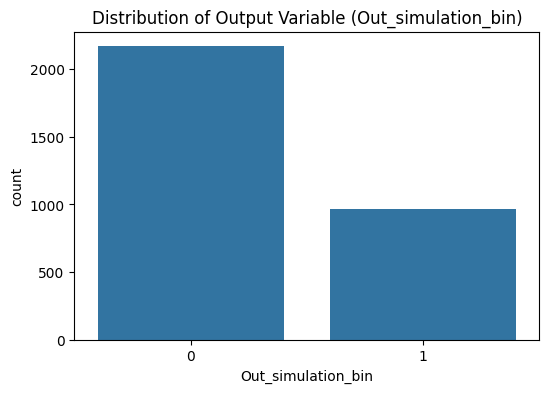


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     1
948     0
704     0
431     0


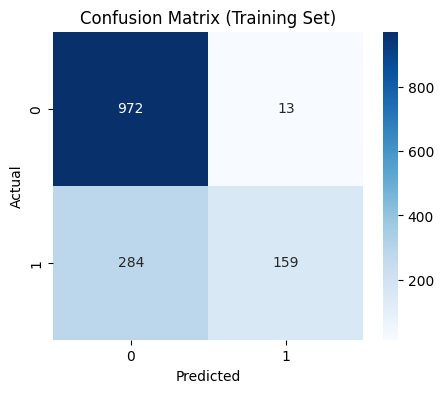

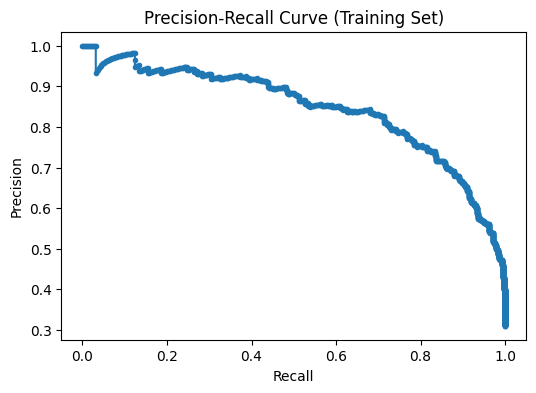


📊 Test Set Metrics:
Accuracy: 0.705
AUC-ROC: 0.664
AUC-PR: 0.471


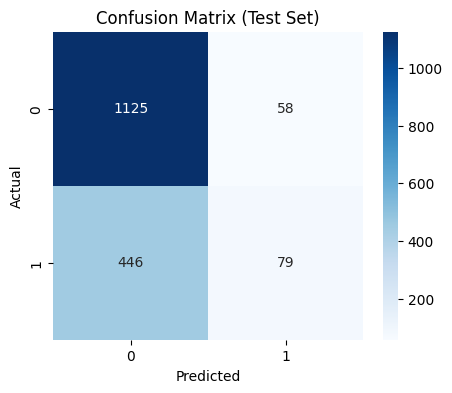

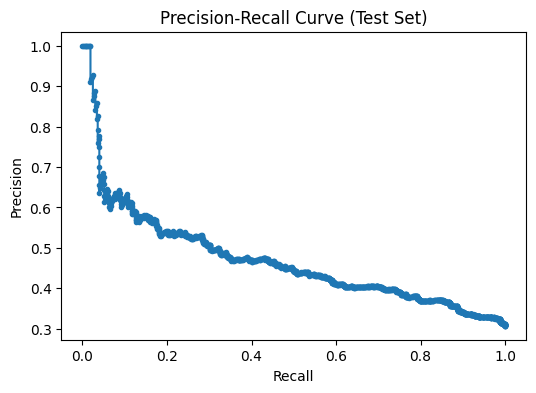

Metrics for Set2 at test size 0.54: {'accuracy': 0.7049180327868853, 'auc_pr': 0.4706962588205564, 'auc_roc': 0.6638071086422734}

Running Set2 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

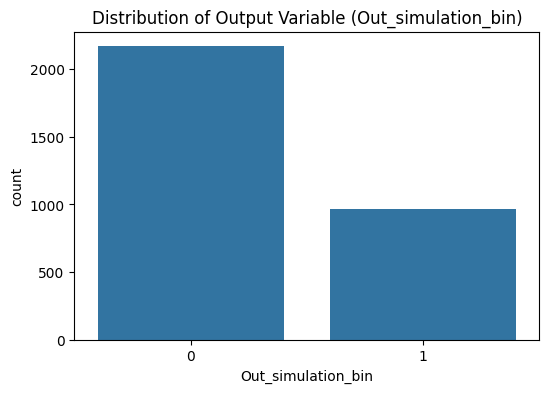


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    1
2310    1
592     0


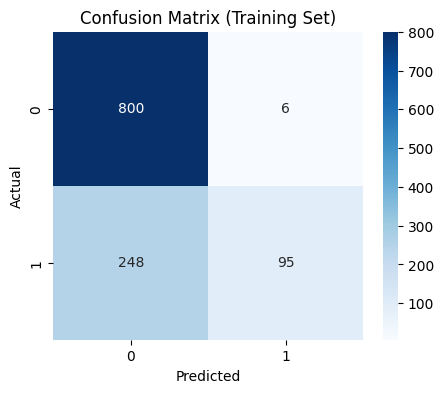

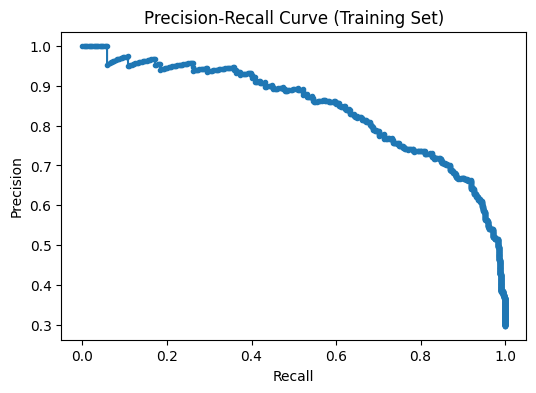


📊 Test Set Metrics:
Accuracy: 0.695
AUC-ROC: 0.668
AUC-PR: 0.478


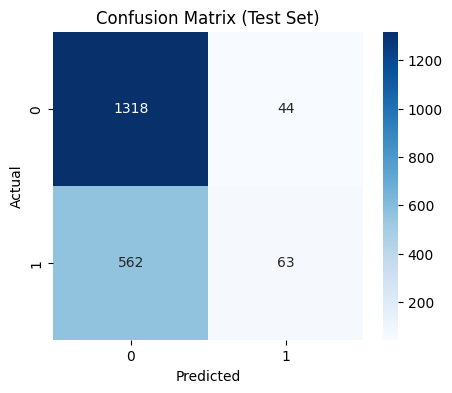

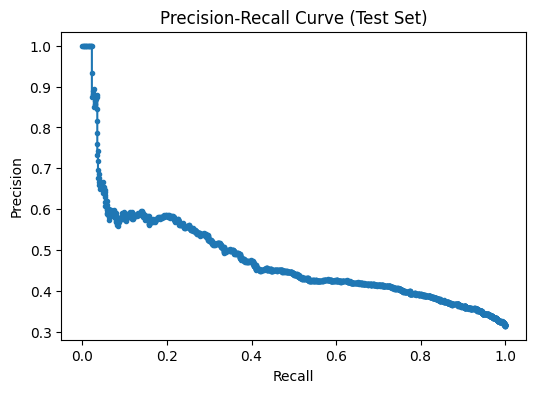

Metrics for Set2 at test size 0.63: {'accuracy': 0.6950176144942124, 'auc_pr': 0.4784889847972762, 'auc_roc': 0.6683641703377385}

Running Set2 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

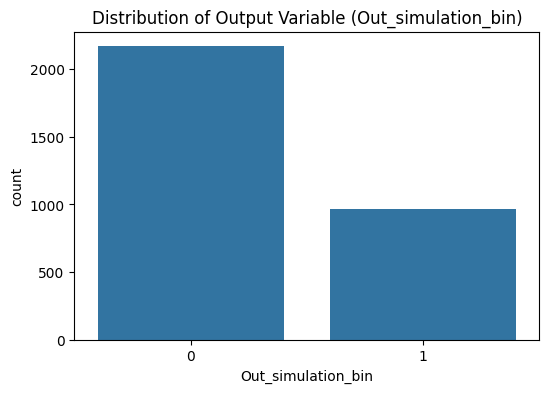


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    0
3       0
74      0
1755    0
4

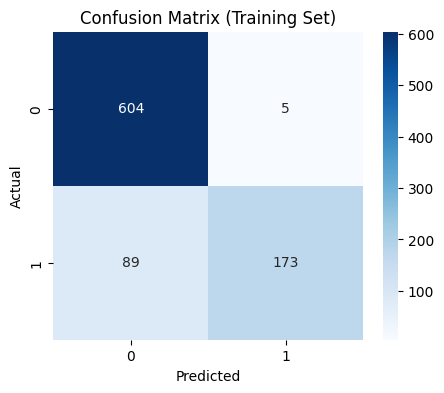

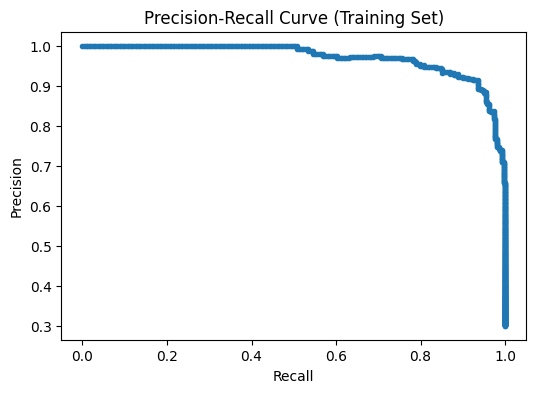


📊 Test Set Metrics:
Accuracy: 0.702
AUC-ROC: 0.661
AUC-PR: 0.470


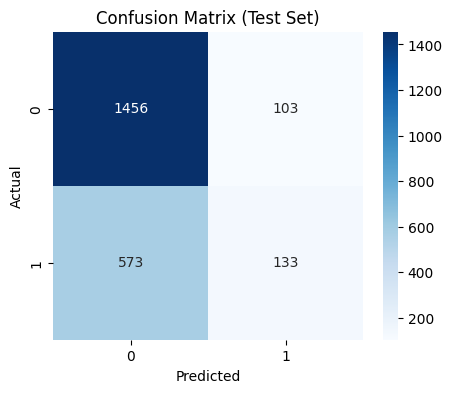

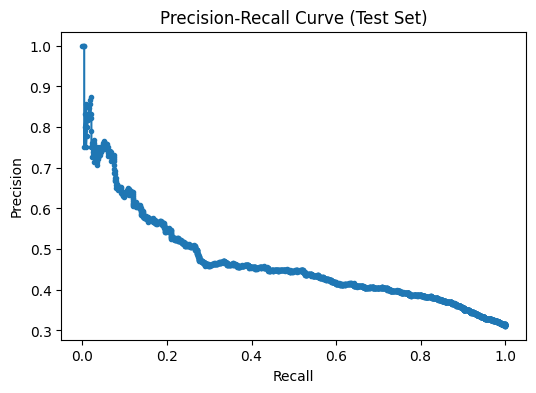

Metrics for Set2 at test size 0.72: {'accuracy': 0.7015452538631347, 'auc_pr': 0.46959589569383214, 'auc_roc': 0.6614335658617513}

Running Set2 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

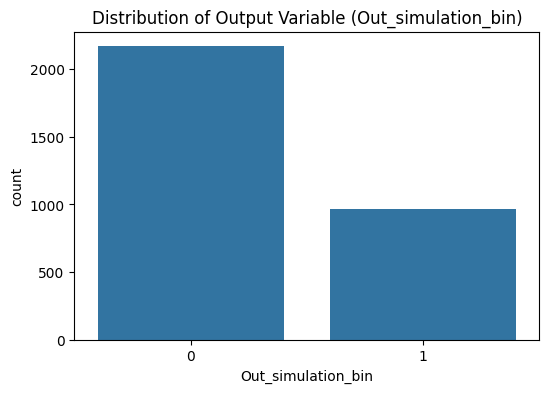


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    1
1324    1
216     0
510     0
1

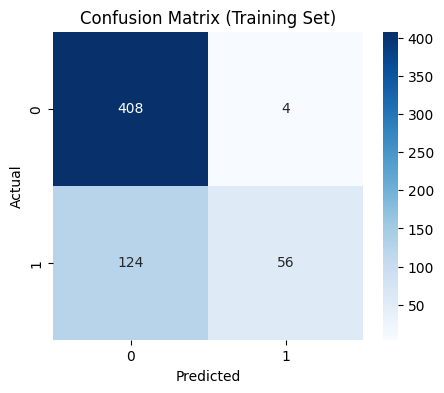

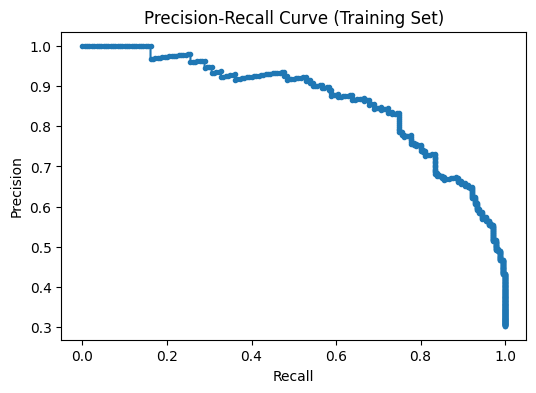


📊 Test Set Metrics:
Accuracy: 0.694
AUC-ROC: 0.606
AUC-PR: 0.400


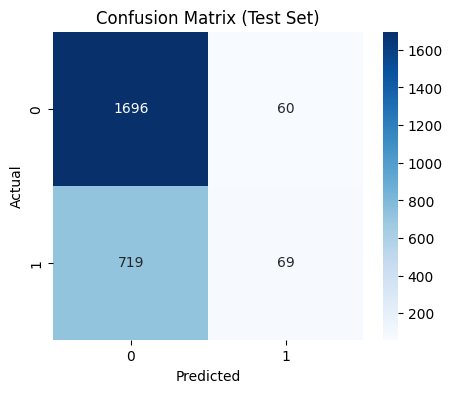

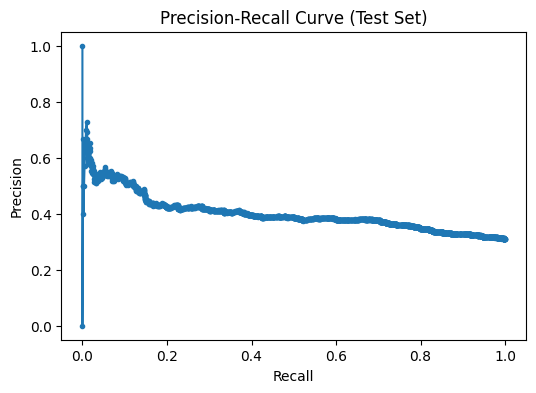

Metrics for Set2 at test size 0.81: {'accuracy': 0.6937893081761006, 'auc_pr': 0.40038145935367064, 'auc_roc': 0.6058163165015089}

Running Set2 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

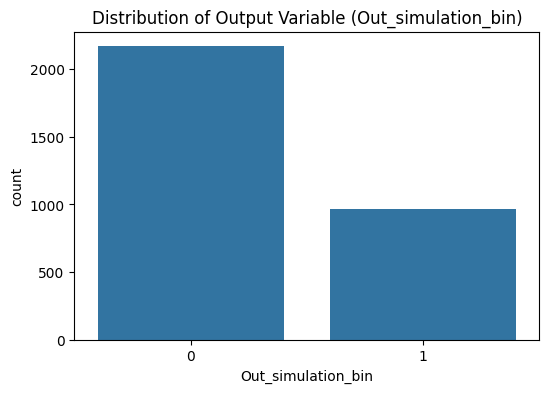


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set2 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     0
2907    0
1218    1
1

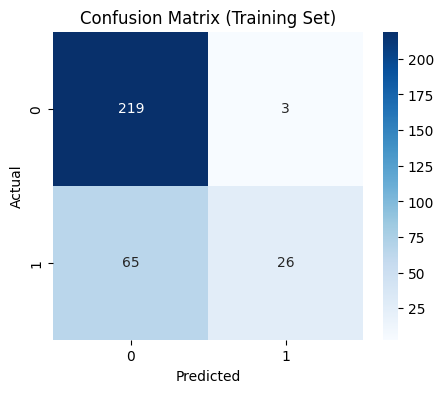

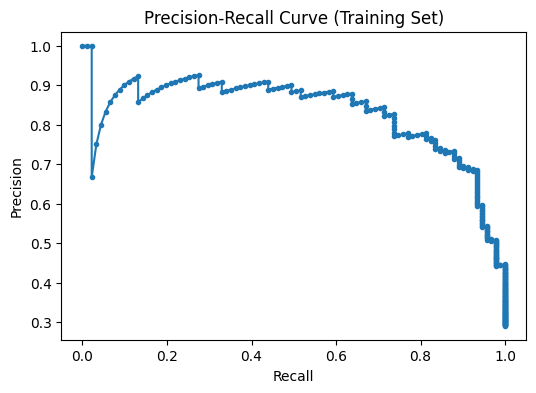


📊 Test Set Metrics:
Accuracy: 0.687
AUC-ROC: 0.563
AUC-PR: 0.369


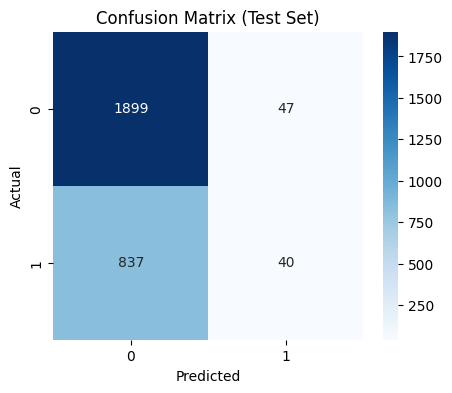

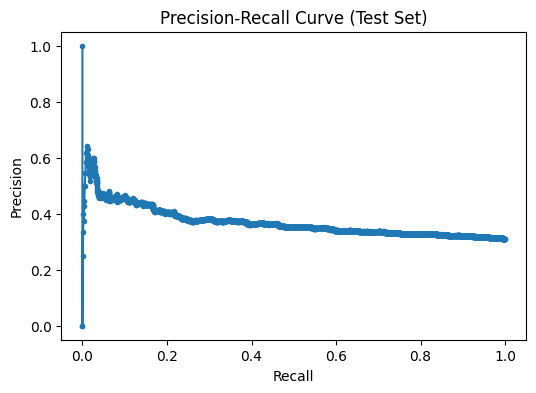

Metrics for Set2 at test size 0.90: {'accuracy': 0.6868579525327666, 'auc_pr': 0.3690769420441983, 'auc_roc': 0.5627401646039416}

Running Set3 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

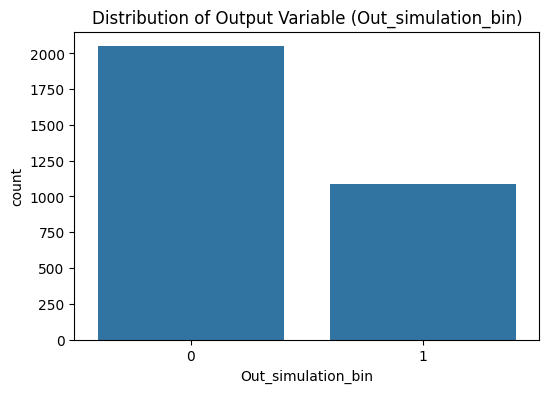


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    0
2955    1
2396    0
2555    0
2

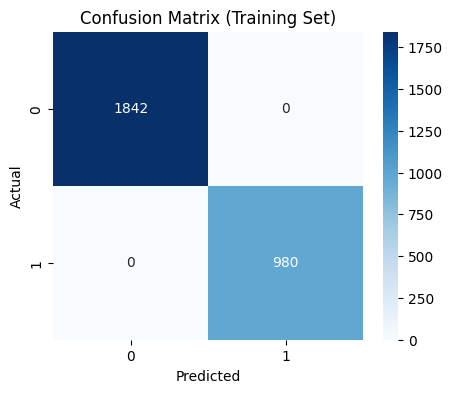

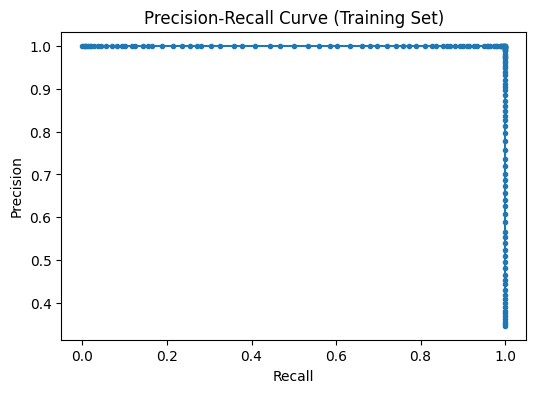


📊 Test Set Metrics:
Accuracy: 0.783
AUC-ROC: 0.822
AUC-PR: 0.740


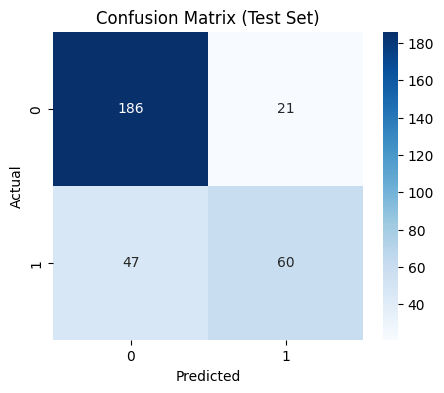

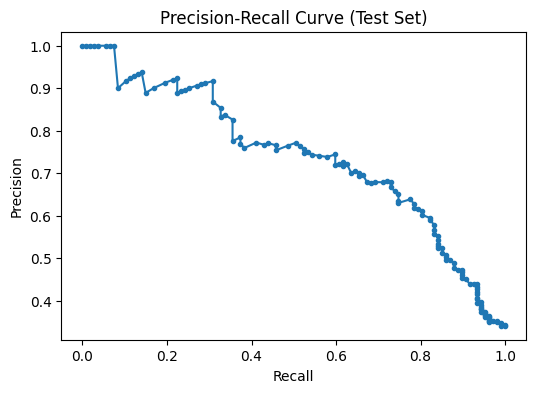

Metrics for Set3 at test size 0.10: {'accuracy': 0.7834394904458599, 'auc_pr': 0.73994413793572, 'auc_roc': 0.8224524809246467}

Running Set3 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1        

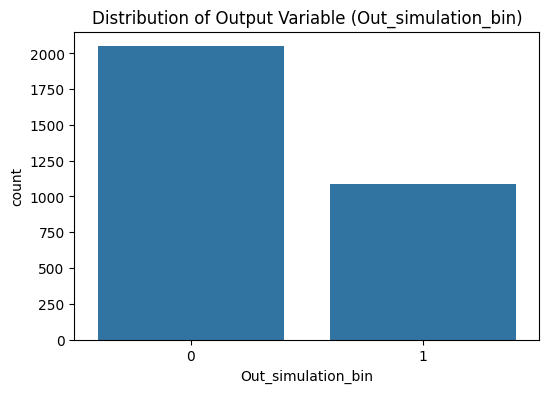


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    0
22      1
1161    0
1

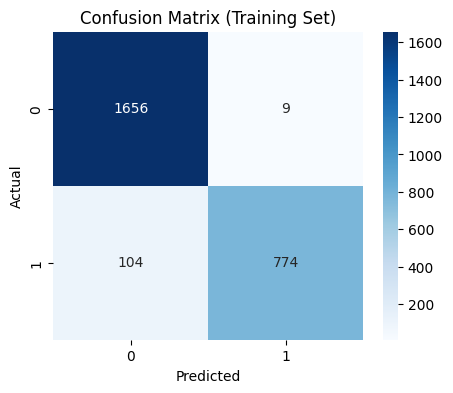

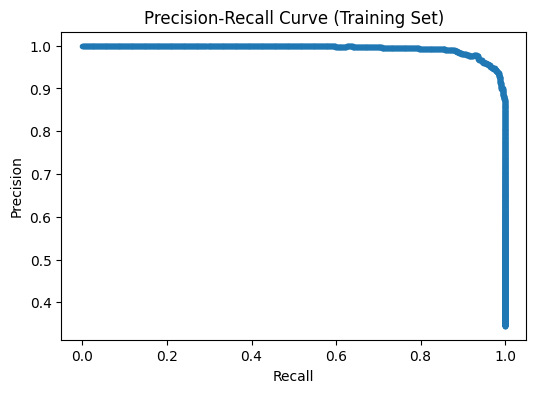


📊 Test Set Metrics:
Accuracy: 0.766
AUC-ROC: 0.835
AUC-PR: 0.744


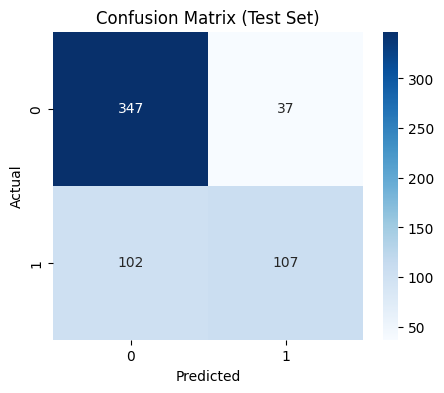

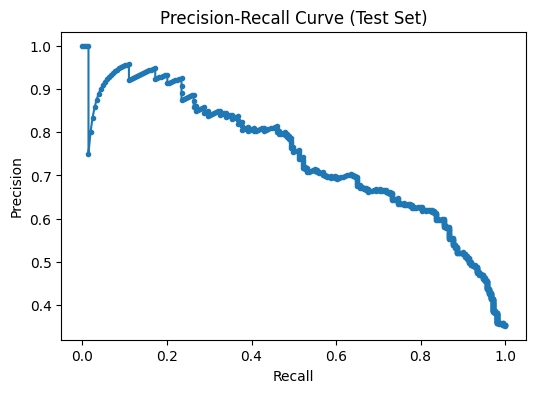

Metrics for Set3 at test size 0.19: {'accuracy': 0.7655986509274874, 'auc_pr': 0.7436269302064586, 'auc_roc': 0.835040370813397}

Running Set3 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

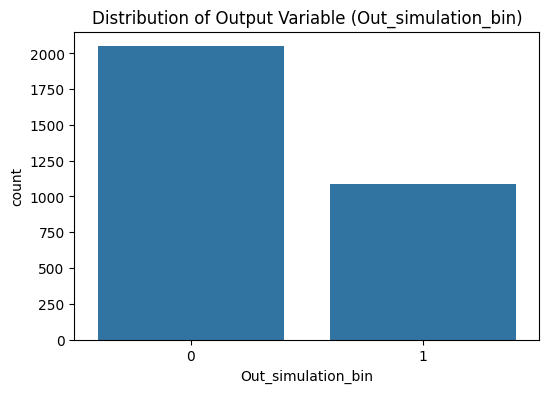


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     1
2057    0
781     1
2

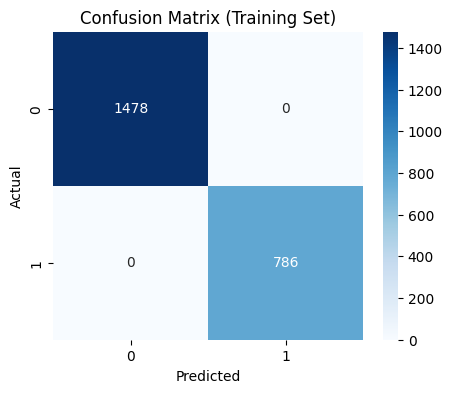

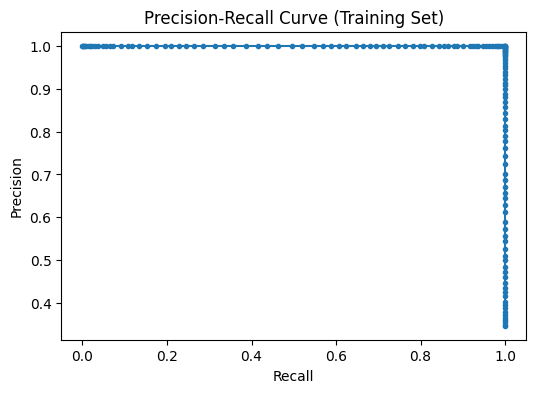


📊 Test Set Metrics:
Accuracy: 0.755
AUC-ROC: 0.810
AUC-PR: 0.692


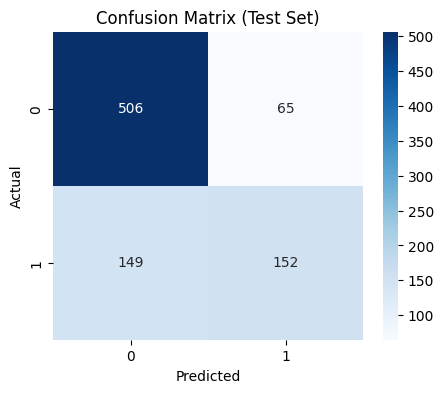

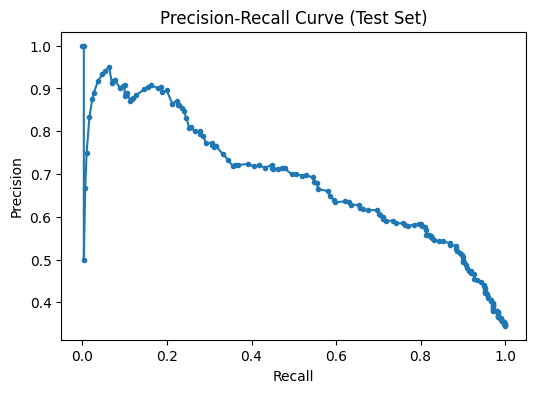

Metrics for Set3 at test size 0.28: {'accuracy': 0.7545871559633027, 'auc_pr': 0.6920470381257952, 'auc_roc': 0.8103286767401132}

Running Set3 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

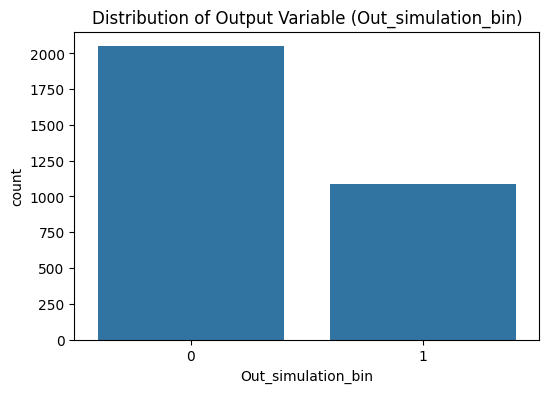


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     1
1953    0
1811    1
1099    0


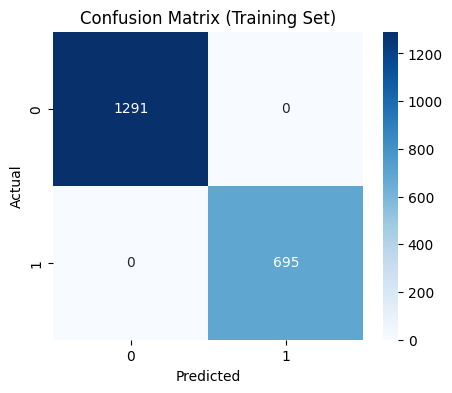

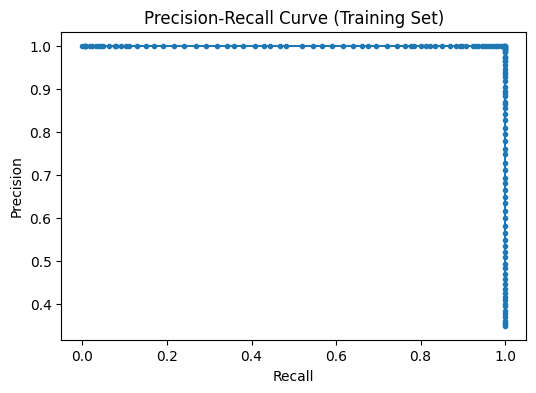


📊 Test Set Metrics:
Accuracy: 0.752
AUC-ROC: 0.792
AUC-PR: 0.654


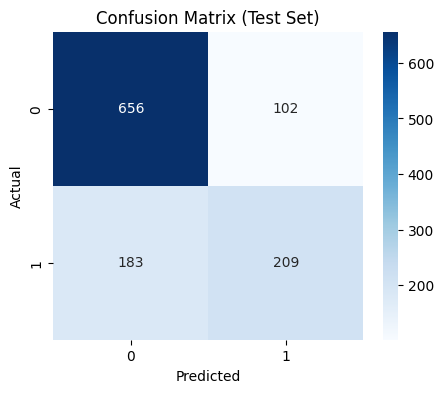

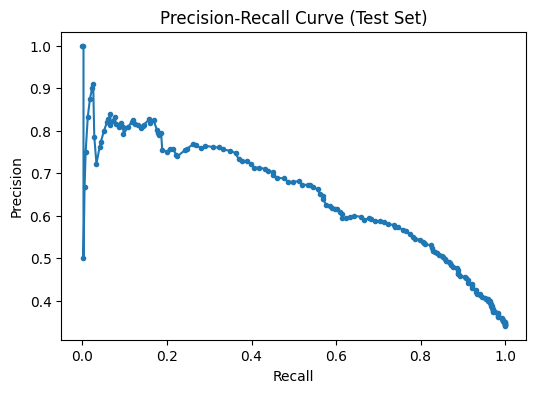

Metrics for Set3 at test size 0.37: {'accuracy': 0.7521739130434782, 'auc_pr': 0.654054094506874, 'auc_roc': 0.7921591459802919}

Running Set3 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

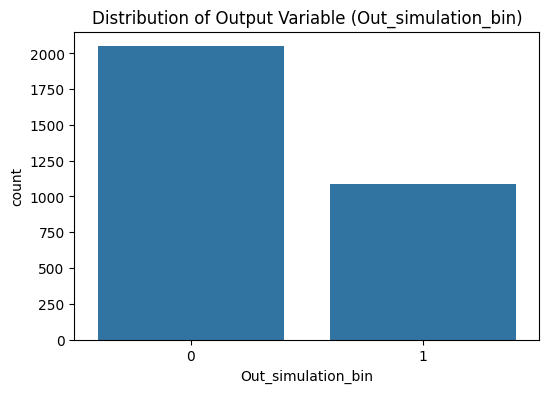


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    1
2867    0
2979    0
1259    0


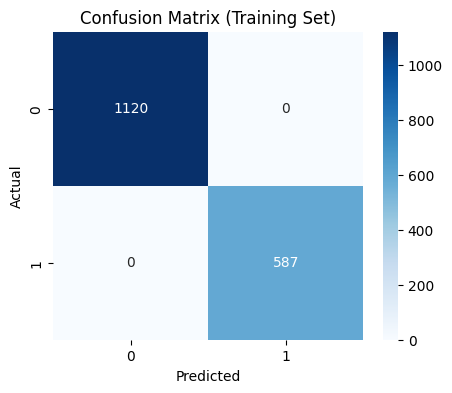

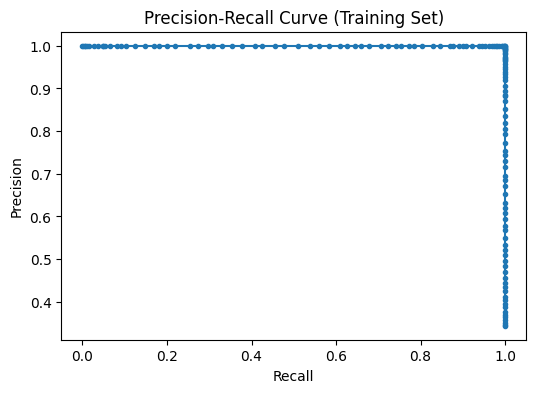


📊 Test Set Metrics:
Accuracy: 0.733
AUC-ROC: 0.777
AUC-PR: 0.643


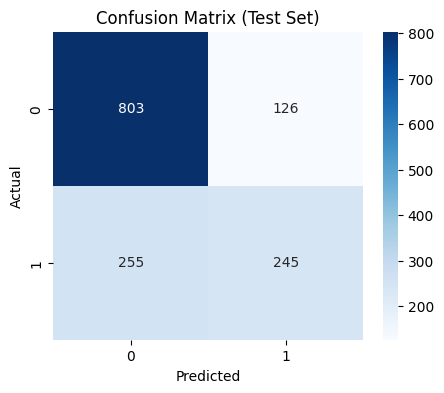

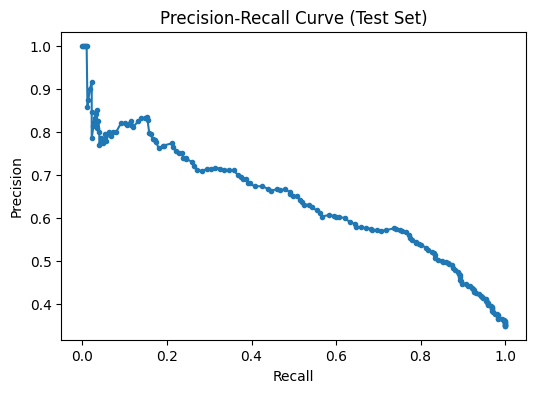

Metrics for Set3 at test size 0.46: {'accuracy': 0.7333799860041987, 'auc_pr': 0.6425091763274079, 'auc_roc': 0.7771593110871906}

Running Set3 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

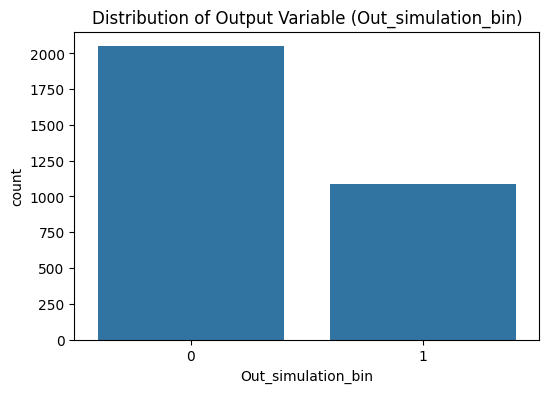


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     0
948     0
704     0
431     1


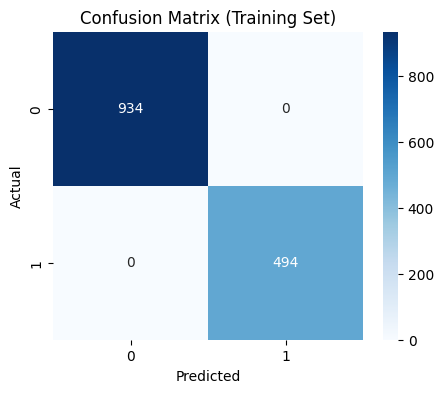

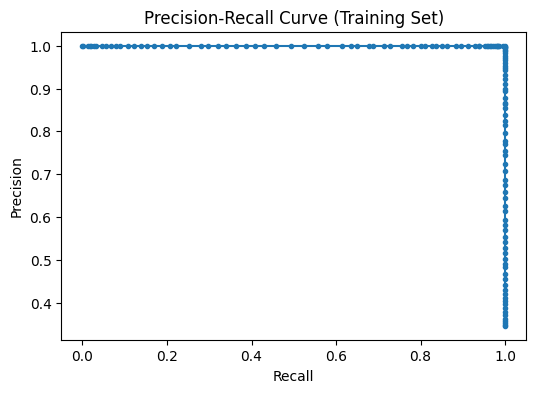


📊 Test Set Metrics:
Accuracy: 0.714
AUC-ROC: 0.748
AUC-PR: 0.619


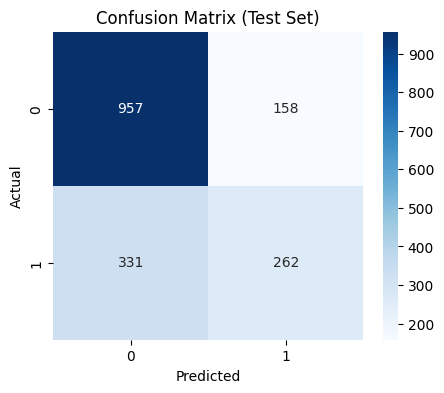

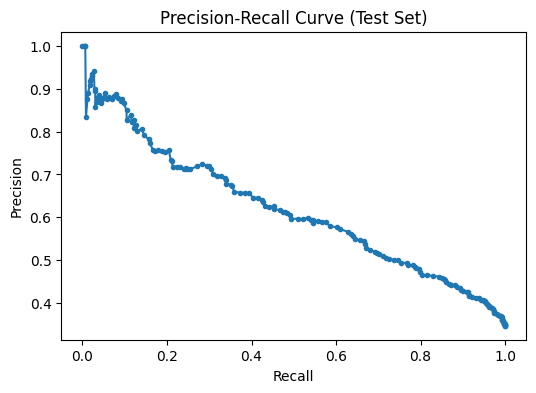

Metrics for Set3 at test size 0.54: {'accuracy': 0.7137002341920374, 'auc_pr': 0.6189554480043862, 'auc_roc': 0.7475200205688185}

Running Set3 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

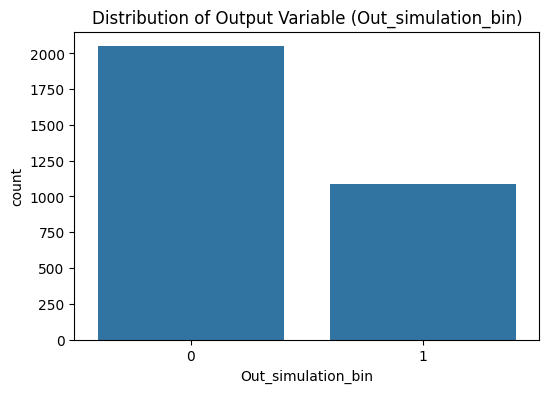


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    1
2310    0
592     0


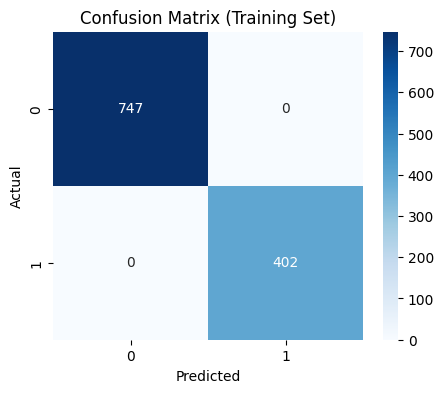

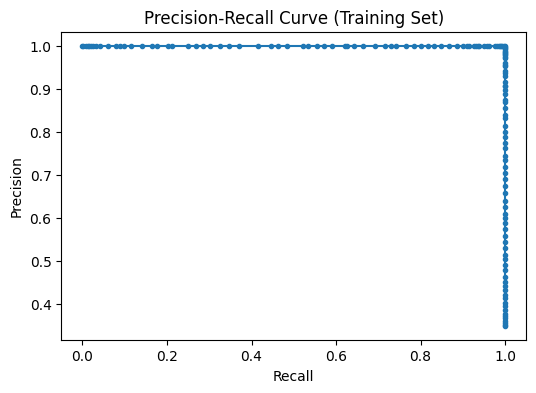


📊 Test Set Metrics:
Accuracy: 0.707
AUC-ROC: 0.720
AUC-PR: 0.583


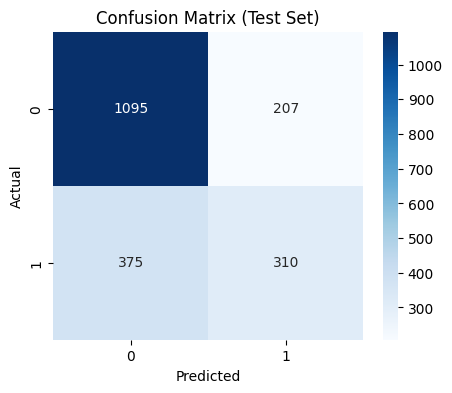

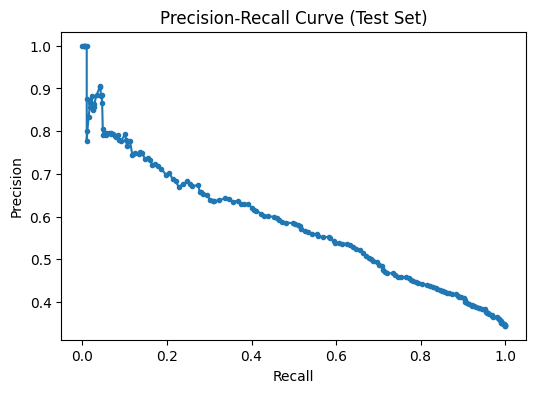

Metrics for Set3 at test size 0.63: {'accuracy': 0.7070961248112733, 'auc_pr': 0.5834211628638769, 'auc_roc': 0.7204833664099027}

Running Set3 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

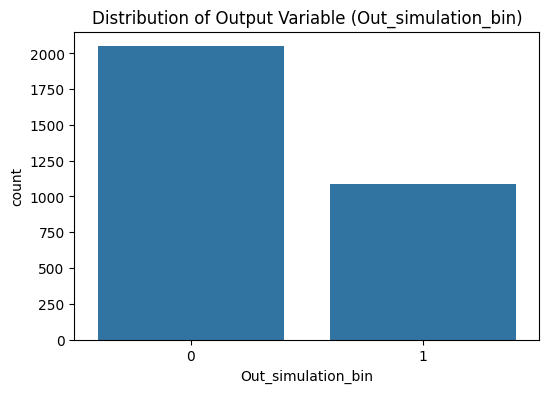


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    0
3       0
74      0
1755    1
4

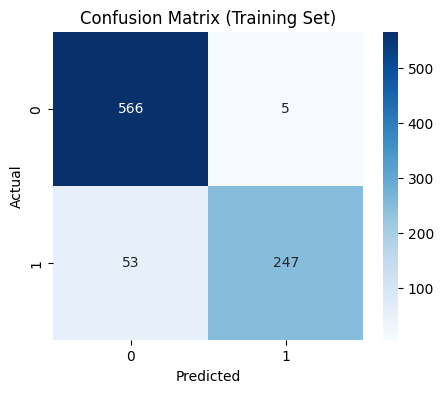

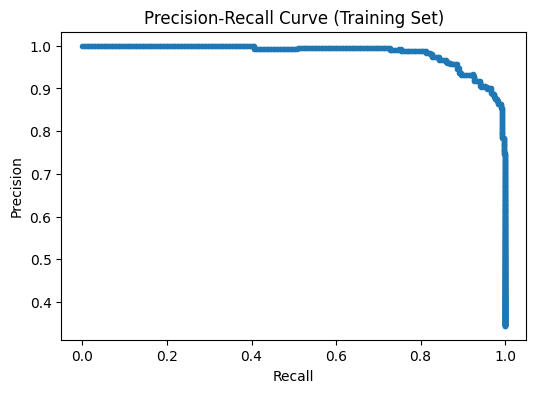


📊 Test Set Metrics:
Accuracy: 0.690
AUC-ROC: 0.674
AUC-PR: 0.534


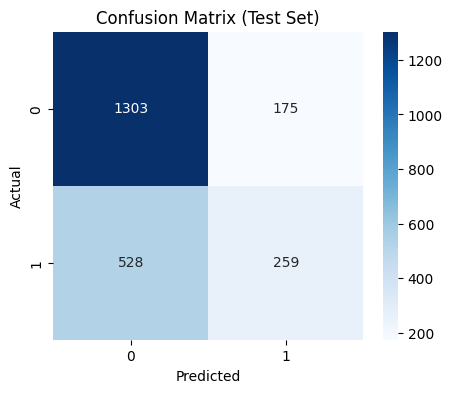

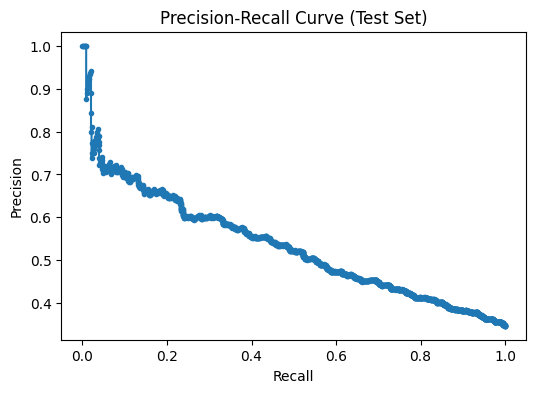

Metrics for Set3 at test size 0.72: {'accuracy': 0.6896247240618102, 'auc_pr': 0.5339542910832338, 'auc_roc': 0.6736833146203617}

Running Set3 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

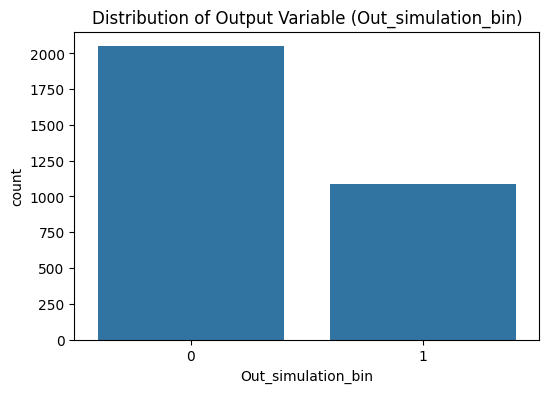


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    1
1324    0
216     1
510     0
1

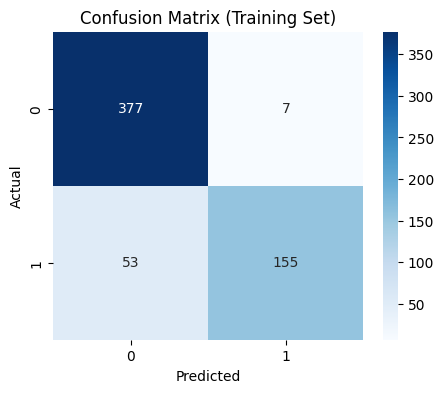

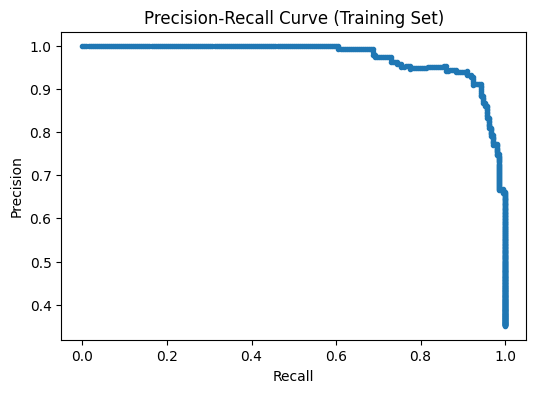


📊 Test Set Metrics:
Accuracy: 0.653
AUC-ROC: 0.622
AUC-PR: 0.479


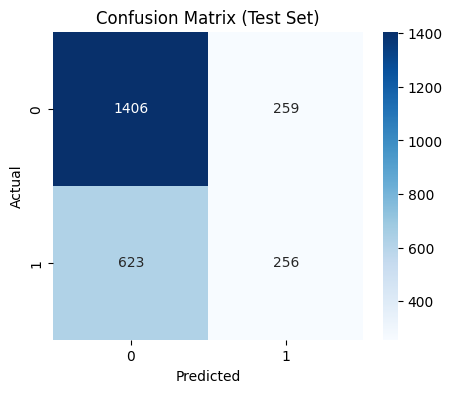

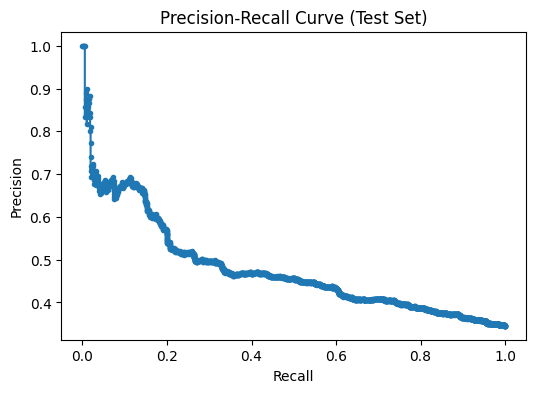

Metrics for Set3 at test size 0.81: {'accuracy': 0.6533018867924528, 'auc_pr': 0.4785940914483991, 'auc_roc': 0.6218153306890508}

Running Set3 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

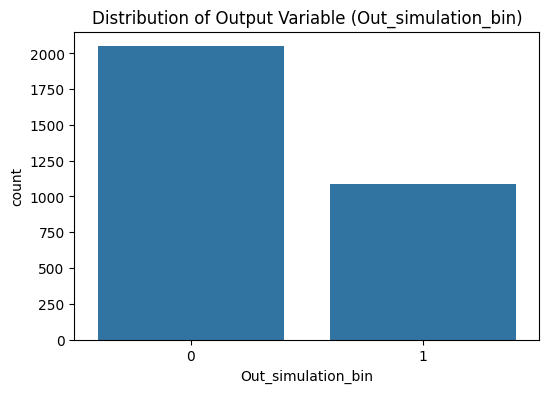


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set3 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    1
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    1
639     0
2907    0
1218    0
1

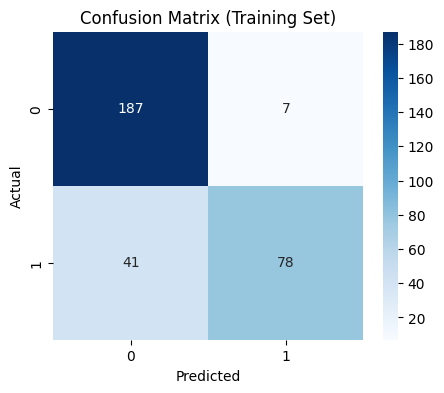

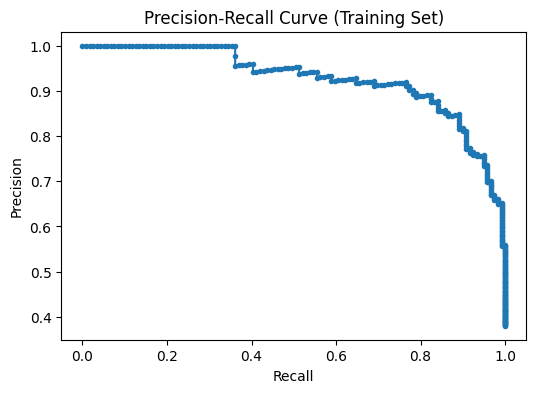


📊 Test Set Metrics:
Accuracy: 0.633
AUC-ROC: 0.571
AUC-PR: 0.417


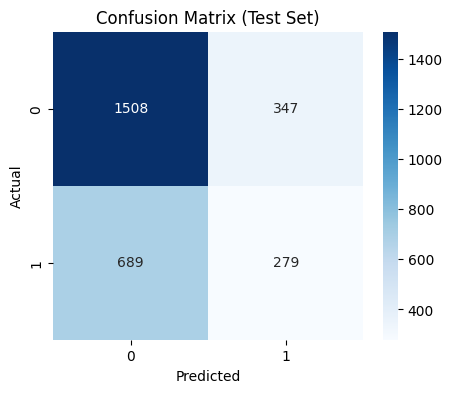

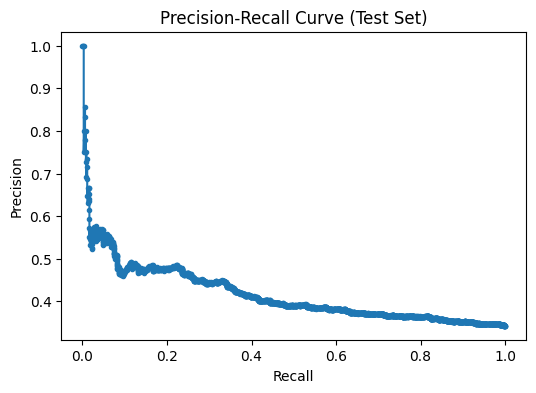

Metrics for Set3 at test size 0.90: {'accuracy': 0.6330145235565002, 'auc_pr': 0.41700214536310026, 'auc_roc': 0.5708321267069123}

Running Set4 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

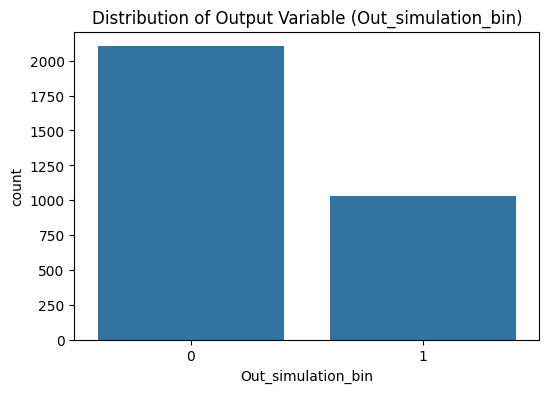


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   1  14   9
2396   6   0  14  10
2555   6   1  13   8
2351   5   7  15  14
2585    0
2955    1
2396    0
2555    1
2

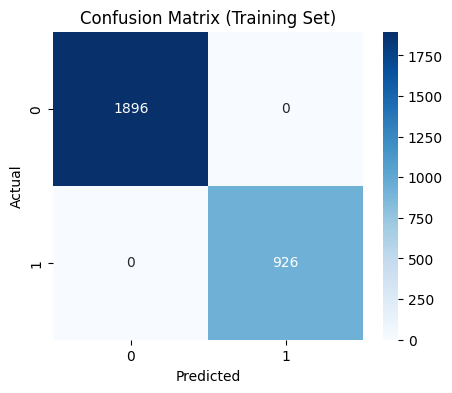

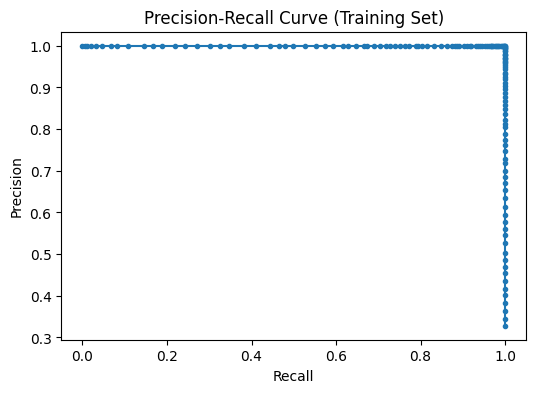


📊 Test Set Metrics:
Accuracy: 0.866
AUC-ROC: 0.936
AUC-PR: 0.902


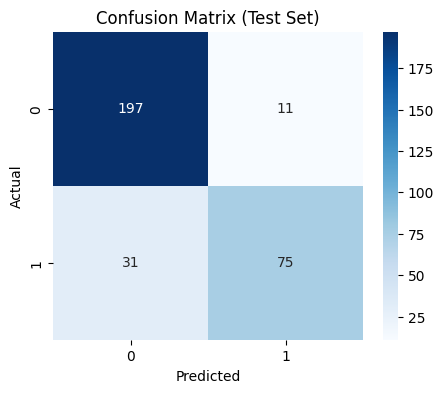

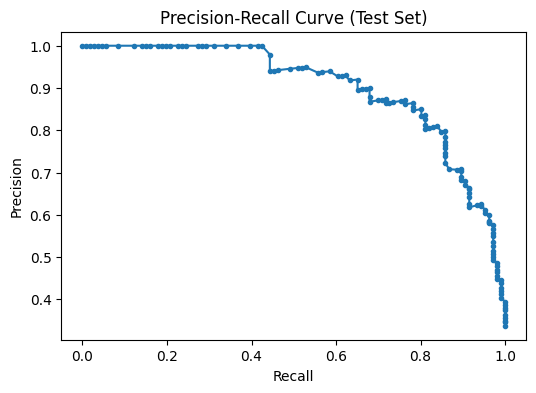

Metrics for Set4 at test size 0.10: {'accuracy': 0.8662420382165605, 'auc_pr': 0.9017315670540881, 'auc_roc': 0.9355043541364295}

Running Set4 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

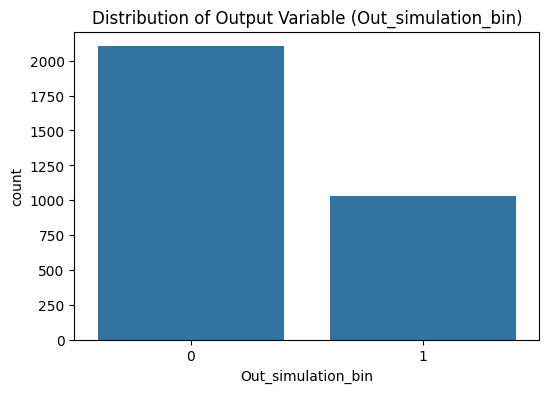


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   1   9  11
29      0
2619    0
22      0
1161    0
1

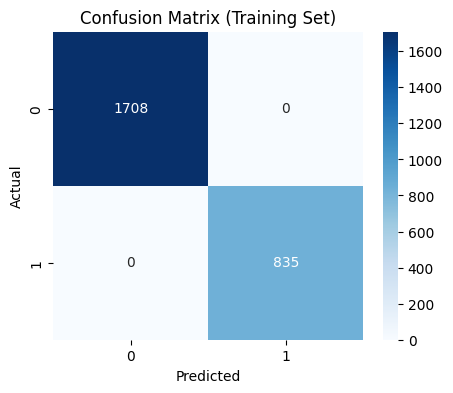

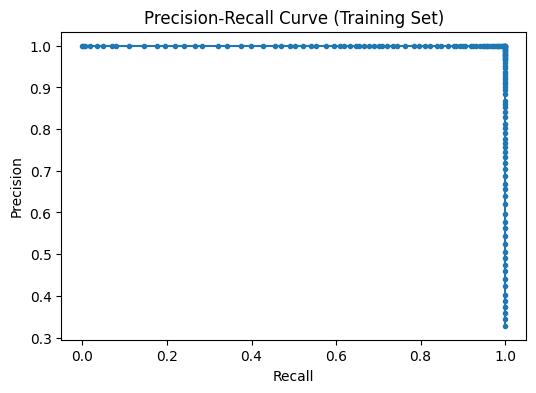


📊 Test Set Metrics:
Accuracy: 0.841
AUC-ROC: 0.918
AUC-PR: 0.853


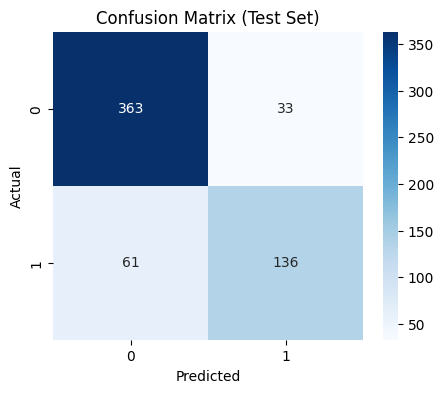

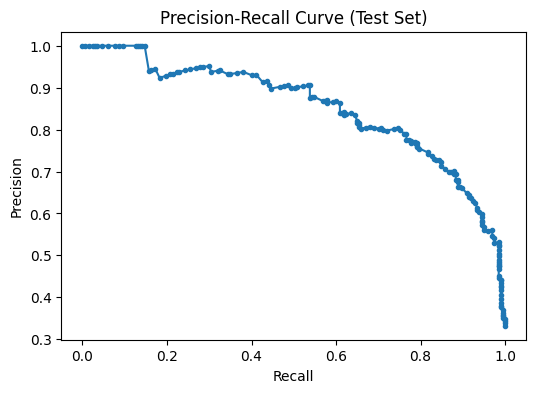

Metrics for Set4 at test size 0.19: {'accuracy': 0.8414839797639123, 'auc_pr': 0.8526917774083624, 'auc_roc': 0.9179036558478183}

Running Set4 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

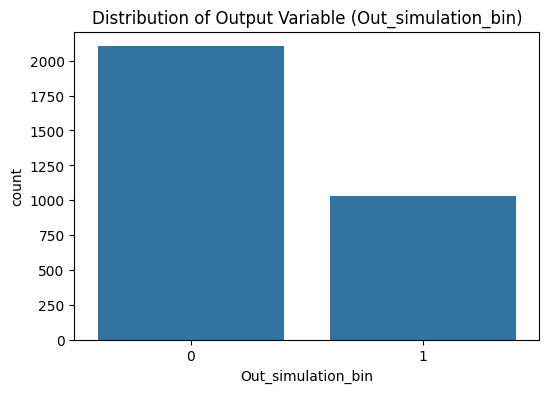


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   1  11  14
1114    0
109     0
2057    1
781     0
2

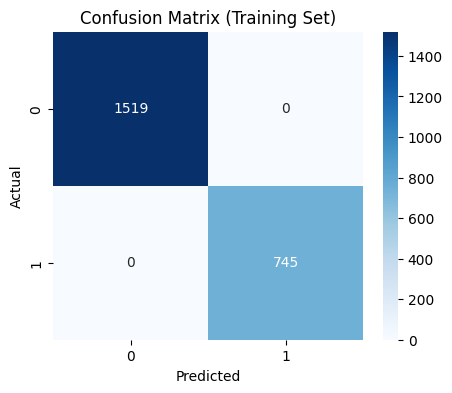

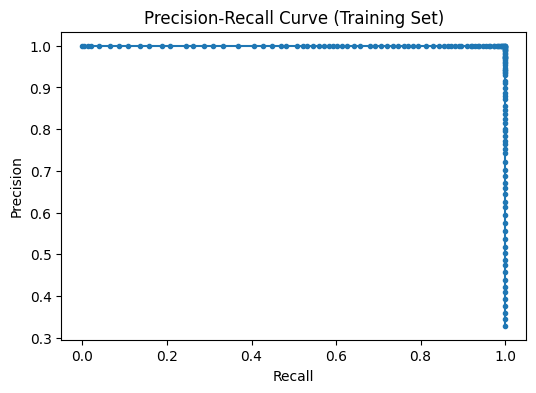


📊 Test Set Metrics:
Accuracy: 0.827
AUC-ROC: 0.895
AUC-PR: 0.811


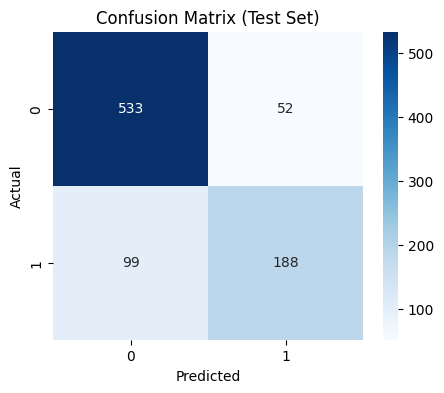

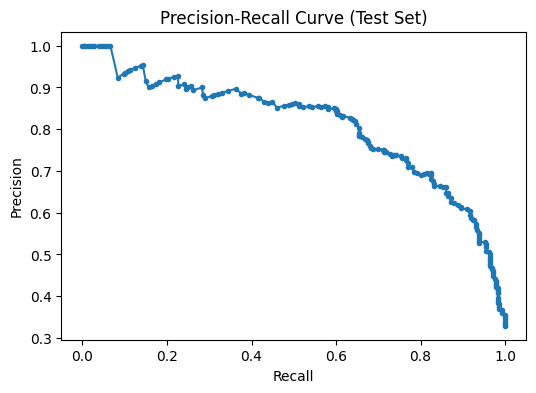

Metrics for Set4 at test size 0.28: {'accuracy': 0.8268348623853211, 'auc_pr': 0.8105895246494242, 'auc_roc': 0.8948509485094851}

Running Set4 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

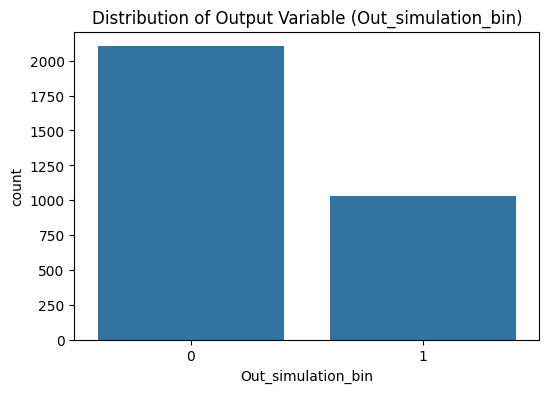


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   1  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    1
1811    0
1099    0


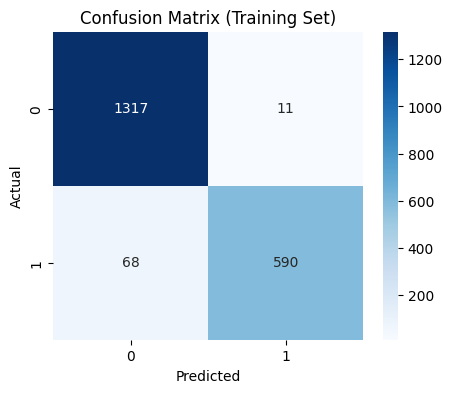

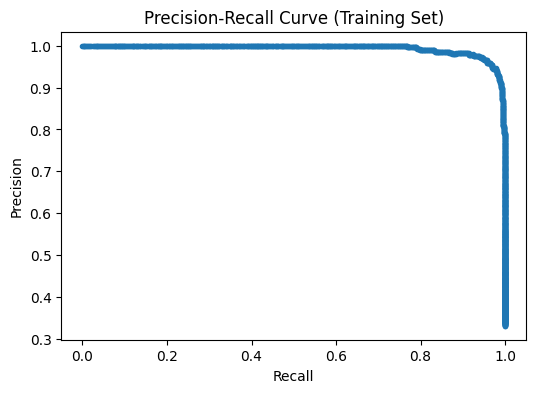


📊 Test Set Metrics:
Accuracy: 0.805
AUC-ROC: 0.876
AUC-PR: 0.775


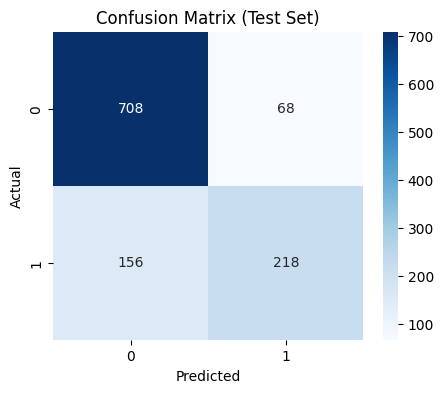

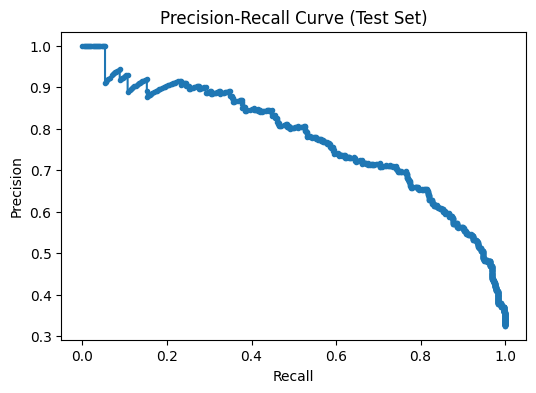

Metrics for Set4 at test size 0.37: {'accuracy': 0.8052173913043478, 'auc_pr': 0.7750974953679054, 'auc_roc': 0.8760646948563868}

Running Set4 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

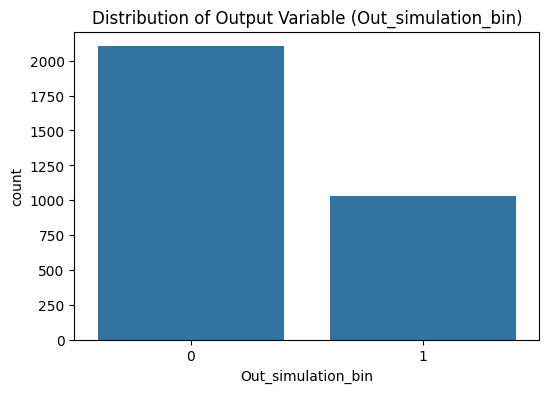


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   1   1  11  15
1784   4   1  14  15
3114    1
2867    0
2979    0
1259    0


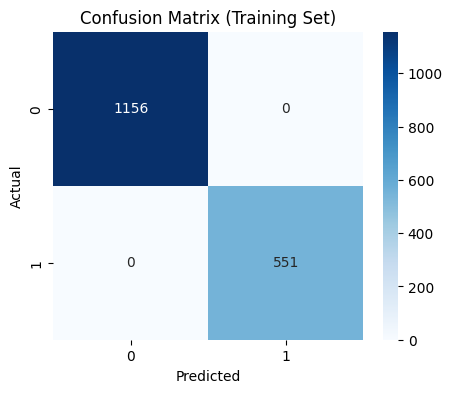

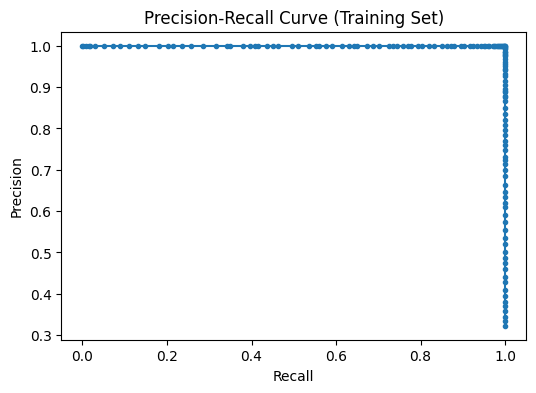


📊 Test Set Metrics:
Accuracy: 0.803
AUC-ROC: 0.857
AUC-PR: 0.780


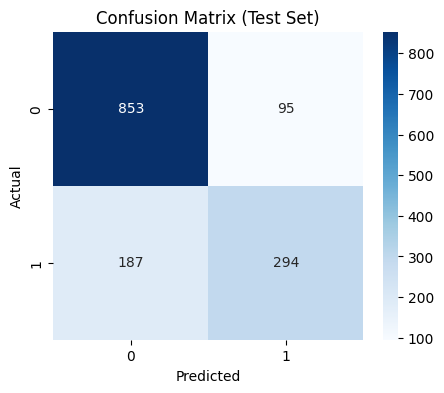

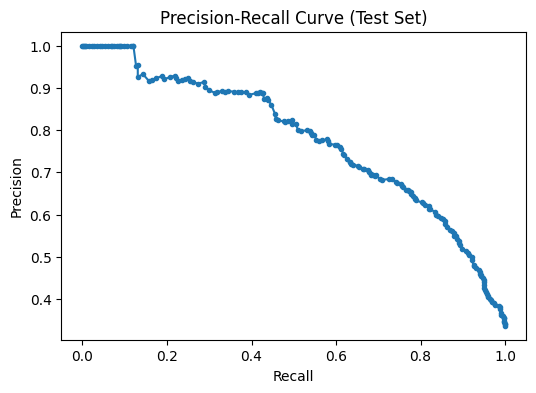

Metrics for Set4 at test size 0.46: {'accuracy': 0.8026592022393282, 'auc_pr': 0.7795046845977434, 'auc_roc': 0.8568175039694028}

Running Set4 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

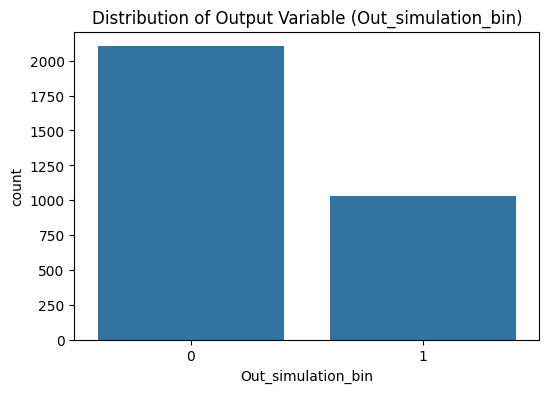


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   1  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     0
948     0
704     1
431     0


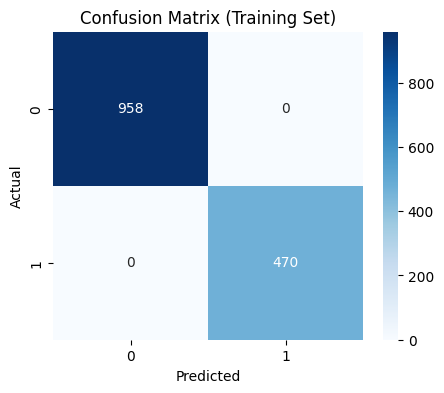

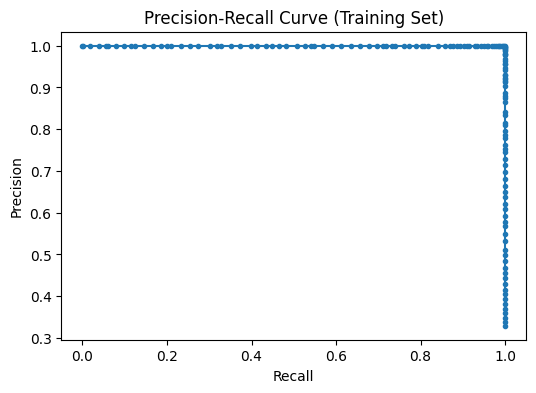


📊 Test Set Metrics:
Accuracy: 0.792
AUC-ROC: 0.838
AUC-PR: 0.747


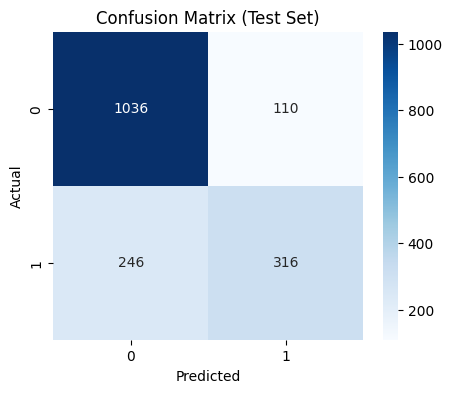

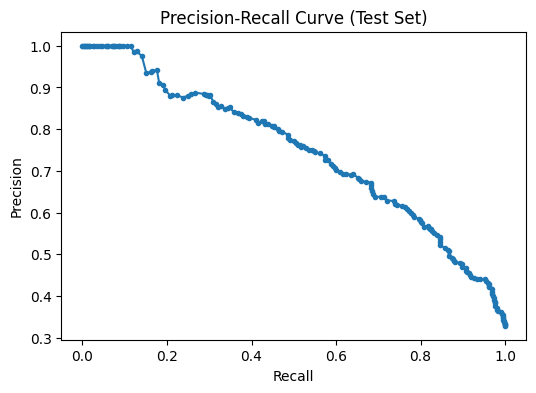

Metrics for Set4 at test size 0.54: {'accuracy': 0.7915690866510539, 'auc_pr': 0.7468281219717168, 'auc_roc': 0.837754560190792}

Running Set4 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

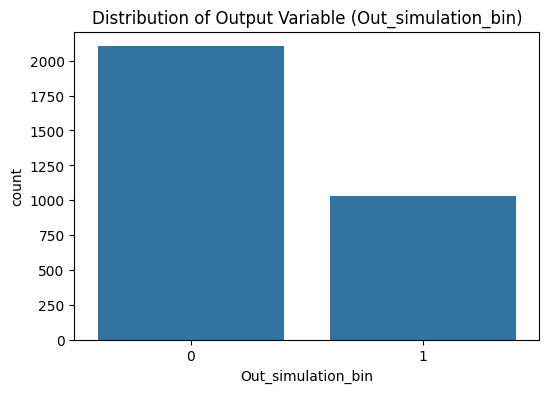


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   1   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   1   2  10   9
631     0
1181    0
2310    1
592     1


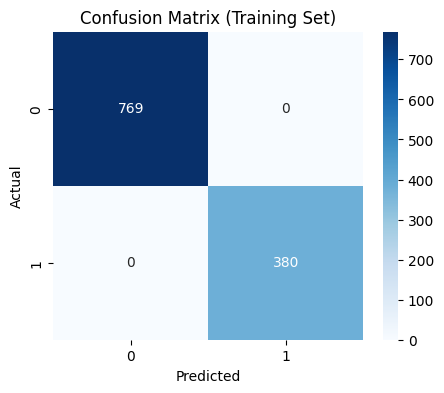

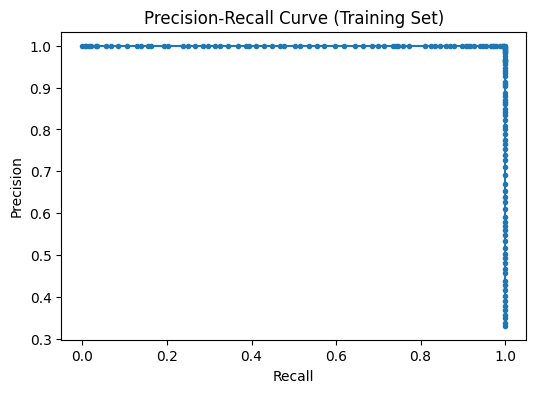


📊 Test Set Metrics:
Accuracy: 0.759
AUC-ROC: 0.793
AUC-PR: 0.669


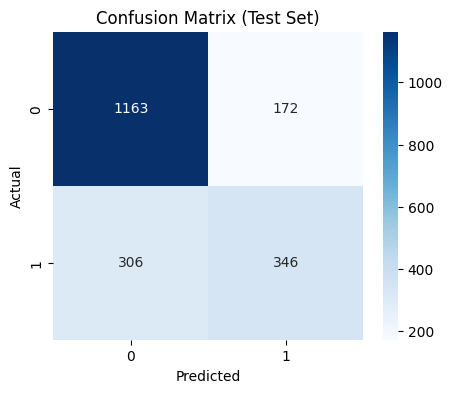

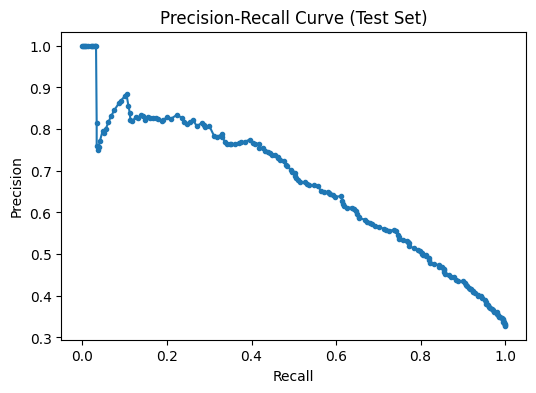

Metrics for Set4 at test size 0.63: {'accuracy': 0.7594363361852038, 'auc_pr': 0.6693131204616678, 'auc_roc': 0.7929447852760736}

Running Set4 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

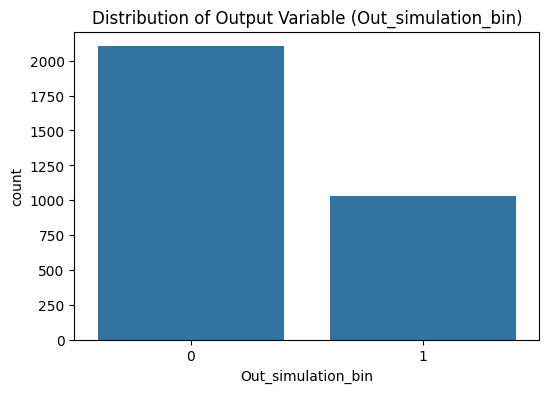


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   1  10  14
467    1   2  10  14
1870    0
3       1
74      1
1755    0
4

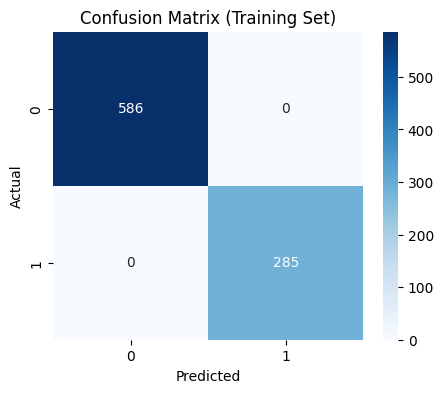

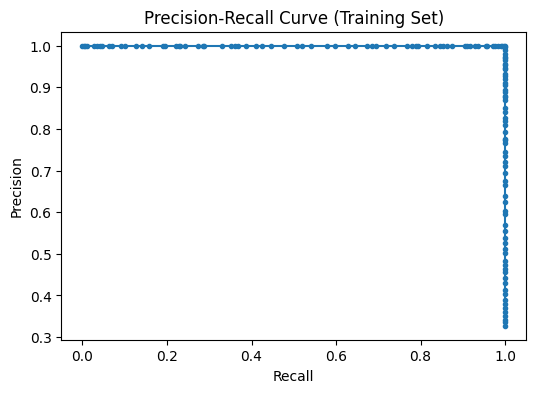


📊 Test Set Metrics:
Accuracy: 0.741
AUC-ROC: 0.757
AUC-PR: 0.626


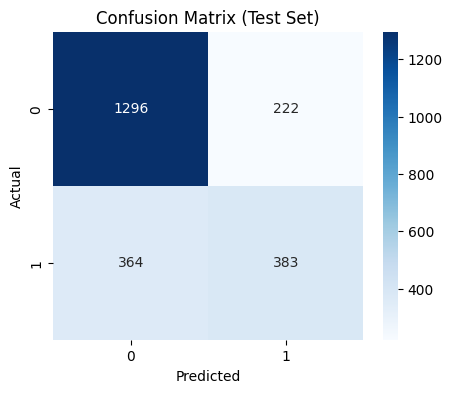

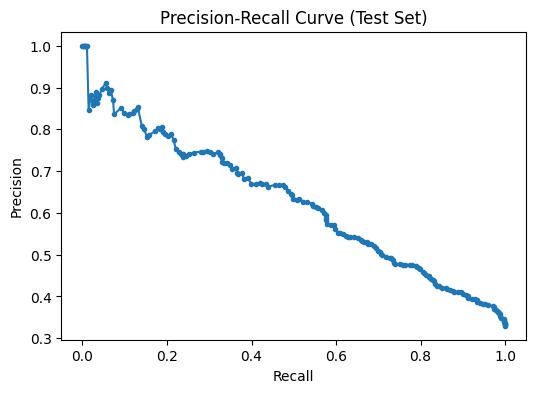

Metrics for Set4 at test size 0.72: {'accuracy': 0.741280353200883, 'auc_pr': 0.6260069564567896, 'auc_roc': 0.757409082972205}

Running Set4 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1        

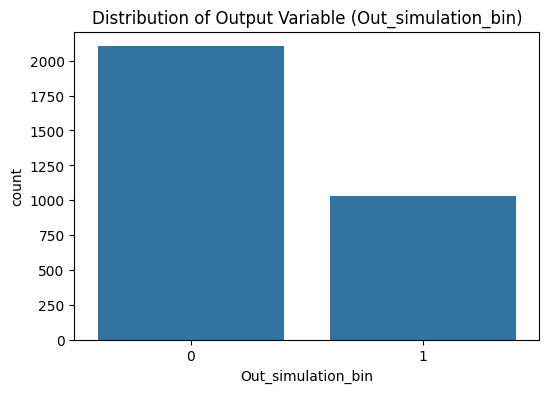


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   1   2  13   9
216    0   4  14  15
510    1   1   8  15
1680   4   2   8   9
1155    1
1324    0
216     0
510     0
1

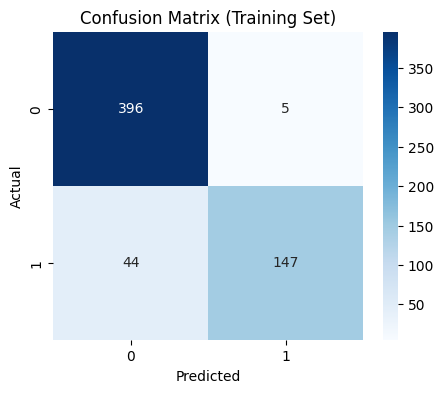

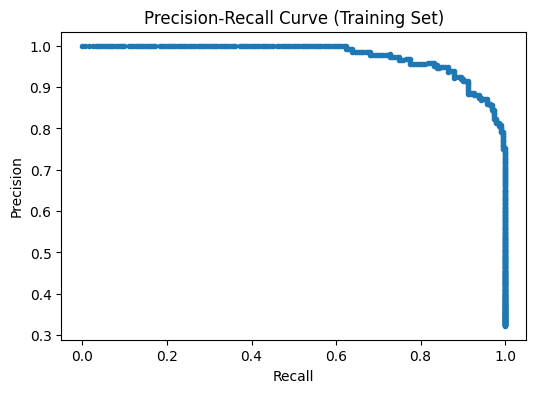


📊 Test Set Metrics:
Accuracy: 0.710
AUC-ROC: 0.701
AUC-PR: 0.546


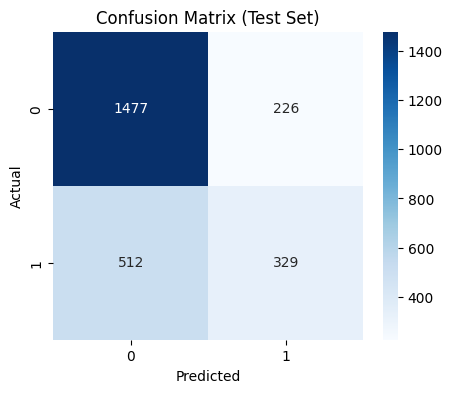

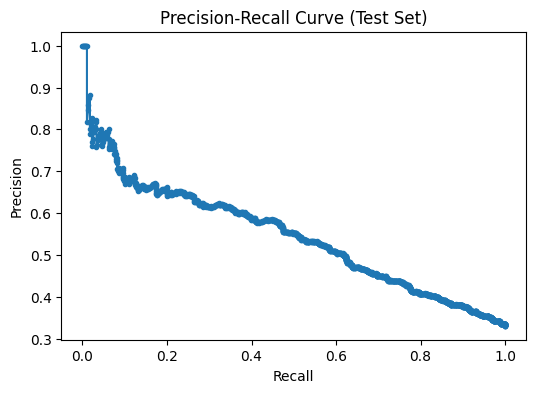

Metrics for Set4 at test size 0.81: {'accuracy': 0.7099056603773585, 'auc_pr': 0.5457444202465183, 'auc_roc': 0.7008405813899092}

Running Set4 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

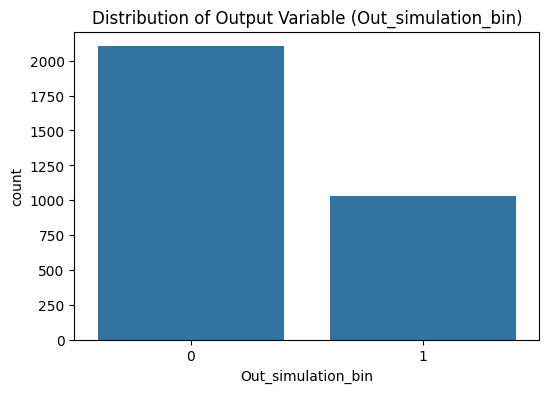


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set4 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   1   0  14   8
1158   2   7  13  11
2735    0
639     0
2907    0
1218    0
1

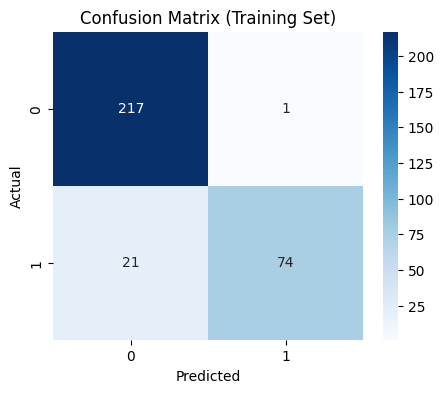

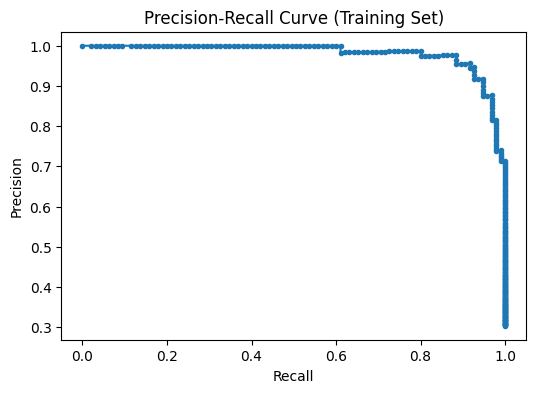


📊 Test Set Metrics:
Accuracy: 0.681
AUC-ROC: 0.651
AUC-PR: 0.470


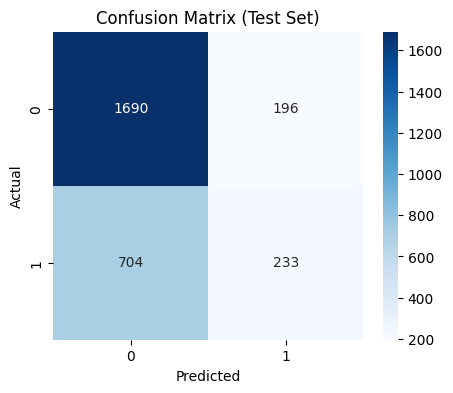

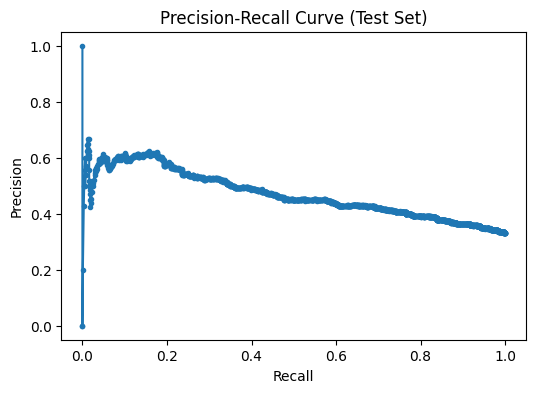

Metrics for Set4 at test size 0.90: {'accuracy': 0.6811902231668437, 'auc_pr': 0.46951213629194244, 'auc_roc': 0.6510769688690807}

Running Set5 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

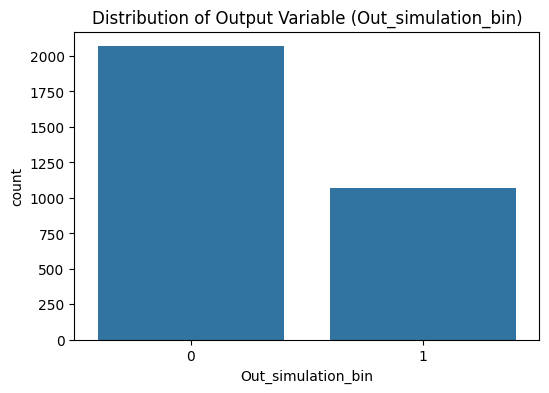


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    0
2955    0
2396    0
2555    0
2

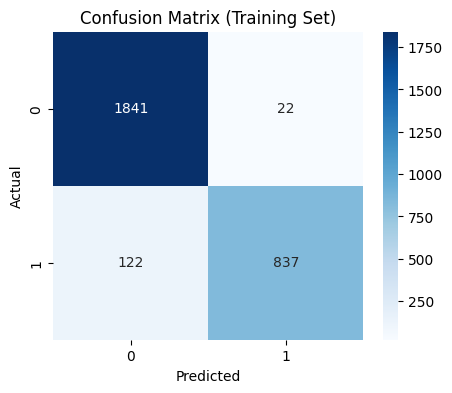

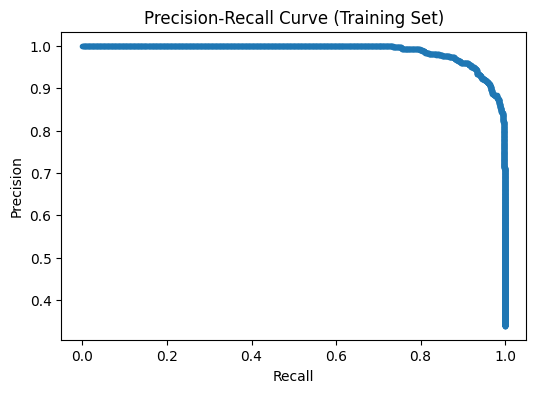


📊 Test Set Metrics:
Accuracy: 0.755
AUC-ROC: 0.841
AUC-PR: 0.720


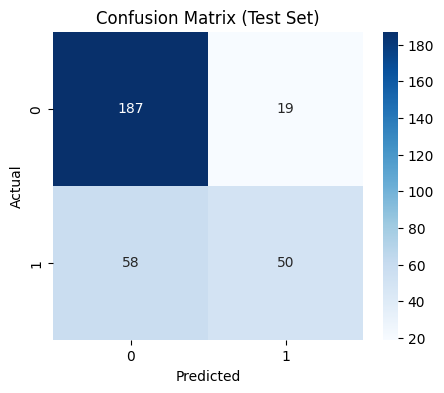

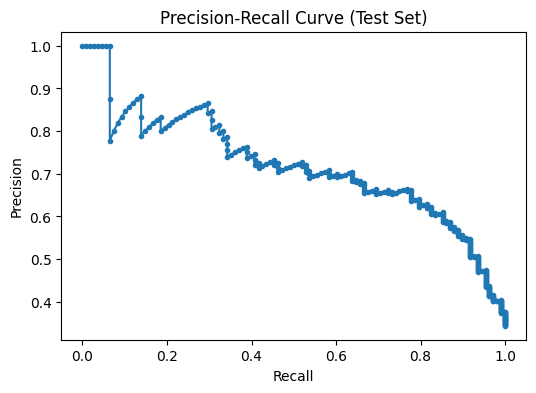

Metrics for Set5 at test size 0.10: {'accuracy': 0.7547770700636943, 'auc_pr': 0.7196755809379263, 'auc_roc': 0.8408396260338009}

Running Set5 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

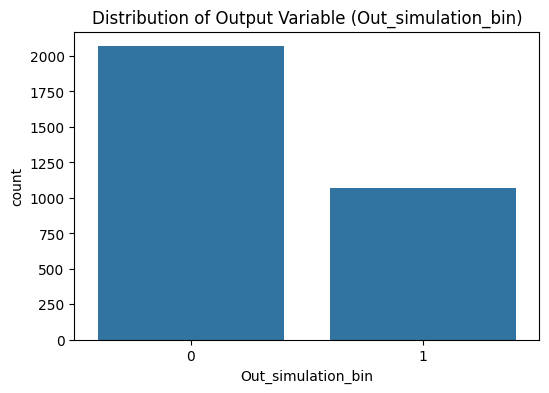


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    0
22      0
1161    0
1

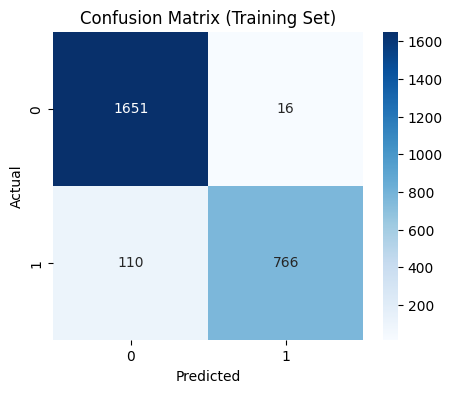

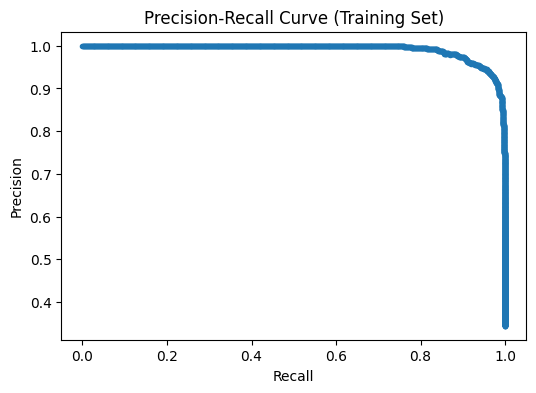


📊 Test Set Metrics:
Accuracy: 0.750
AUC-ROC: 0.786
AUC-PR: 0.636


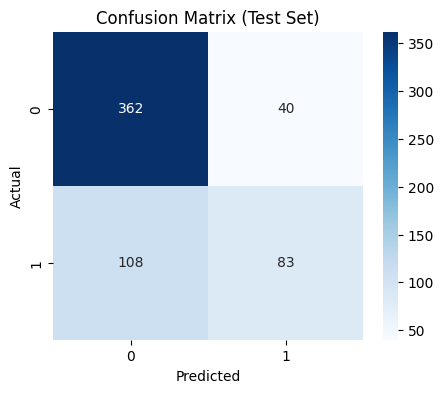

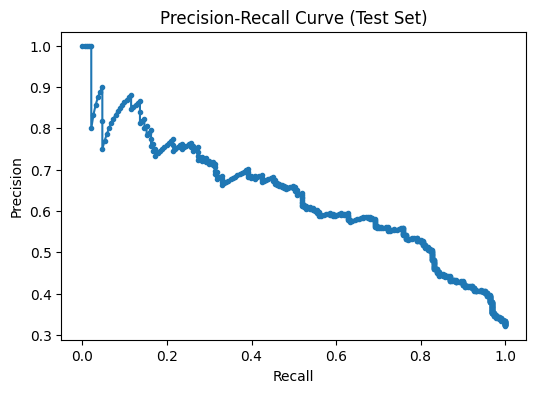

Metrics for Set5 at test size 0.19: {'accuracy': 0.7504215851602024, 'auc_pr': 0.6361900581481867, 'auc_roc': 0.7861608189419396}

Running Set5 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

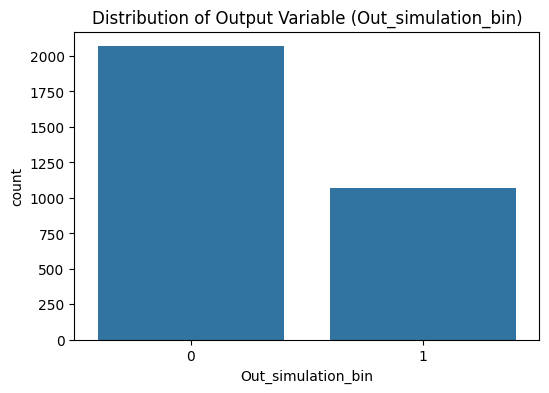


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    1
109     1
2057    1
781     1
2

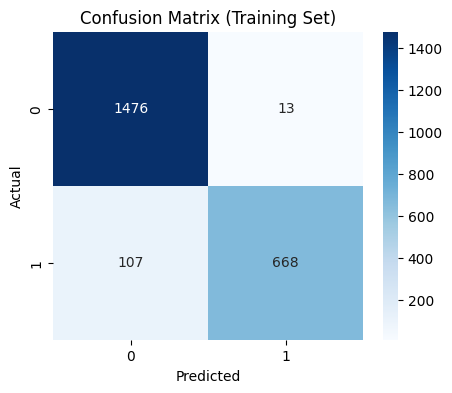

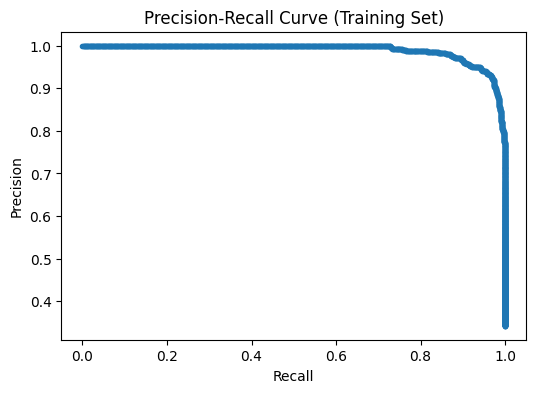


📊 Test Set Metrics:
Accuracy: 0.739
AUC-ROC: 0.785
AUC-PR: 0.648


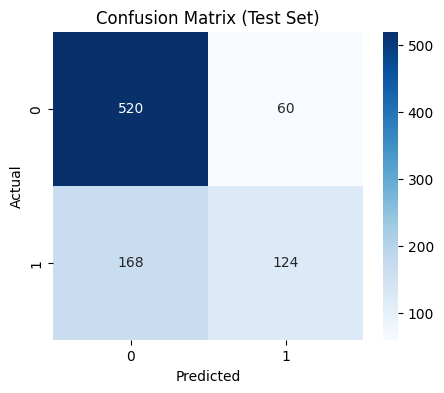

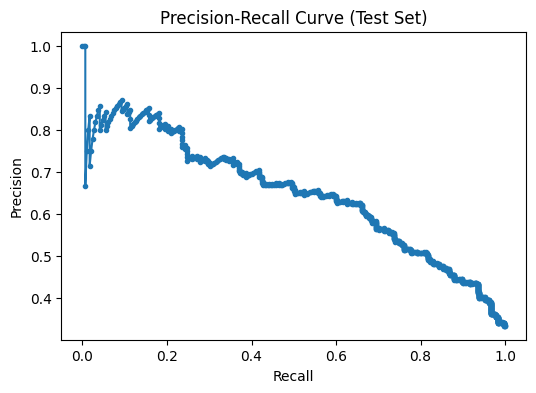

Metrics for Set5 at test size 0.28: {'accuracy': 0.7385321100917431, 'auc_pr': 0.6481217441718582, 'auc_roc': 0.7848960793575814}

Running Set5 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

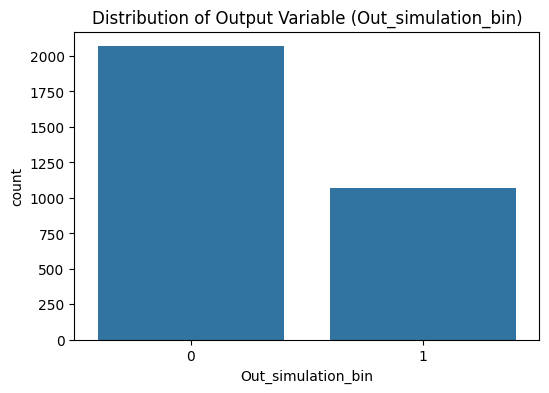


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     1
1953    0
1811    0
1099    0


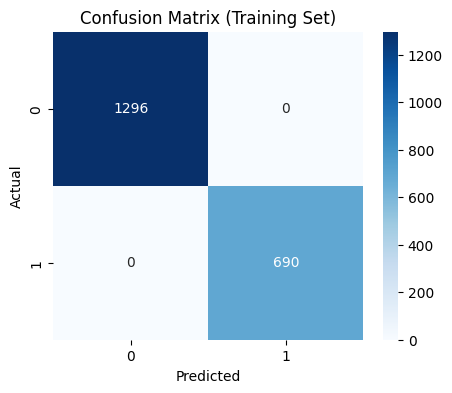

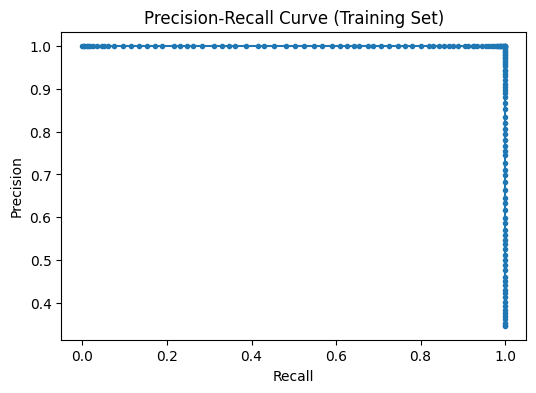


📊 Test Set Metrics:
Accuracy: 0.739
AUC-ROC: 0.775
AUC-PR: 0.610


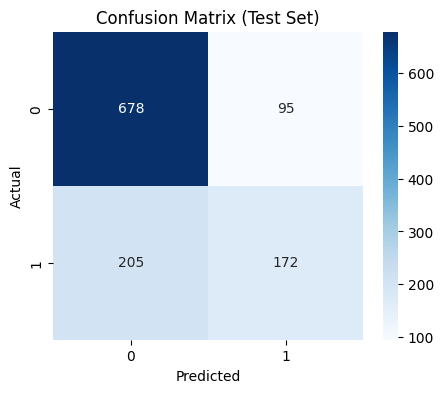

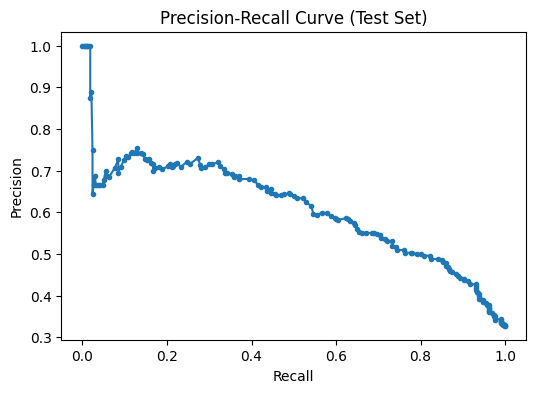

Metrics for Set5 at test size 0.37: {'accuracy': 0.7391304347826086, 'auc_pr': 0.6098266621282977, 'auc_roc': 0.774664488832308}

Running Set5 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

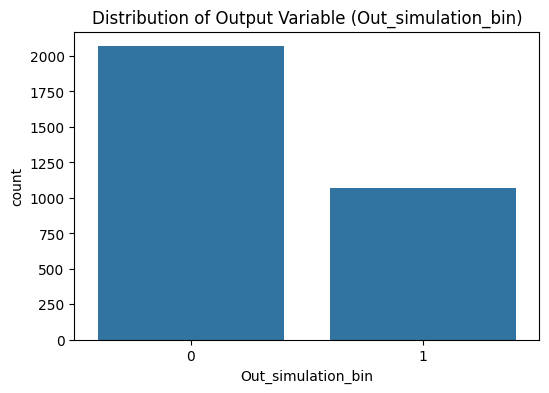


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    0
2867    1
2979    0
1259    1


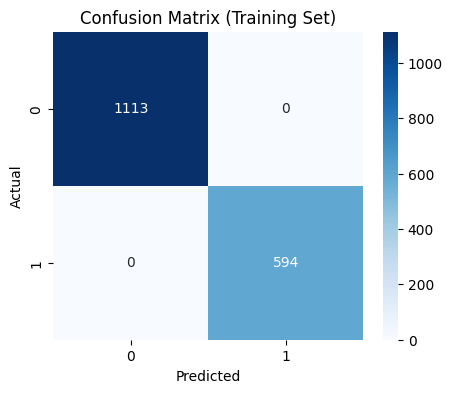

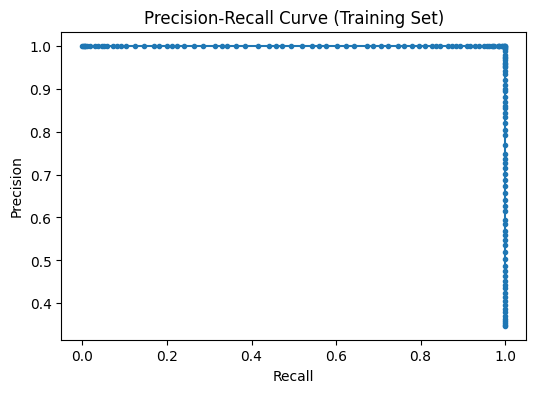


📊 Test Set Metrics:
Accuracy: 0.728
AUC-ROC: 0.757
AUC-PR: 0.587


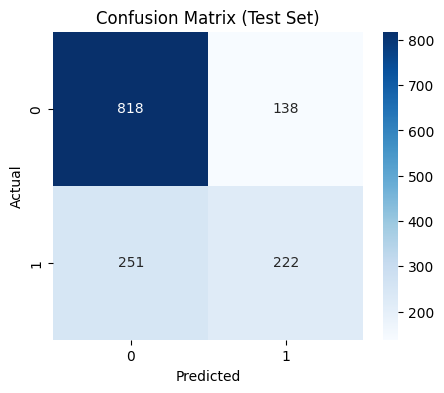

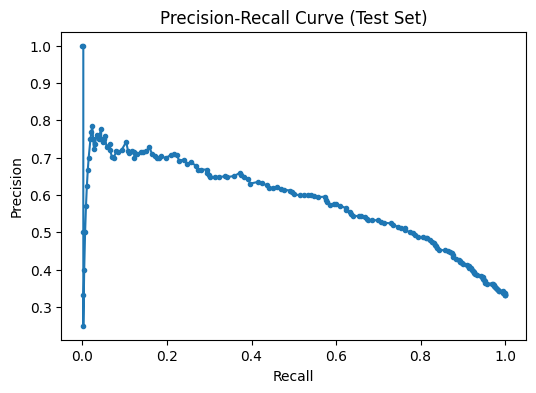

Metrics for Set5 at test size 0.46: {'accuracy': 0.72778166550035, 'auc_pr': 0.5869376041553982, 'auc_roc': 0.7569937725017029}

Running Set5 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1        

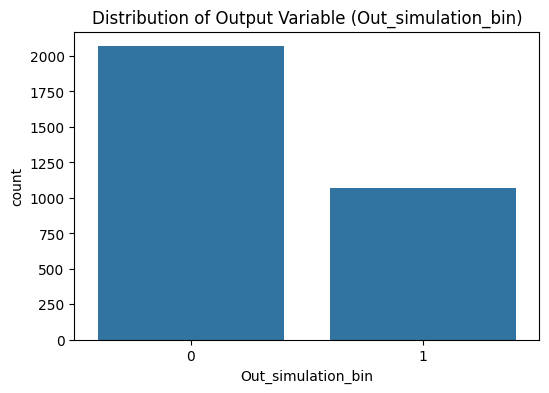


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     1
948     0
704     0
431     0


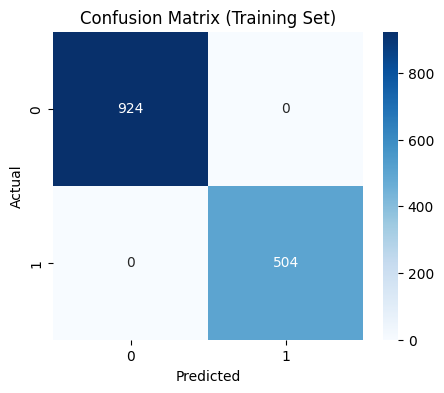

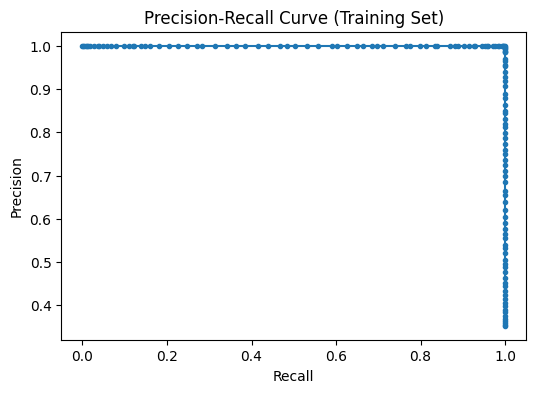


📊 Test Set Metrics:
Accuracy: 0.718
AUC-ROC: 0.740
AUC-PR: 0.572


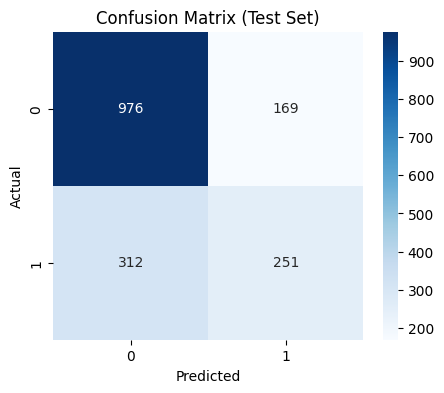

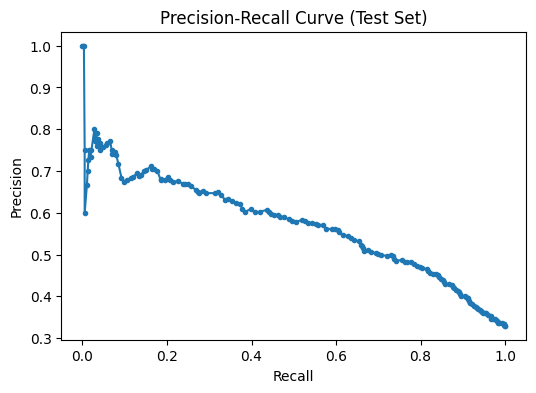

Metrics for Set5 at test size 0.54: {'accuracy': 0.718384074941452, 'auc_pr': 0.5719806187791797, 'auc_roc': 0.7400536737843897}

Running Set5 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

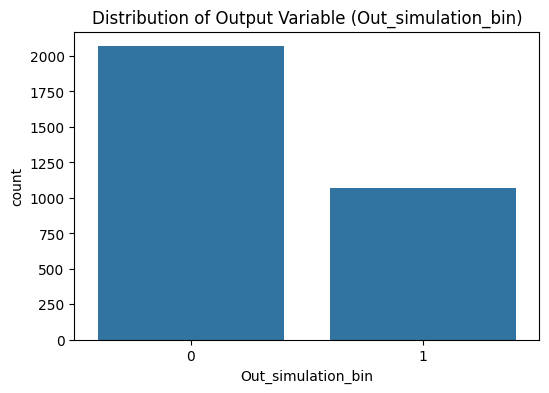


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    1
2310    1
592     0


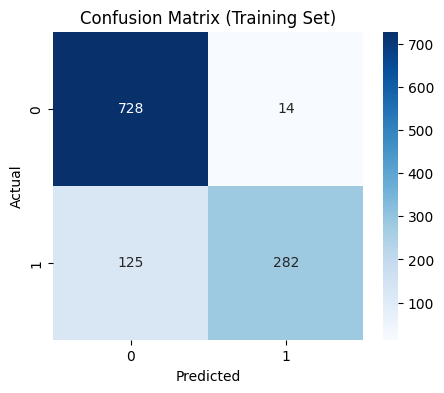

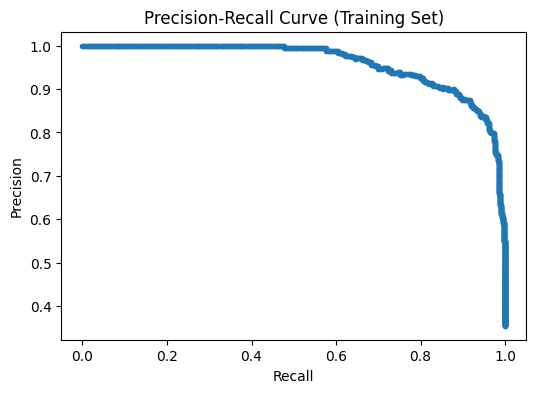


📊 Test Set Metrics:
Accuracy: 0.704
AUC-ROC: 0.705
AUC-PR: 0.548


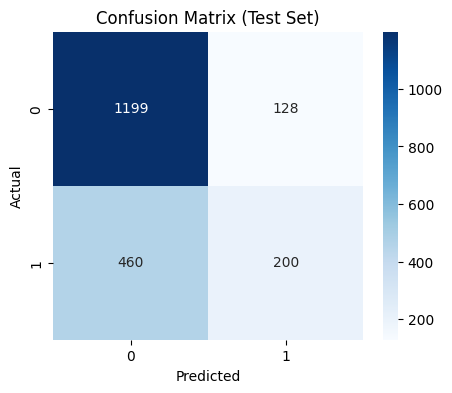

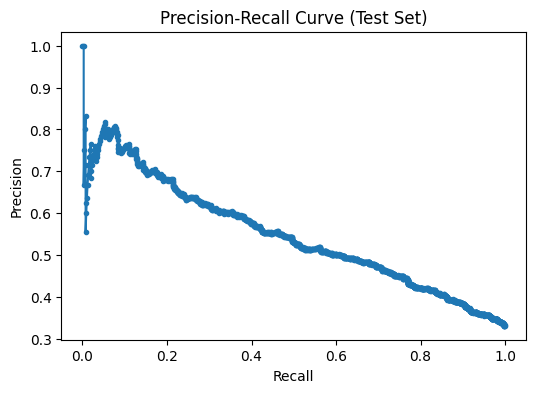

Metrics for Set5 at test size 0.63: {'accuracy': 0.704076497232008, 'auc_pr': 0.5484257474809844, 'auc_roc': 0.705062684113174}

Running Set5 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1        

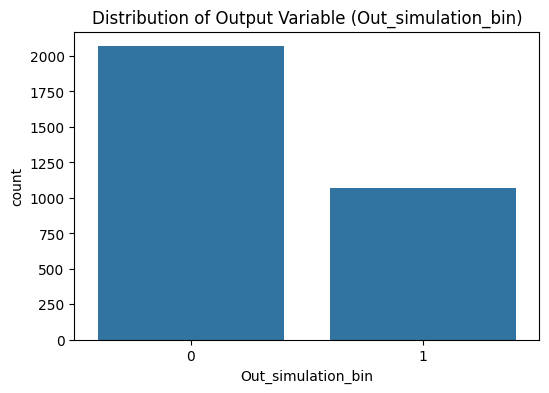


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    1
3       0
74      0
1755    0
4

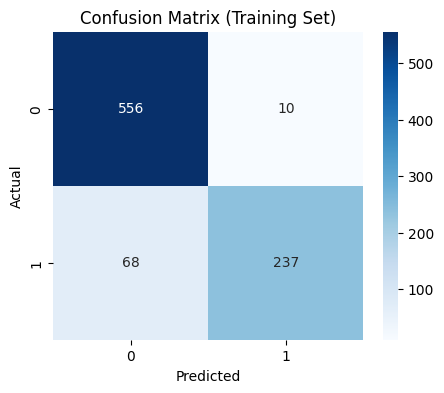

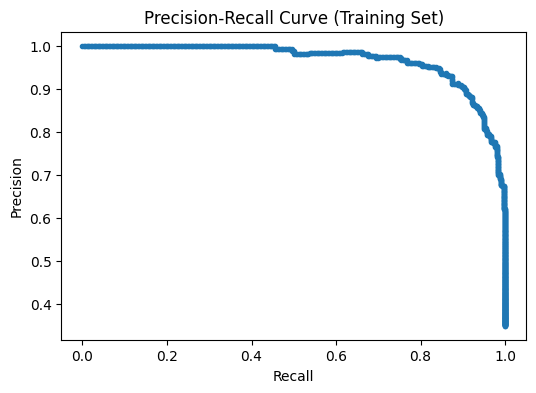


📊 Test Set Metrics:
Accuracy: 0.685
AUC-ROC: 0.678
AUC-PR: 0.520


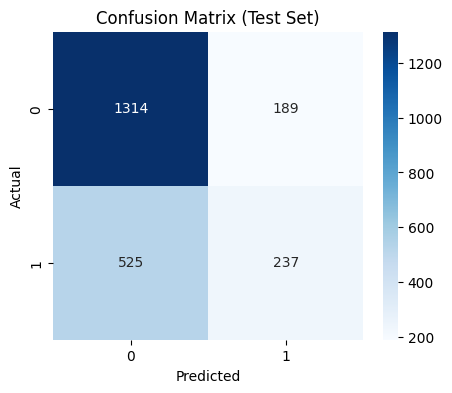

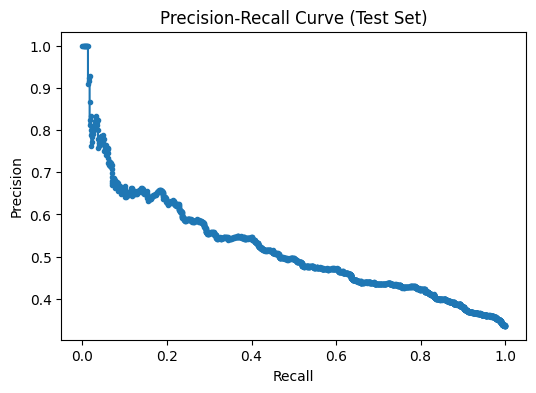

Metrics for Set5 at test size 0.72: {'accuracy': 0.6847682119205298, 'auc_pr': 0.5196168170534368, 'auc_roc': 0.6775128657819968}

Running Set5 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

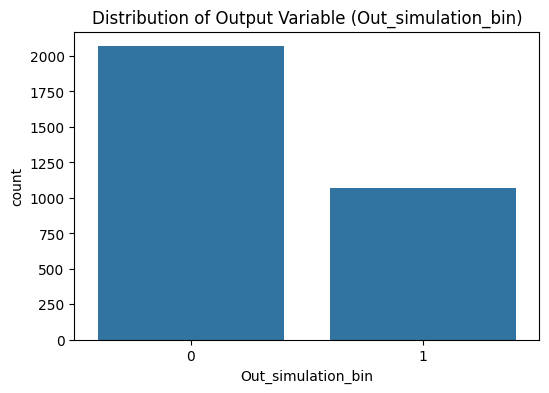


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    0
1324    0
216     0
510     0
1

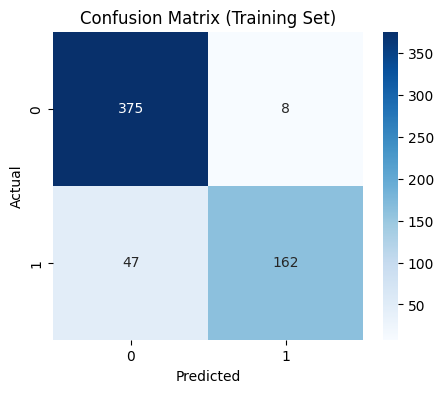

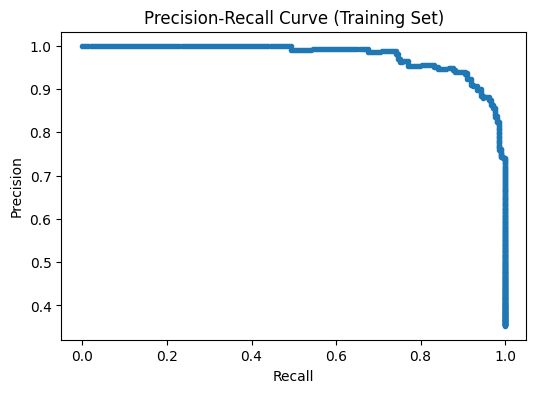


📊 Test Set Metrics:
Accuracy: 0.667
AUC-ROC: 0.637
AUC-PR: 0.462


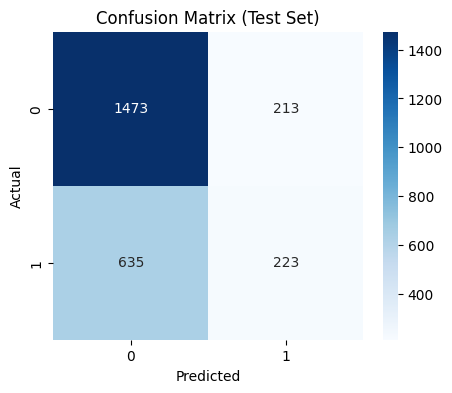

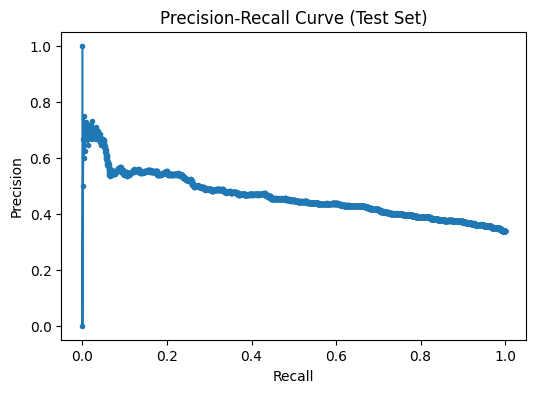

Metrics for Set5 at test size 0.81: {'accuracy': 0.6666666666666666, 'auc_pr': 0.4619733894235792, 'auc_roc': 0.637157919186389}

Running Set5 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

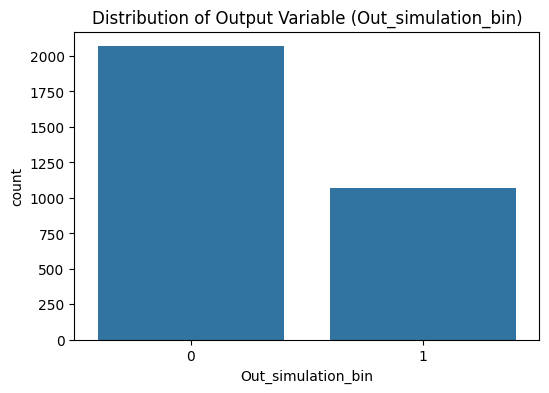


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set5 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     0
2907    1
1218    0
1

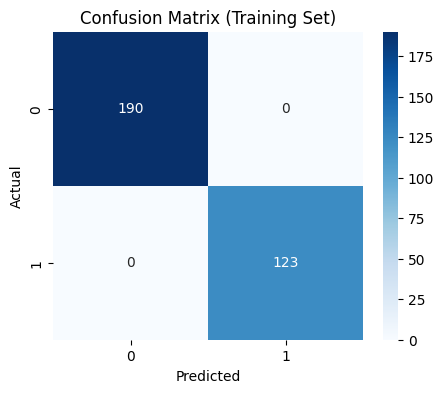

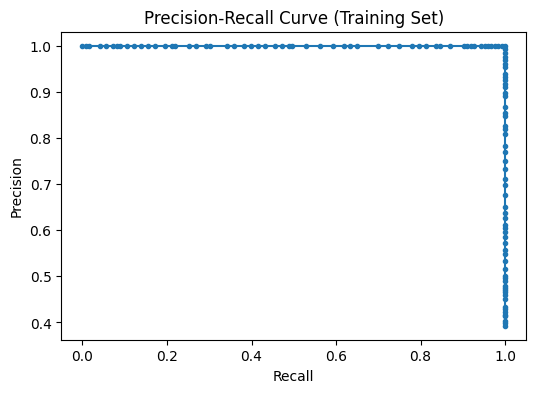


📊 Test Set Metrics:
Accuracy: 0.626
AUC-ROC: 0.595
AUC-PR: 0.413


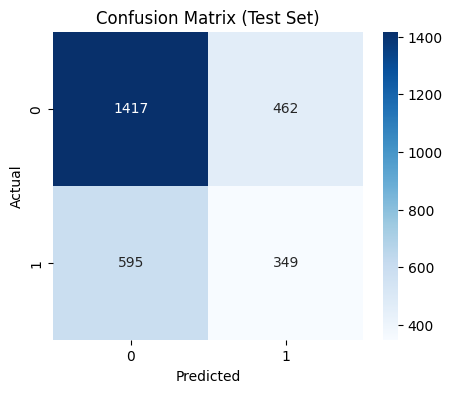

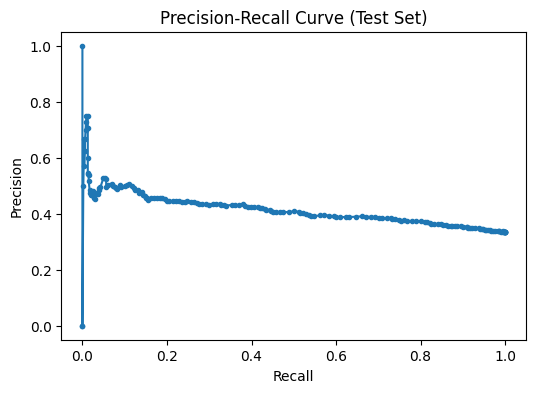

Metrics for Set5 at test size 0.90: {'accuracy': 0.6255756287637265, 'auc_pr': 0.41338533094658114, 'auc_roc': 0.5953615338126123}

Running Set6 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

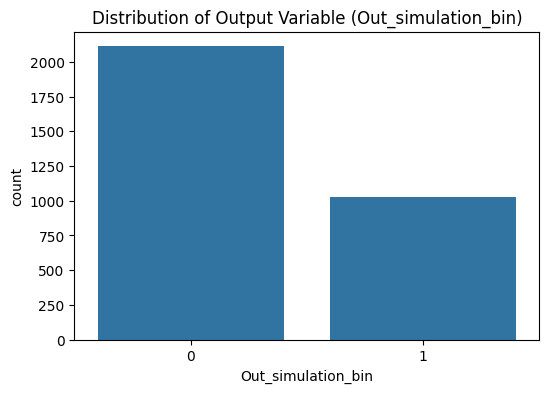


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    0
2955    1
2396    0
2555    0
2

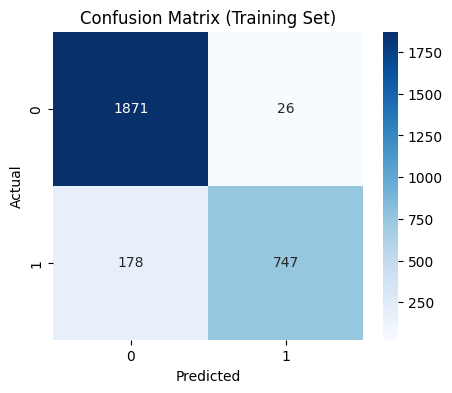

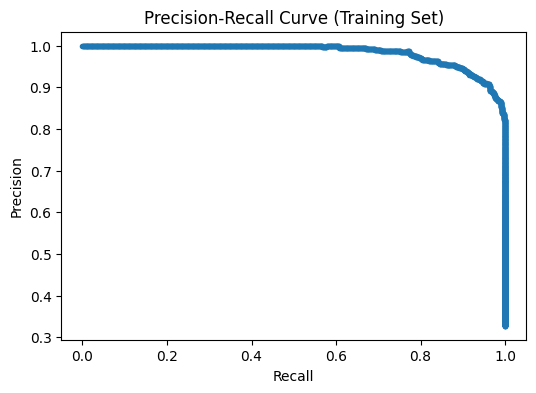


📊 Test Set Metrics:
Accuracy: 0.768
AUC-ROC: 0.757
AUC-PR: 0.624


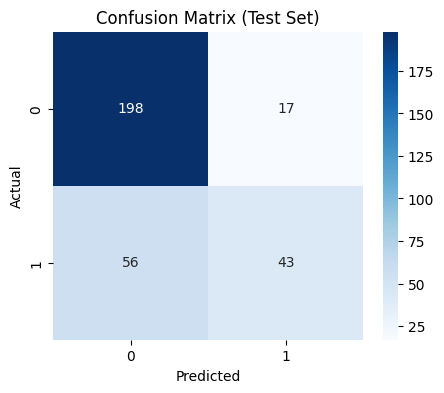

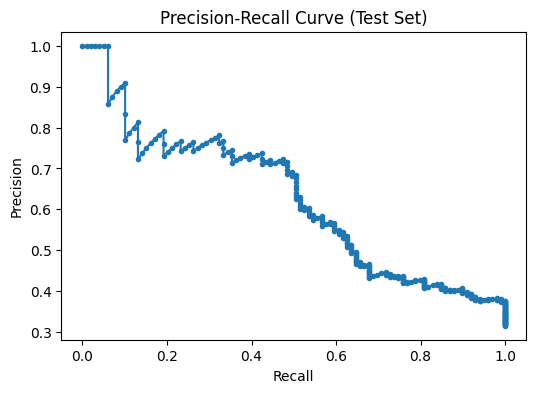

Metrics for Set6 at test size 0.10: {'accuracy': 0.767515923566879, 'auc_pr': 0.6235098185263404, 'auc_roc': 0.7570119802677941}

Running Set6 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

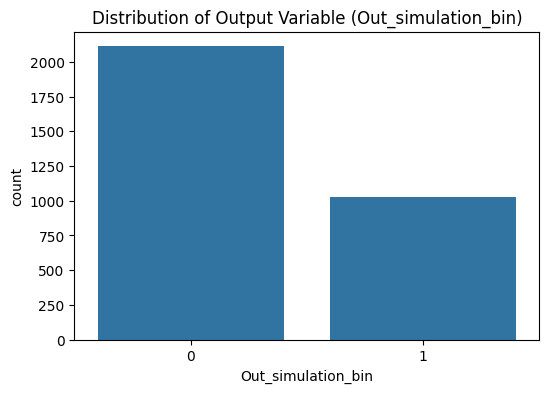


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    1
22      1
1161    0
1

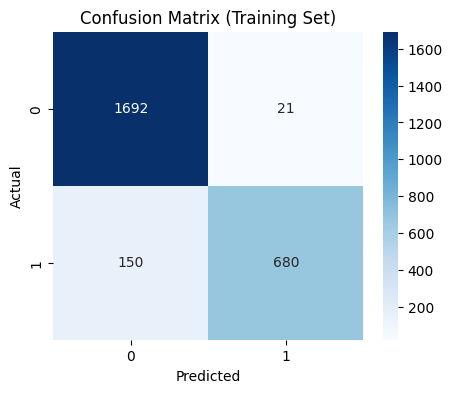

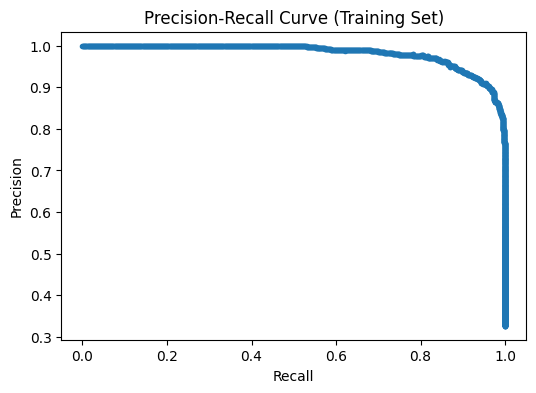


📊 Test Set Metrics:
Accuracy: 0.727
AUC-ROC: 0.754
AUC-PR: 0.589


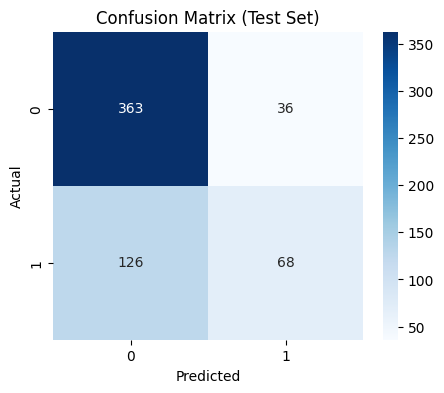

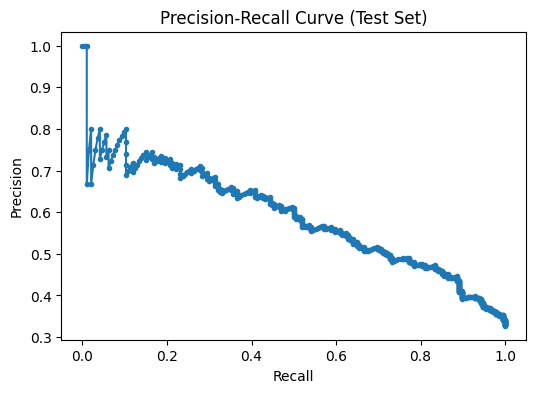

Metrics for Set6 at test size 0.19: {'accuracy': 0.7268128161888702, 'auc_pr': 0.5890996896205852, 'auc_roc': 0.7542309381701677}

Running Set6 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

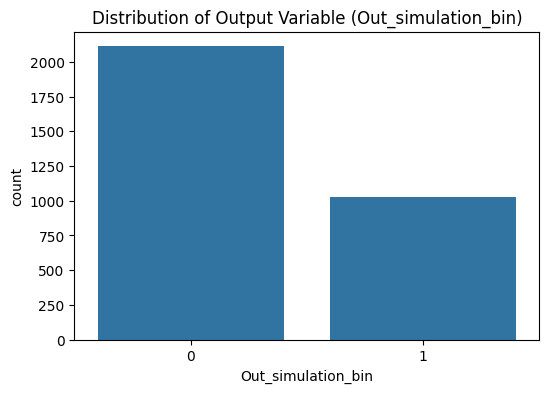


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     0
2057    0
781     0
2

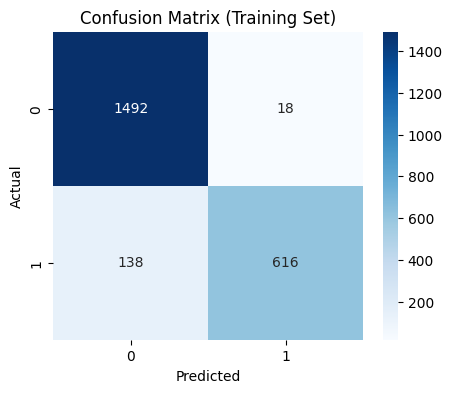

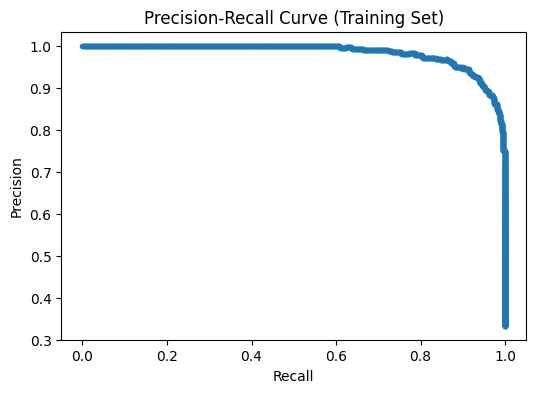


📊 Test Set Metrics:
Accuracy: 0.726
AUC-ROC: 0.730
AUC-PR: 0.521


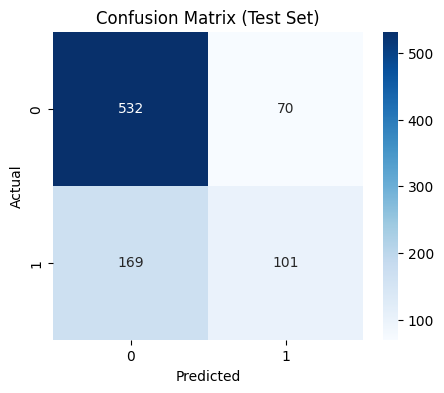

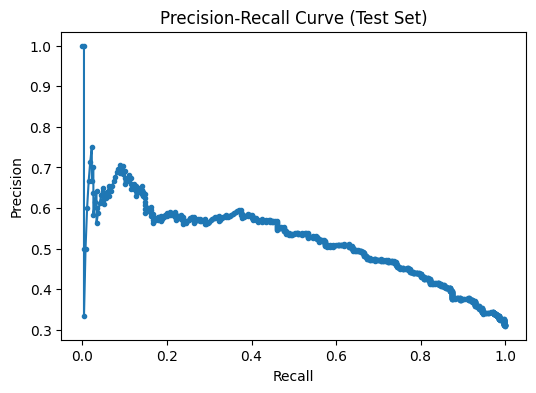

Metrics for Set6 at test size 0.28: {'accuracy': 0.7259174311926605, 'auc_pr': 0.5208659807627212, 'auc_roc': 0.7295342684877569}

Running Set6 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

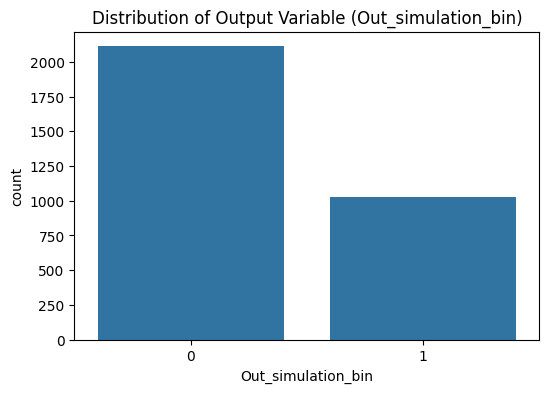


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    1
1811    0
1099    1


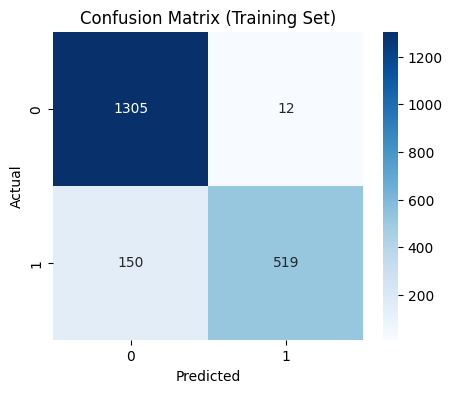

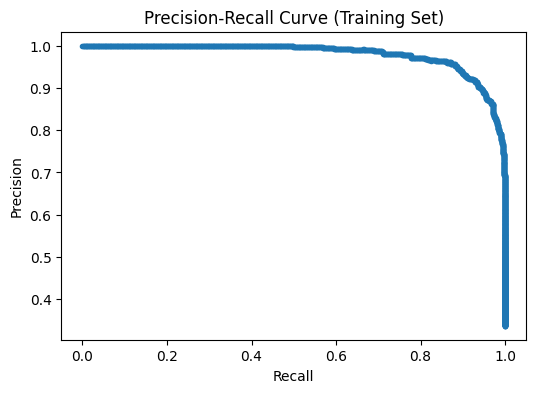


📊 Test Set Metrics:
Accuracy: 0.702
AUC-ROC: 0.697
AUC-PR: 0.475


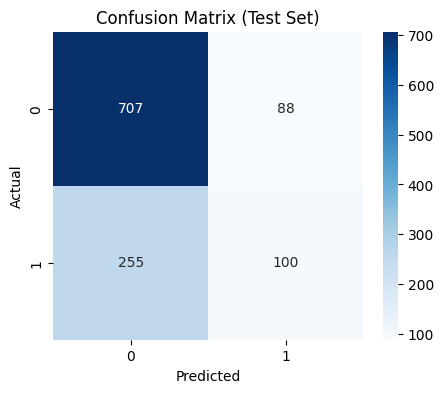

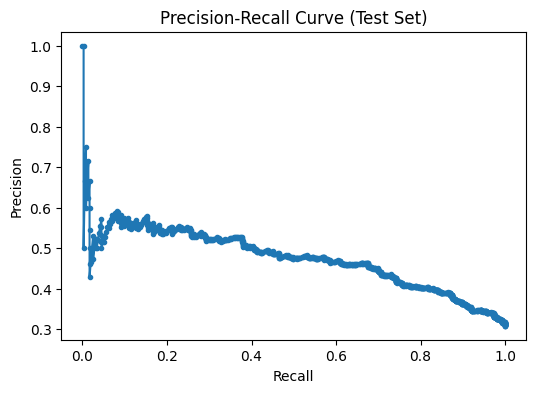

Metrics for Set6 at test size 0.37: {'accuracy': 0.7017391304347826, 'auc_pr': 0.4754519762265912, 'auc_roc': 0.6974895916378776}

Running Set6 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

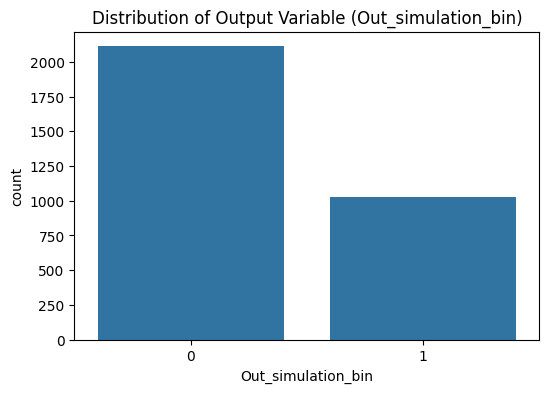


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    1
2867    1
2979    0
1259    1


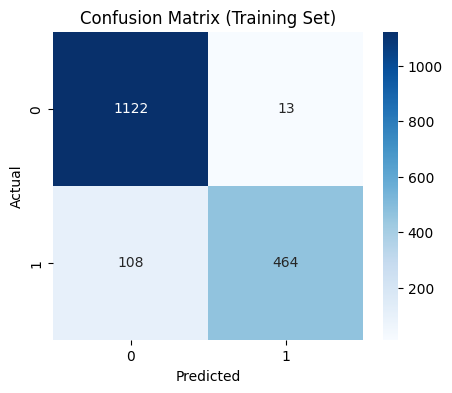

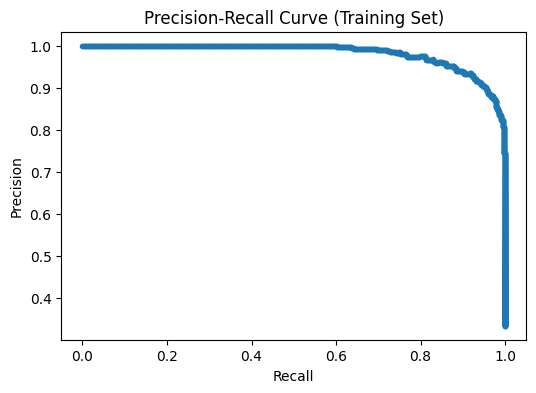


📊 Test Set Metrics:
Accuracy: 0.701
AUC-ROC: 0.688
AUC-PR: 0.472


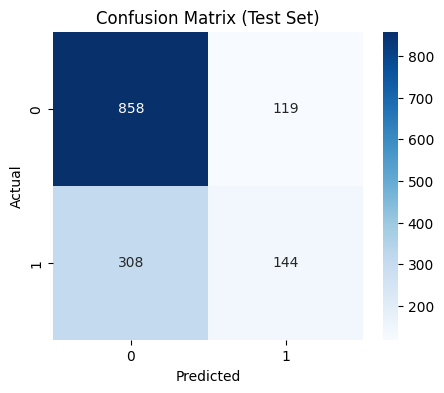

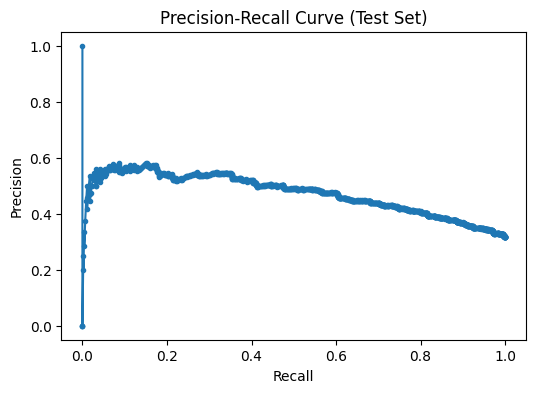

Metrics for Set6 at test size 0.46: {'accuracy': 0.7011896431070679, 'auc_pr': 0.4724141741197542, 'auc_roc': 0.6880757420675537}

Running Set6 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

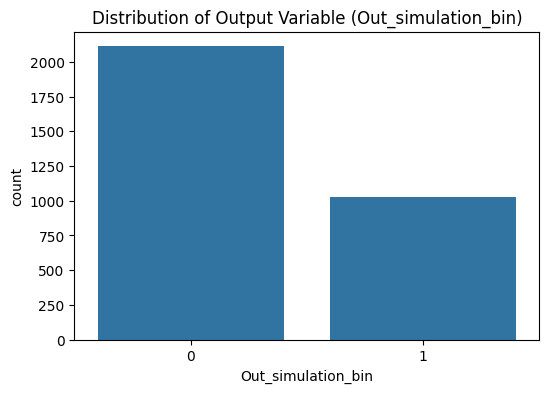


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     0
948     0
704     1
431     0


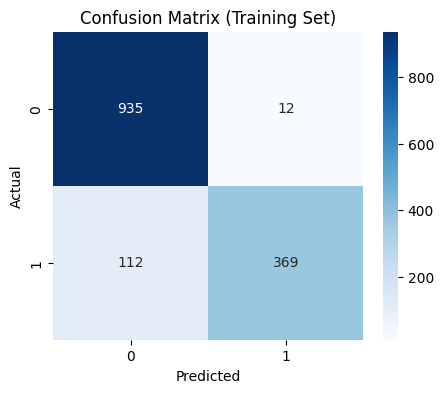

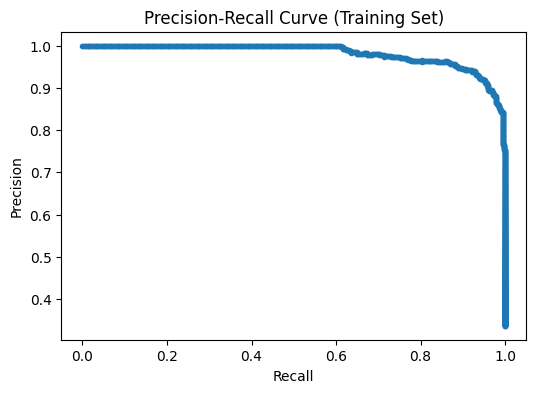


📊 Test Set Metrics:
Accuracy: 0.689
AUC-ROC: 0.674
AUC-PR: 0.467


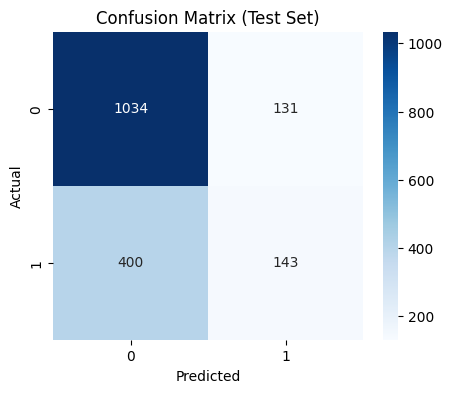

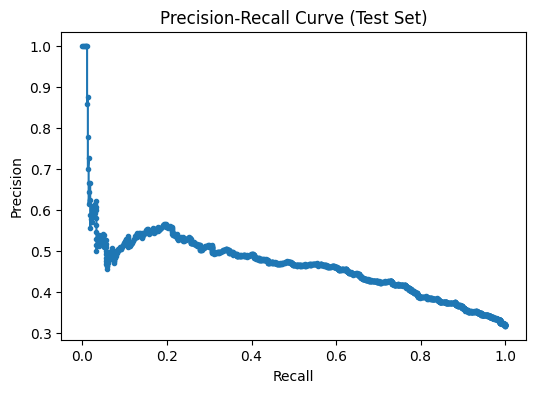

Metrics for Set6 at test size 0.54: {'accuracy': 0.6891100702576113, 'auc_pr': 0.46691415449023566, 'auc_roc': 0.6736521787241443}

Running Set6 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

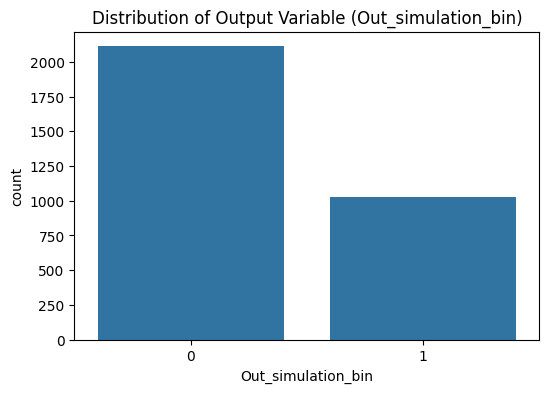


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    0
2310    1
592     0


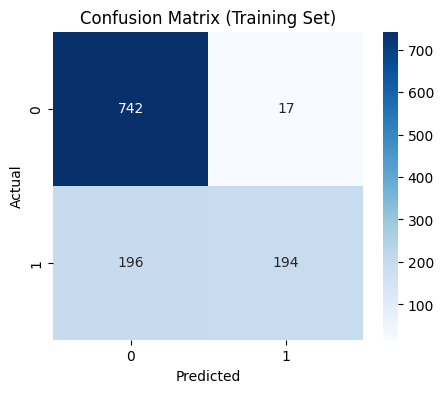

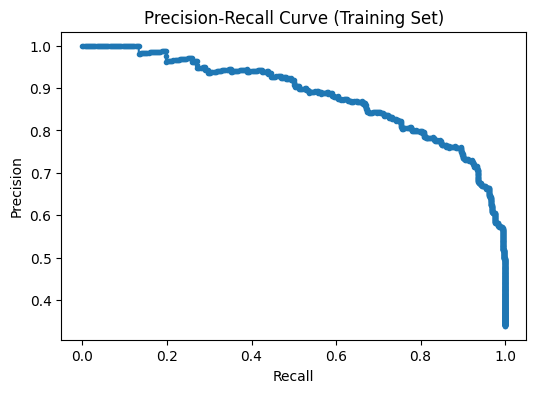


📊 Test Set Metrics:
Accuracy: 0.659
AUC-ROC: 0.633
AUC-PR: 0.413


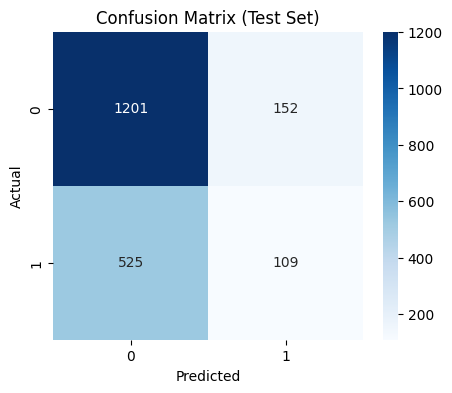

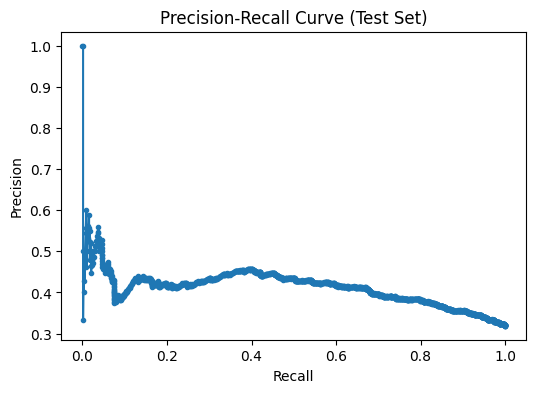

Metrics for Set6 at test size 0.63: {'accuracy': 0.6592853548062405, 'auc_pr': 0.4126990192088097, 'auc_roc': 0.6334853497660299}

Running Set6 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

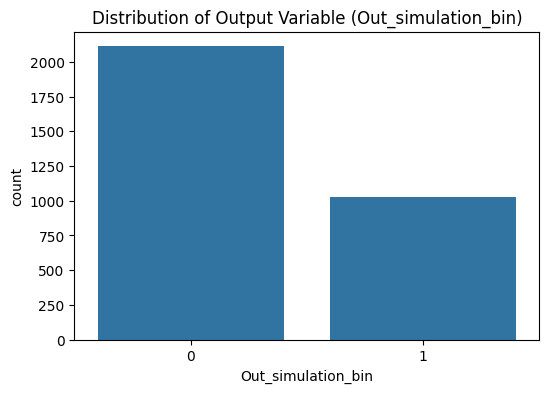


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    0
3       0
74      0
1755    0
4

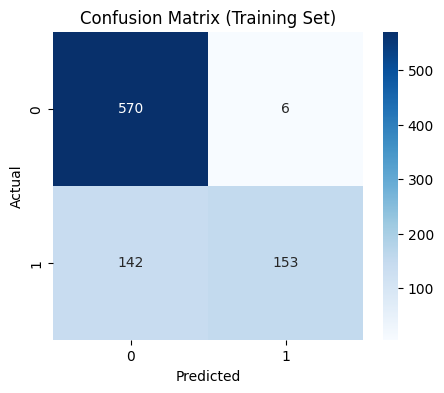

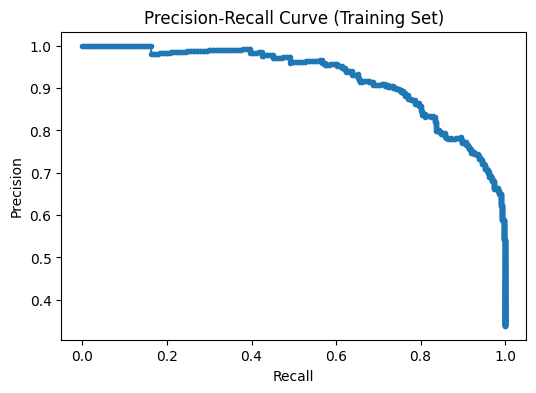


📊 Test Set Metrics:
Accuracy: 0.666
AUC-ROC: 0.606
AUC-PR: 0.401


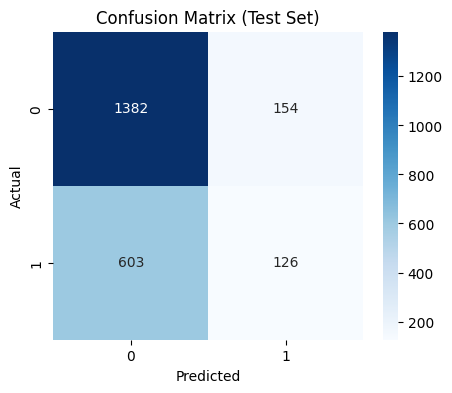

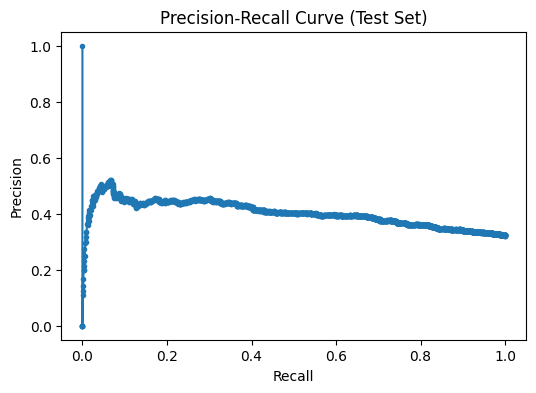

Metrics for Set6 at test size 0.72: {'accuracy': 0.6657836644591612, 'auc_pr': 0.4014316361052217, 'auc_roc': 0.6062349965706447}

Running Set6 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

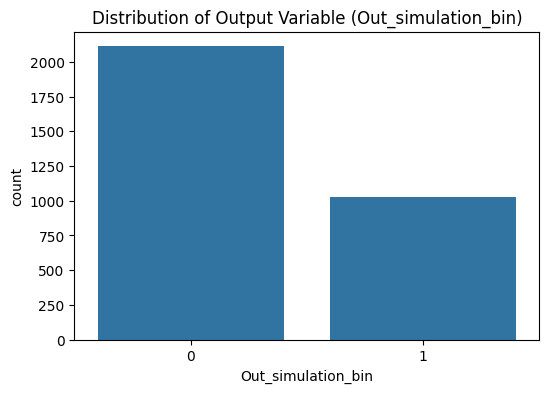


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    0
1324    1
216     0
510     1
1

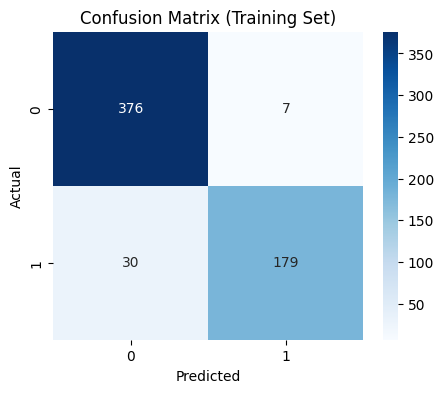

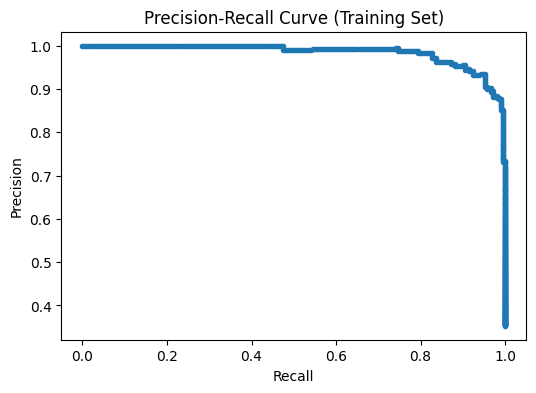


📊 Test Set Metrics:
Accuracy: 0.639
AUC-ROC: 0.591
AUC-PR: 0.391


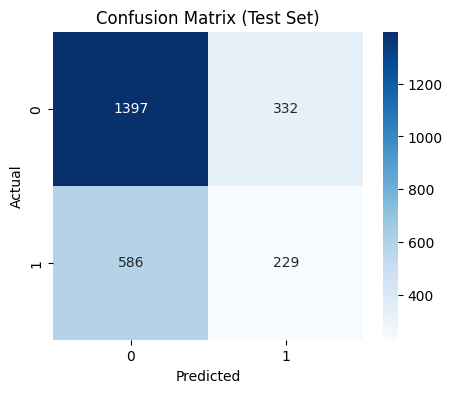

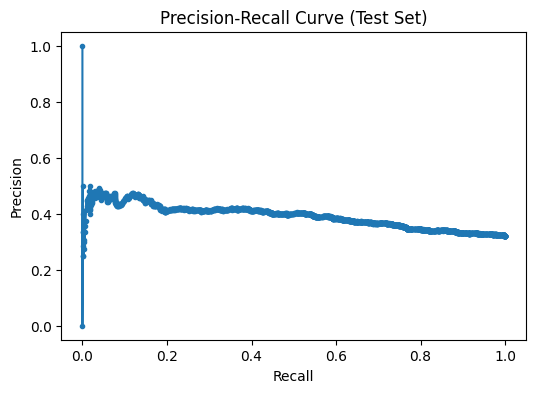

Metrics for Set6 at test size 0.81: {'accuracy': 0.6391509433962265, 'auc_pr': 0.3910916941963234, 'auc_roc': 0.5912989174209711}

Running Set6 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

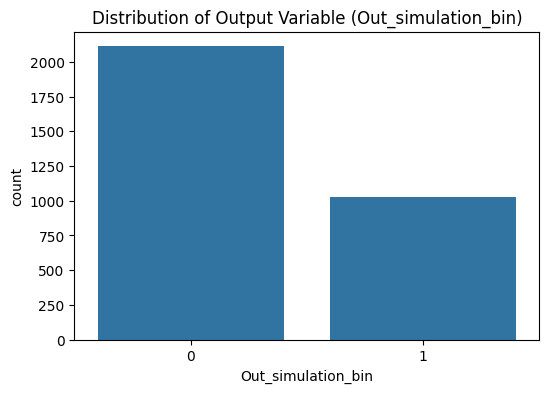


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   1
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   1
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set6 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    1
1    0
2    1
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    1
639     1
2907    0
1218    1
1

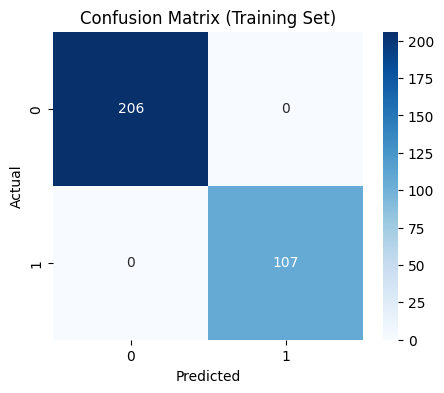

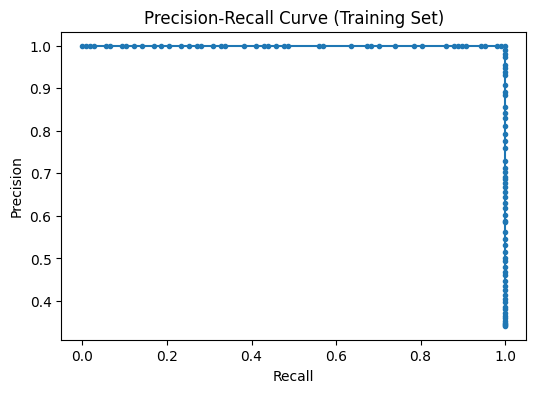


📊 Test Set Metrics:
Accuracy: 0.635
AUC-ROC: 0.575
AUC-PR: 0.390


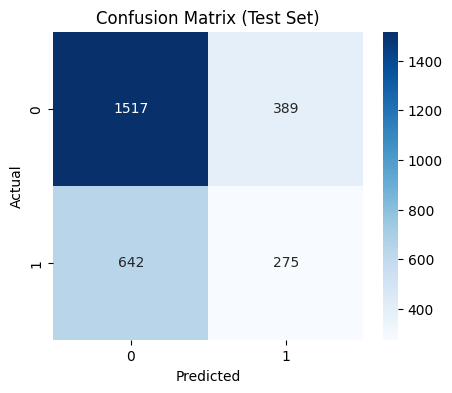

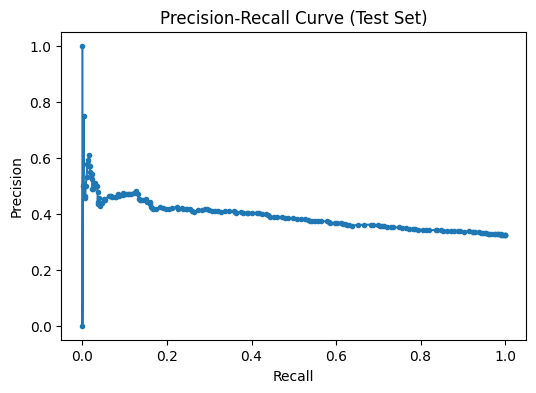

Metrics for Set6 at test size 0.90: {'accuracy': 0.6347856889833511, 'auc_pr': 0.3897143904587881, 'auc_roc': 0.5745893985703187}

Running Set7 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

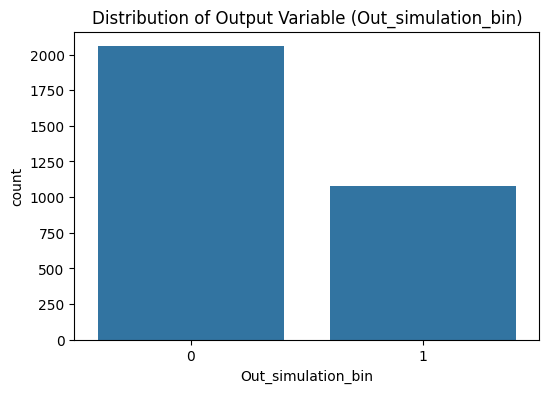


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    1
2955    1
2396    0
2555    0
2

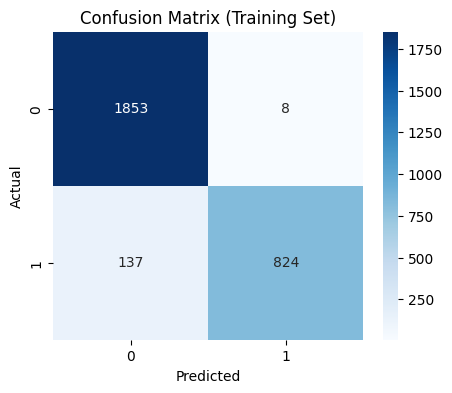

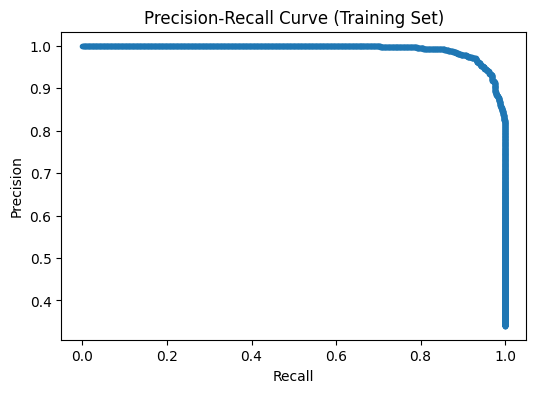


📊 Test Set Metrics:
Accuracy: 0.736
AUC-ROC: 0.807
AUC-PR: 0.717


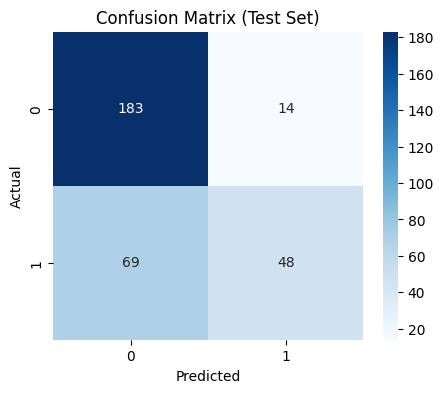

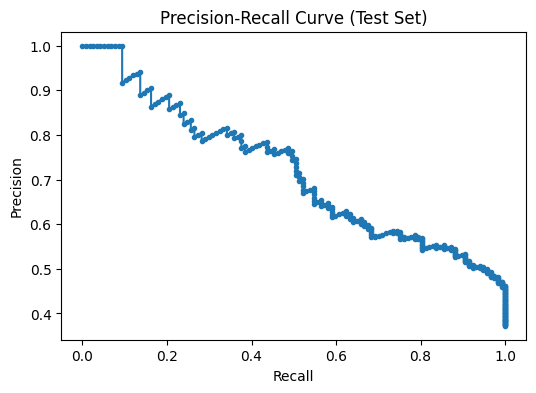

Metrics for Set7 at test size 0.10: {'accuracy': 0.7356687898089171, 'auc_pr': 0.7174372307390067, 'auc_roc': 0.807280142305523}

Running Set7 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

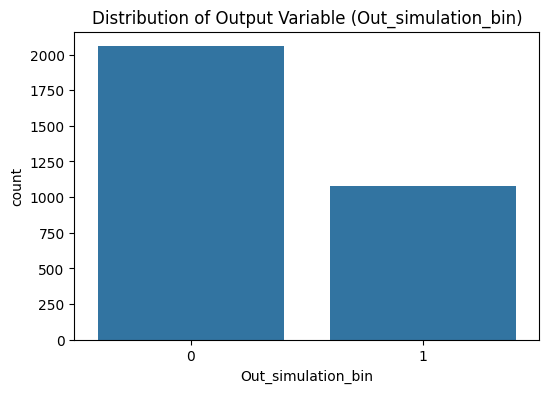


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    1
22      1
1161    0
1

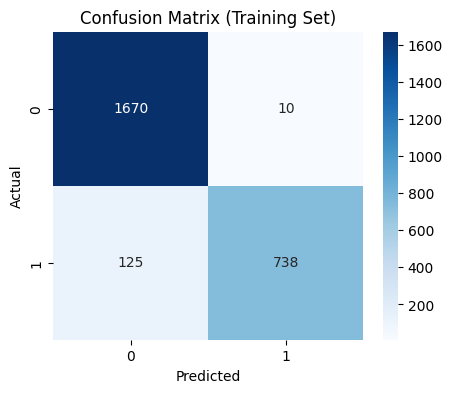

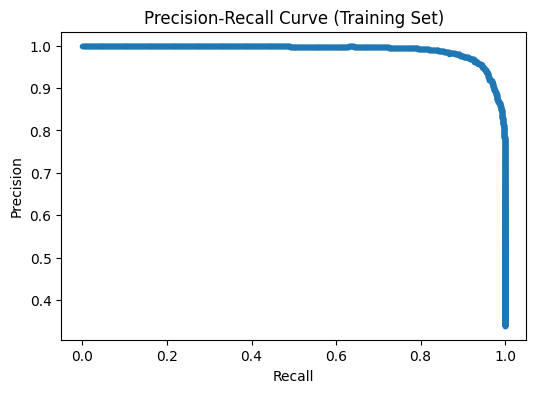


📊 Test Set Metrics:
Accuracy: 0.754
AUC-ROC: 0.819
AUC-PR: 0.736


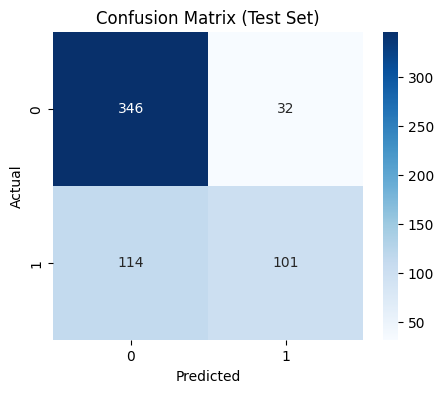

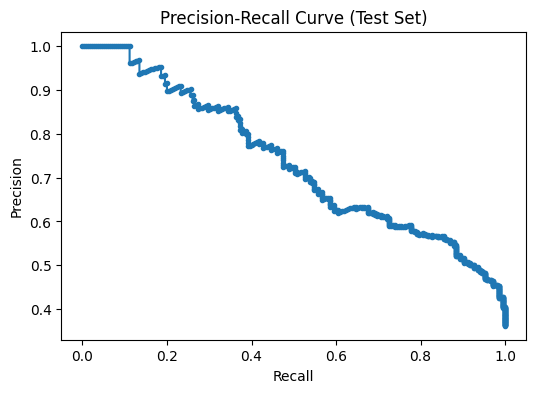

Metrics for Set7 at test size 0.19: {'accuracy': 0.7537942664418212, 'auc_pr': 0.735853335791028, 'auc_roc': 0.8193798449612404}

Running Set7 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

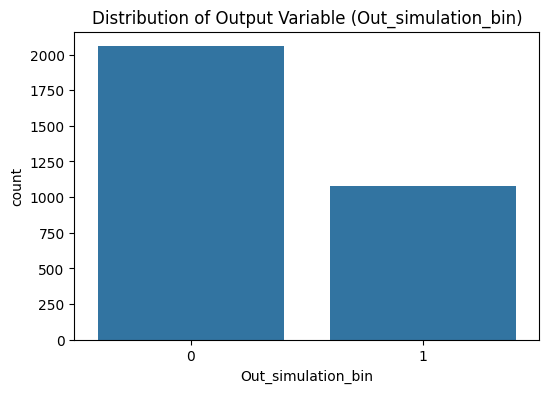


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    1
109     1
2057    1
781     1
2

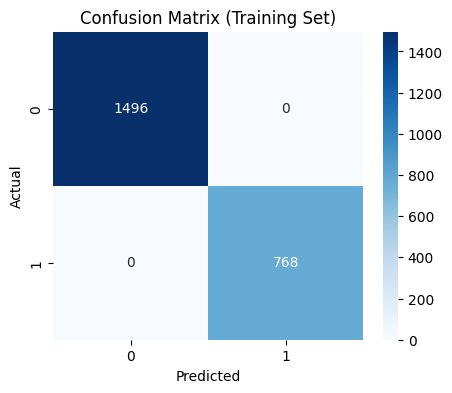

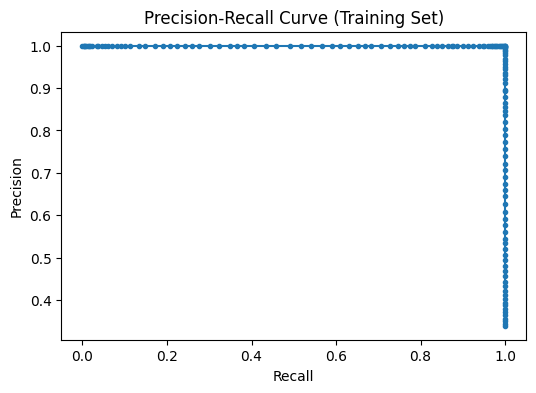


📊 Test Set Metrics:
Accuracy: 0.756
AUC-ROC: 0.805
AUC-PR: 0.687


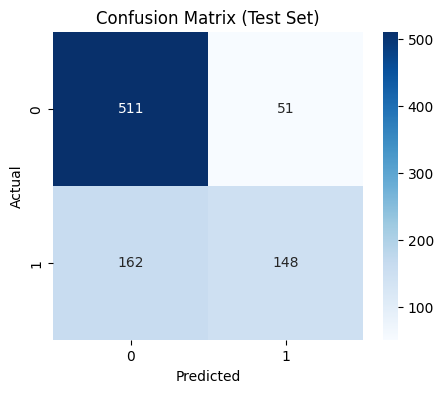

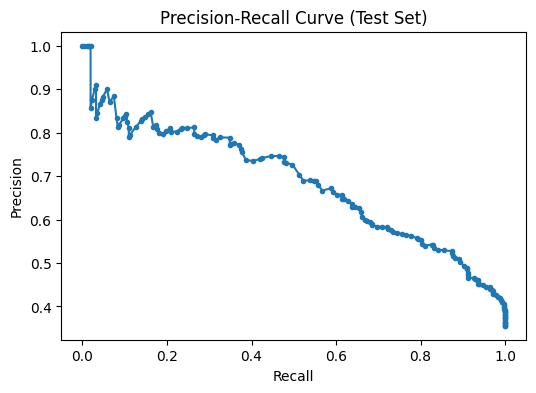

Metrics for Set7 at test size 0.28: {'accuracy': 0.7557339449541285, 'auc_pr': 0.6872328598720698, 'auc_roc': 0.8049018482378602}

Running Set7 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

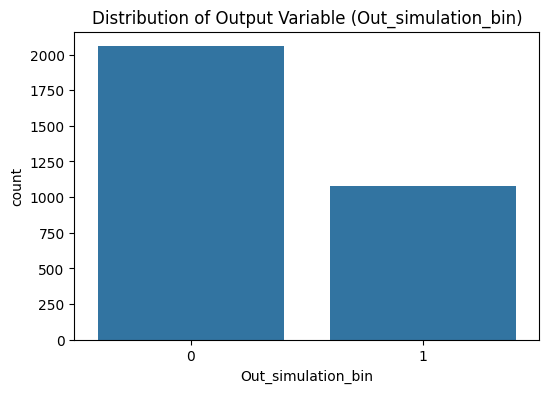


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    0
1811    1
1099    0


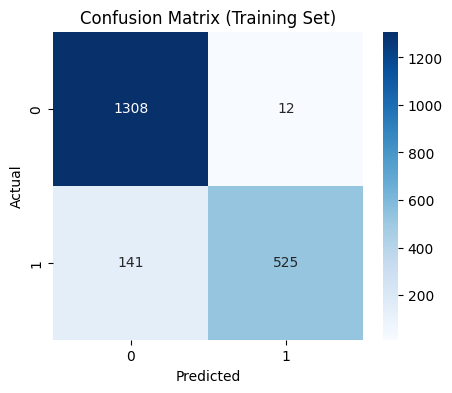

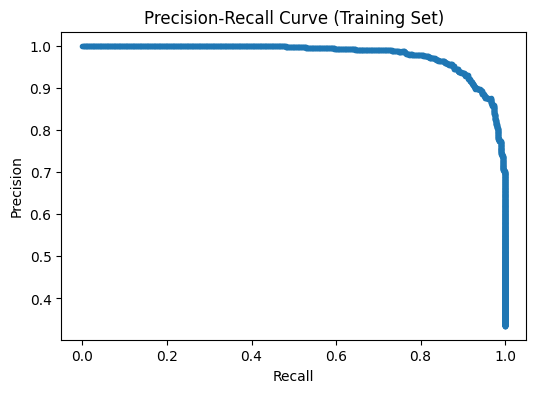


📊 Test Set Metrics:
Accuracy: 0.717
AUC-ROC: 0.757
AUC-PR: 0.639


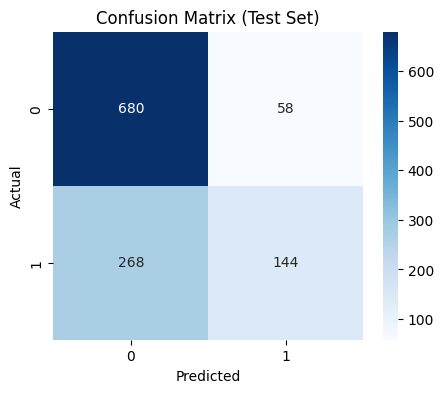

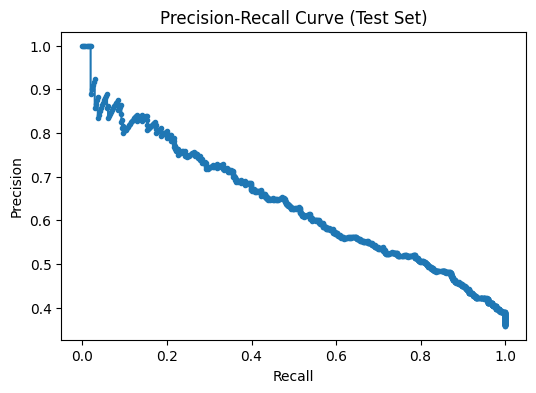

Metrics for Set7 at test size 0.37: {'accuracy': 0.7165217391304348, 'auc_pr': 0.6393018571882986, 'auc_roc': 0.7571006656668509}

Running Set7 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

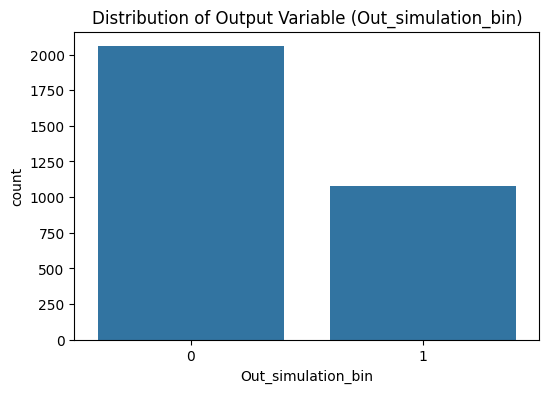


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    0
2867    0
2979    1
1259    1


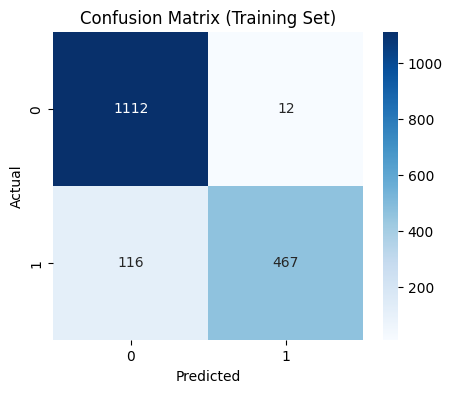

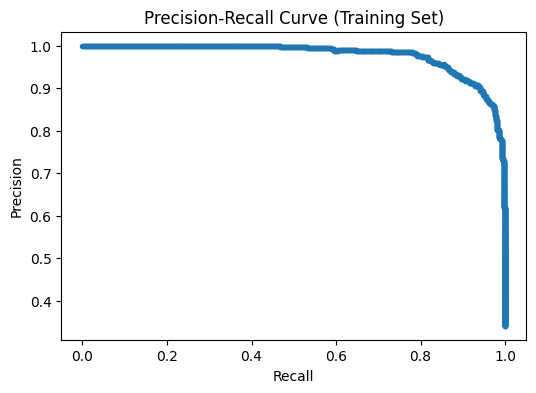


📊 Test Set Metrics:
Accuracy: 0.735
AUC-ROC: 0.763
AUC-PR: 0.633


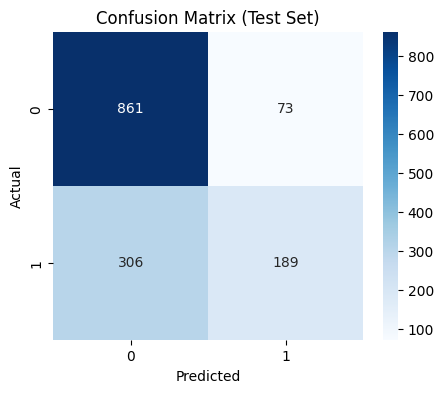

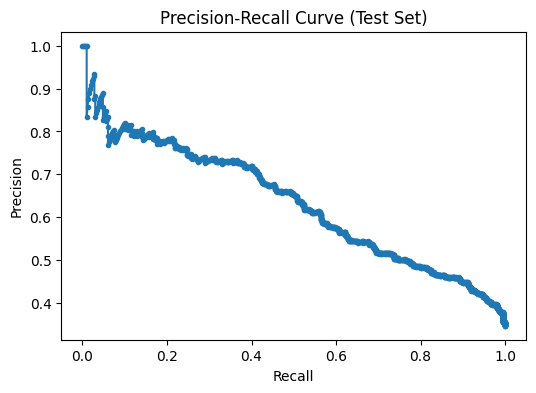

Metrics for Set7 at test size 0.46: {'accuracy': 0.7347795661301609, 'auc_pr': 0.6330791583581367, 'auc_roc': 0.7625462332100448}

Running Set7 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

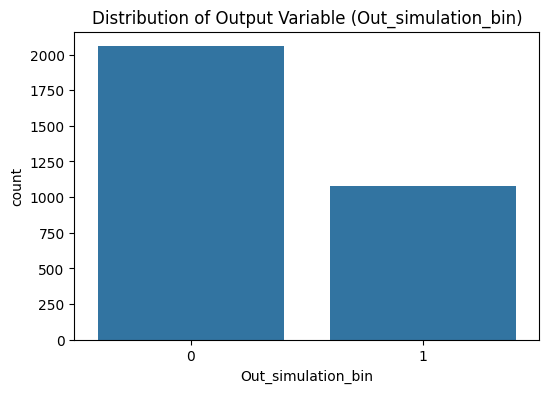


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     0
948     0
704     1
431     1


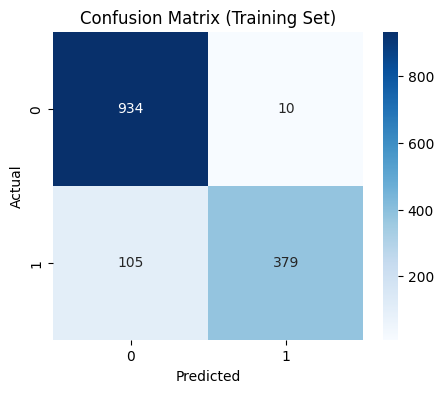

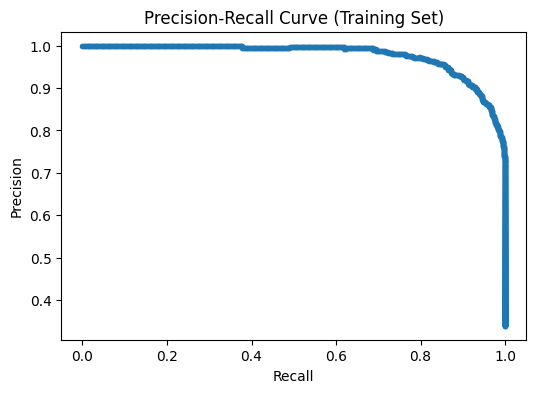


📊 Test Set Metrics:
Accuracy: 0.707
AUC-ROC: 0.733
AUC-PR: 0.594


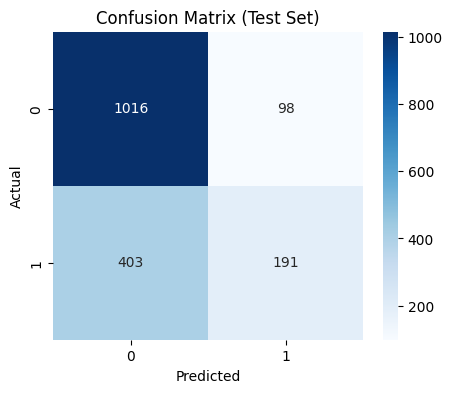

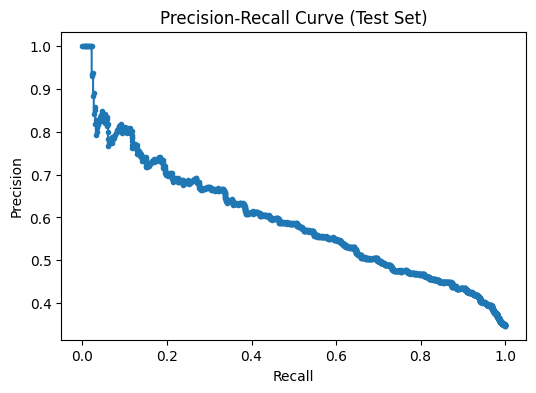

Metrics for Set7 at test size 0.54: {'accuracy': 0.7066744730679156, 'auc_pr': 0.5938812387727908, 'auc_roc': 0.732558983007816}

Running Set7 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

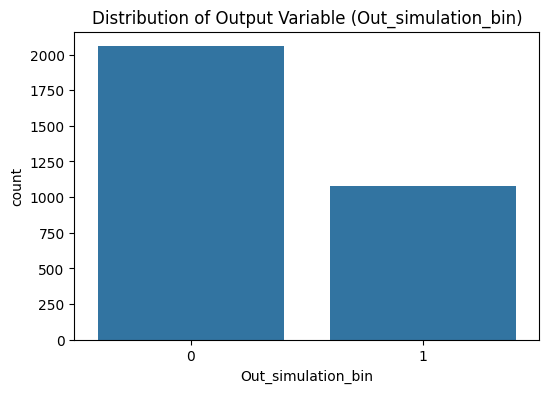


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    0
2310    1
592     1


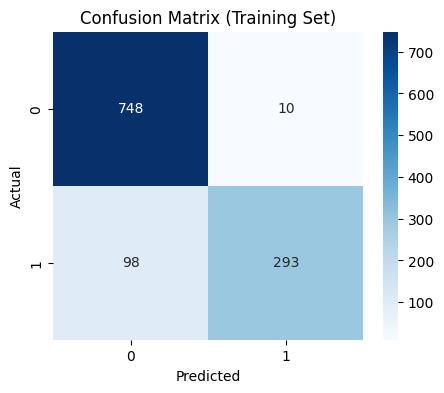

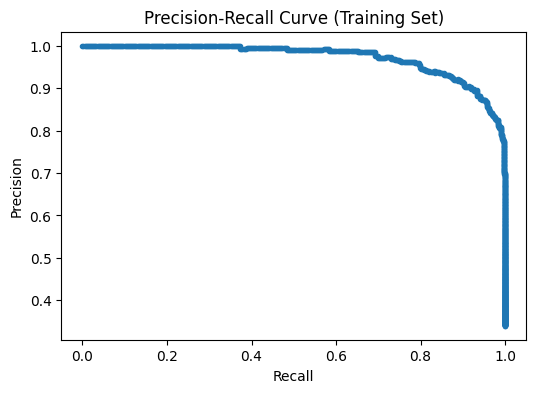


📊 Test Set Metrics:
Accuracy: 0.684
AUC-ROC: 0.697
AUC-PR: 0.550


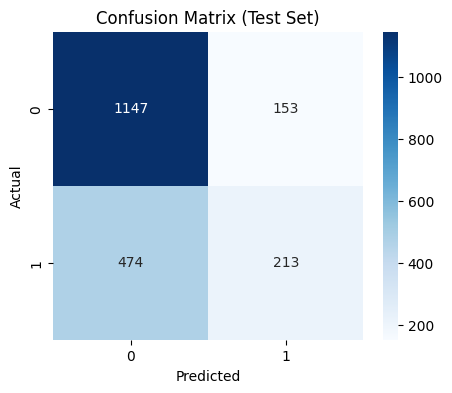

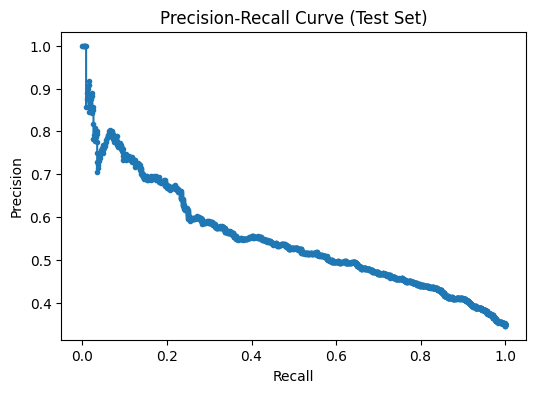

Metrics for Set7 at test size 0.63: {'accuracy': 0.6844489179667841, 'auc_pr': 0.5495173753983652, 'auc_roc': 0.6970876721531744}

Running Set7 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

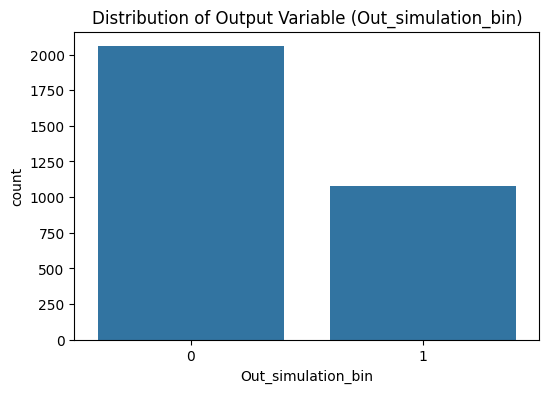


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    0
3       1
74      0
1755    1
4

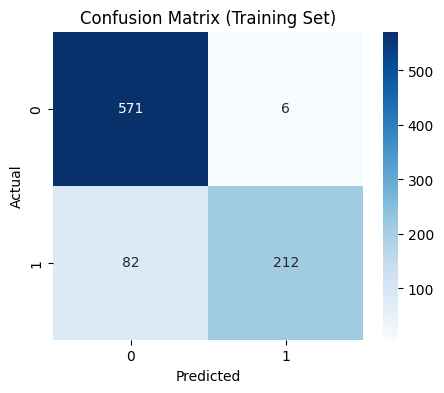

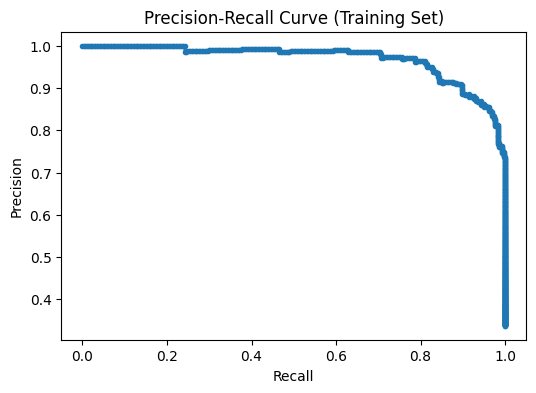


📊 Test Set Metrics:
Accuracy: 0.672
AUC-ROC: 0.679
AUC-PR: 0.509


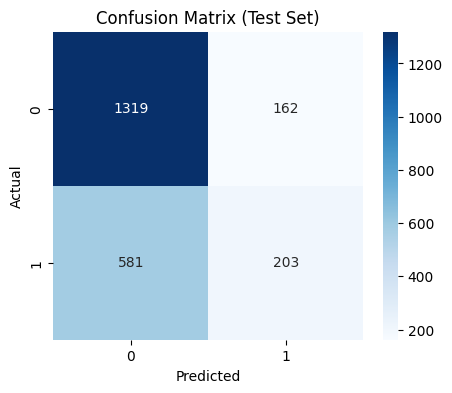

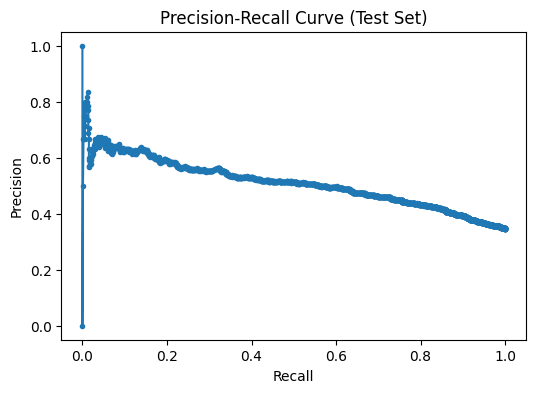

Metrics for Set7 at test size 0.72: {'accuracy': 0.6719646799116997, 'auc_pr': 0.5092253441592467, 'auc_roc': 0.6787479846766525}

Running Set7 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

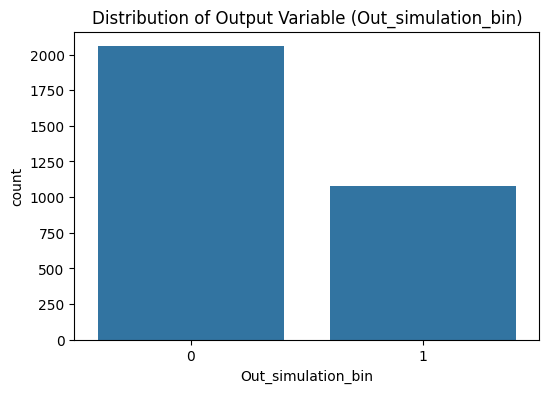


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    0
1324    0
216     0
510     1
1

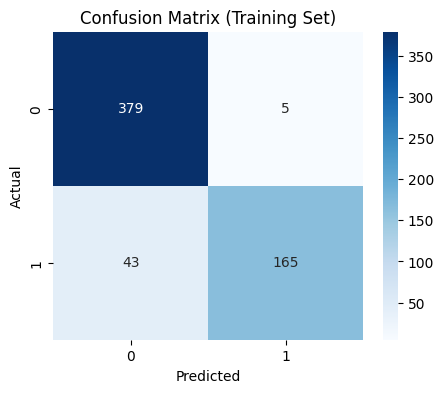

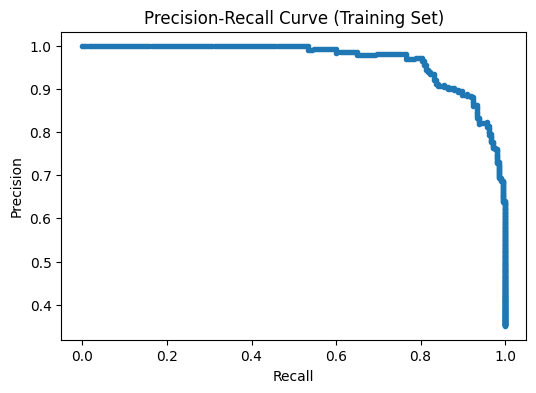


📊 Test Set Metrics:
Accuracy: 0.662
AUC-ROC: 0.637
AUC-PR: 0.448


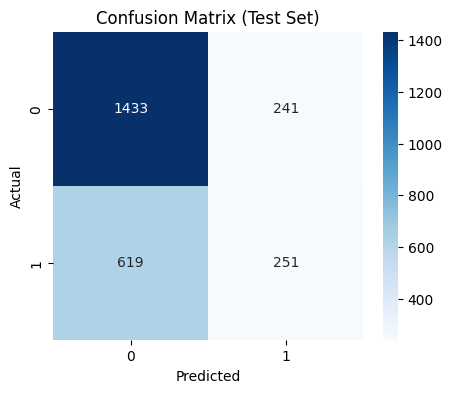

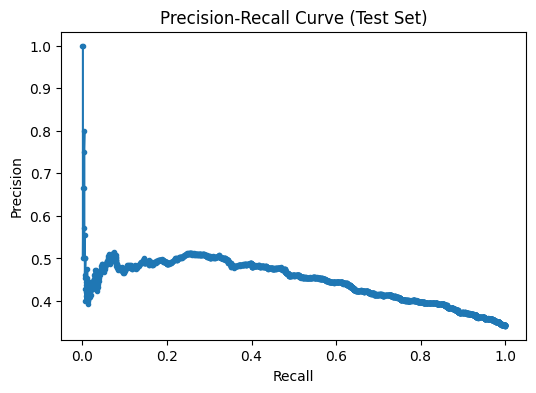

Metrics for Set7 at test size 0.81: {'accuracy': 0.6619496855345912, 'auc_pr': 0.4480765878521757, 'auc_roc': 0.6374562270835908}

Running Set7 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

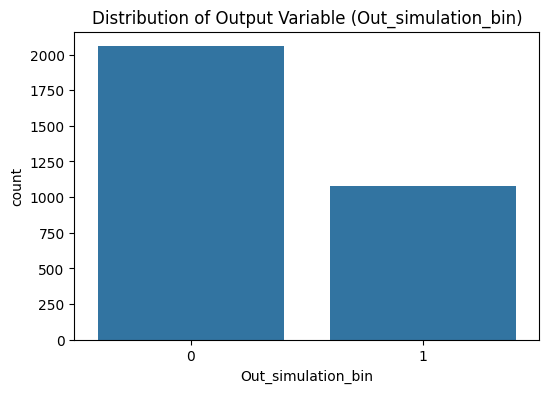


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set7 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     0
2907    0
1218    0
1

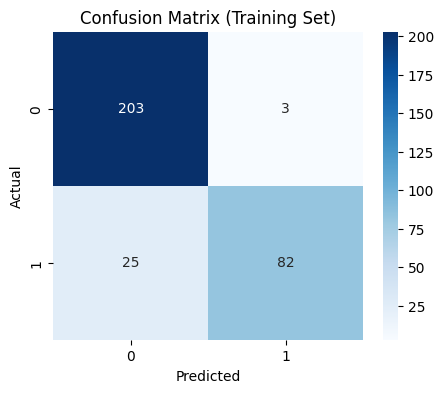

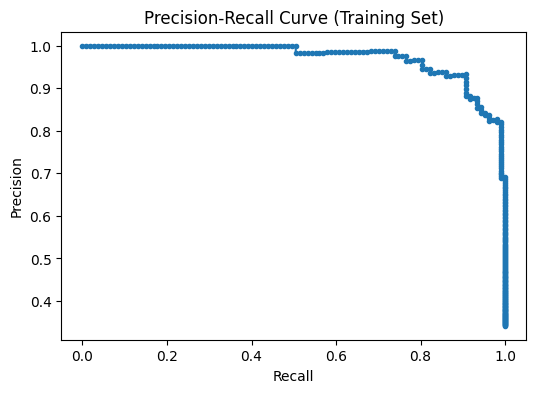


📊 Test Set Metrics:
Accuracy: 0.645
AUC-ROC: 0.607
AUC-PR: 0.430


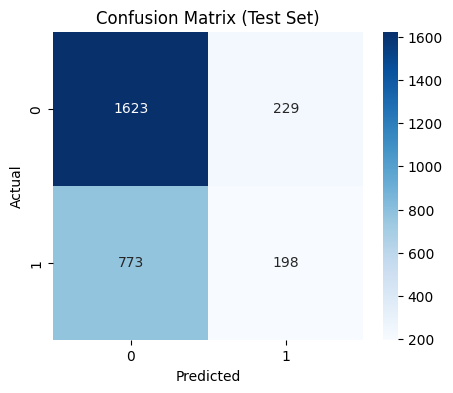

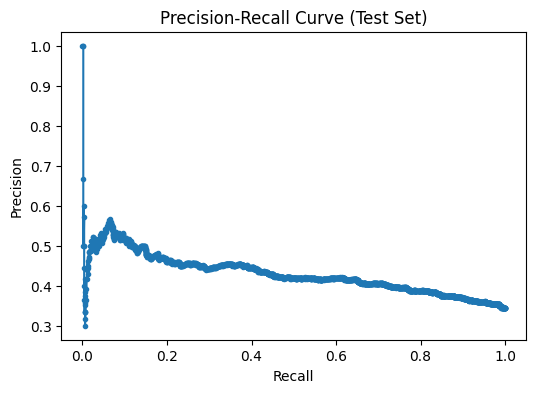

Metrics for Set7 at test size 0.90: {'accuracy': 0.6450584484590861, 'auc_pr': 0.42973767462716495, 'auc_roc': 0.6074091415632167}

Running Set8 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

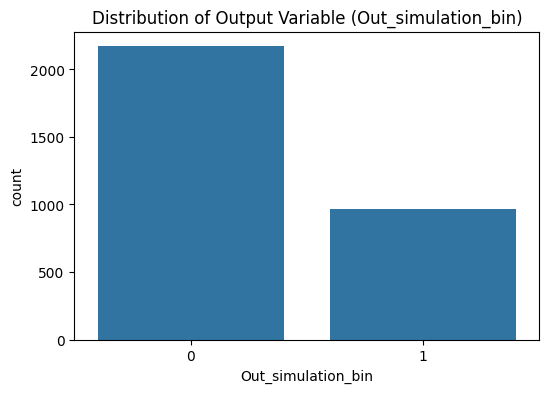


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    1
2955    0
2396    0
2555    0
2

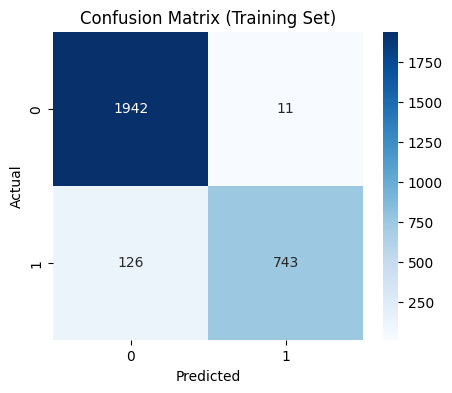

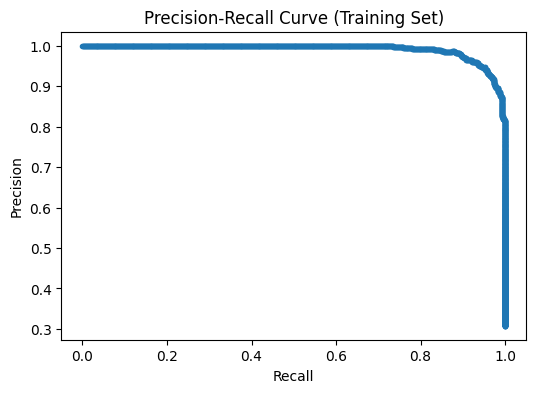


📊 Test Set Metrics:
Accuracy: 0.809
AUC-ROC: 0.806
AUC-PR: 0.701


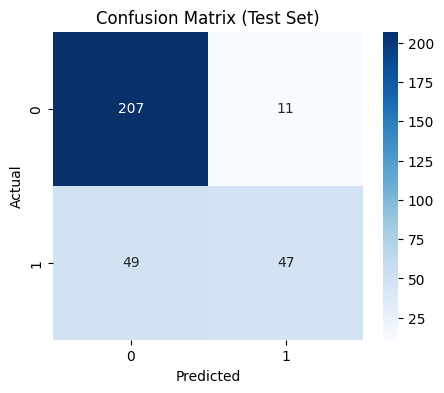

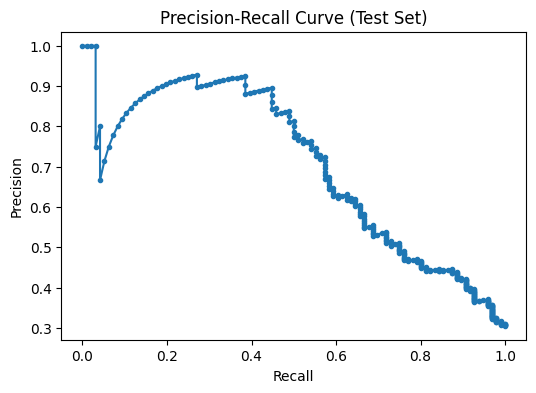

Metrics for Set8 at test size 0.10: {'accuracy': 0.8089171974522293, 'auc_pr': 0.7008708552963883, 'auc_roc': 0.8056670489296636}

Running Set8 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

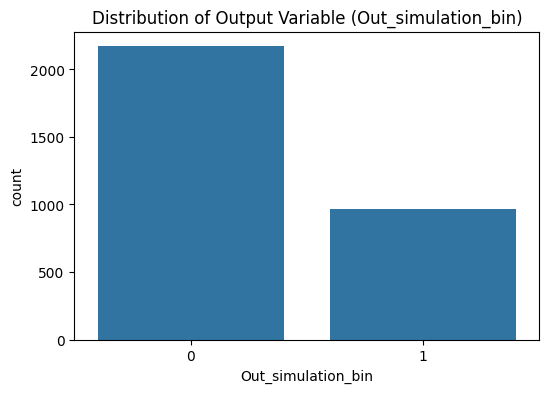


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      1
2619    0
22      0
1161    0
1

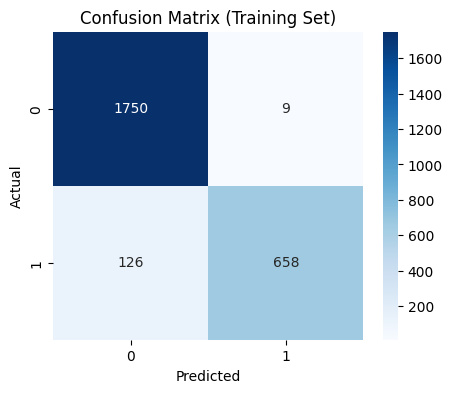

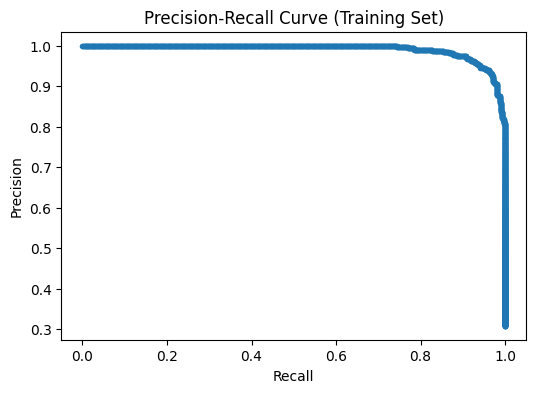


📊 Test Set Metrics:
Accuracy: 0.791
AUC-ROC: 0.830
AUC-PR: 0.699


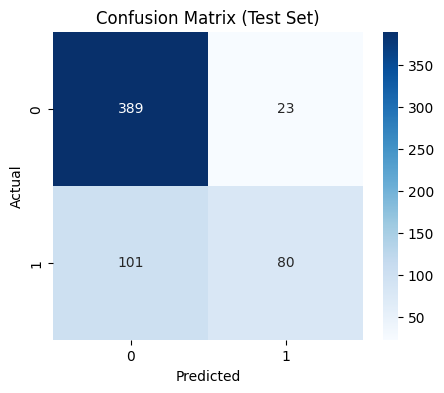

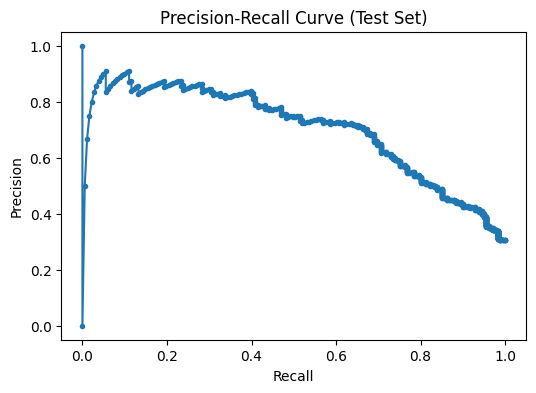

Metrics for Set8 at test size 0.19: {'accuracy': 0.790893760539629, 'auc_pr': 0.6994180730837062, 'auc_roc': 0.8303518746982782}

Running Set8 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

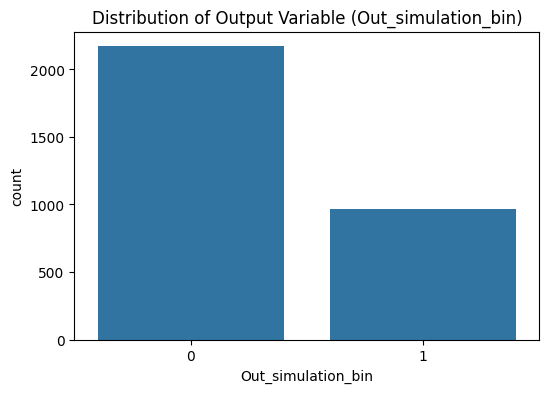


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     1
2057    0
781     0
2

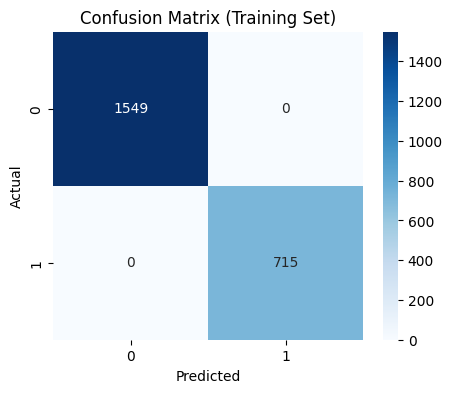

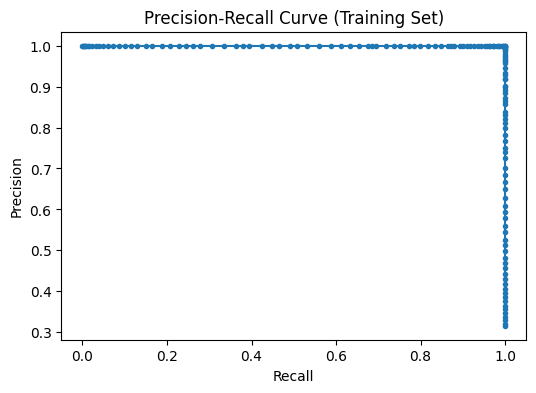


📊 Test Set Metrics:
Accuracy: 0.787
AUC-ROC: 0.813
AUC-PR: 0.643


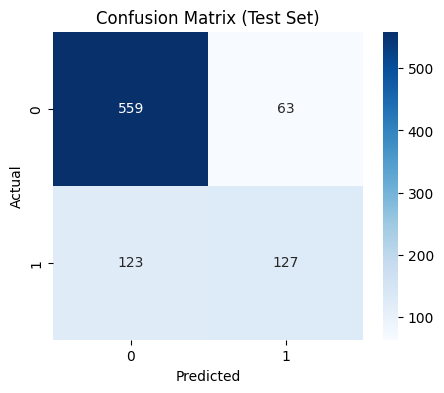

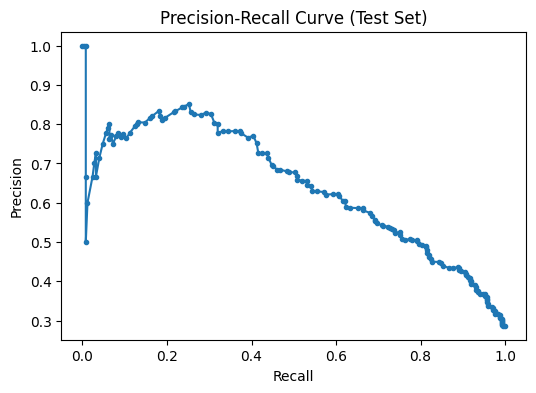

Metrics for Set8 at test size 0.28: {'accuracy': 0.786697247706422, 'auc_pr': 0.6429665399480282, 'auc_roc': 0.8129549839228296}

Running Set8 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

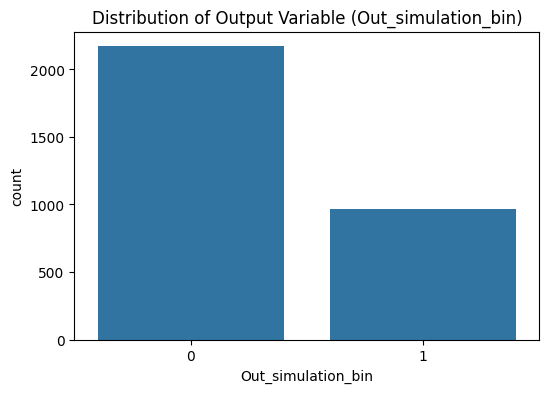


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    0
1811    0
1099    1


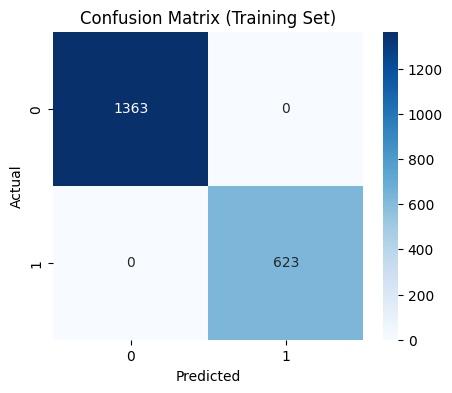

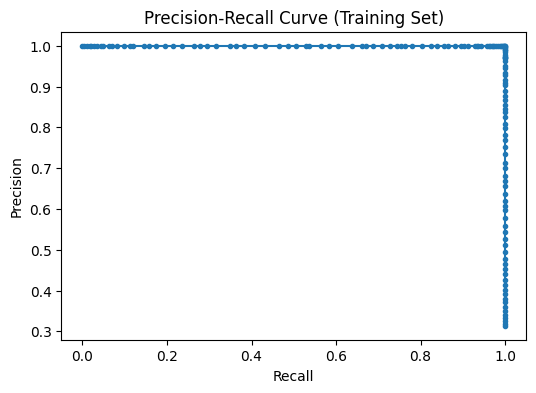


📊 Test Set Metrics:
Accuracy: 0.766
AUC-ROC: 0.793
AUC-PR: 0.627


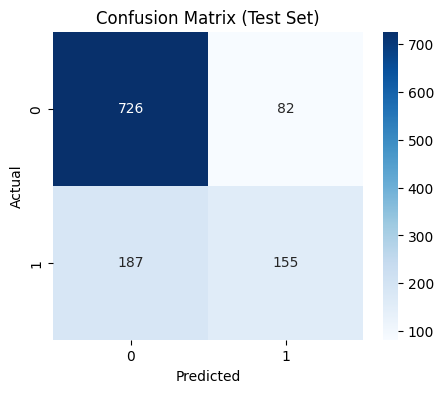

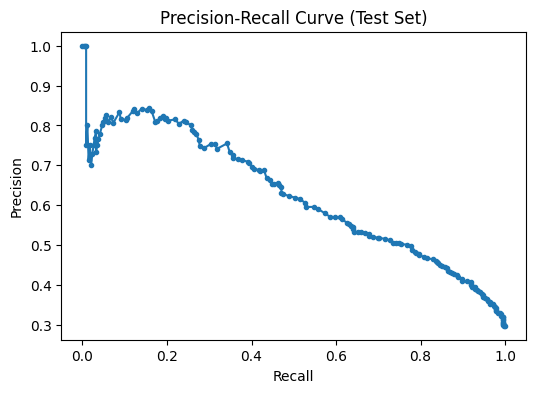

Metrics for Set8 at test size 0.37: {'accuracy': 0.7660869565217391, 'auc_pr': 0.6265116222742736, 'auc_roc': 0.7933656852527358}

Running Set8 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

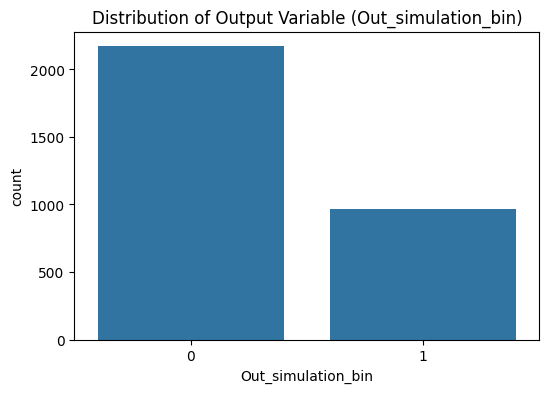


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    1
2867    0
2979    0
1259    0


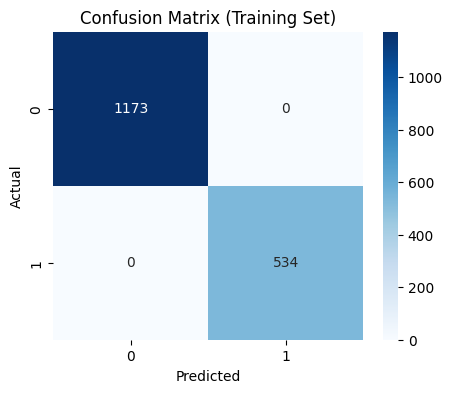

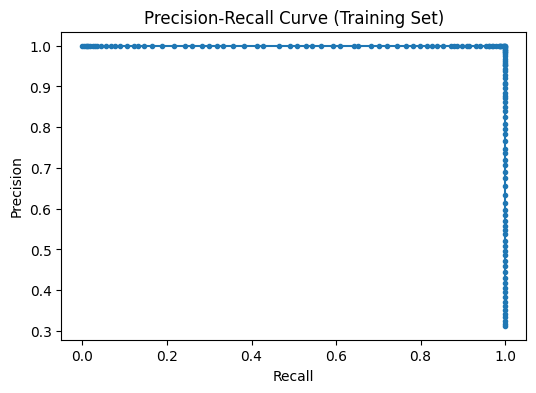


📊 Test Set Metrics:
Accuracy: 0.746
AUC-ROC: 0.758
AUC-PR: 0.574


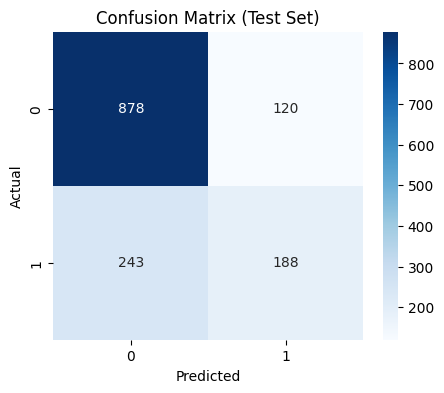

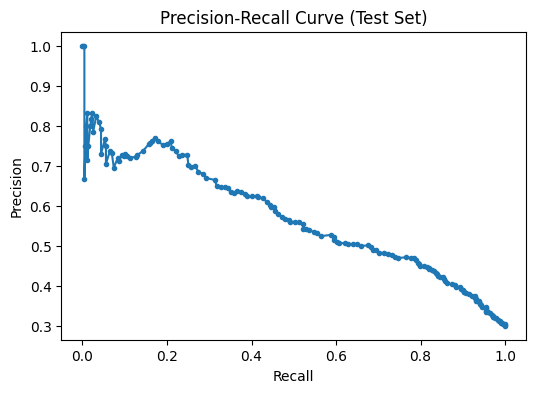

Metrics for Set8 at test size 0.46: {'accuracy': 0.7459762071378586, 'auc_pr': 0.5740037427272616, 'auc_roc': 0.7575487401717589}

Running Set8 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

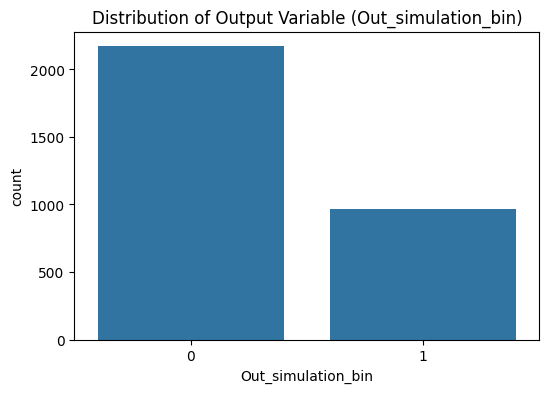


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     1
948     0
704     0
431     0


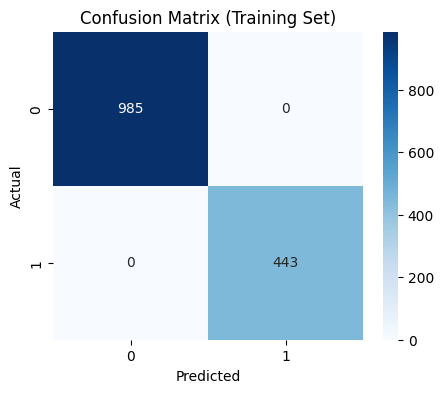

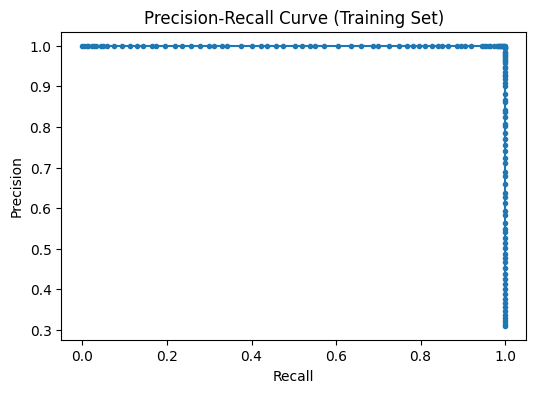


📊 Test Set Metrics:
Accuracy: 0.731
AUC-ROC: 0.745
AUC-PR: 0.533


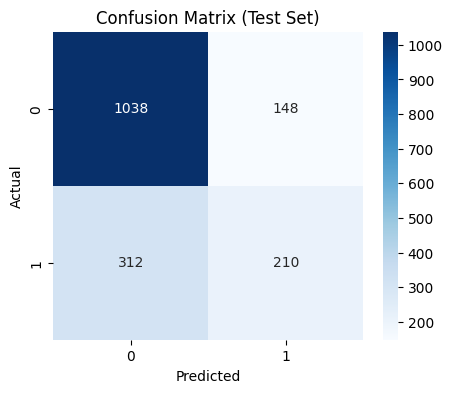

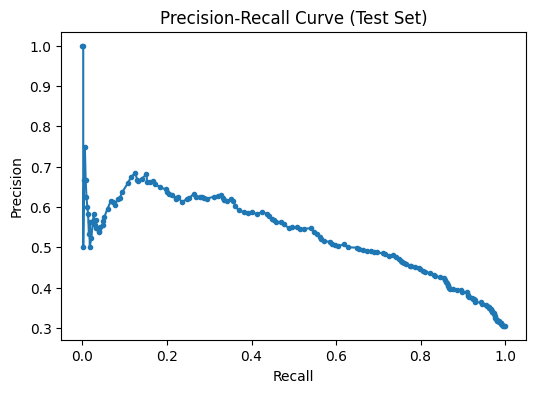

Metrics for Set8 at test size 0.54: {'accuracy': 0.7306791569086651, 'auc_pr': 0.5331730950591843, 'auc_roc': 0.7451525782920794}

Running Set8 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

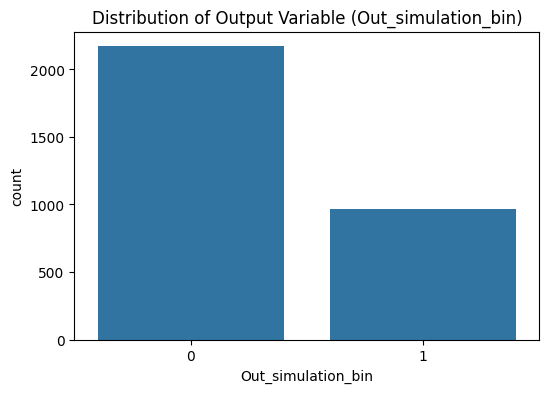


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    0
2310    0
592     0


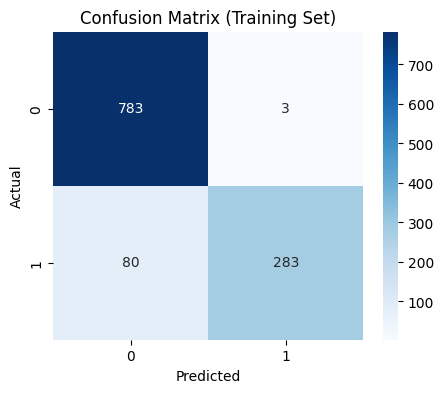

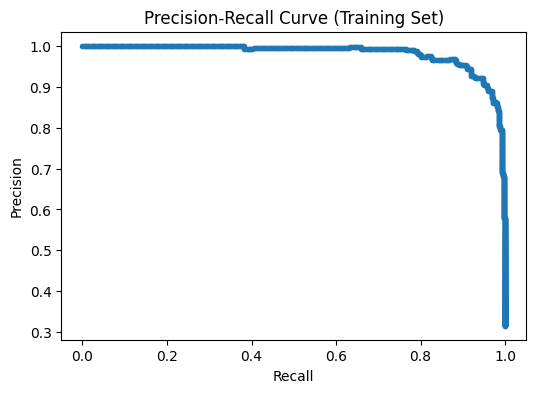


📊 Test Set Metrics:
Accuracy: 0.714
AUC-ROC: 0.709
AUC-PR: 0.486


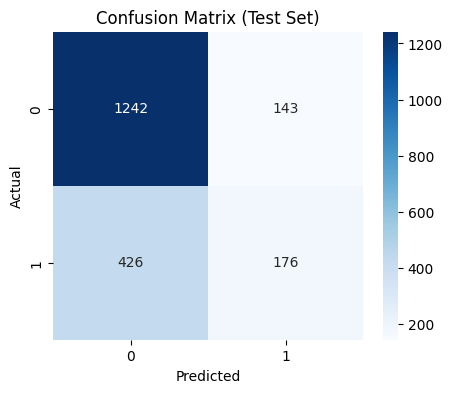

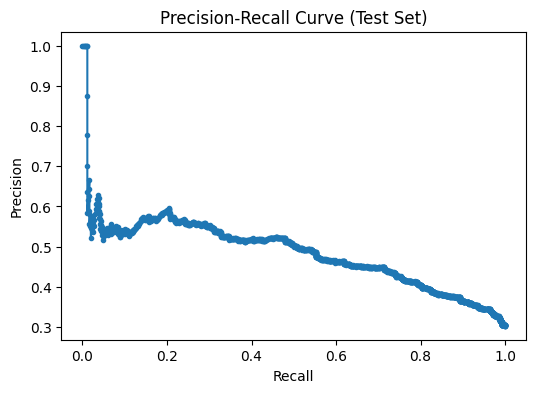

Metrics for Set8 at test size 0.63: {'accuracy': 0.7136386512330146, 'auc_pr': 0.48565118435645127, 'auc_roc': 0.7085725080058048}

Running Set8 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

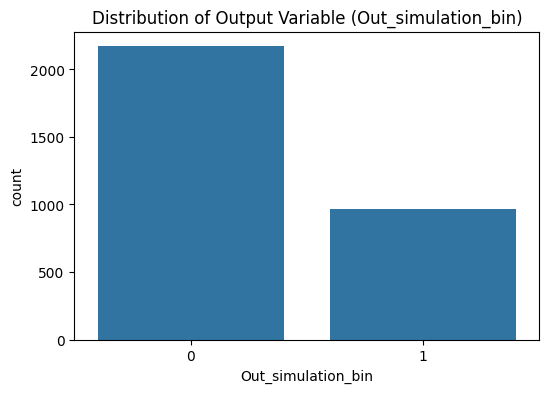


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    1
3       0
74      0
1755    0
4

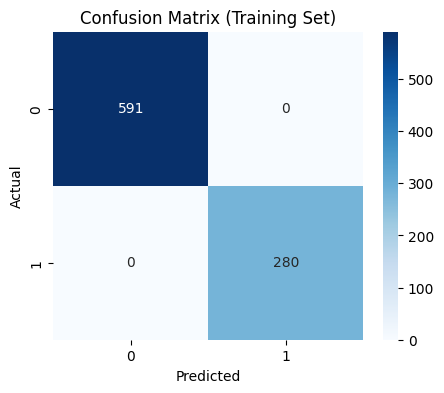

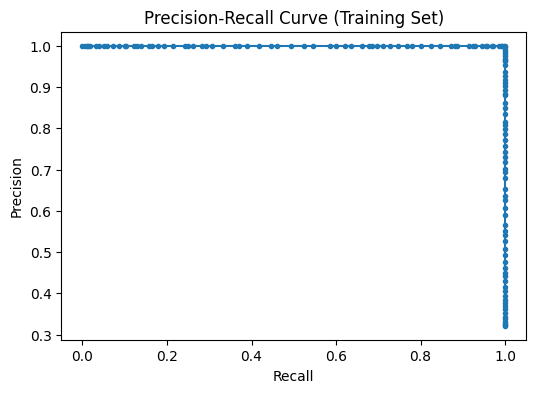


📊 Test Set Metrics:
Accuracy: 0.698
AUC-ROC: 0.690
AUC-PR: 0.470


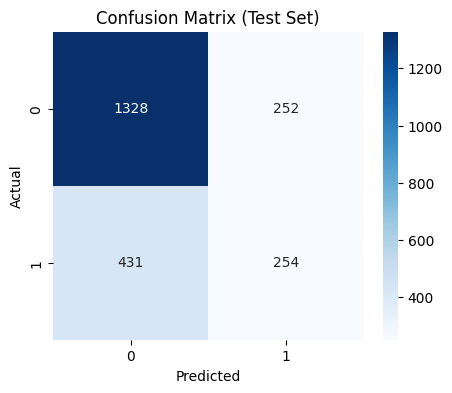

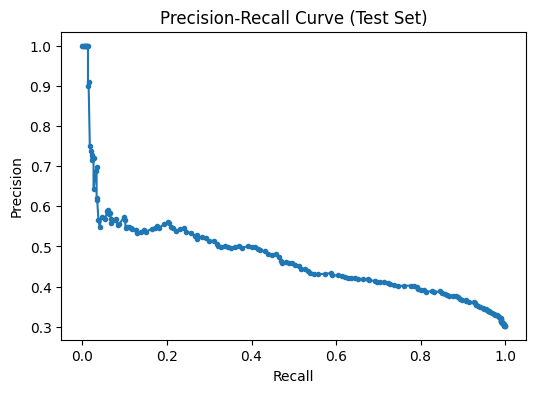

Metrics for Set8 at test size 0.72: {'accuracy': 0.6984547461368653, 'auc_pr': 0.4703506119690526, 'auc_roc': 0.6899136099048324}

Running Set8 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

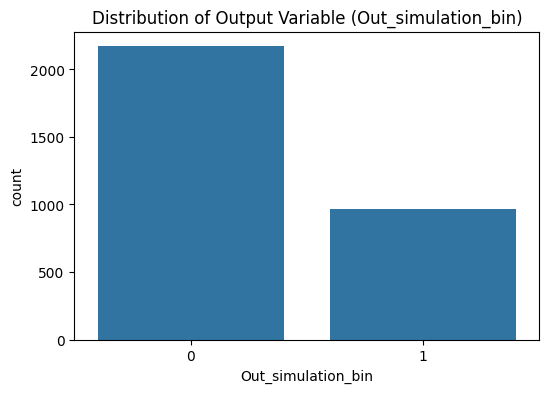


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    0
1324    0
216     0
510     0
1

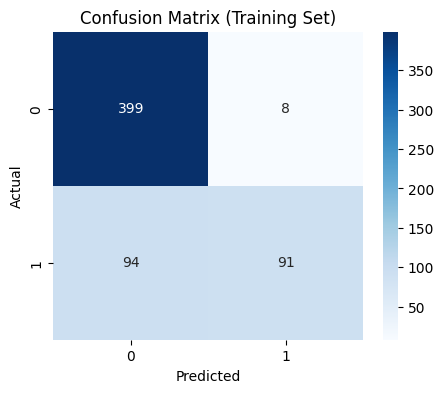

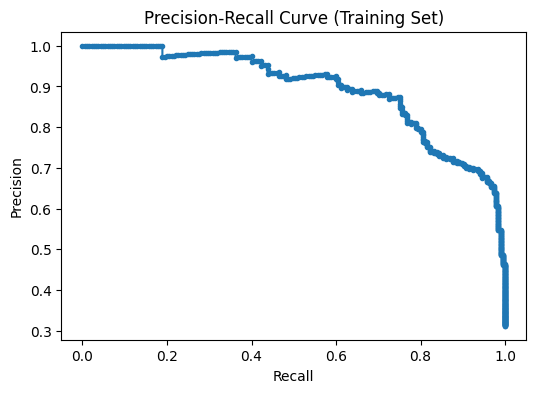


📊 Test Set Metrics:
Accuracy: 0.688
AUC-ROC: 0.655
AUC-PR: 0.419


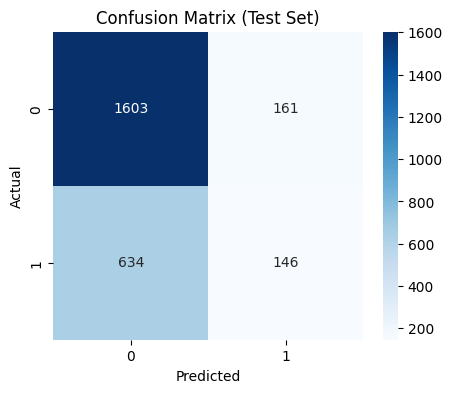

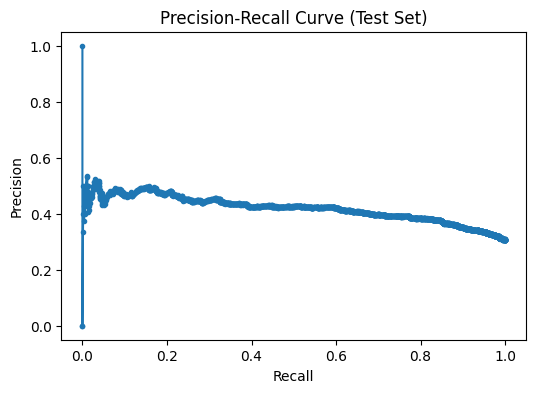

Metrics for Set8 at test size 0.81: {'accuracy': 0.6875, 'auc_pr': 0.41904154596419113, 'auc_roc': 0.6545540438397581}

Running Set8 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1           R2  Ou

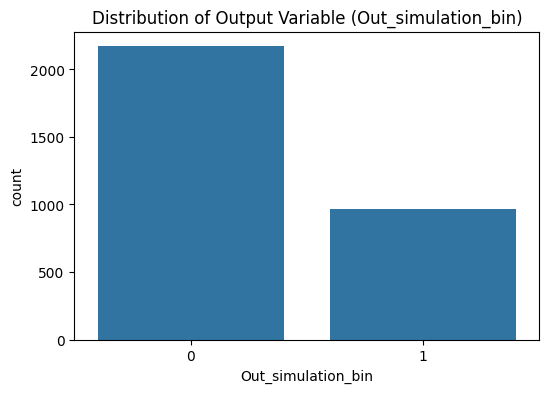


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set8 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     1
2907    0
1218    0
1

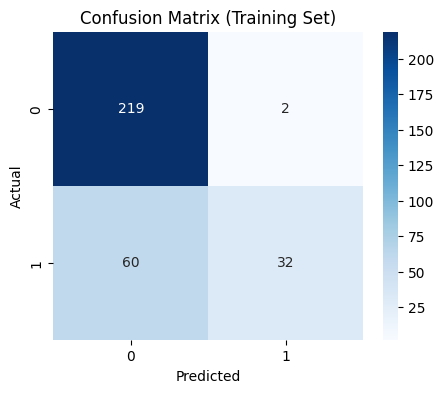

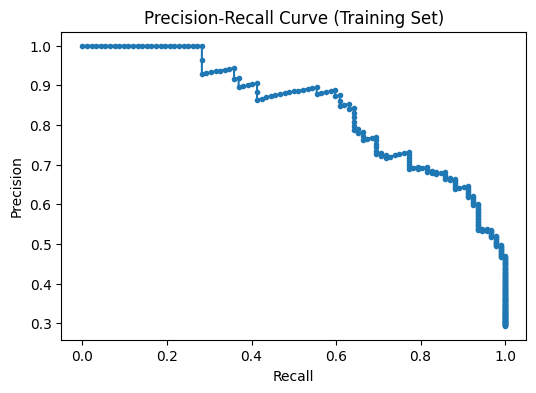


📊 Test Set Metrics:
Accuracy: 0.680
AUC-ROC: 0.601
AUC-PR: 0.378


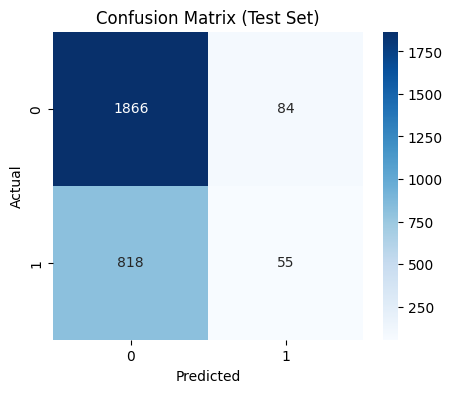

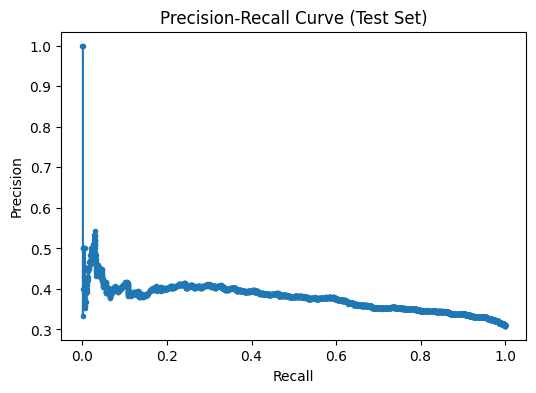

Metrics for Set8 at test size 0.90: {'accuracy': 0.6804817569961035, 'auc_pr': 0.37842131769713816, 'auc_roc': 0.6005844861514964}

Running Set9 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

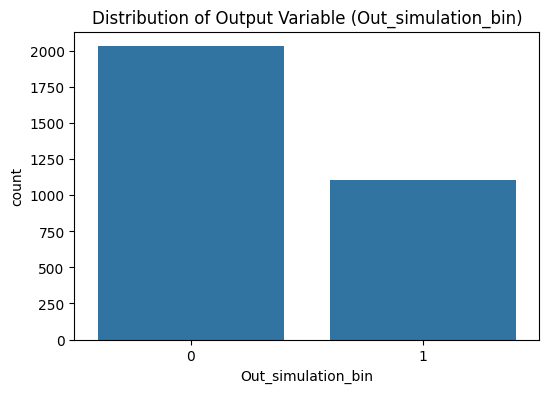


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    0
2955    0
2396    1
2555    0
2

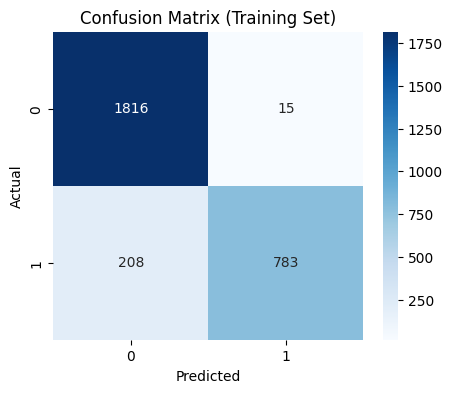

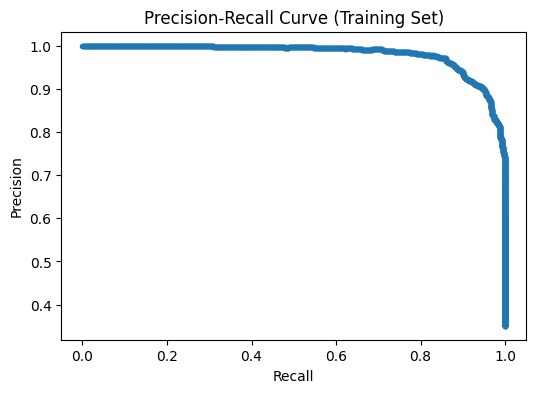


📊 Test Set Metrics:
Accuracy: 0.694
AUC-ROC: 0.741
AUC-PR: 0.628


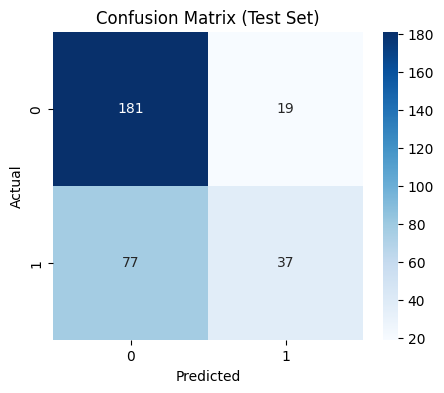

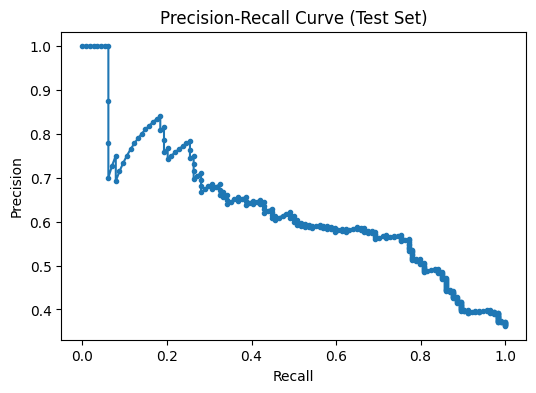

Metrics for Set9 at test size 0.10: {'accuracy': 0.6942675159235668, 'auc_pr': 0.6279705787948641, 'auc_roc': 0.7406578947368422}

Running Set9 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

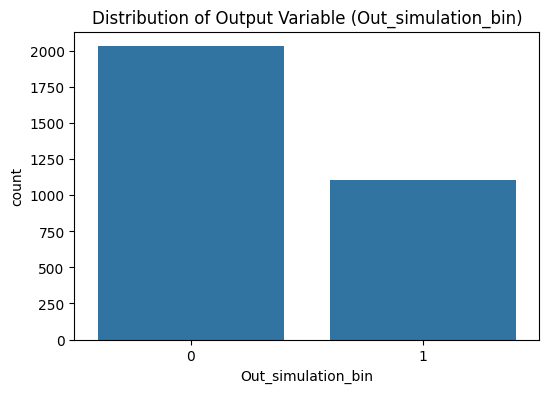


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    0
22      1
1161    0
1

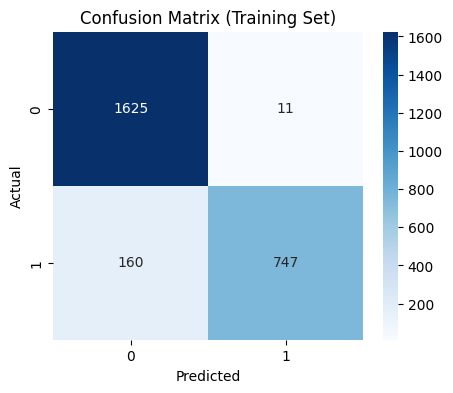

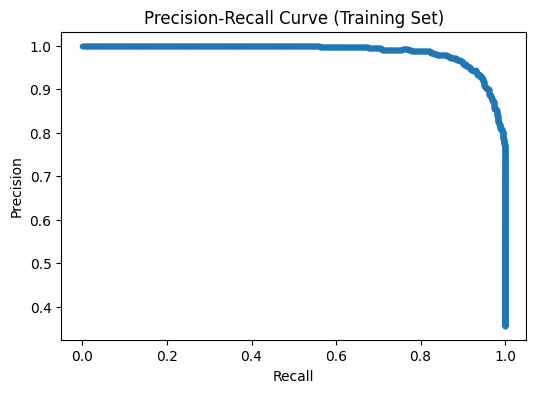


📊 Test Set Metrics:
Accuracy: 0.712
AUC-ROC: 0.747
AUC-PR: 0.617


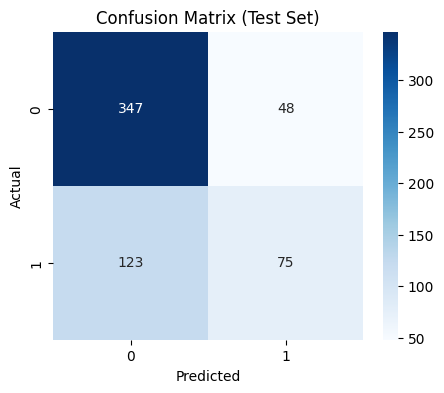

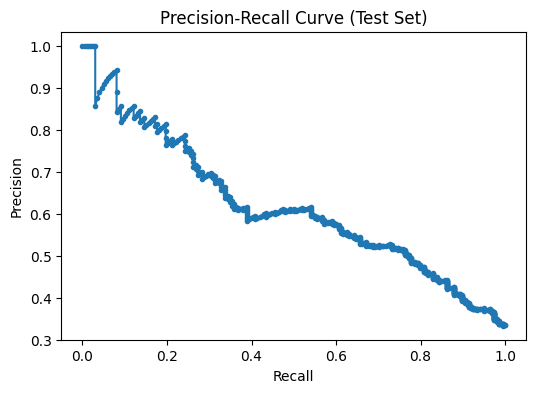

Metrics for Set9 at test size 0.19: {'accuracy': 0.7116357504215851, 'auc_pr': 0.6174212652456603, 'auc_roc': 0.747321314409922}

Running Set9 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

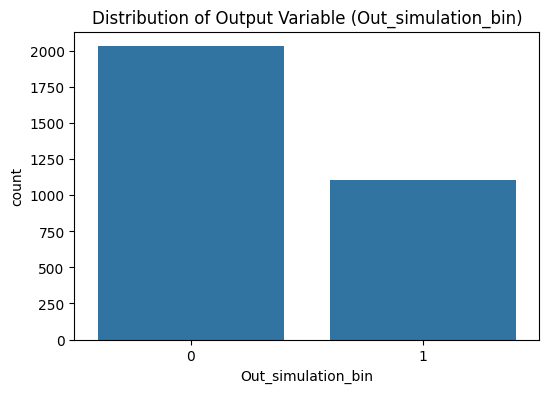


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     0
2057    1
781     0
2

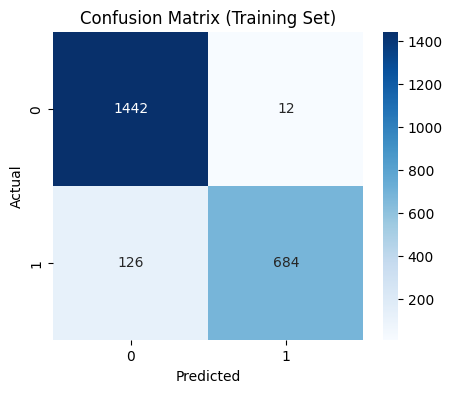

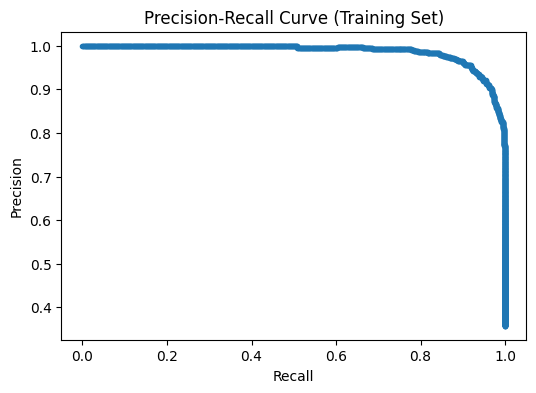


📊 Test Set Metrics:
Accuracy: 0.706
AUC-ROC: 0.723
AUC-PR: 0.583


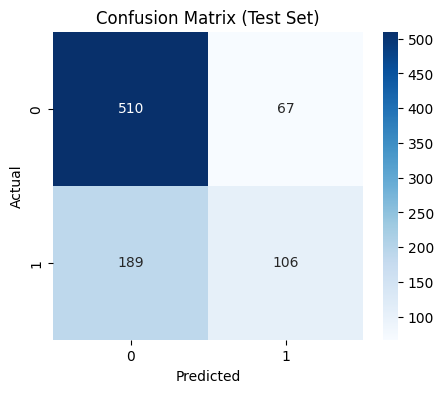

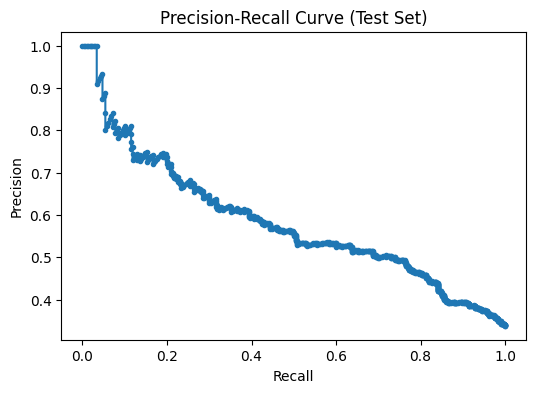

Metrics for Set9 at test size 0.28: {'accuracy': 0.7064220183486238, 'auc_pr': 0.5832950739554466, 'auc_roc': 0.722644890285815}

Running Set9 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

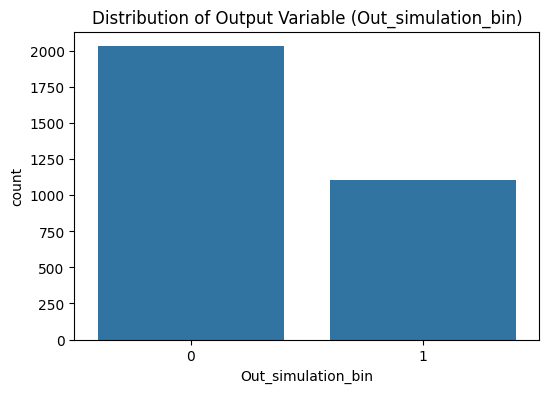


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    0
1811    0
1099    0


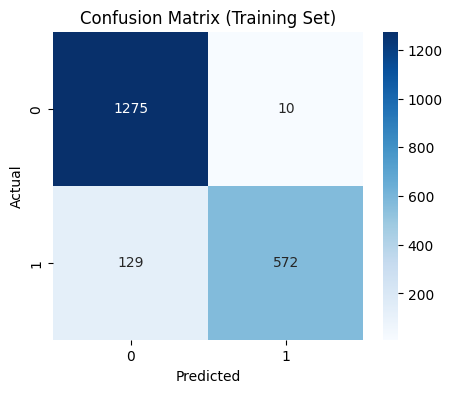

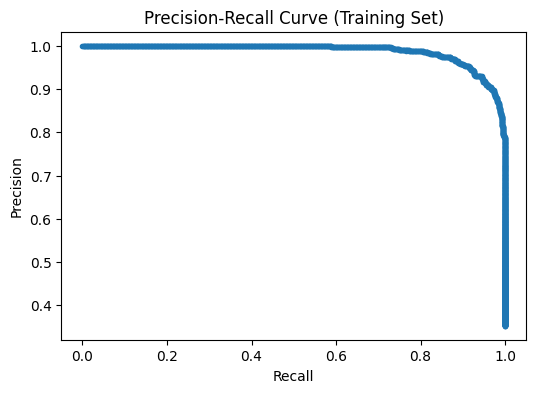


📊 Test Set Metrics:
Accuracy: 0.679
AUC-ROC: 0.684
AUC-PR: 0.541


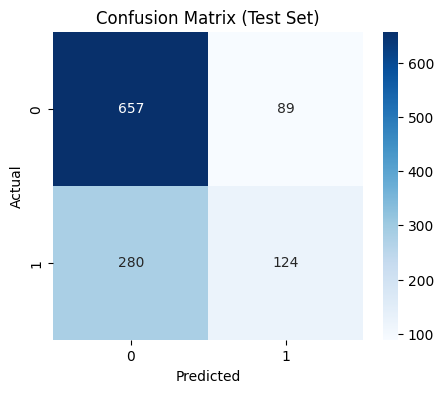

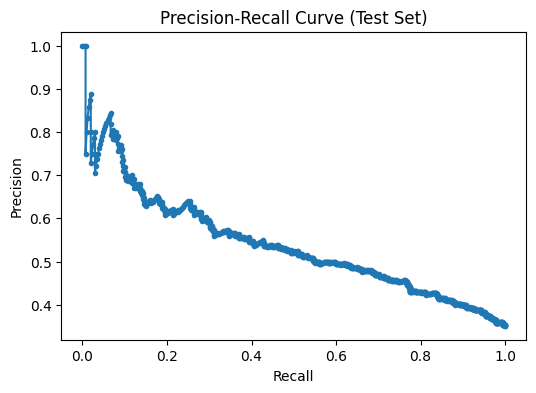

Metrics for Set9 at test size 0.37: {'accuracy': 0.6791304347826087, 'auc_pr': 0.540544808449643, 'auc_roc': 0.6839231677859476}

Running Set9 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

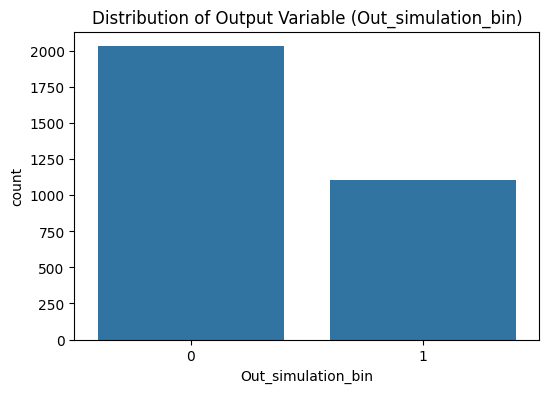


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    0
2867    0
2979    0
1259    0


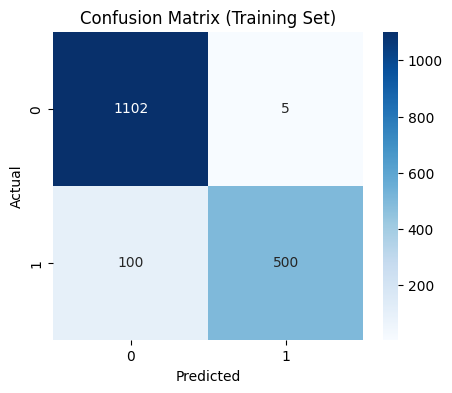

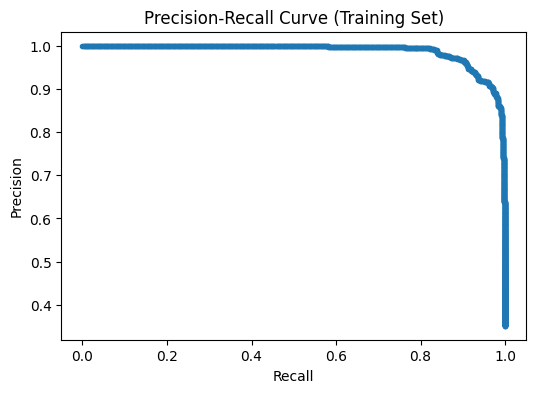


📊 Test Set Metrics:
Accuracy: 0.686
AUC-ROC: 0.686
AUC-PR: 0.544


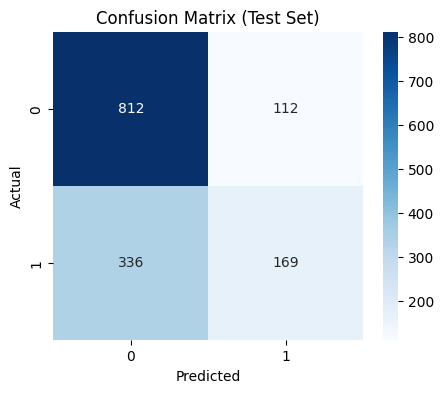

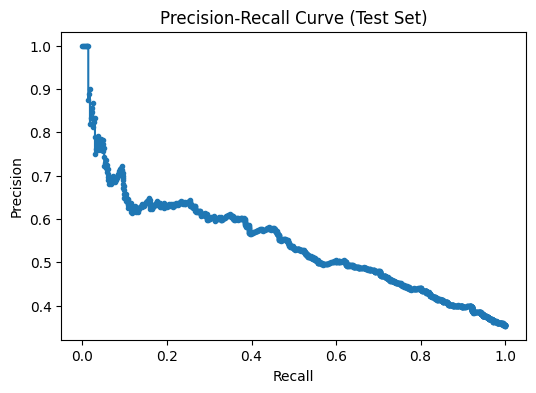

Metrics for Set9 at test size 0.46: {'accuracy': 0.6864940517844647, 'auc_pr': 0.5444304255192227, 'auc_roc': 0.6859082336805109}

Running Set9 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

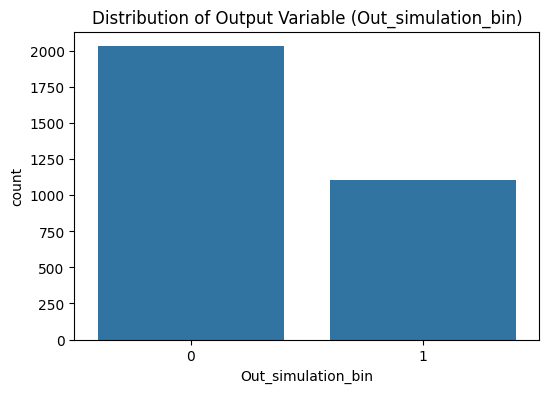


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     0
948     1
704     0
431     1


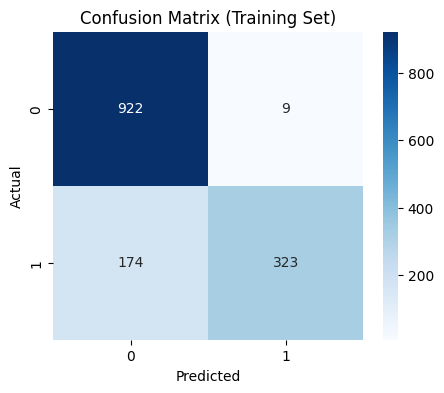

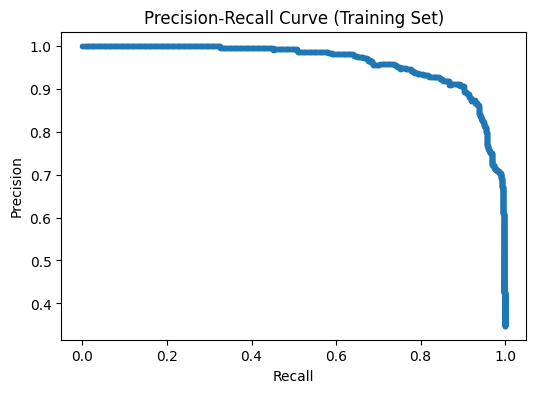


📊 Test Set Metrics:
Accuracy: 0.660
AUC-ROC: 0.649
AUC-PR: 0.497


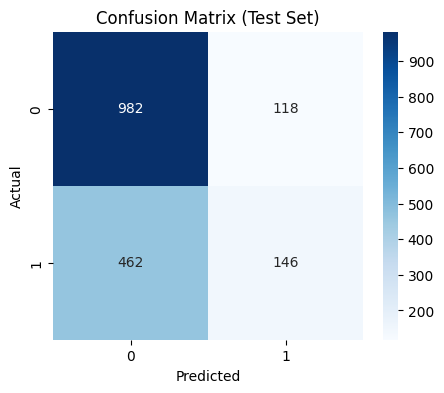

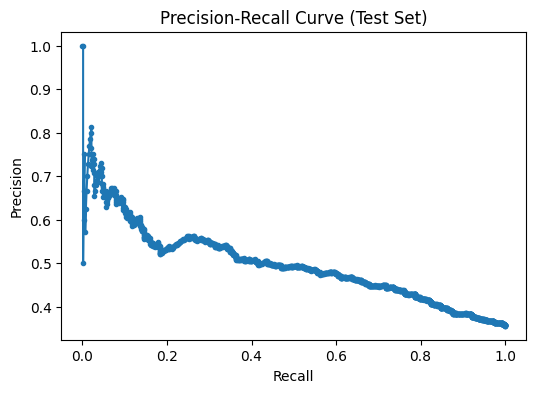

Metrics for Set9 at test size 0.54: {'accuracy': 0.6604215456674473, 'auc_pr': 0.49713562016360846, 'auc_roc': 0.649376495215311}

Running Set9 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

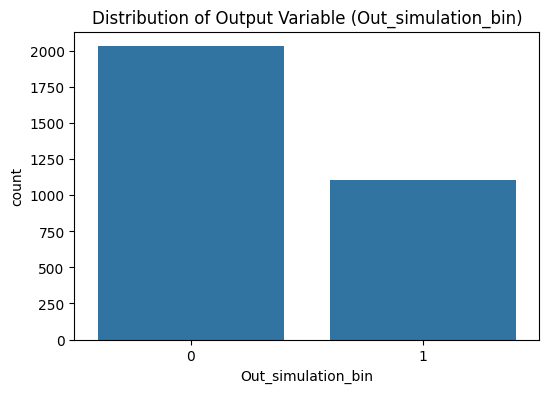


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    0
2310    1
592     1


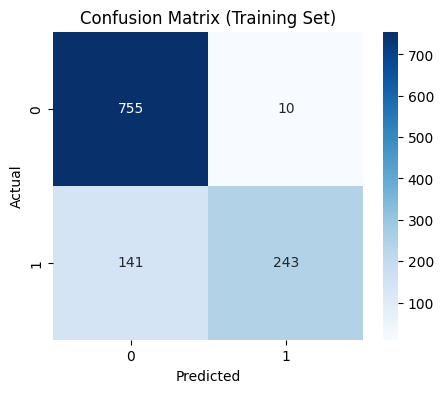

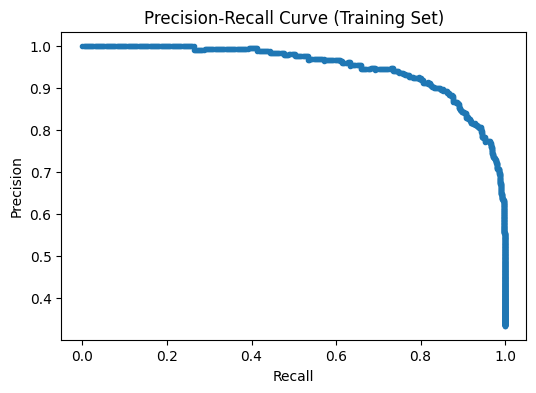


📊 Test Set Metrics:
Accuracy: 0.638
AUC-ROC: 0.614
AUC-PR: 0.464


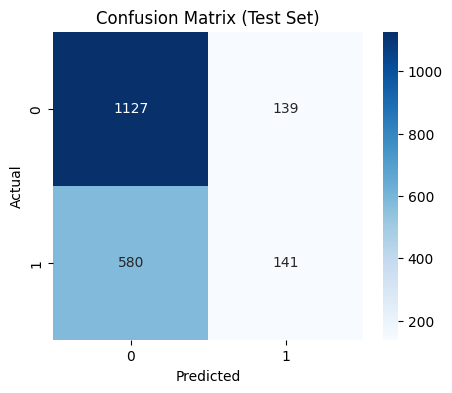

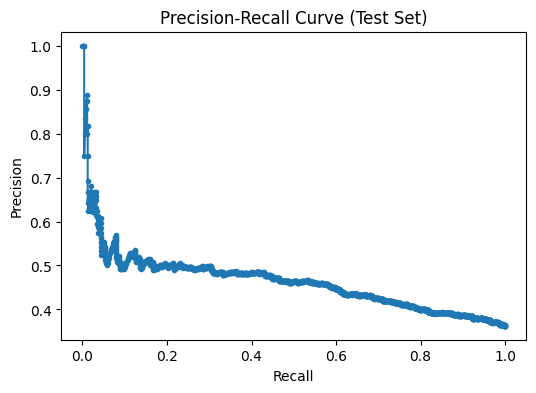

Metrics for Set9 at test size 0.63: {'accuracy': 0.638147961751384, 'auc_pr': 0.4638275787356809, 'auc_roc': 0.6138656815507687}

Running Set9 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

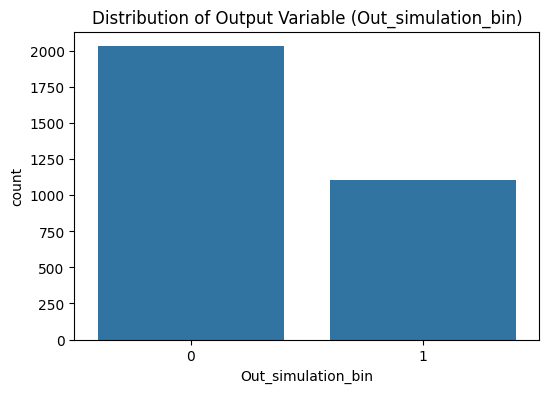


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    0
3       1
74      0
1755    0
4

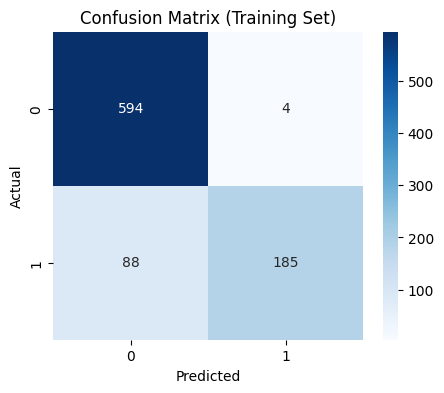

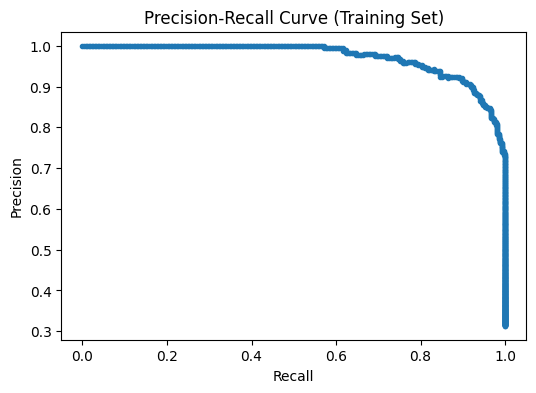


📊 Test Set Metrics:
Accuracy: 0.647
AUC-ROC: 0.621
AUC-PR: 0.477


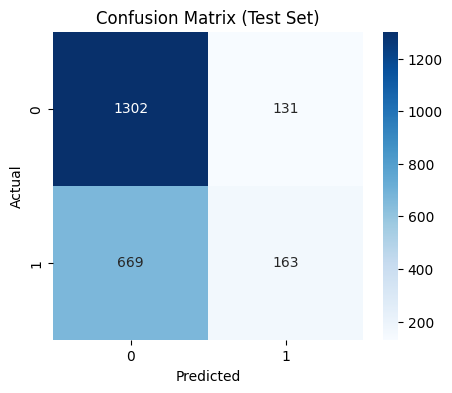

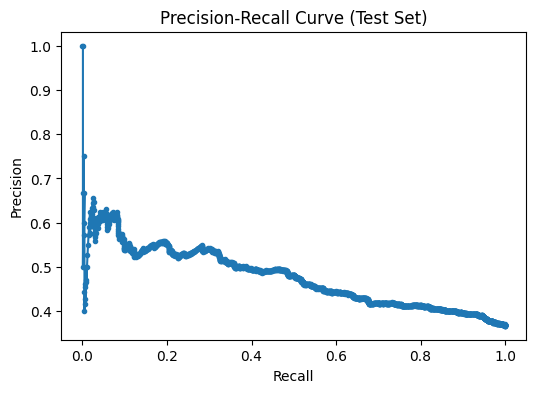

Metrics for Set9 at test size 0.72: {'accuracy': 0.6467991169977925, 'auc_pr': 0.47673105229731194, 'auc_roc': 0.6205349354501046}

Running Set9 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

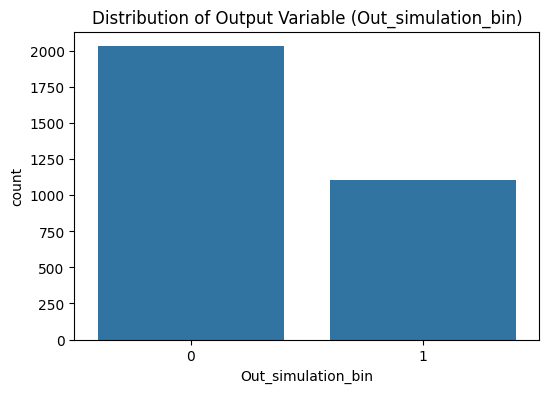


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    1
1324    0
216     0
510     1
1

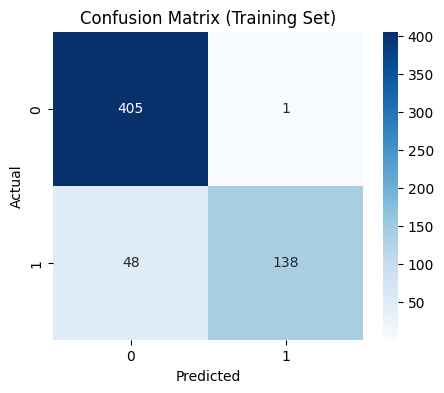

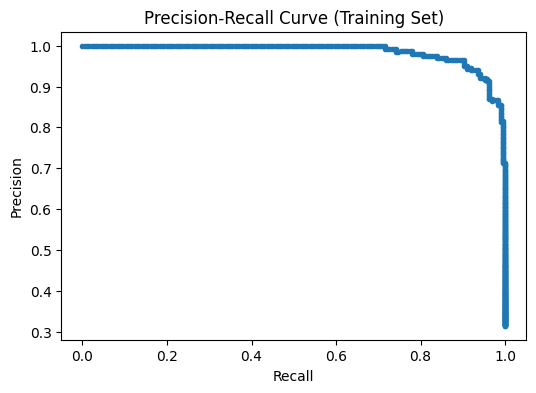


📊 Test Set Metrics:
Accuracy: 0.644
AUC-ROC: 0.599
AUC-PR: 0.454


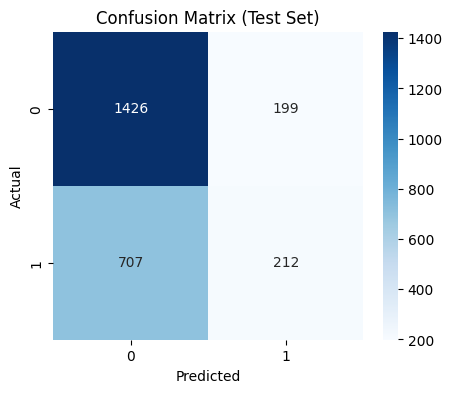

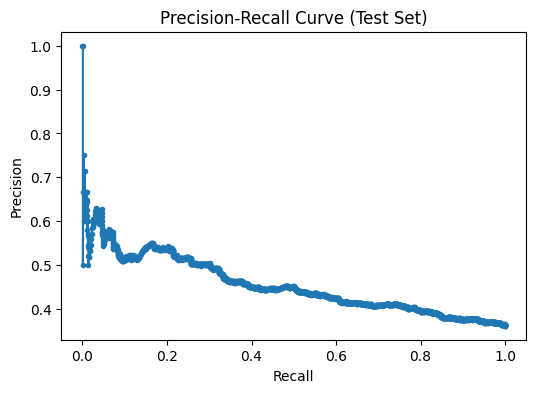

Metrics for Set9 at test size 0.81: {'accuracy': 0.6438679245283019, 'auc_pr': 0.45440735282724604, 'auc_roc': 0.5993511341759437}

Running Set9 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

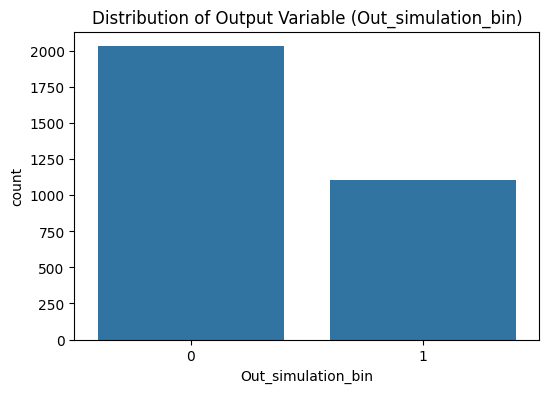


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   1
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   1
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set9 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    1
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    1
639     1
2907    0
1218    1
1

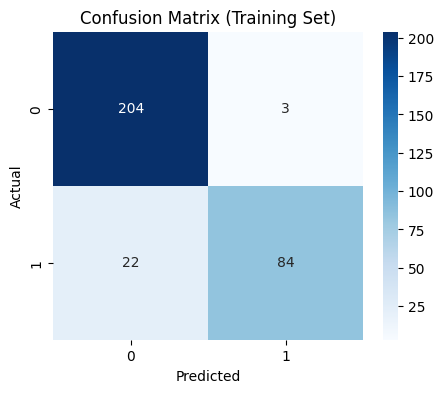

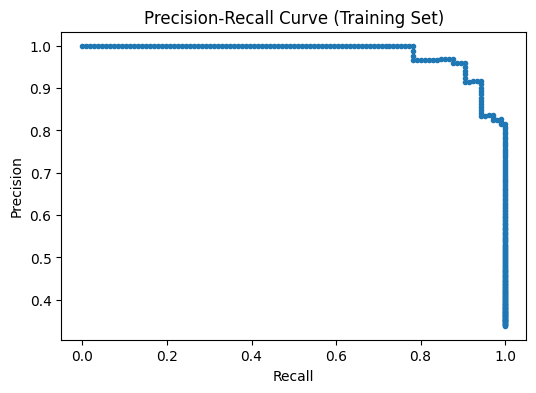


📊 Test Set Metrics:
Accuracy: 0.624
AUC-ROC: 0.554
AUC-PR: 0.409


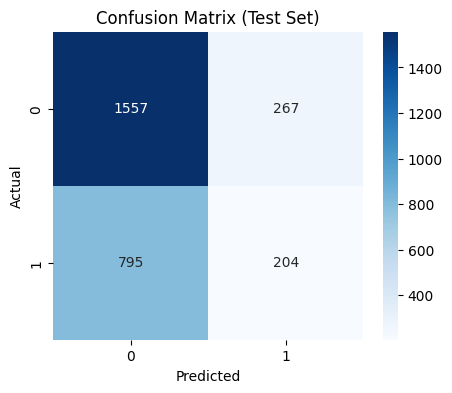

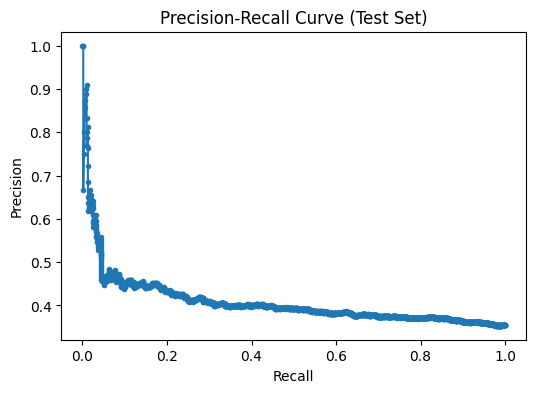

Metrics for Set9 at test size 0.90: {'accuracy': 0.6238044633368757, 'auc_pr': 0.4085216712392844, 'auc_roc': 0.5540677739142652}

Running Set10 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

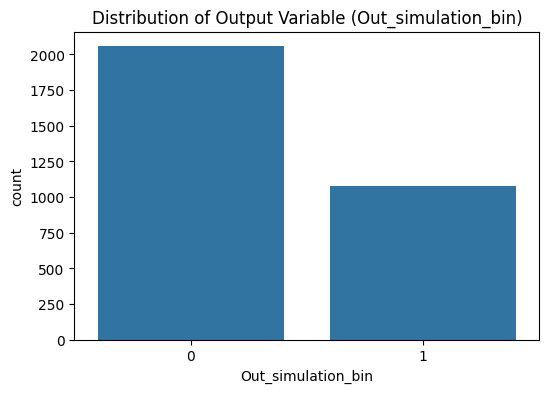


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    1
2955    1
2396    1
2555    1


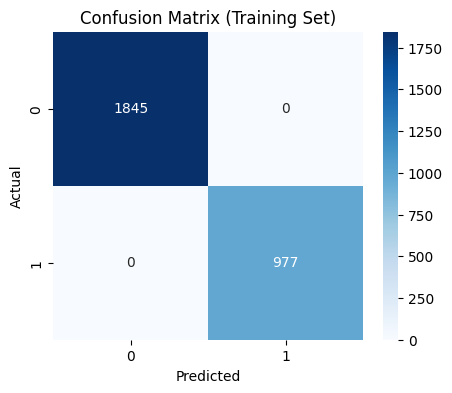

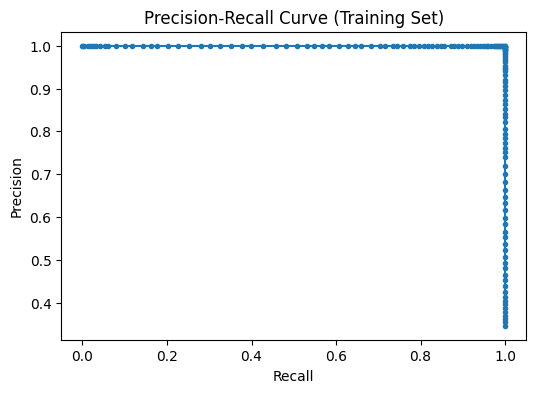


📊 Test Set Metrics:
Accuracy: 0.803
AUC-ROC: 0.830
AUC-PR: 0.760


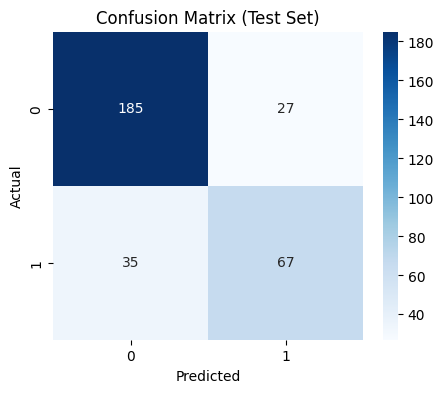

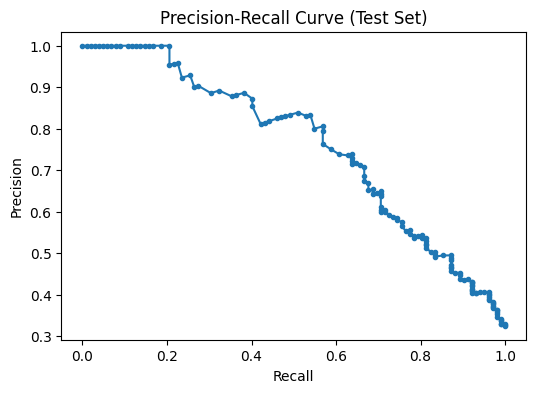

Metrics for Set10 at test size 0.10: {'accuracy': 0.802547770700637, 'auc_pr': 0.7597282464641351, 'auc_roc': 0.8297955974842768}

Running Set10 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

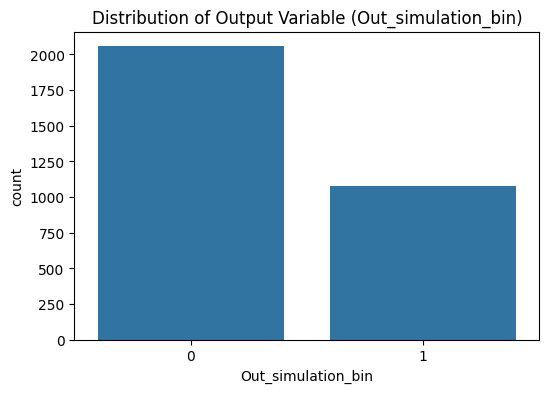


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    1
22      0
1161    1


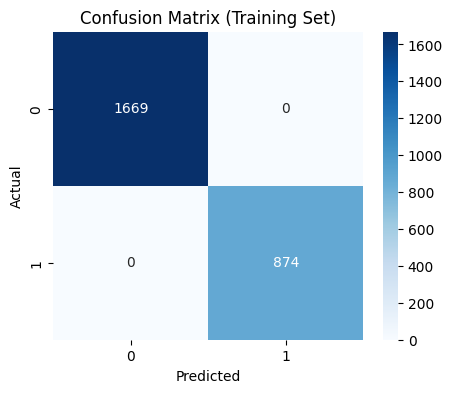

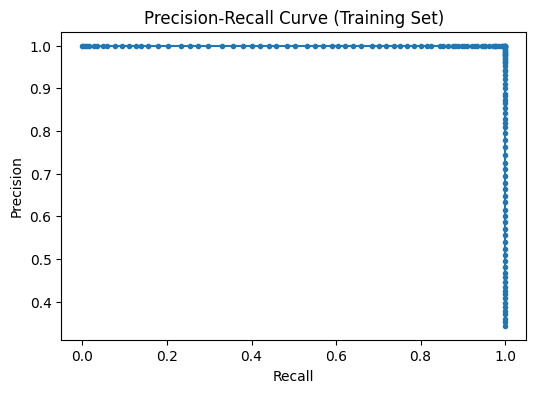


📊 Test Set Metrics:
Accuracy: 0.771
AUC-ROC: 0.832
AUC-PR: 0.775


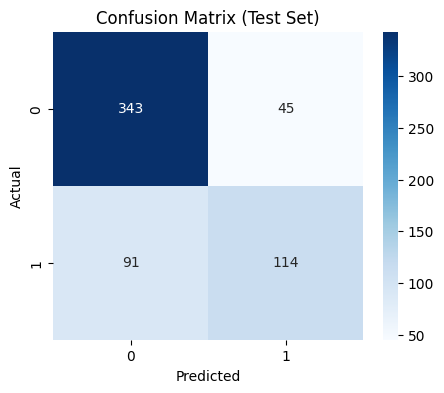

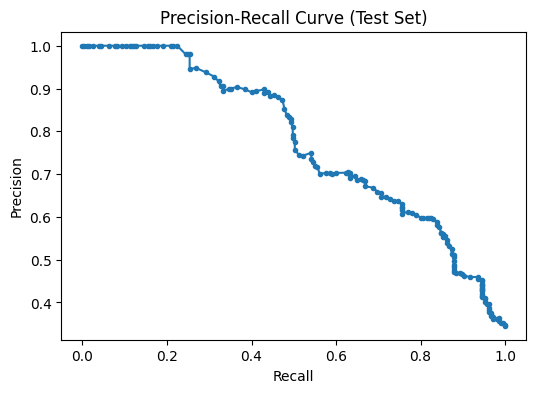

Metrics for Set10 at test size 0.19: {'accuracy': 0.7706576728499157, 'auc_pr': 0.7750132204725253, 'auc_roc': 0.832329645461403}

Running Set10 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

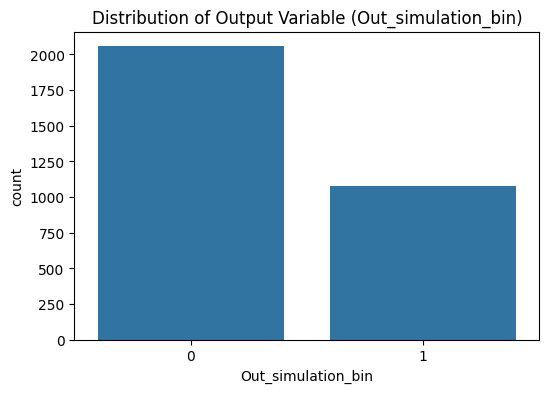


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     0
2057    1
781     0


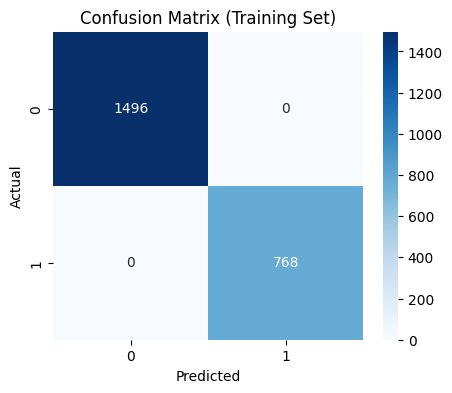

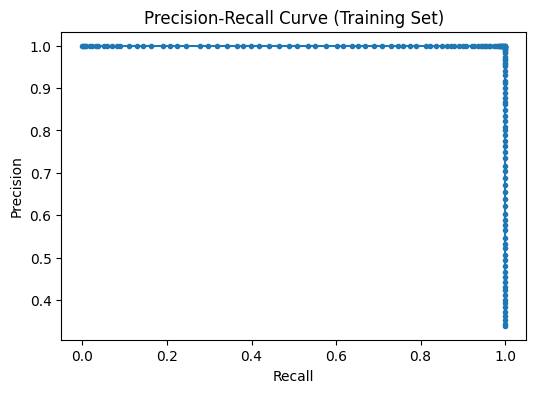


📊 Test Set Metrics:
Accuracy: 0.783
AUC-ROC: 0.817
AUC-PR: 0.769


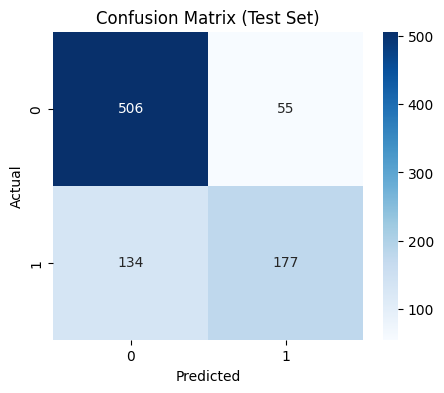

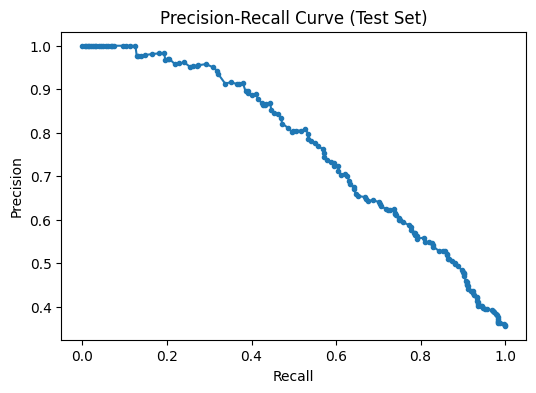

Metrics for Set10 at test size 0.28: {'accuracy': 0.783256880733945, 'auc_pr': 0.7685826744000197, 'auc_roc': 0.8170011062010306}

Running Set10 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

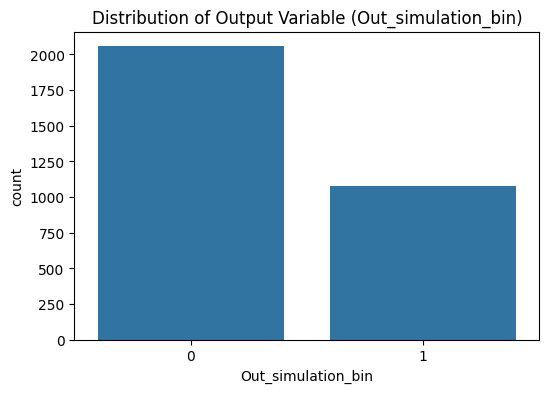


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    1
1811    0
1099    0

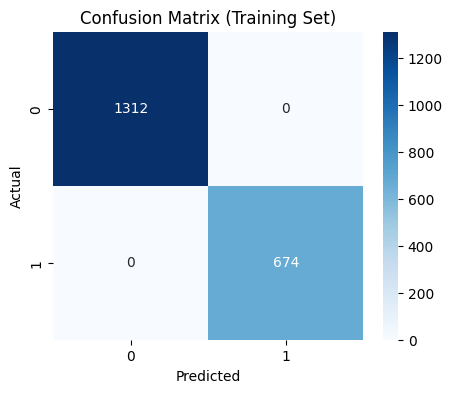

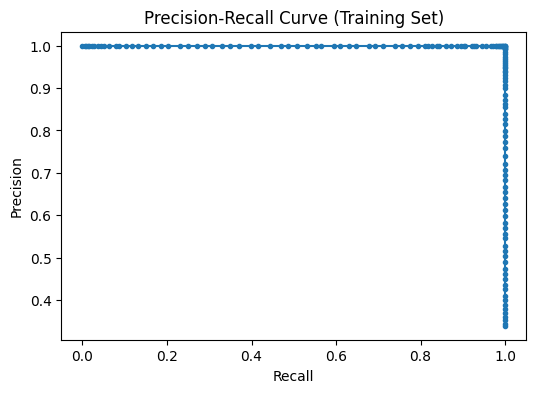


📊 Test Set Metrics:
Accuracy: 0.778
AUC-ROC: 0.808
AUC-PR: 0.733


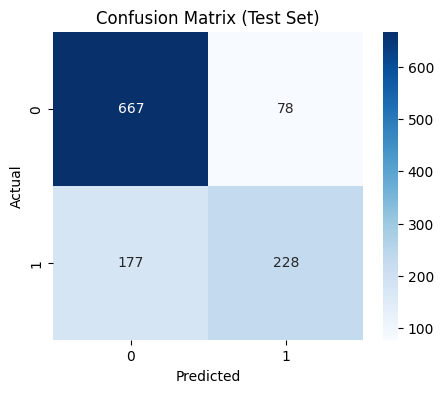

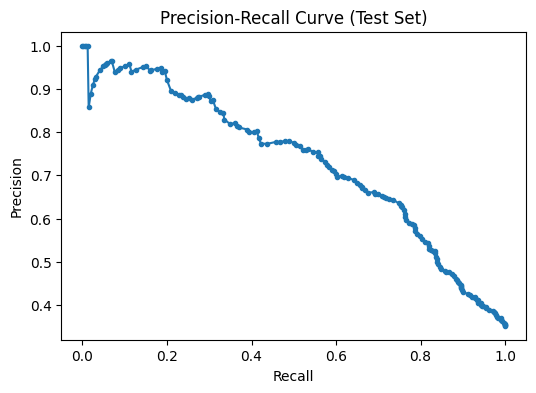

Metrics for Set10 at test size 0.37: {'accuracy': 0.7782608695652173, 'auc_pr': 0.732681041144748, 'auc_roc': 0.807825006214268}

Running Set10 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

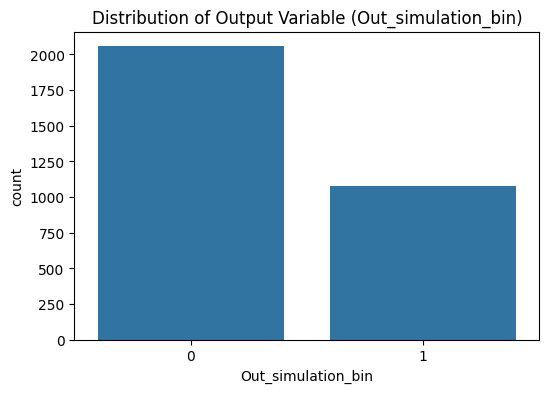


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    0
2867    1
2979    1
1259    1

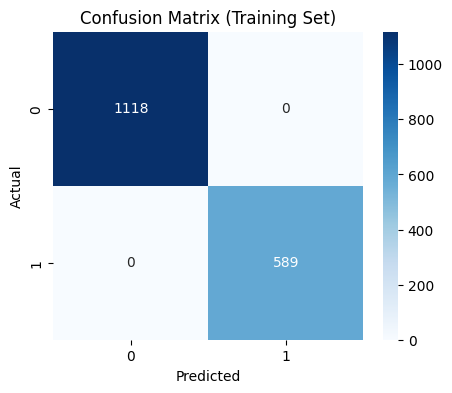

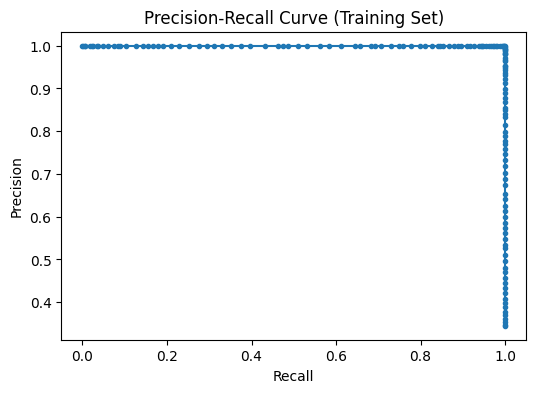


📊 Test Set Metrics:
Accuracy: 0.769
AUC-ROC: 0.812
AUC-PR: 0.708


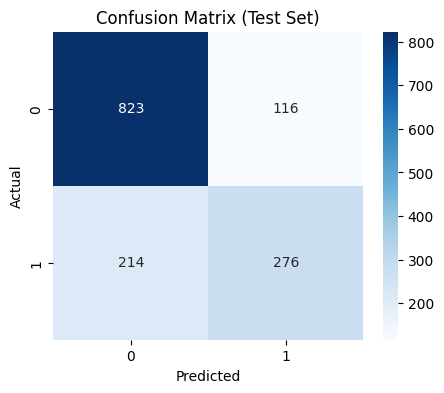

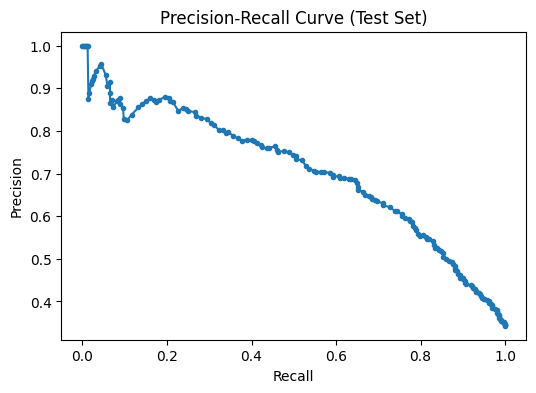

Metrics for Set10 at test size 0.46: {'accuracy': 0.7690692792162351, 'auc_pr': 0.7075142044747993, 'auc_roc': 0.8124568038077851}

Running Set10 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

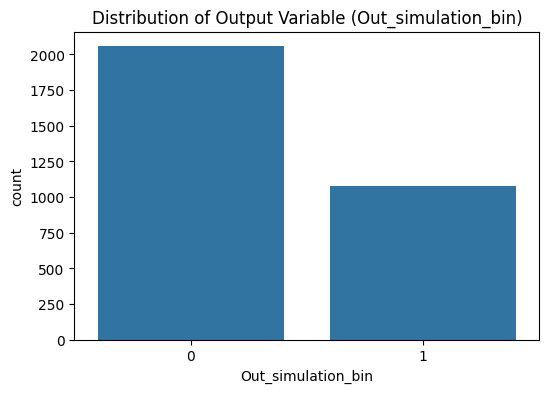


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     0
948     0
704     0
431     0

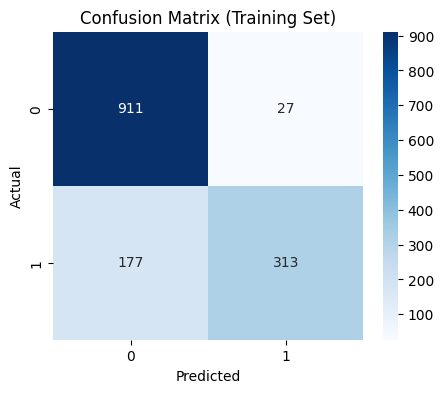

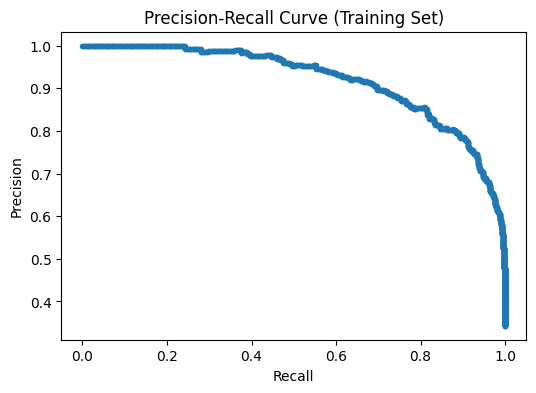


📊 Test Set Metrics:
Accuracy: 0.719
AUC-ROC: 0.752
AUC-PR: 0.609


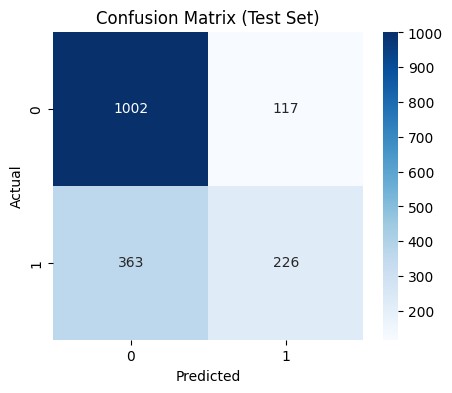

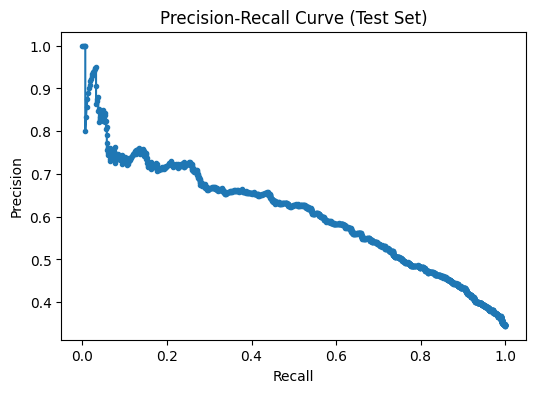

Metrics for Set10 at test size 0.54: {'accuracy': 0.7189695550351288, 'auc_pr': 0.6091107503099923, 'auc_roc': 0.7520888617808466}

Running Set10 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

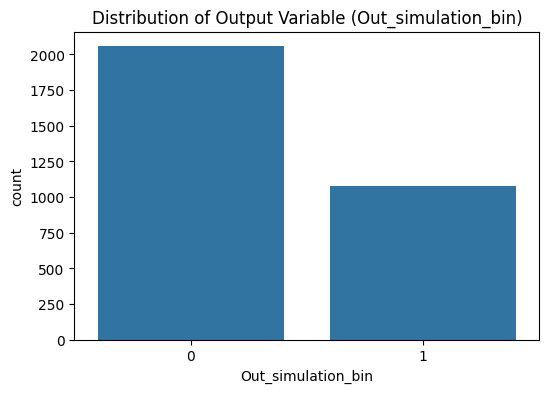


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     1
1181    0
2310    1
592     0

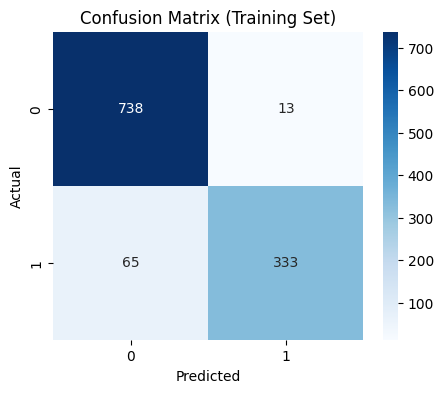

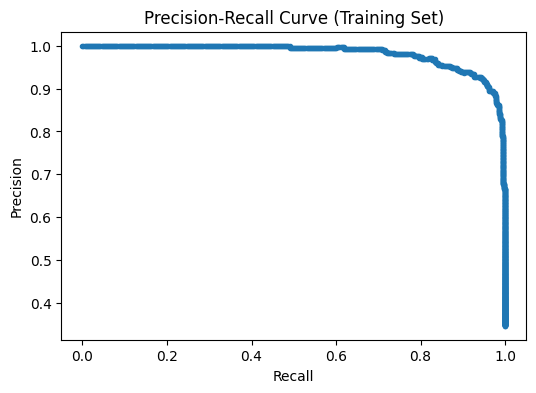


📊 Test Set Metrics:
Accuracy: 0.717
AUC-ROC: 0.748
AUC-PR: 0.593


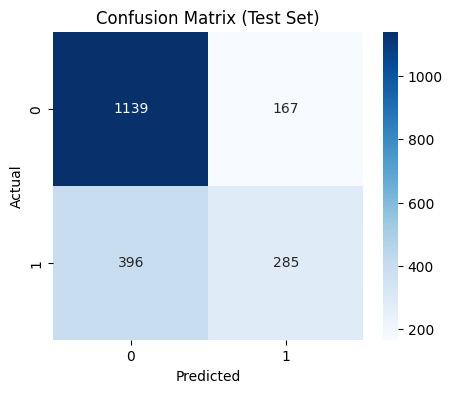

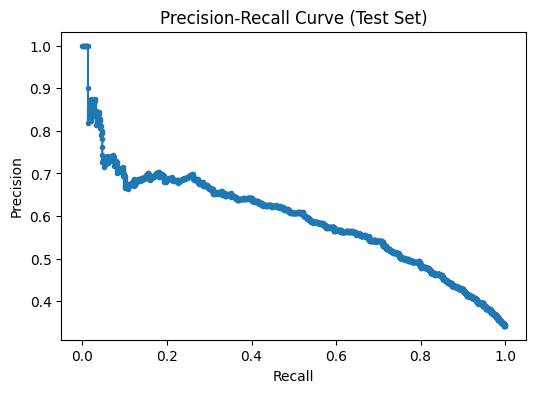

Metrics for Set10 at test size 0.63: {'accuracy': 0.7166582788122798, 'auc_pr': 0.5934466233880429, 'auc_roc': 0.7475685472899282}

Running Set10 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

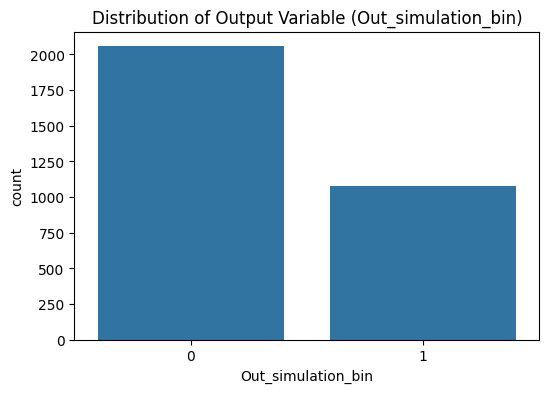


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    1
3       1
74      1
1755    0


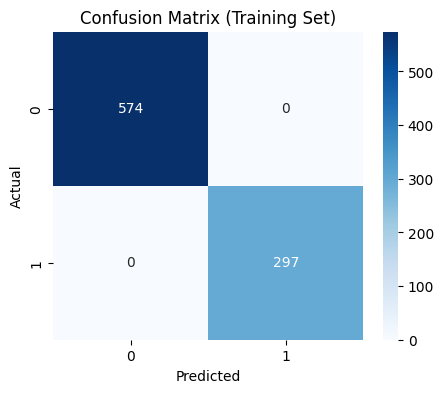

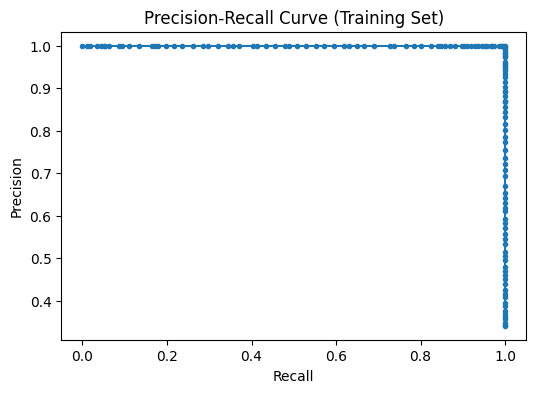


📊 Test Set Metrics:
Accuracy: 0.706
AUC-ROC: 0.732
AUC-PR: 0.587


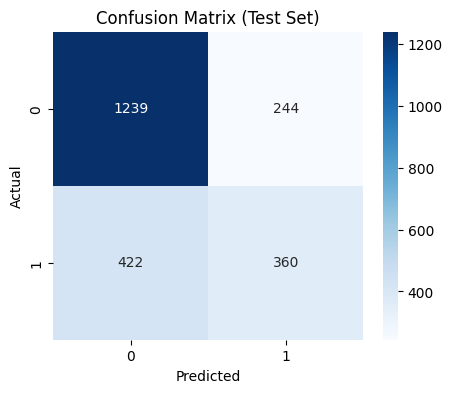

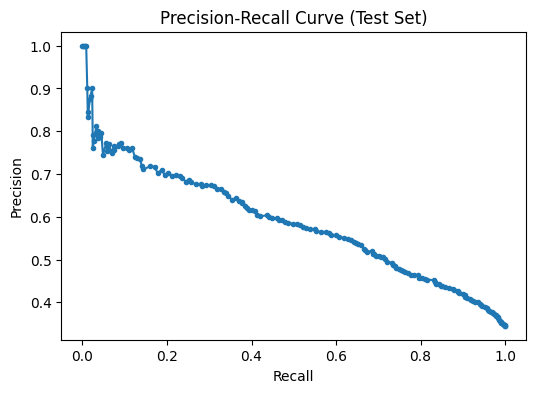

Metrics for Set10 at test size 0.72: {'accuracy': 0.7059602649006622, 'auc_pr': 0.5874284357714243, 'auc_roc': 0.7315832633443304}

Running Set10 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

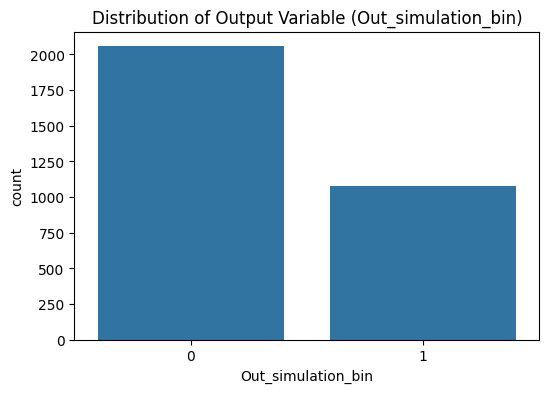


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    1
1324    0
216     0
510     1


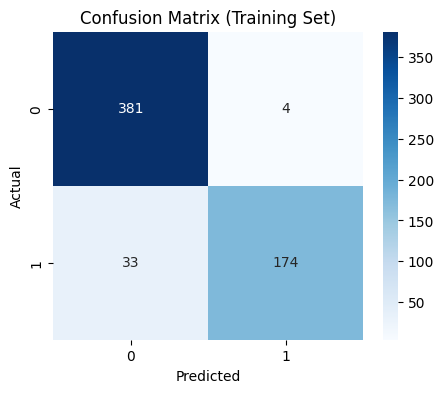

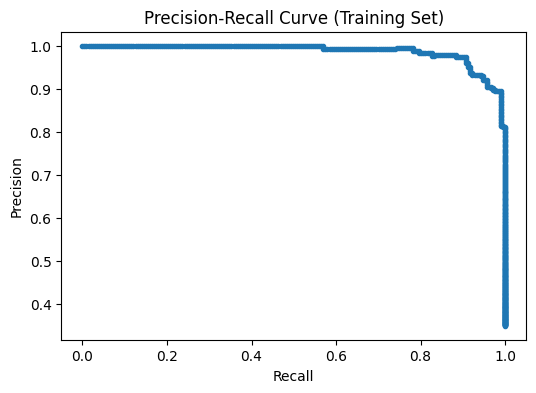


📊 Test Set Metrics:
Accuracy: 0.695
AUC-ROC: 0.691
AUC-PR: 0.517


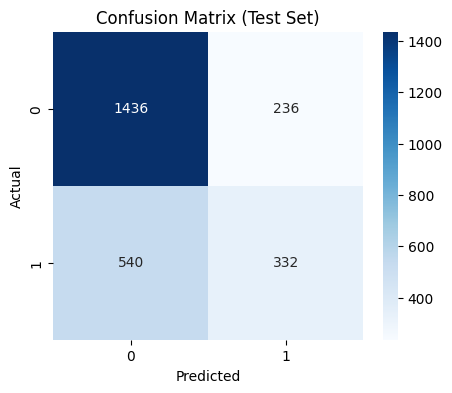

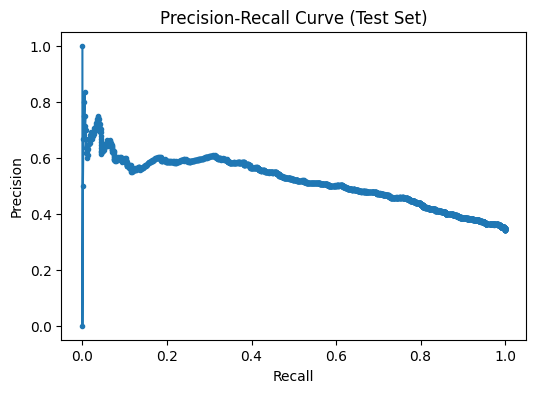

Metrics for Set10 at test size 0.81: {'accuracy': 0.6949685534591195, 'auc_pr': 0.5174951858795523, 'auc_roc': 0.6911564187261314}

Running Set10 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

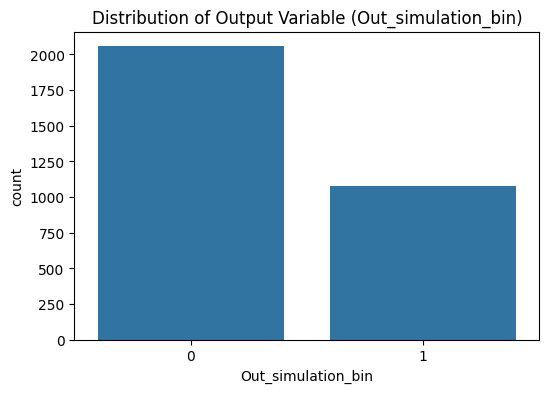


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   1
2   0   1  8  B                   0
3   0   1  8  C                   1
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   1
2   0   1   8  11                   0
3   0   1   8  12                   1
4   0   1   8  13                   0
Splitting data for Set10 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    1
2    0
3    1
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     0
2907    0
1218    0


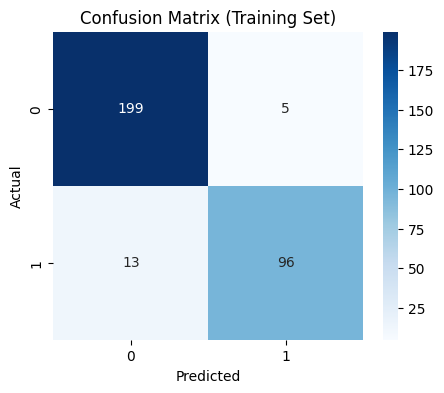

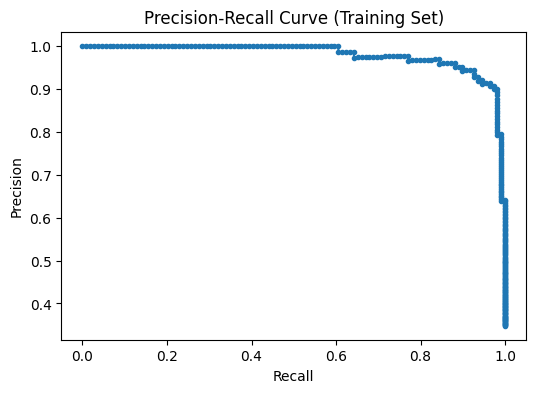


📊 Test Set Metrics:
Accuracy: 0.645
AUC-ROC: 0.630
AUC-PR: 0.471


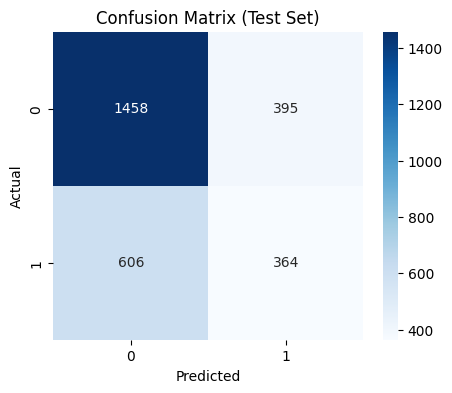

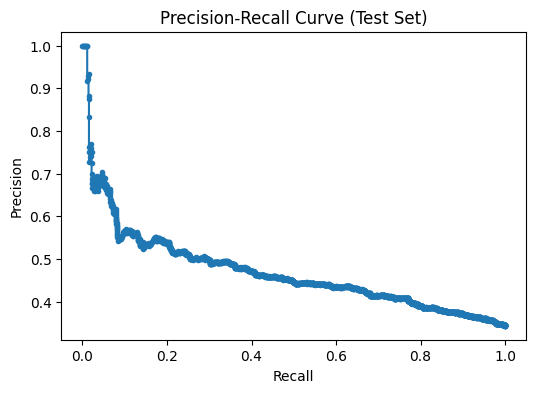

Metrics for Set10 at test size 0.90: {'accuracy': 0.6454126815444563, 'auc_pr': 0.4707637716684029, 'auc_roc': 0.6303208505571907}

Running Set11 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

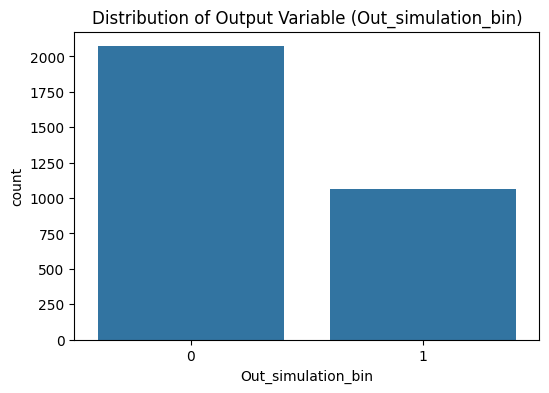


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    0
2955    1
2396    0
2555    1


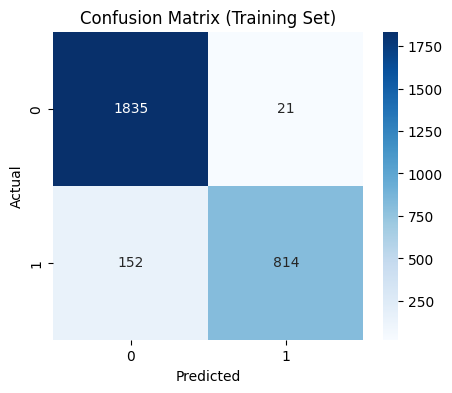

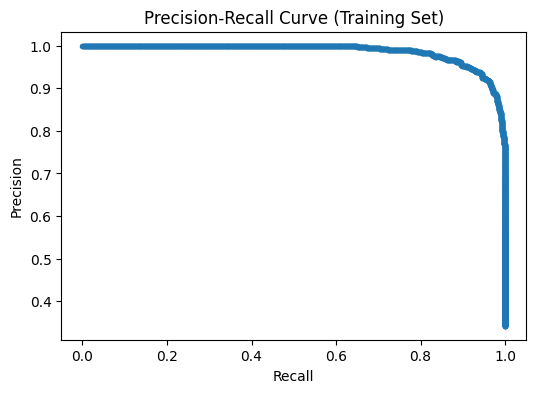


📊 Test Set Metrics:
Accuracy: 0.818
AUC-ROC: 0.867
AUC-PR: 0.806


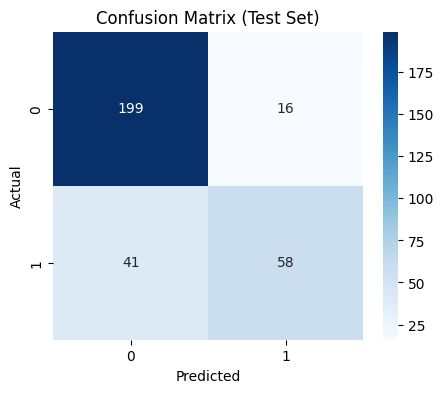

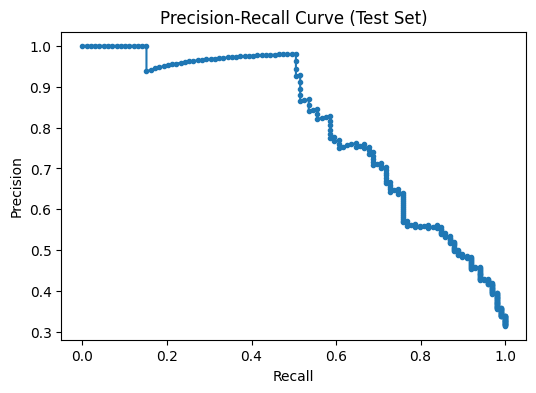

Metrics for Set11 at test size 0.10: {'accuracy': 0.8184713375796179, 'auc_pr': 0.8062636657748611, 'auc_roc': 0.866713648108997}

Running Set11 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

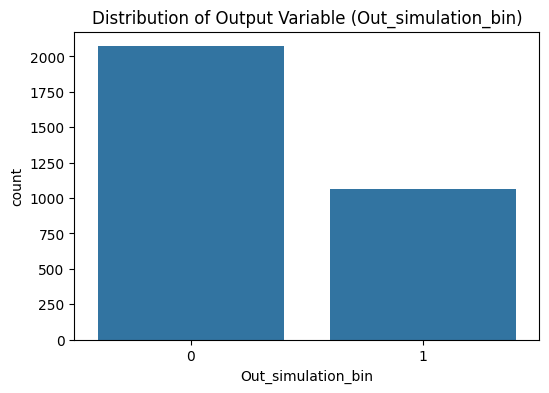


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    0
22      0
1161    0


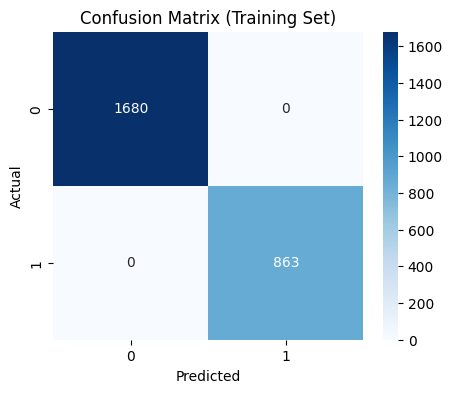

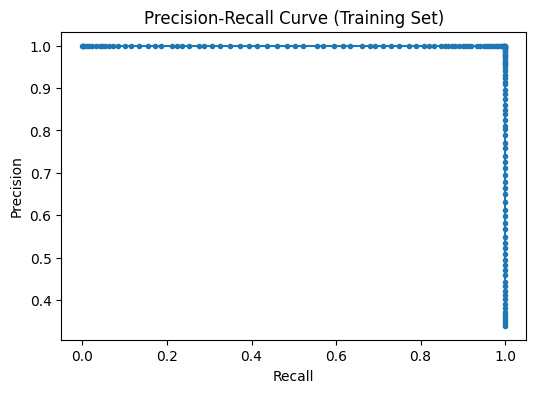


📊 Test Set Metrics:
Accuracy: 0.815
AUC-ROC: 0.828
AUC-PR: 0.735


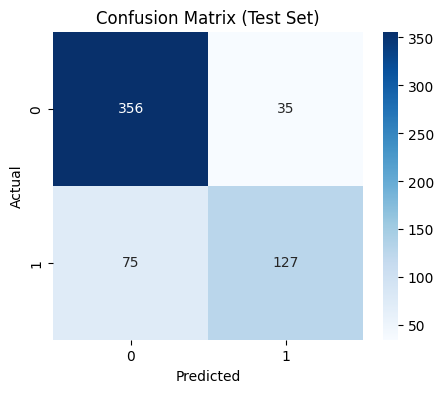

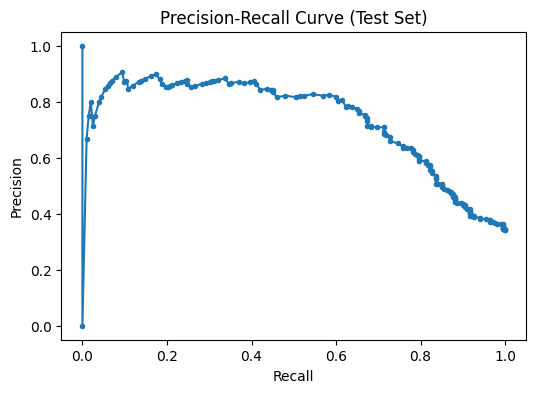

Metrics for Set11 at test size 0.19: {'accuracy': 0.8145025295109612, 'auc_pr': 0.7350646576863386, 'auc_roc': 0.8280494289838192}

Running Set11 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

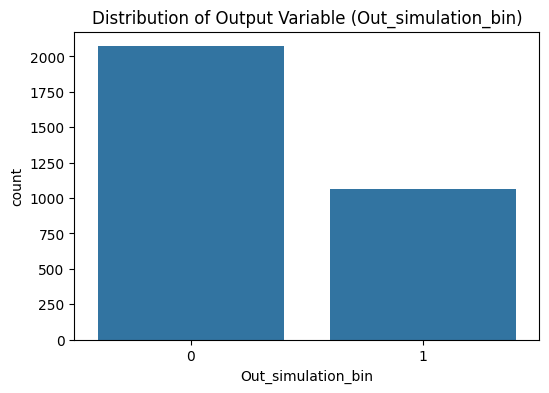


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     1
2057    0
781     0


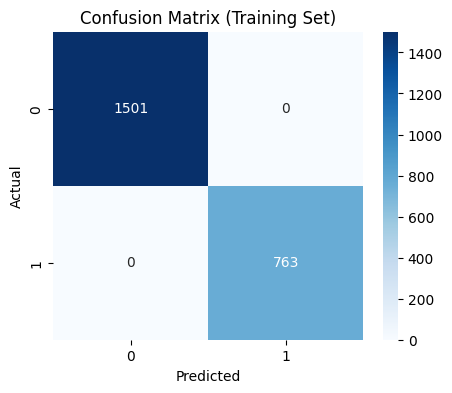

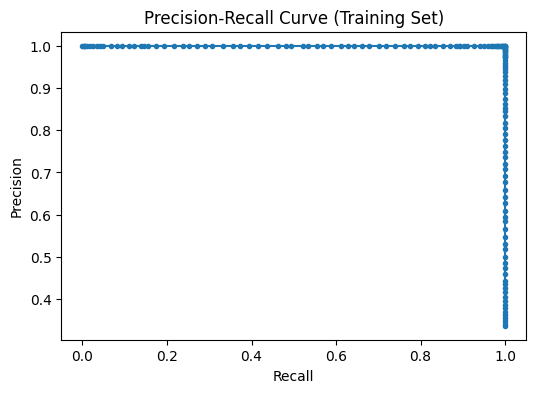


📊 Test Set Metrics:
Accuracy: 0.765
AUC-ROC: 0.798
AUC-PR: 0.706


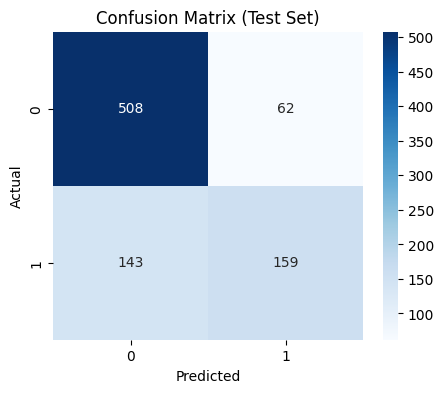

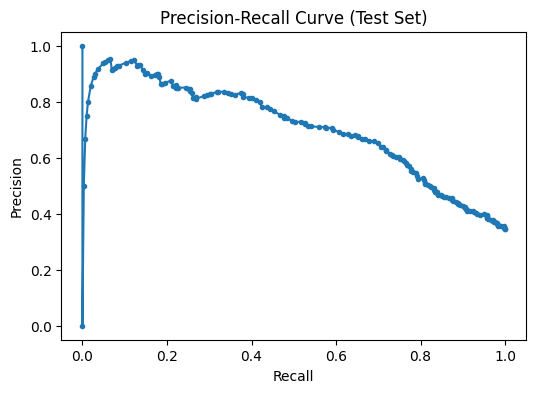

Metrics for Set11 at test size 0.28: {'accuracy': 0.7649082568807339, 'auc_pr': 0.7055093639093203, 'auc_roc': 0.797795399093761}

Running Set11 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

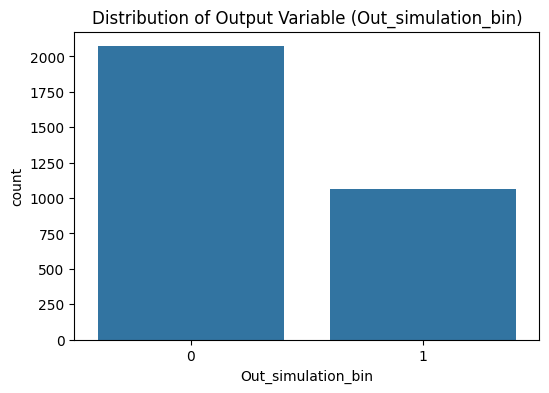


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    1
1811    1
1099    0

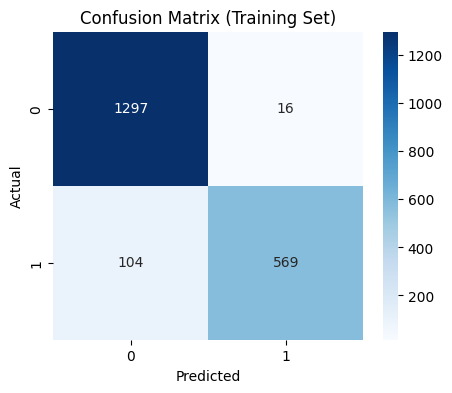

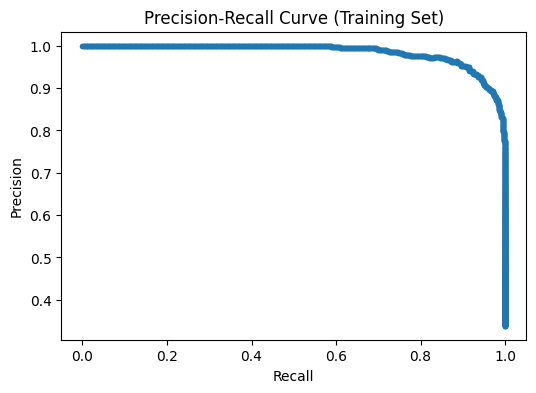


📊 Test Set Metrics:
Accuracy: 0.758
AUC-ROC: 0.783
AUC-PR: 0.678


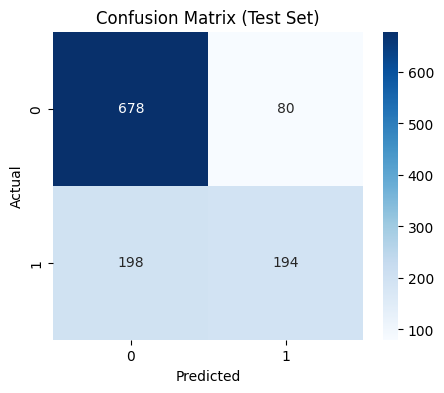

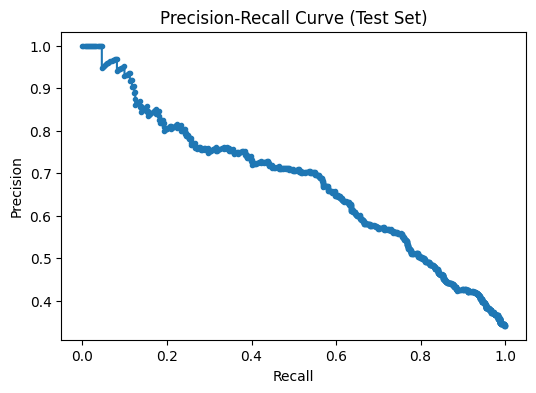

Metrics for Set11 at test size 0.37: {'accuracy': 0.7582608695652174, 'auc_pr': 0.6780579318442642, 'auc_roc': 0.7828284018092725}

Running Set11 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

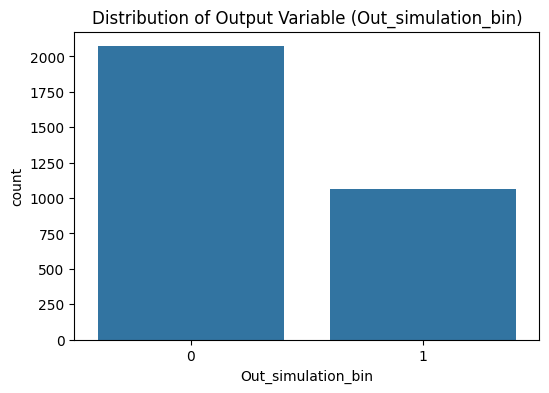


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    1
2867    0
2979    1
1259    1

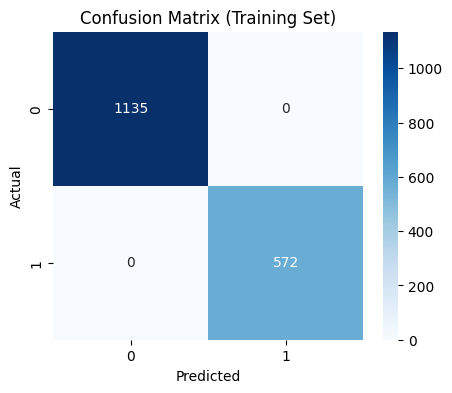

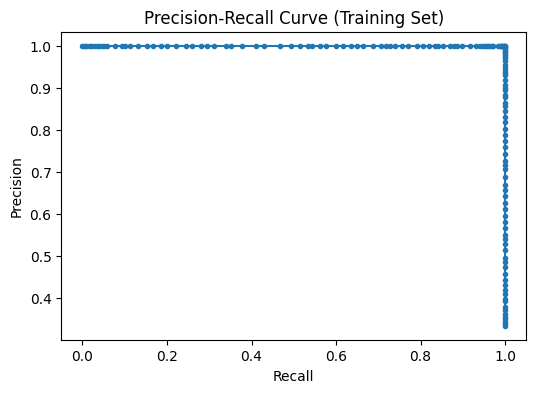


📊 Test Set Metrics:
Accuracy: 0.728
AUC-ROC: 0.758
AUC-PR: 0.654


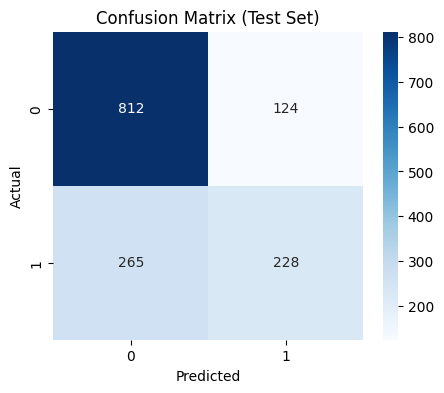

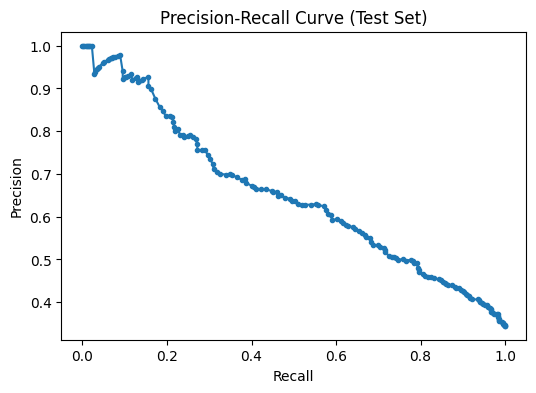

Metrics for Set11 at test size 0.46: {'accuracy': 0.72778166550035, 'auc_pr': 0.653931589790869, 'auc_roc': 0.7575826528666285}

Running Set11 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1       

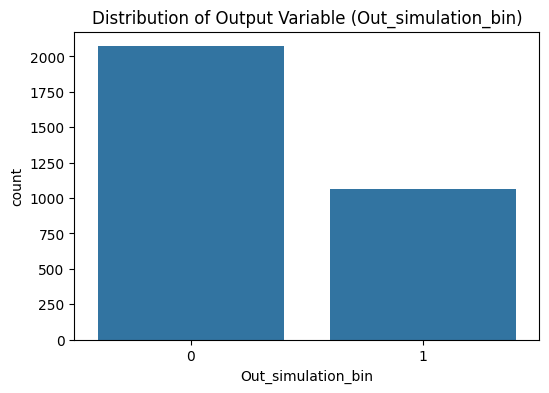


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     0
948     0
704     0
431     0

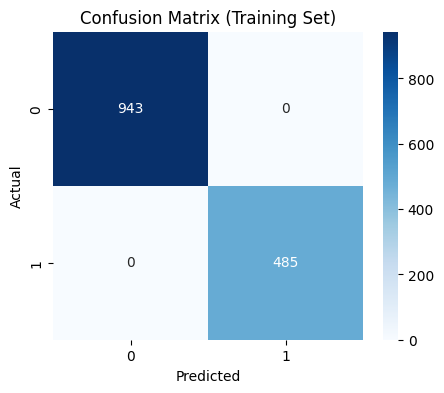

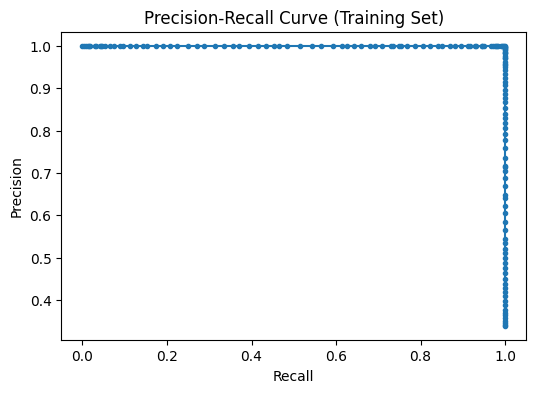


📊 Test Set Metrics:
Accuracy: 0.727
AUC-ROC: 0.739
AUC-PR: 0.599


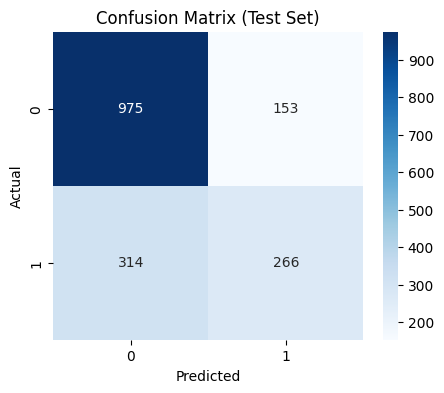

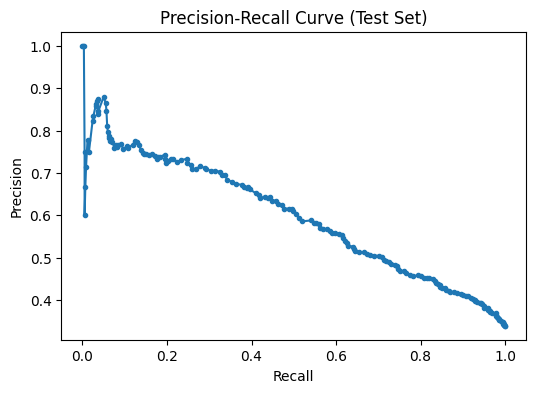

Metrics for Set11 at test size 0.54: {'accuracy': 0.7265807962529274, 'auc_pr': 0.5989557823695539, 'auc_roc': 0.7391033871362191}

Running Set11 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

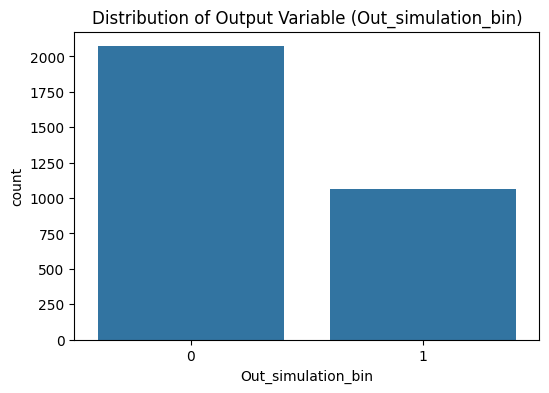


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    0
2310    0
592     1

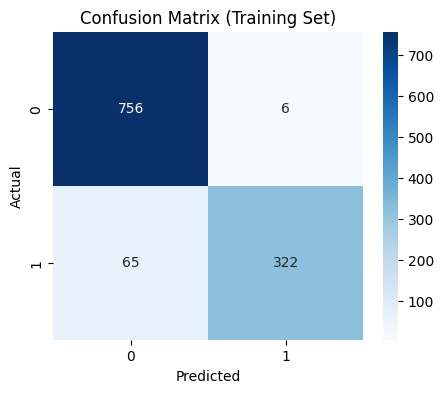

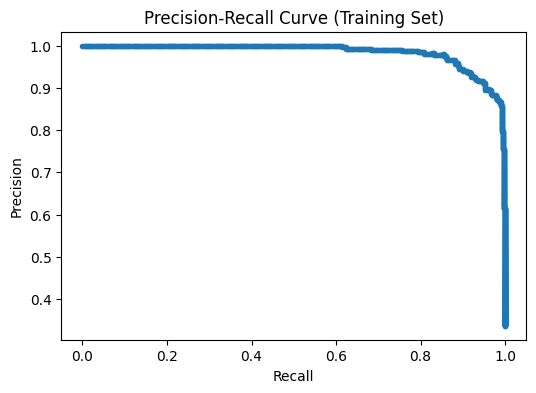


📊 Test Set Metrics:
Accuracy: 0.701
AUC-ROC: 0.717
AUC-PR: 0.565


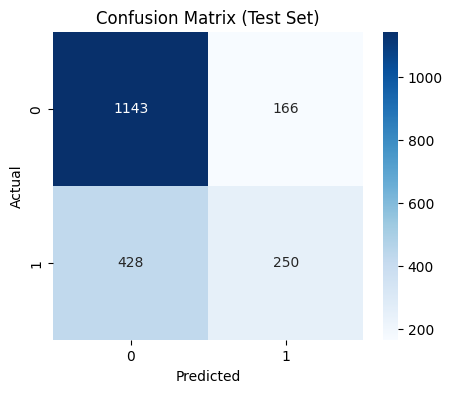

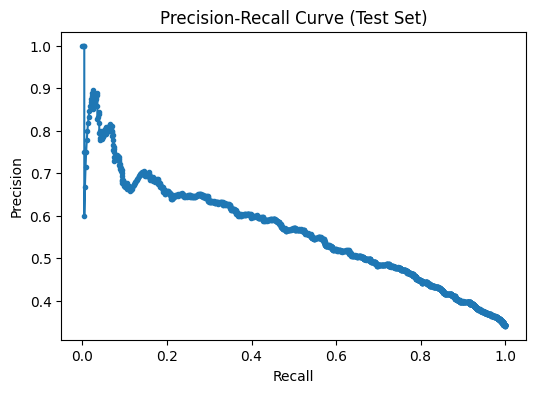

Metrics for Set11 at test size 0.63: {'accuracy': 0.7010568696527428, 'auc_pr': 0.5649027067071888, 'auc_roc': 0.7174930310016203}

Running Set11 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

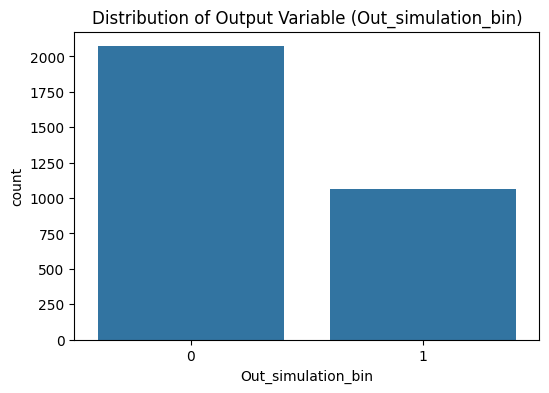


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    1
3       0
74      0
1755    0


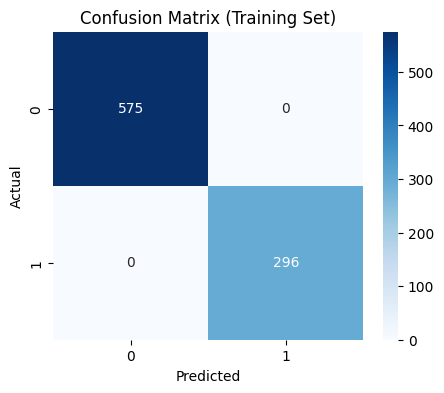

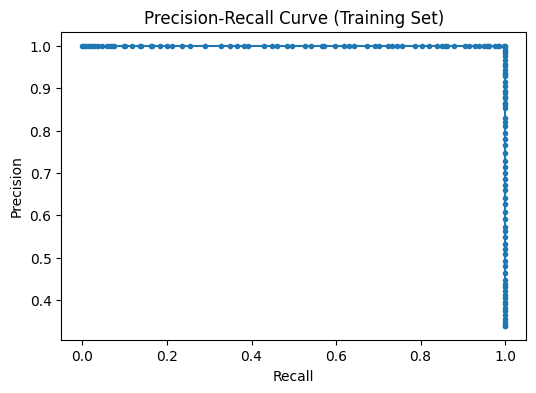


📊 Test Set Metrics:
Accuracy: 0.685
AUC-ROC: 0.698
AUC-PR: 0.544


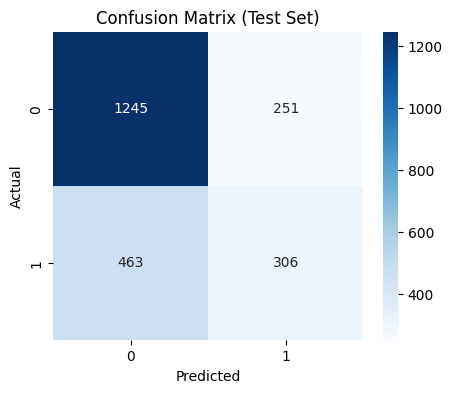

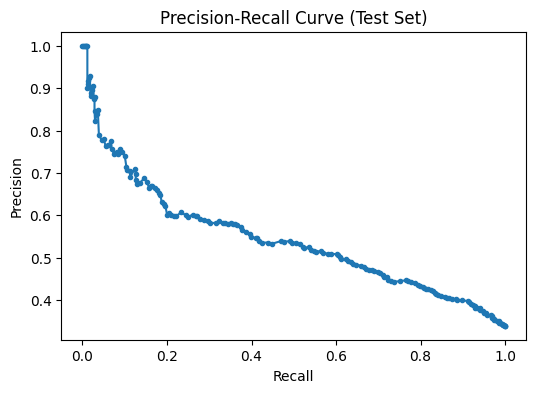

Metrics for Set11 at test size 0.72: {'accuracy': 0.6847682119205298, 'auc_pr': 0.5437416752225398, 'auc_roc': 0.6980143842618025}

Running Set11 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

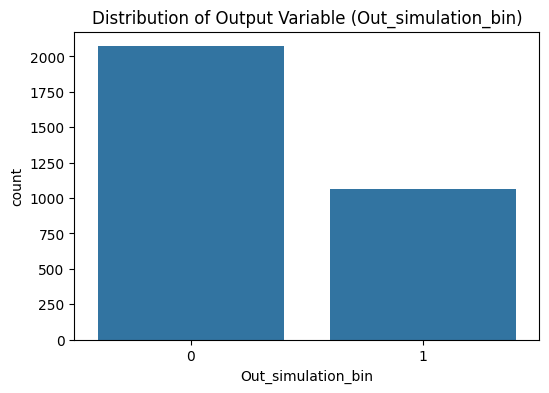


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    1
1324    1
216     0
510     1


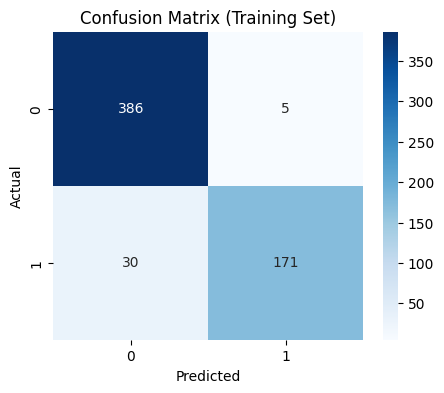

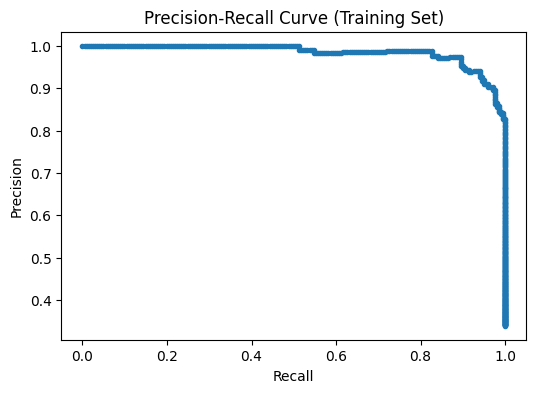


📊 Test Set Metrics:
Accuracy: 0.689
AUC-ROC: 0.662
AUC-PR: 0.500


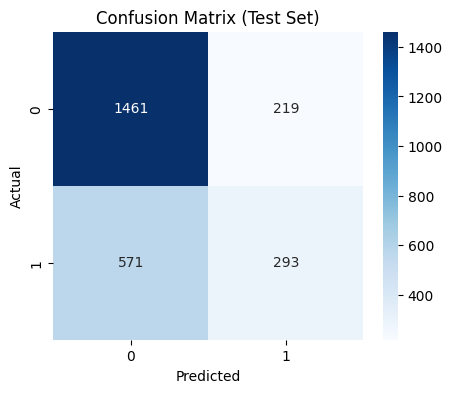

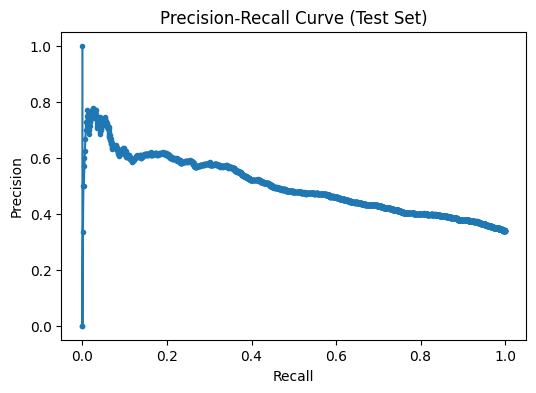

Metrics for Set11 at test size 0.81: {'accuracy': 0.6894654088050315, 'auc_pr': 0.5003984024484496, 'auc_roc': 0.6621948026895943}

Running Set11 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

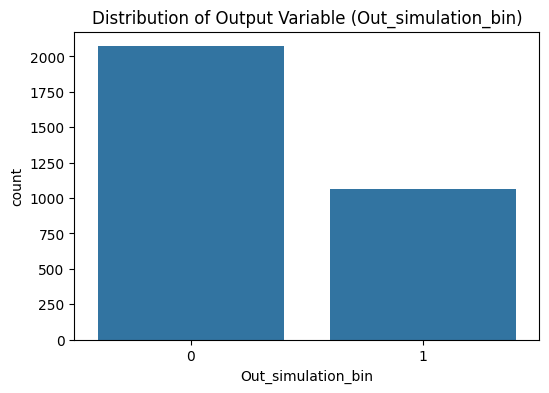


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   0

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   0
Splitting data for Set11 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    0
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     1
2907    1
1218    0


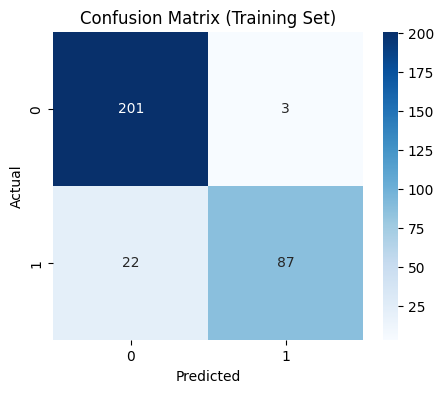

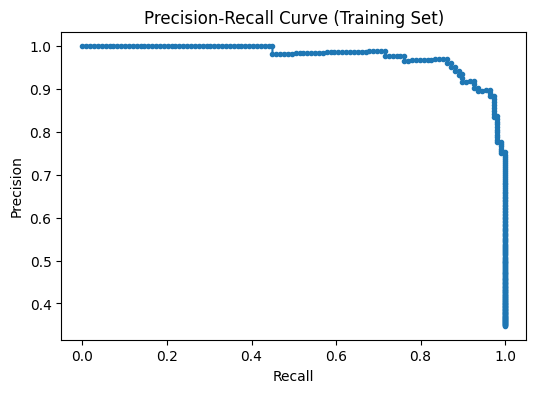


📊 Test Set Metrics:
Accuracy: 0.650
AUC-ROC: 0.615
AUC-PR: 0.449


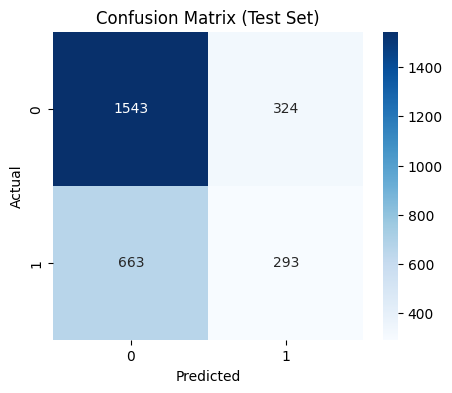

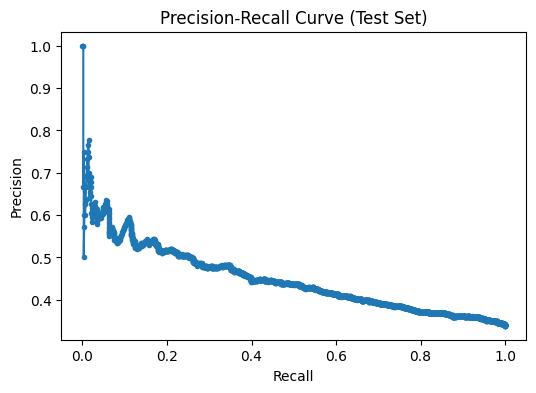

Metrics for Set11 at test size 0.90: {'accuracy': 0.6503719447396387, 'auc_pr': 0.44869310337097806, 'auc_roc': 0.6150560382597549}

Running Set12 for classification with test size 0.10!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1   

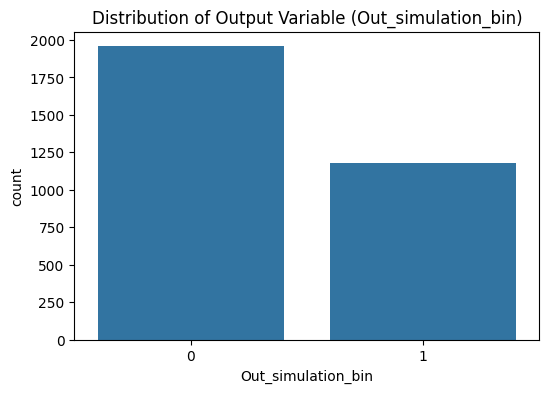


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.10

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2822
Test set size: 314

Training Set (imbalanced):
      R1  R2  R3  R4
2585   6   4   9  11
2955   7   3  14   9
2396   6   0  14  10
2555   6   3  13   8
2351   5   7  15  14
2585    1
2955    0
2396    1
2555    1


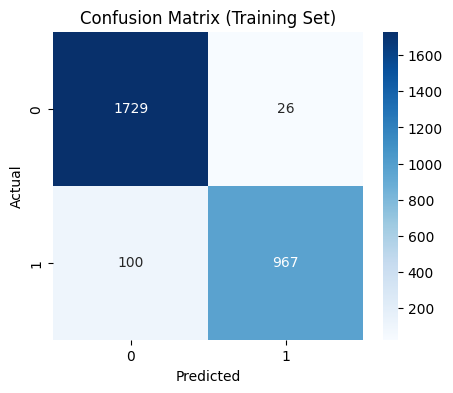

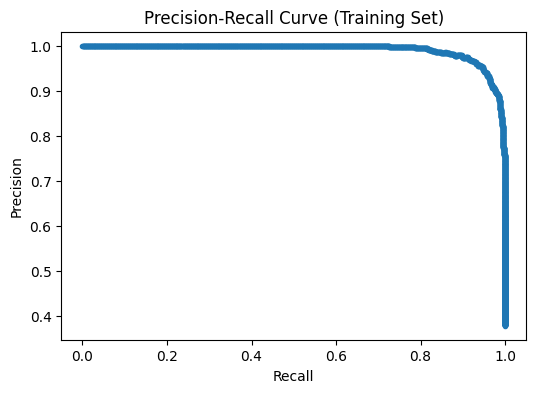


📊 Test Set Metrics:
Accuracy: 0.780
AUC-ROC: 0.856
AUC-PR: 0.781


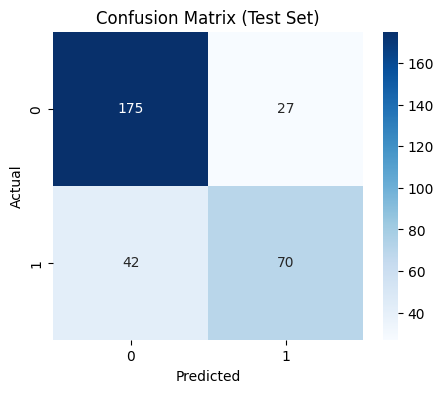

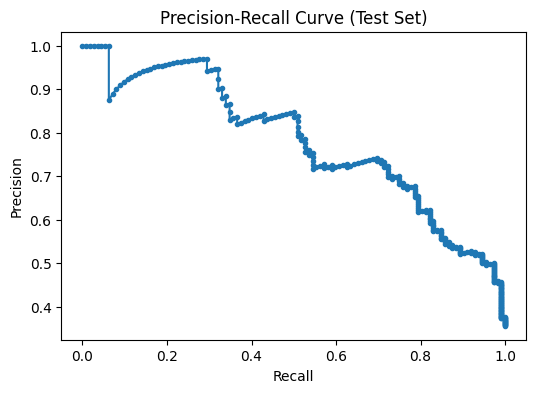

Metrics for Set12 at test size 0.10: {'accuracy': 0.7802547770700637, 'auc_pr': 0.7805112471280719, 'auc_roc': 0.8564356435643564}

Running Set12 for classification with test size 0.19!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

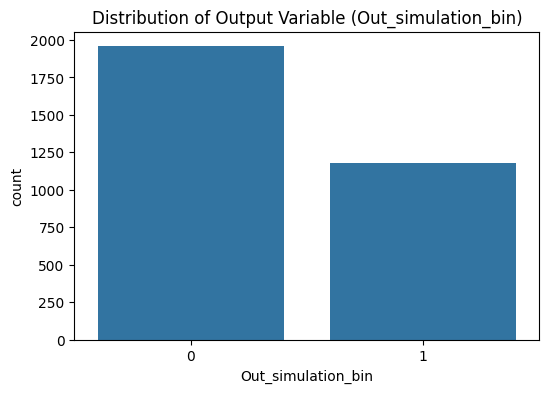


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.19

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2543
Test set size: 593

Training Set (imbalanced):
      R1  R2  R3  R4
29     0   1  12   9
2619   6   4  14   9
22     0   1  11   9
1161   2   7  13  15
1745   4   3   9  11
29      0
2619    1
22      0
1161    1


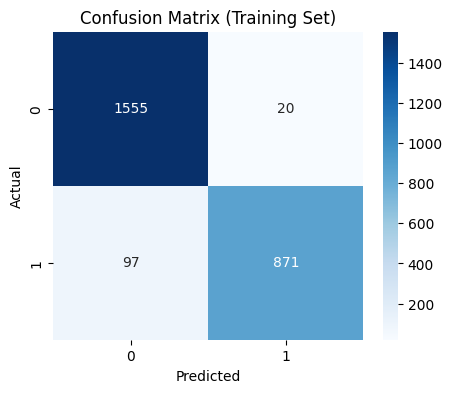

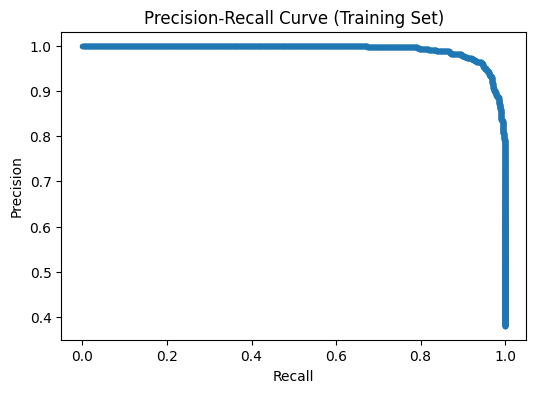


📊 Test Set Metrics:
Accuracy: 0.740
AUC-ROC: 0.807
AUC-PR: 0.696


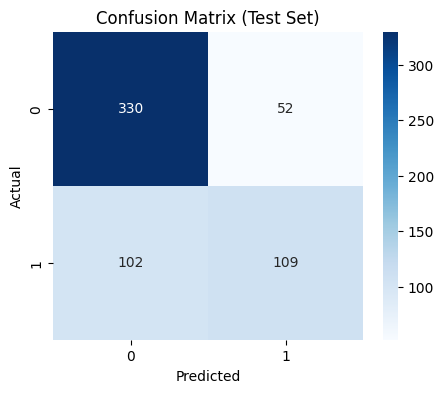

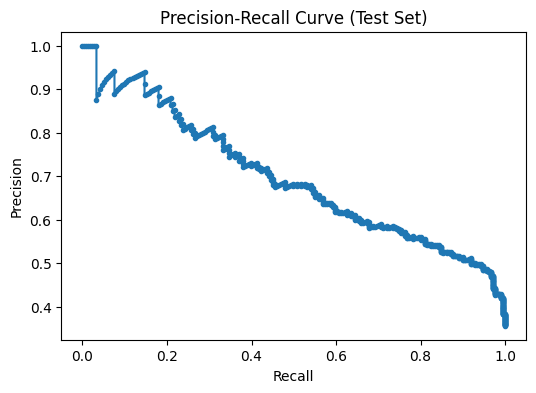

Metrics for Set12 at test size 0.19: {'accuracy': 0.7403035413153457, 'auc_pr': 0.6961476174736702, 'auc_roc': 0.8071511873154512}

Running Set12 for classification with test size 0.28!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

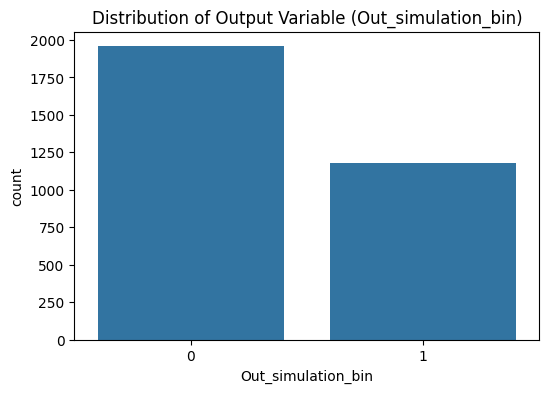


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.28

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 2264
Test set size: 872

Training Set (imbalanced):
      R1  R2  R3  R4
1114   2   6  15   9
109    0   2  15  12
2057   5   1  13  15
781    1   7  15  12
2154   5   3  11  14
1114    0
109     1
2057    0
781     0


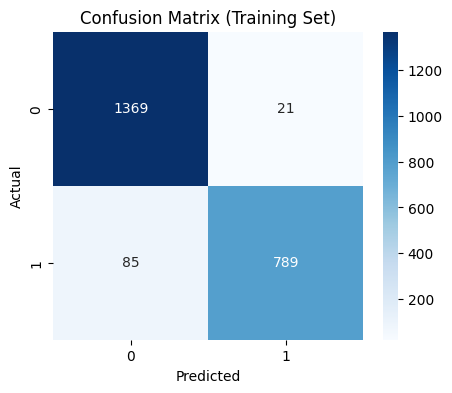

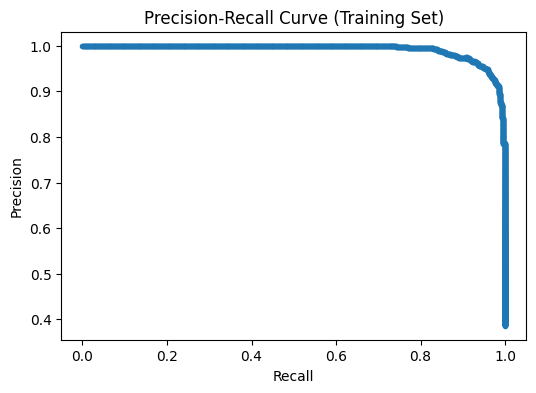


📊 Test Set Metrics:
Accuracy: 0.729
AUC-ROC: 0.789
AUC-PR: 0.659


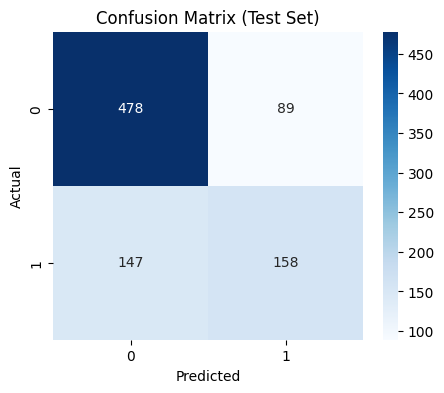

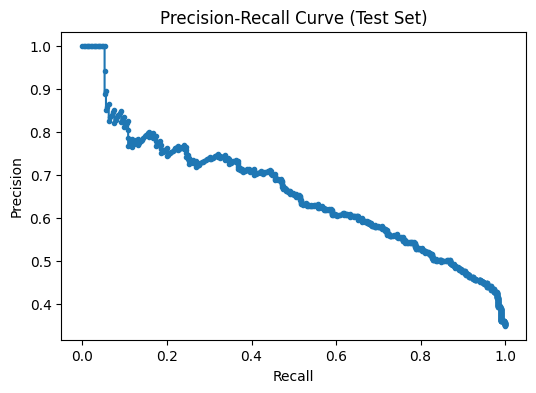

Metrics for Set12 at test size 0.28: {'accuracy': 0.7293577981651376, 'auc_pr': 0.6590968902447079, 'auc_roc': 0.7889727354208228}

Running Set12 for classification with test size 0.37!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

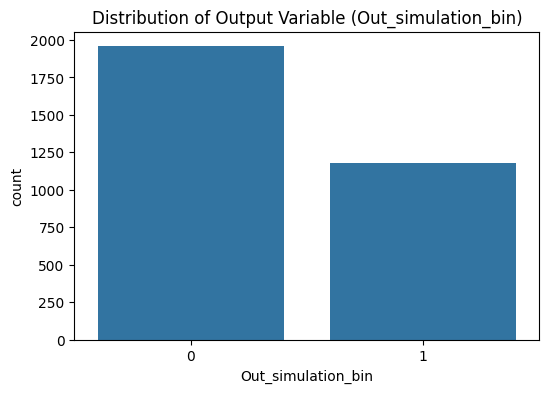


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.37

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1986
Test set size: 1150

Training Set (imbalanced):
      R1  R2  R3  R4
916    2   3  10  15
1953   4   7  15   8
1811   4   5  10  14
1099   2   6  13   8
1088   2   6  11  12
916     0
1953    0
1811    0
1099    1

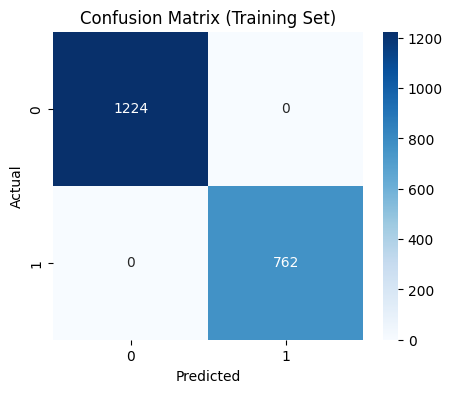

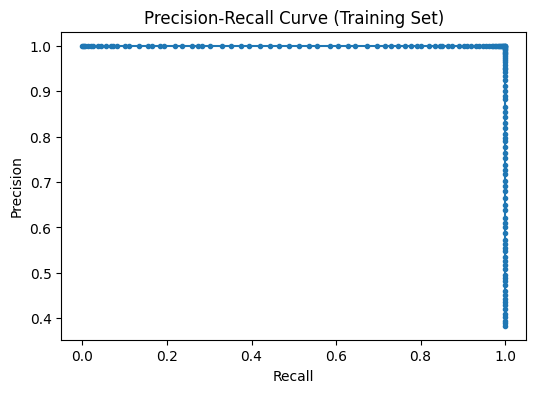


📊 Test Set Metrics:
Accuracy: 0.717
AUC-ROC: 0.791
AUC-PR: 0.667


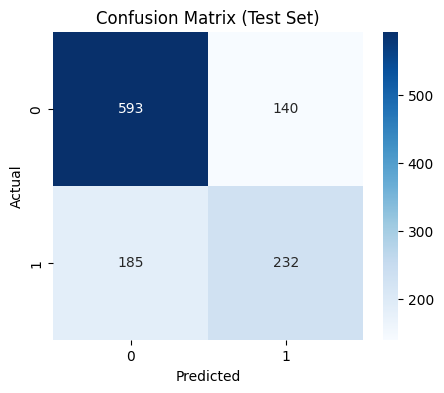

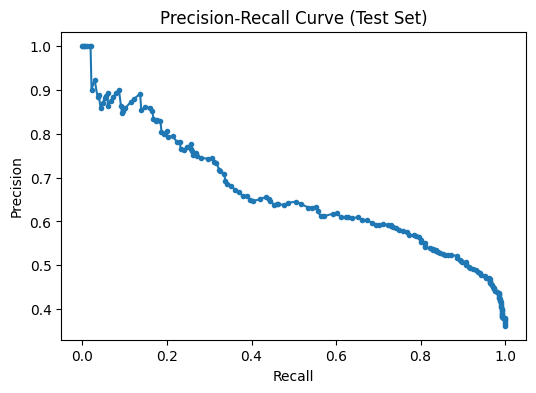

Metrics for Set12 at test size 0.37: {'accuracy': 0.717391304347826, 'auc_pr': 0.6666596981295744, 'auc_roc': 0.7906733276407523}

Running Set12 for classification with test size 0.46!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

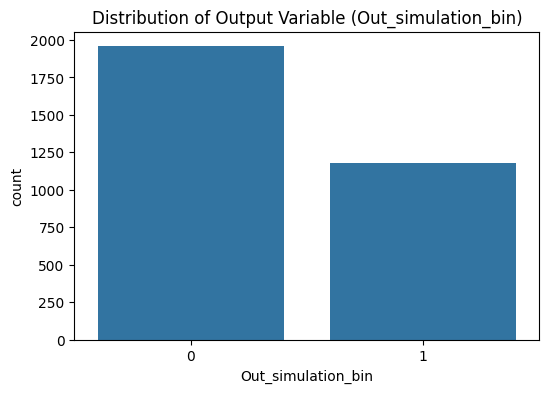


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.46

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1707
Test set size: 1429

Training Set (imbalanced):
      R1  R2  R3  R4
3114   7   6  12  15
2867   7   2   9  13
2979   7   4   9  13
1259   3   1  11  15
1784   4   3  14  15
3114    0
2867    0
2979    1
1259    1

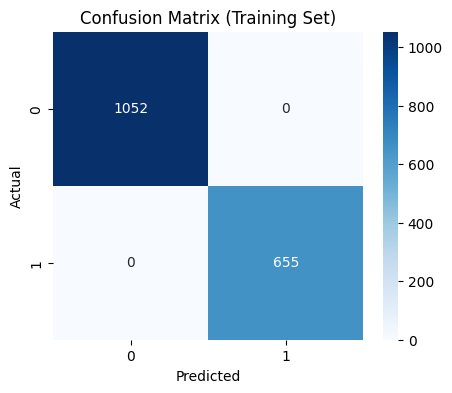

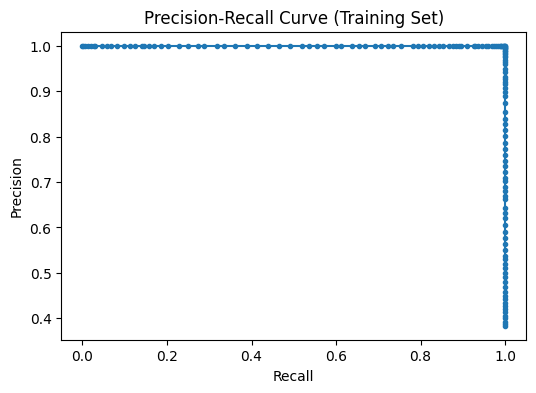


📊 Test Set Metrics:
Accuracy: 0.696
AUC-ROC: 0.763
AUC-PR: 0.632


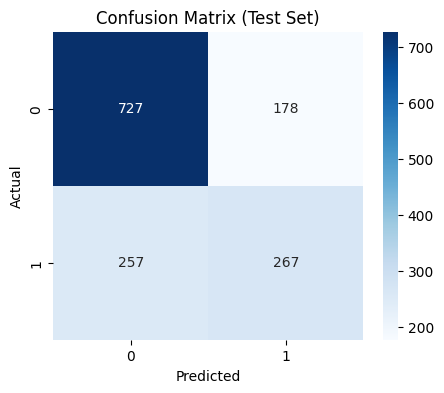

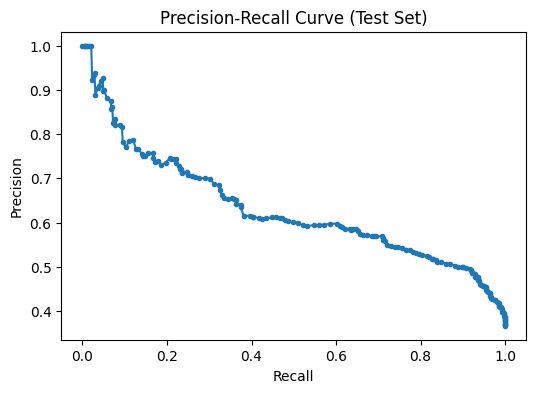

Metrics for Set12 at test size 0.46: {'accuracy': 0.695591322603219, 'auc_pr': 0.631606099674404, 'auc_roc': 0.7633661591666316}

Running Set12 for classification with test size 0.54!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1      

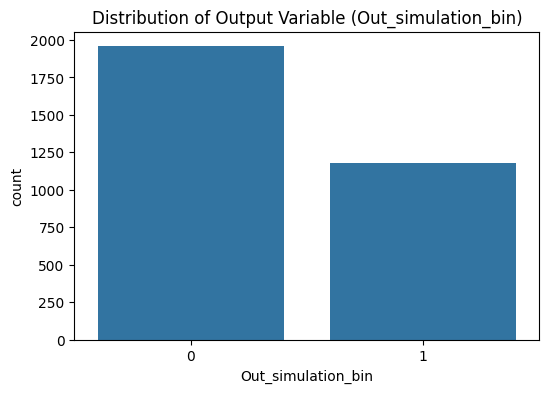


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.54

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1428
Test set size: 1708

Training Set (imbalanced):
      R1  R2  R3  R4
584    1   4  11  12
948    2   3  15  11
704    1   6  12  13
431    1   0  13  12
1688   4   2   9  10
584     1
948     0
704     0
431     1

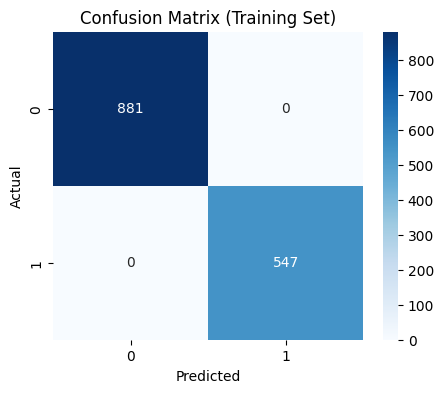

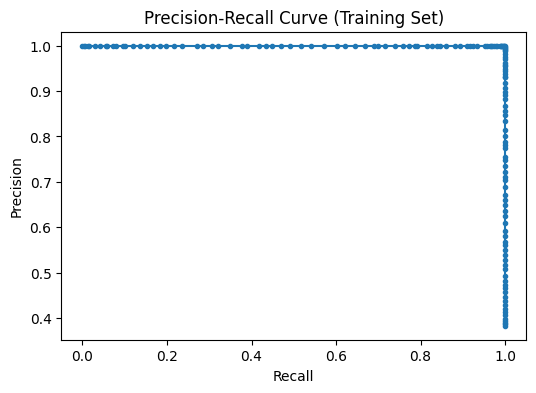


📊 Test Set Metrics:
Accuracy: 0.687
AUC-ROC: 0.741
AUC-PR: 0.620


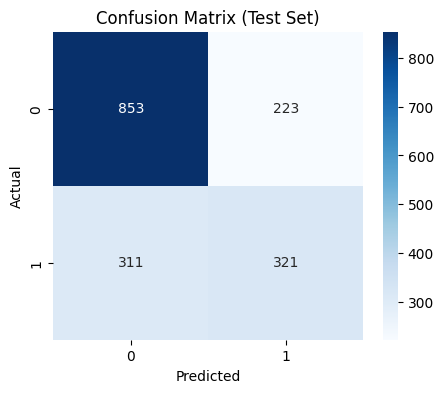

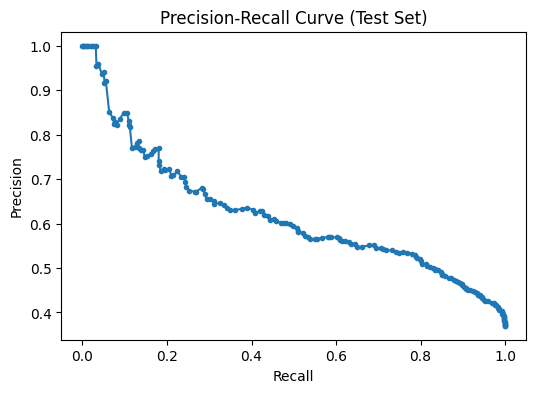

Metrics for Set12 at test size 0.54: {'accuracy': 0.6873536299765808, 'auc_pr': 0.6202380702577486, 'auc_roc': 0.7411577690461626}

Running Set12 for classification with test size 0.63!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

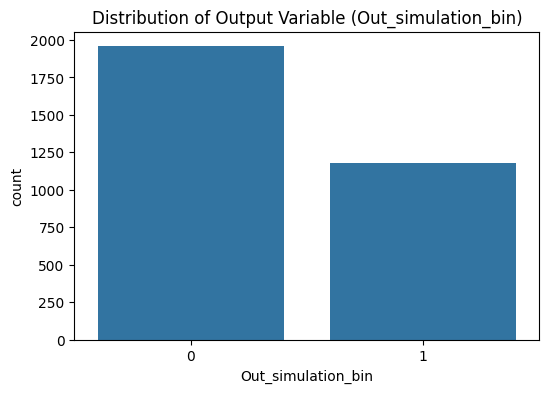


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.63

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 1149
Test set size: 1987

Training Set (imbalanced):
      R1  R2  R3  R4
631    1   5  10   9
1181   3   0   8  14
2310   5   7  10   8
592    1   4  12  13
1303   3   2  10   9
631     0
1181    0
2310    1
592     0

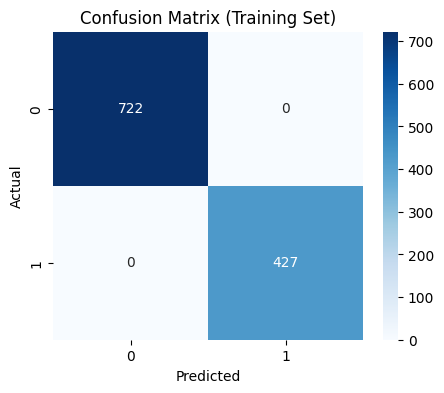

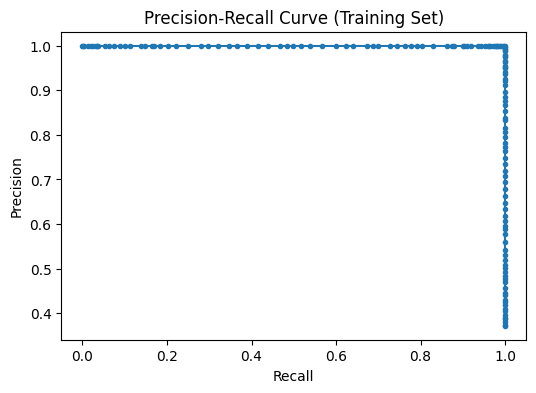


📊 Test Set Metrics:
Accuracy: 0.689
AUC-ROC: 0.742
AUC-PR: 0.627


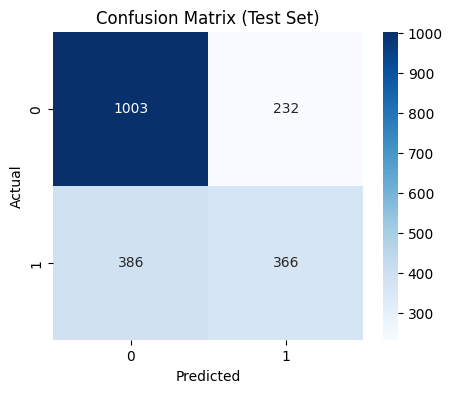

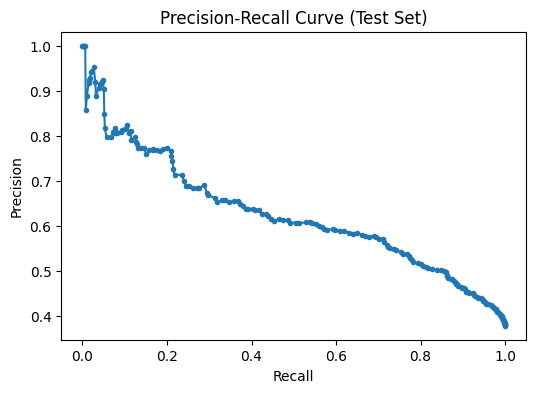

Metrics for Set12 at test size 0.63: {'accuracy': 0.688978359335682, 'auc_pr': 0.6274221561200477, 'auc_roc': 0.7422307046257214}

Running Set12 for classification with test size 0.72!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

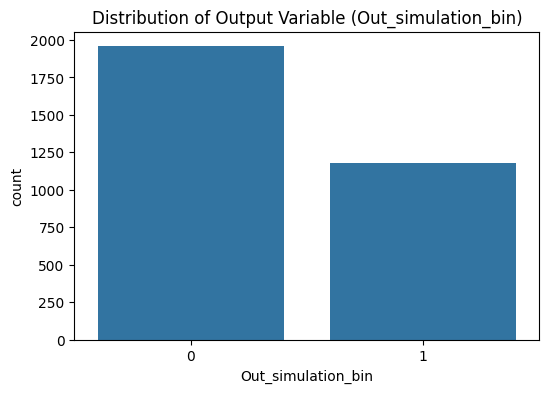


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.72

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 871
Test set size: 2265

Training Set (imbalanced):
      R1  R2  R3  R4
1870   4   6  11   9
3      0   1   8  12
74     0   2  10  13
1755   4   3  10  14
467    1   2  10  14
1870    0
3       0
74      0
1755    1


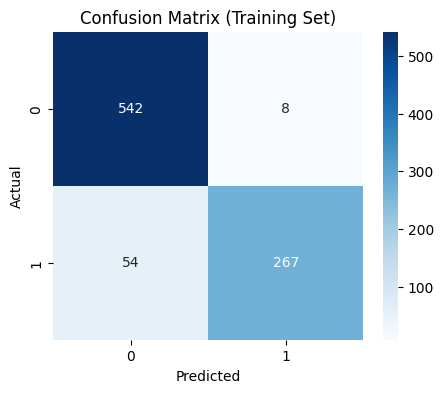

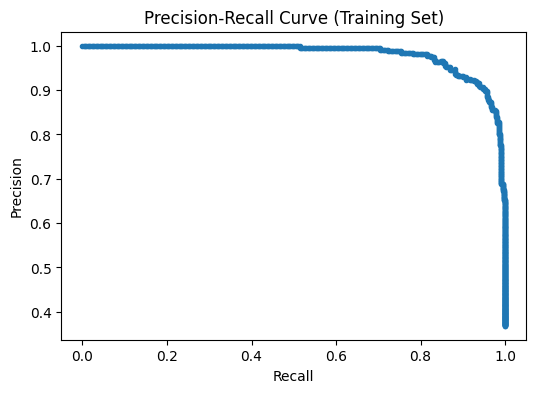


📊 Test Set Metrics:
Accuracy: 0.661
AUC-ROC: 0.697
AUC-PR: 0.558


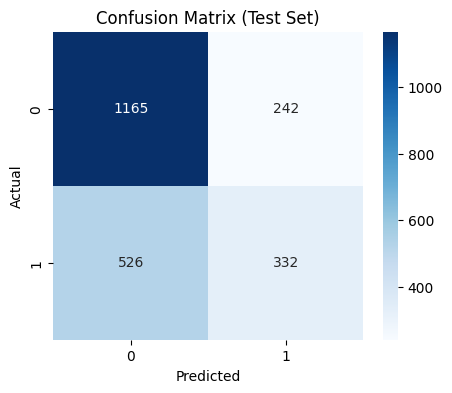

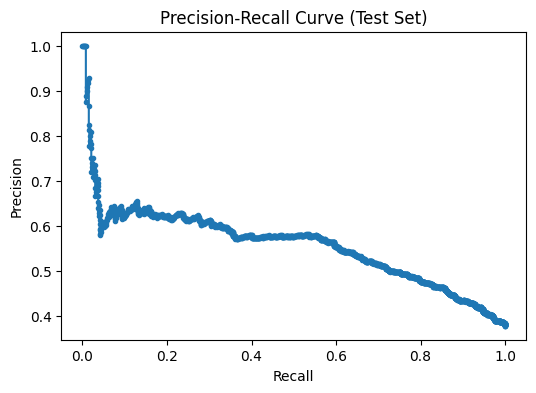

Metrics for Set12 at test size 0.72: {'accuracy': 0.6609271523178808, 'auc_pr': 0.5580908224145144, 'auc_roc': 0.6968731931418499}

Running Set12 for classification with test size 0.81!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1    

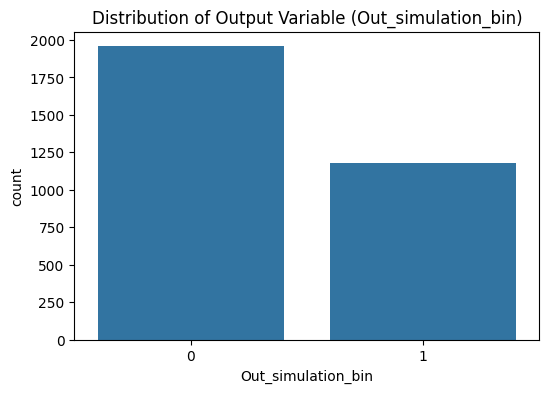


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.81

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 592
Test set size: 2544

Training Set (imbalanced):
      R1  R2  R3  R4
1155   2   7  13   8
1324   3   2  13   9
216    0   4  14  15
510    1   3   8  15
1680   4   2   8   9
1155    0
1324    1
216     0
510     0


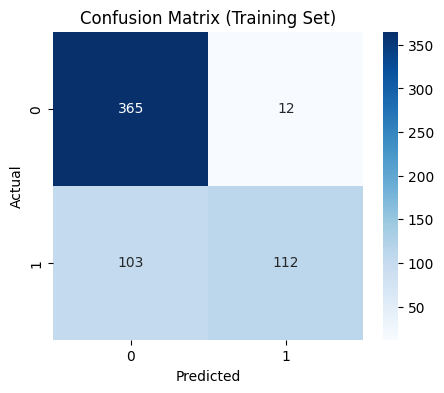

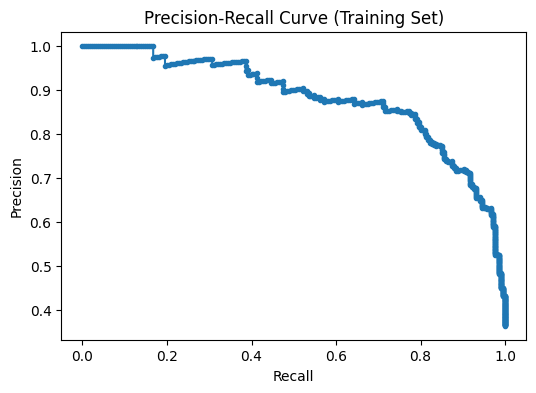


📊 Test Set Metrics:
Accuracy: 0.640
AUC-ROC: 0.654
AUC-PR: 0.523


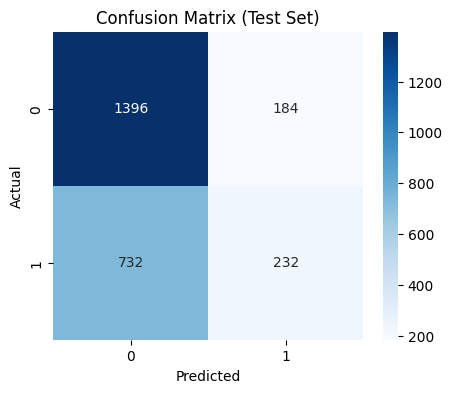

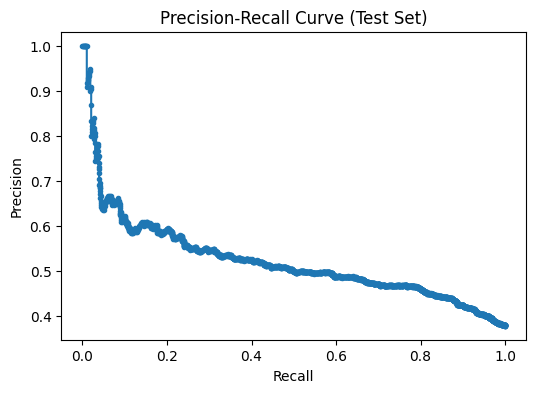

Metrics for Set12 at test size 0.81: {'accuracy': 0.639937106918239, 'auc_pr': 0.5231701532652833, 'auc_roc': 0.6541927097011399}

Running Set12 for classification with test size 0.90!
Dataset Head:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Basic Information about the Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   R1                  3136 non-null   int64 
 1   R2                  3136 non-null   int64 
 2   R3                  3136 non-null   object
 3   R4                  3136 non-null   object
 4   Out_simulation_bin  3136 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 122.6+ KB
None

Descriptive Statistics:
                R1     

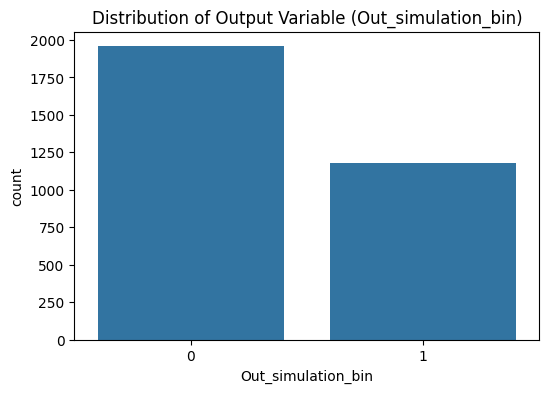


Dataset Head before conversion:
   R1  R2 R3 R4  Out_simulation_bin
0   0   1  8  9                   0
1   0   1  8  A                   0
2   0   1  8  B                   0
3   0   1  8  C                   0
4   0   1  8  D                   1

Dataset Head after conversion:
   R1  R2  R3  R4  Out_simulation_bin
0   0   1   8   9                   0
1   0   1   8  10                   0
2   0   1   8  11                   0
3   0   1   8  12                   0
4   0   1   8  13                   1
Splitting data for Set12 at test size 0.90

Features (X):
   R1  R2  R3  R4
0   0   1   8   9
1   0   1   8  10
2   0   1   8  11
3   0   1   8  12
4   0   1   8  13

Target (y):
0    0
1    0
2    0
3    0
4    1
Name: Out_simulation_bin, dtype: int64

Training set size: 313
Test set size: 2823

Training Set (imbalanced):
      R1  R2  R3  R4
2735   6   7  14  13
639    1   5  11  10
2907   7   2  15  10
1218   3   0  14   8
1158   2   7  13  11
2735    0
639     0
2907    0
1218    1


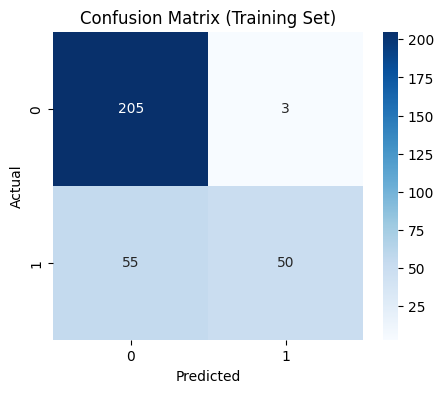

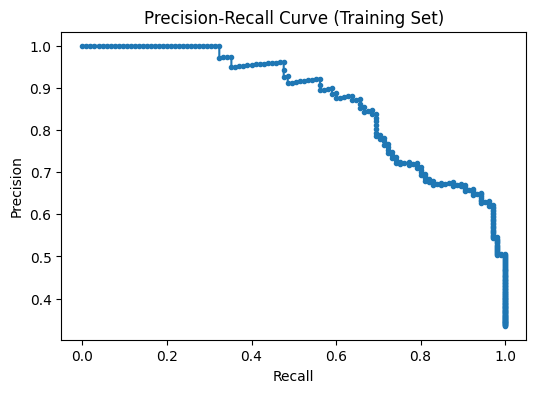


📊 Test Set Metrics:
Accuracy: 0.624
AUC-ROC: 0.594
AUC-PR: 0.461


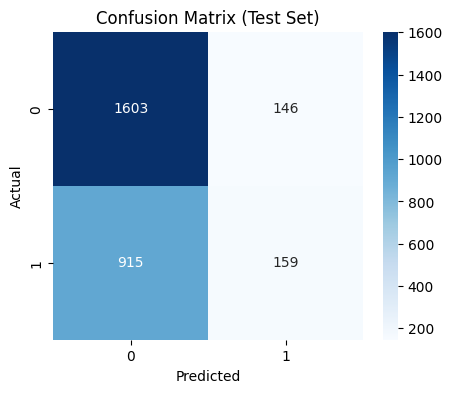

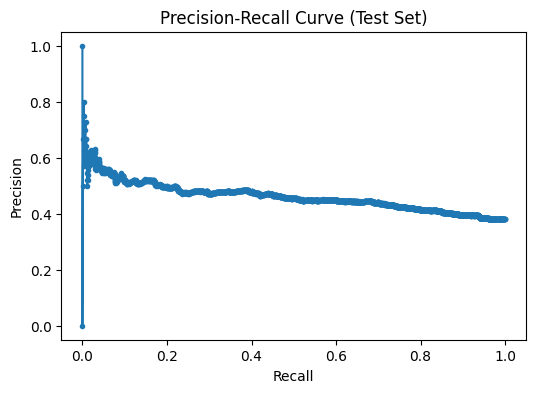

Metrics for Set12 at test size 0.90: {'accuracy': 0.6241586964222459, 'auc_pr': 0.4611668333802158, 'auc_roc': 0.5942970337931864}

Final AUC-ROC DataFrame:
       0.100000  0.188889  0.277778  0.366667  0.455556  0.544444  0.633333  \
Set1    0.71989  0.727875  0.737058  0.748369  0.696482  0.689392  0.672225   
Set2   0.800427  0.750629  0.741122  0.730813  0.702493  0.663807  0.668364   
Set3   0.822452   0.83504  0.810329  0.792159  0.777159   0.74752  0.720483   
Set4   0.935504  0.917904  0.894851  0.876065  0.856818  0.837755  0.792945   
Set5    0.84084  0.786161  0.784896  0.774664  0.756994  0.740054  0.705063   
Set6   0.757012  0.754231  0.729534   0.69749  0.688076  0.673652  0.633485   
Set7    0.80728   0.81938  0.804902  0.757101  0.762546  0.732559  0.697088   
Set8   0.805667  0.830352  0.812955  0.793366  0.757549  0.745153  0.708573   
Set9   0.740658  0.747321  0.722645  0.683923  0.685908  0.649376  0.613866   
Set10  0.829796   0.83233  0.817001  0.807825  0.8124

In [29]:
# @title Main program for training

# Example usage
if __name__ == "__main__":
    # Initialize the DataProcessor class
    processor = DataProcessor()

    # Define test size values
    test_size_arr = np.linspace(0.1, 0.9, 10)  # 10 test sizes from 0.1 to 0.9

    # Define sheet names (assuming they are named "Set1", "Set2", ..., "Set12")
    sheet_names = [f"Set{i}" for i in range(1, 13)]  # 12 sheets

    # Initialize an empty DataFrame to store AUC-ROC scores
    auc_roc_df = pd.DataFrame(index=sheet_names, columns=test_size_arr)

    # File path
    file_path = r'ML_data_set_Statistical_Analysis_0V_0V.xlsx'  # Replace with actual file path

    # Loop through each sheet
    for sheet in sheet_names:
        for test_size in test_size_arr:
            print(f"\nRunning {sheet} for classification with test size {test_size:.2f}!")

            # Read data
            df_input = processor.read_data(file_path, sheet)

            # Explore data
            processor.explore_data()

            # Preprocess data
            df_processed = processor.preprocess_data()

            # Split the data
            print(f"Splitting data for {sheet} at test size {test_size:.2f}")
            X_train, X_test, y_train, y_test = processor.split_data(df_processed, test_size=test_size)

            print(f"Running classifier for {sheet} at test size {test_size:.2f}")
            # Initialize classifier with hyperparameter tuning
            classifier = BinaryClassifierHytune(model_name='random_forest', tune_hyperparameters=True,
                                                X_train=X_train, y_train=y_train)

            # Train the model
            classifier.train(X_train, y_train)

            # Evaluate on training data
            classifier.evaluate(X_train, y_train, dataset_type='Training')

            # Evaluate on test data
            classifier.evaluate(X_test, y_test, dataset_type='Test')

            # Retrieve metrics
            metrics = classifier.get_metrics()

            # Store the AUC-ROC score in the DataFrame
            auc_roc_df.loc[sheet, test_size] = metrics['auc_roc']

            print(f"Metrics for {sheet} at test size {test_size:.2f}: {metrics}")

    # Display the final DataFrame
    print("\nFinal AUC-ROC DataFrame:")
    print(auc_roc_df)



In [30]:
# @title saving the auc_roc in csv
auc_roc_df.columns = 1 - test_size_arr
auc_roc_df
# Save DataFrame to CSV
auc_roc_df.to_csv("auc_roc_results.csv")

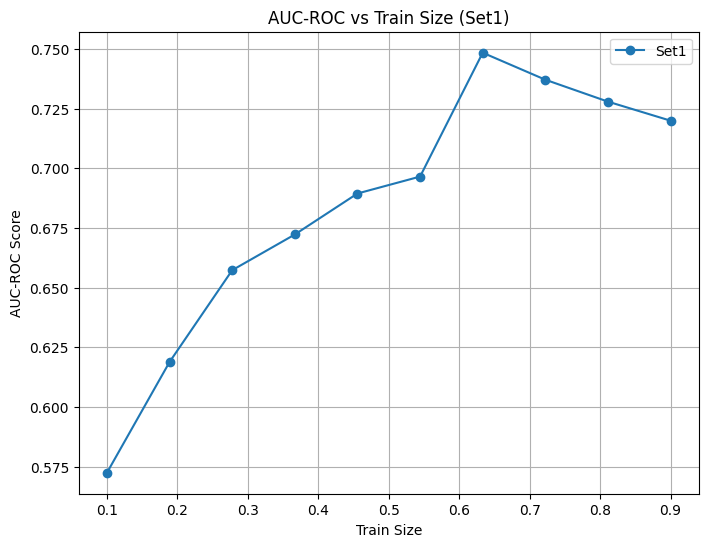

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

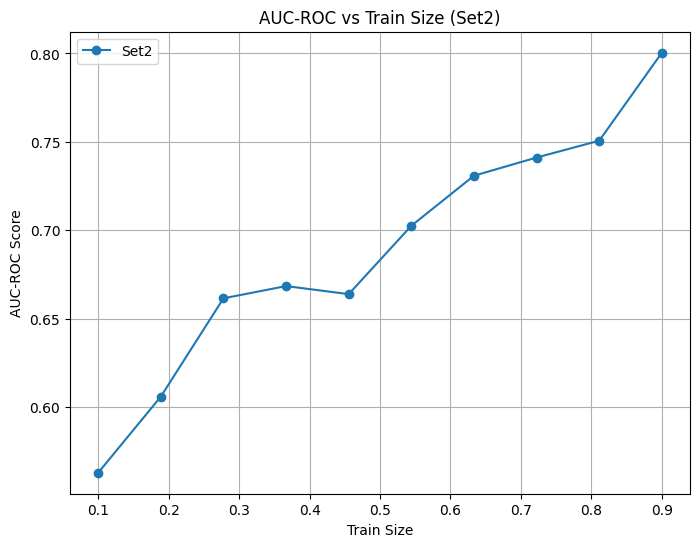

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

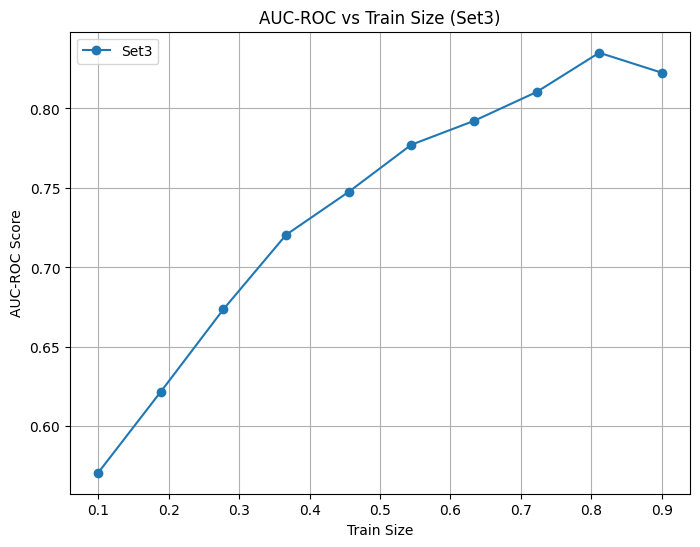

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

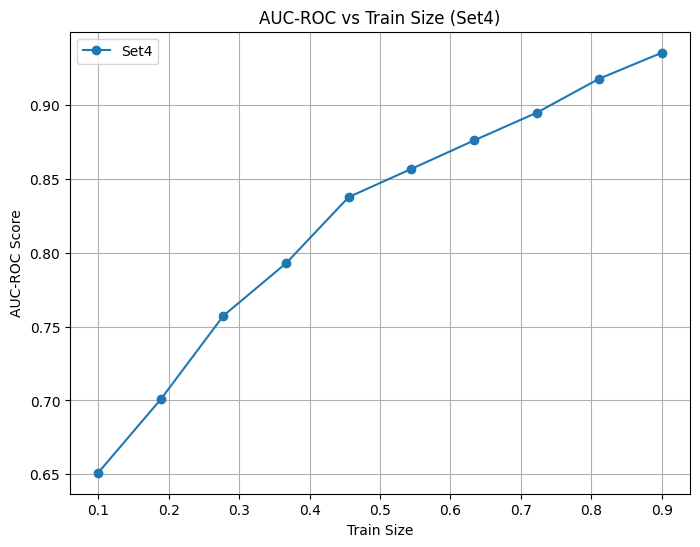

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

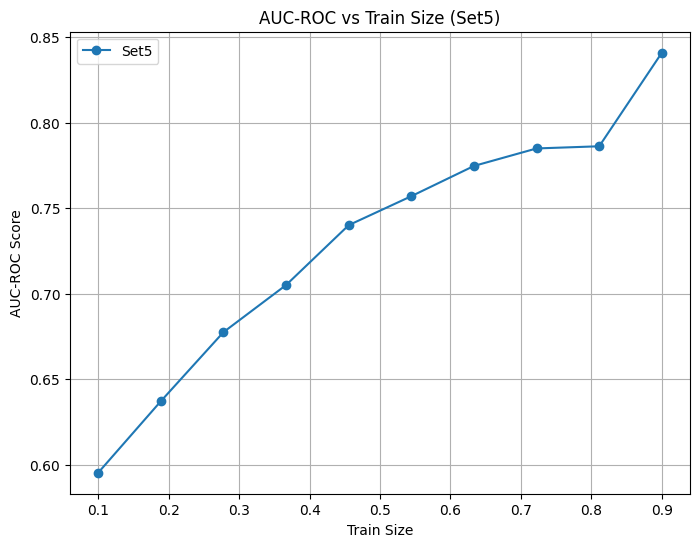

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

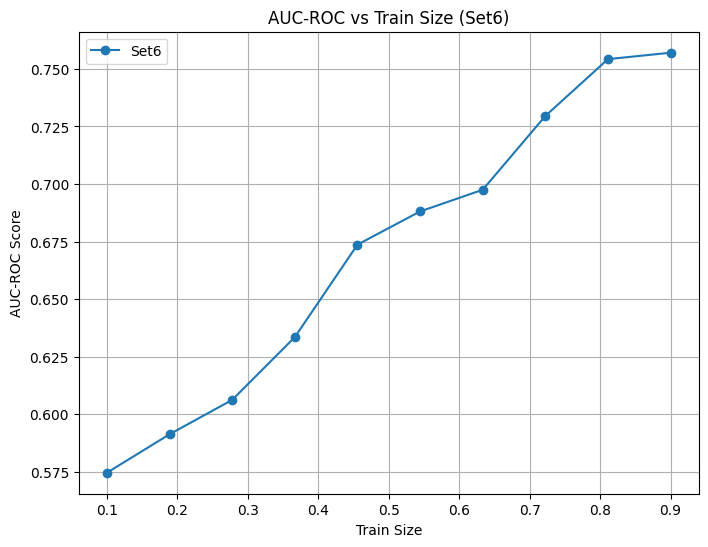

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

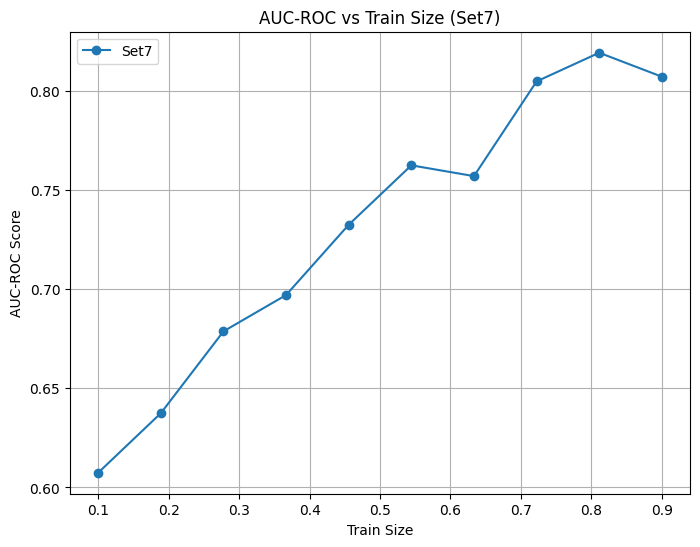

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

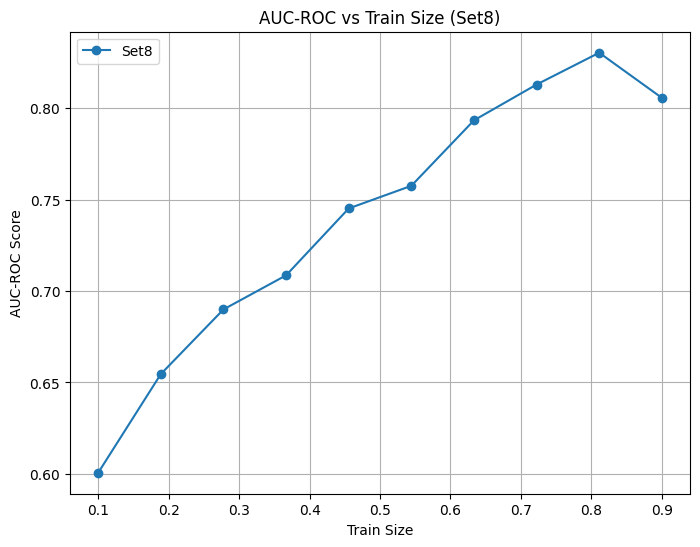

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

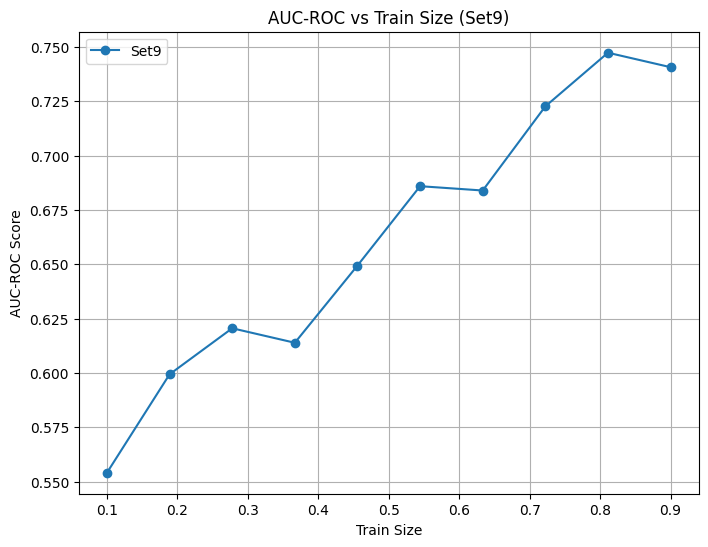

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

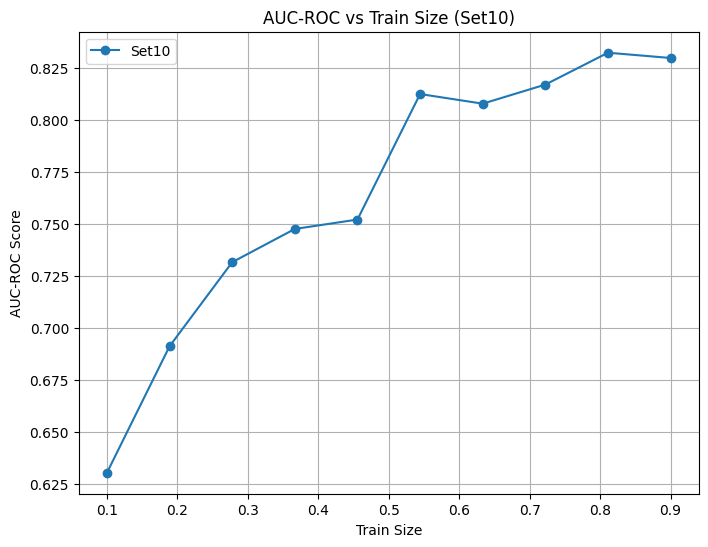

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

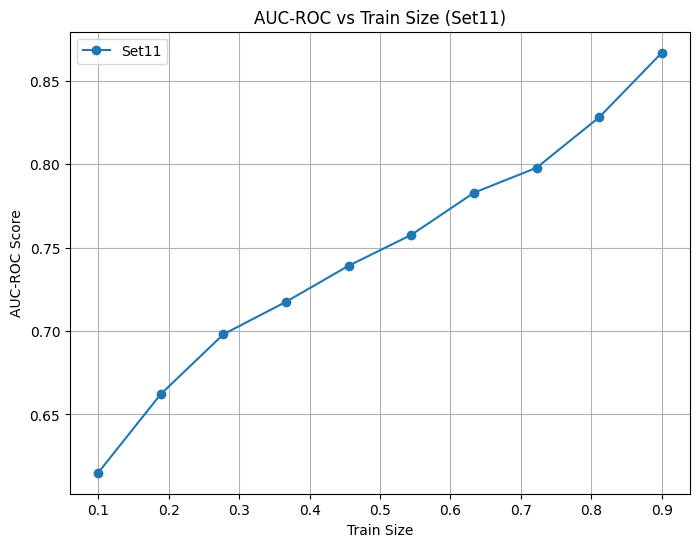

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

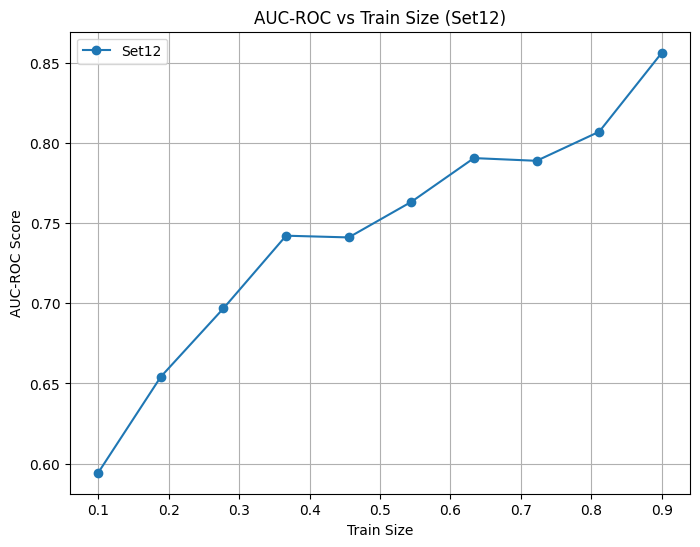

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

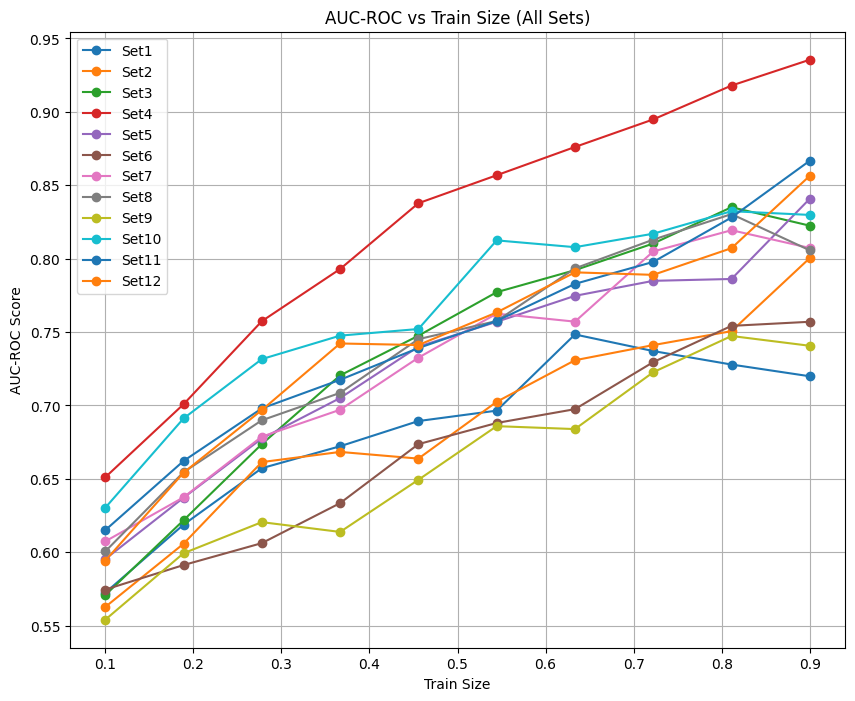

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
# @title plotting the accuracy score vs train size for each set
# Initialize the plotter
plotter = AUCPlotter(auc_roc_df)

# Plot, display, save, and download individual plots
plotter.plot_individual_sets()

# Plot, display, save, and download the combined plot
plotter.plot_combined()
